In [22]:
%matplotlib inline

In [23]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [24]:
import glob
import h5py

In [25]:
import os
import sys
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler, random_split

# sklearn functions
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import train_test_split, KFold, GroupShuffleSplit

# load functions from nitorch
sys.path.insert(0,"/analysis/fabiane/phd/nitorch/")
from nitorch.data import load_nifti
from nitorch.transforms import  ToTensor, SagittalTranslate, SagittalFlip, \
                                AxialTranslate, normalization_factors, Normalize, \
                                IntensityRescale
from nitorch.callbacks import EarlyStopping, ModelCheckpoint
from nitorch.trainer import Trainer
from nitorch.initialization import weights_init
from nitorch.metrics import balanced_accuracy, sensitivity, specificity
from nitorch.utils import count_parameters

from itertools import product

In [26]:
import random
#from models_ukb import ModelLiu
from hyperparameter_options import params_baseline as hyperparams

In [27]:
torch.__version__

'1.0.0'

In [28]:
gpu = 5
multi_gpus = None #[0, 1]
zero_one_normalize = False
dtype = np.float64

In [29]:
# load mask
mask = None

In [30]:
# path to be used for all data sets
train_data_path = "/ritter/share/data/ADNI_HDF5/Splits_Eitel/10xrandom_splits/train_AD_CN_2Yr15T_plus_UniqueScreening_quickprep_(96, 114, 96)_random_state"

In [31]:
to_tensor = ToTensor()

In [32]:
def draw_patch(img, patch_size, all_locs=False):
    """
    Draw a patch from the image based on the specified size. 
    By default draws randomly but setting all_locs = True
    returns all possible patches in a batch.
    
    Params:
        all_locs - set to True returns all patches
    """
    img_shape = img.shape
    patch_pot_locs = [[0, int(patch_size[dim]*0.5), patch_size[dim]] for dim in range(len(img_shape))]
    # check correct size
    for dim in range(len(img_shape)):
        assert(np.max(patch_pot_locs[dim]) + patch_size[dim] <= img_shape[dim])
        
    if all_locs:
        # return all locations
        patches = []
        #num_patches_per_dim = [reduce((lambda x, y: x*y), dim_list) for dim_list in patch_pot_locs]
        #num_patches_per_dim = [len(dim_list) for dim_list in patch_pot_locs]
        all_locs = list(product(*patch_pot_locs))
        for patch_locs in all_locs:
            patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
            patches.append(patch)
        return patches
    else:
        # return random location
        patch_locs = [random.choice(patch_pot_locs[dim]) for dim in range(len(img_shape))]
        #patch_locs = [patch_pot_locs[dim][1] for dim in range(len(img_shape))] ### Use the same patch each round
        patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
        return patch

class ADNIDataset(Dataset):
    def __init__(self, X, y, transform=None, target_transform=None, mask=None, dtype=np.float32, patched=False, all_locs=False):
        self.X = np.tile(np.copy(X), 5)
        self.y = np.tile(np.copy(y), 5)
        #print(self.X.shape)
        #self.X = np.copy(X)
        #self.y = np.copy(y)
        
        self.transform = transform
        self.target_transform = target_transform
        self.mask = mask
        self.dtype = dtype
        self.patched = patched
        self.all_locs = all_locs
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        image = self.X[idx]
        label = self.y[idx] >= 0.5
        label = torch.FloatTensor([label])
        
        if self.transform:
            image = self.transform(image)
        
        if self.patched:
            reshaped_img = image[8:85,10:105,5:85]
            patch_size = [s//k for s, k in zip(reshaped_img.shape, [2, 3, 2])]
            image = draw_patch(reshaped_img, patch_size, all_locs=self.all_locs)
        
        # normalize by max
        image /= np.max(image)
        
        image = to_tensor(image)
            
        sample = {"image" : image,
                 "label" : label}
        return sample


In [33]:
augmentations = [SagittalTranslate(dist=(3))]

# Define the classifier

In [34]:
class ModelLiu(nn.Module):
    """
    3D Patch-based model from the paper: Multi-Modality Cascaded
    Convolutional Neural Networks for Alzheimer’s Disease Diagnosis
    https://link.springer.com/article/10.1007/s12021-018-9370-4#Sec2
    
    Implementation inspired by:
    https://github.com/Tristacheng/mutimodality_cnn
    """
    def __init__(self):
        super(ModelLiu, self).__init__()
        self.drp_rate = [0.1, 0.4]
        self.drop_conv = nn.Dropout3d(p=self.drp_rate[0])
        self.drop_embed = nn.Dropout3d(p=self.drp_rate[1]/2)        

        self.Conv_1 = nn.Conv3d(1, 15, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        
        self.Conv_2 = nn.Conv3d(15, 25, kernel_size=3, stride=1, padding=(0, 1, 0))
        self.pool_2 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_3 = nn.Conv3d(25, 50, kernel_size=3, stride=1, padding=(1, 1, 0))
        self.pool_3 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_4 = nn.Conv3d(50, 50, kernel_size=3, stride=1, padding=0)



        self.classifier = nn.Sequential(
            nn.Linear(100, 40),
            nn.Tanh(),
            nn.Dropout3d(p=self.drp_rate[1]),
            nn.Linear(40, 1)
        )

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.tanh(self.Conv_1(x))
        h = self.drop_conv(self.pool_1(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_2(h))
        h = self.drop_conv(self.pool_2(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_3(h))
        h = self.drop_conv(self.pool_3(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_4(h))
        h = self.drop_embed(x)
        if print_size:
            print(h.shape)
        return h

    def forward(self, x):
        print_size = False
        x = self.encode(x, print_size=print_size)
        x = self.flatten(x)
        x = self.classifier(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [35]:
def pick_model(name):
    if name == "ModelA":
        net = ModelA()
    elif name == "ModelB":
        net = ModelB()
    elif name == "ModelAPIF":
        net = ModelAPIF()
    elif name == "ModelBPIF":
        net = ModelBPIF()
    elif name == "ModelLiu":
        net = ModelLiu()
    return net

def update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold_idx):
    outer_fold_best["final_acc"] = report["val_metrics"][retain_metric][-1]
    outer_fold_best["best_acc"] = np.max(report["val_metrics"][retain_metric][ignore_epochs:])
    outer_fold_best["final_iter"] = len(report["val_metrics"][retain_metric])
    outer_fold_best["best_iter"] = outer_fold_best["final_iter"] - np.argmax(np.flip(np.copy(report["val_metrics"][retain_metric])))
    outer_fold_best["params"] = selected_hyperparams
    outer_fold_best["inner_fold_idx"] = inner_fold_idx
    return outer_fold_best

# Training

In [15]:
def run(
    net,
    data,
    shape,
    callbacks=[],
    augmentations=[],
    masked=False,
    metrics=[],
    k_folds=None,
    b=None,
    num_epochs=35,
    retain_metric=None
):      
   
    fold_metric = []
    all_outer_bests = []
    best_metric = []
    models = []
    fold = 0
    initial_prepend = None
    
    random_states = np.arange(20, 30) # will be used again to split in testing phase
    
    for outer_fold, r in enumerate(random_states):
        print("###### Starting outer fold {}".format(outer_fold))

        # load data sets
        train_h5 = h5py.File(train_data_path + str(r) + ".h5", 'r')
        val_h5 = h5py.File(train_data_path.replace("train", "val") + str(r) + ".h5", 'r')
        
        X_train, y_train = np.array(train_h5['X']), np.array(train_h5['y'])
        X_val, y_val = val_h5['X'], val_h5['y']

        # dataset overview
        y = np.concatenate([np.array(y_train), np.array(y_val)])
        print("# of patients {}, # of healthy controls {}".format(np.sum(y), len(y)-np.sum(y)))

        print(len(y_train))
        print(len(y_val))
        
        if zero_one_normalize:
            intensity = IntensityRescale(data_min=np.min(X_train), data_max=np.max(X_train)) # use the same min and max for all datasets
            adni_data_train = ADNIDataset(X_train, y_train, transform=transforms.Compose(augmentations + [intensity]), mask=mask, dtype=dtype, patched=True)
            adni_data_val = ADNIDataset(X_val, y_val, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True)
        else:
            adni_data_train = ADNIDataset(X_train, y_train, transform=transforms.Compose(augmentations), mask=mask, dtype=dtype, patched=True)
            adni_data_val = ADNIDataset(X_val, y_val, transform=None, mask=mask, dtype=dtype, patched=True)
        
        train_h5.close()
        val_h5.close()
        
        outer_fold_best = {
            "final_acc" : 0,
            "best_acc" : 0,
            "final_iter" : 0,
            "best_iter" : 0,
            "params" : {},
            "inner_fold_idx" : 0
        }
        
        for inner_fold in range(5):
            print("###### Starting inner fold {}".format(inner_fold))
            # sample randomly from the hyperparameter options each inner fold
            #model_name = random.choice(hyperparams["model"])
            model_name = "ModelLiu"
            #b = random.choice(hyperparams["batch_size"])
            b = 128
            patience = random.choice(hyperparams["patience"]["small"])
            #lr = random.choice(hyperparams["lr"])
            lr = 1e-3

            selected_hyperparams = {
                "model" : model_name,
                "batch_size" : b,
                "patience" : patience,
                "lr" : lr
                }
            print(selected_hyperparams)
            
            #        # restart model
            del net
            net = ModelLiu().cuda(gpu)

            print("Trainable model parameters: {}".format(count_parameters(net)))
        
            callbacks = [EarlyStopping(patience=patience, ignore_before=ignore_epochs, retain_metric="loss", mode='min'),
                         ModelCheckpoint(path=output_dir,
                                         prepend="outer_{}_inner_{}".format(outer_fold, inner_fold),
                                         store_best=True,
                                         ignore_before=ignore_epochs,
                                         retain_metric=retain_metric)]
        
            # add current fold number to model checkpoint path
            if callbacks is not None:
                for idx, callback in enumerate(callbacks):
                    if isinstance(callback, ModelCheckpoint):
                        if initial_prepend is None:
                            initial_prepend = callbacks[idx].prepend
                        callbacks[idx].prepend = initial_prepend + "cv_fold_{}_".format(fold)
                        initial_prepend = None
            fold += 1

            # set optimizer
            wd = 5e-4 #0.008
            criterion = nn.BCEWithLogitsLoss().cuda(gpu)
            optimizer = optim.Adam(net.parameters(), lr=lr, weight_decay=wd)
            #optimizer = optim.Adadelta(net.parameters(), lr=lr, rho=0.95,weight_decay=wd)

            train_loader = DataLoader(
                adni_data_train, batch_size=b, shuffle=True, num_workers=4
            )

            val_loader = DataLoader(
                adni_data_val, batch_size=2, shuffle=True, num_workers=2
            )

            trainer = Trainer(
                net,
                criterion,
                optimizer,
                metrics=metrics,
                callbacks=callbacks,
                device=gpu
            )
            # train model and store results
            net, report = trainer.train_model(
                train_loader,
                val_loader,
                num_epochs=num_epochs,
                show_train_steps=2,
                show_validation_epochs=1,
            )
            # append validation score of the retain metric
            if isinstance(retain_metric, str):
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric][-10:])
                fold_metric.append(report["val_metrics"][retain_metric][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold)
            else:
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric.__name__][-10:])
                fold_metric.append(report["val_metrics"][retain_metric.__name__][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric.__name__][-1] > outer_fold_best["final_acc"]:
                if best_val > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric.__name__, selected_hyperparams, inner_fold)

            models.append(net)        
            print("Finished inner fold.")

            # visualize result
            trainer.visualize_training(report, metrics)
            trainer.evaluate_model(val_loader, gpu)
        print("Finished outer fold.")
        print(outer_fold_best)
        all_outer_bests.append(outer_fold_best)

    print("################################")
    print("################################")
    print("All accuracies: {}".format(fold_metric))
    print("Best accuracies mean: {} All :{}".format(np.mean(best_metric), best_metric))
    print(all_outer_bests)
    return fold_metric, models

In [44]:
num_epochs = 650
min_iters = 150
ignore_epochs = 150
normalize = False
retain_metric = balanced_accuracy
metrics = [accuracy_score, balanced_accuracy]

In [45]:
r = 1

In [46]:
output_dir = "/ritter/share/projects/Methods/Eitel_local_filter/experiments_submission/models/ADNI/full_set/10xrandom_splits/liu_patches/"

###### Starting outer fold 0
# of patients 410, # of healthy controls 396
699
107
(699, 96, 114, 96)
(107, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[0,     2] loss: 0.69339
[0,     4] loss: 0.69481
Time elapsed: 0h:0m:7s
train accuracy_score: 52.07 %
train balanced_accuracy: 50.58 %
val accuracy_score: 52.34 %
val balanced_accuracy: 48.59 %
Val loss: 0.692357
[1,     2] loss: 0.68977
[1,     4] loss: 0.71495
Time elapsed: 0h:0m:17s
train accuracy_score: 50.36 %
train balanced_accuracy: 51.47 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.701173
[2,     2] loss: 0.70347
[2,     4] loss: 0.69176
Time elapsed: 0h:0m:27s
train accuracy_score: 49.07 %
train balanced_accuracy: 47.97 %
val accuracy_score: 57.01 %
val balanced_accuracy: 53.69 %
Val loss: 0.688772
[3,     2] loss: 0.69775
[3,     4] loss: 0.70289
Time elapsed: 0h:0m:37s
train accuracy_score: 47.50 %
train balanced_accuracy: 46.98 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.695627
[4,     2] loss: 0.69959
[4,     4] loss: 0.69055
Time elapsed: 0h:0m:48s
train accuracy_score: 49.79 %
train balanced_accuracy: 49.76 %
val 

[38,     2] loss: 0.67828
[38,     4] loss: 0.67809
Time elapsed: 0h:6m:50s
train accuracy_score: 56.94 %
train balanced_accuracy: 56.16 %
val accuracy_score: 50.47 %
val balanced_accuracy: 46.87 %
Val loss: 0.683312
[39,     2] loss: 0.69654
[39,     4] loss: 0.67324
Time elapsed: 0h:7m:1s
train accuracy_score: 55.22 %
train balanced_accuracy: 55.34 %
val accuracy_score: 57.94 %
val balanced_accuracy: 61.05 %
Val loss: 0.692111
[40,     2] loss: 0.69370
[40,     4] loss: 0.67391
Time elapsed: 0h:7m:11s
train accuracy_score: 56.22 %
train balanced_accuracy: 55.54 %
val accuracy_score: 57.01 %
val balanced_accuracy: 56.39 %
Val loss: 0.689480
[41,     2] loss: 0.67782
[41,     4] loss: 0.67890
Time elapsed: 0h:7m:20s
train accuracy_score: 54.94 %
train balanced_accuracy: 55.00 %
val accuracy_score: 57.94 %
val balanced_accuracy: 60.73 %
Val loss: 0.684132
[42,     2] loss: 0.69017
[42,     4] loss: 0.67315
Time elapsed: 0h:7m:30s
train accuracy_score: 54.65 %
train balanced_accuracy: 54

[76,     2] loss: 0.68442
[76,     4] loss: 0.65373
Time elapsed: 0h:13m:34s
train accuracy_score: 58.80 %
train balanced_accuracy: 58.98 %
val accuracy_score: 54.21 %
val balanced_accuracy: 57.76 %
Val loss: 0.703268
[77,     2] loss: 0.65088
[77,     4] loss: 0.66328
Time elapsed: 0h:13m:45s
train accuracy_score: 59.37 %
train balanced_accuracy: 59.23 %
val accuracy_score: 71.96 %
val balanced_accuracy: 71.13 %
Val loss: 0.620082
[78,     2] loss: 0.63402
[78,     4] loss: 0.62515
Time elapsed: 0h:13m:56s
train accuracy_score: 65.52 %
train balanced_accuracy: 65.55 %
val accuracy_score: 61.68 %
val balanced_accuracy: 63.55 %
Val loss: 0.669980
[79,     2] loss: 0.65213
[79,     4] loss: 0.62061
Time elapsed: 0h:14m:6s
train accuracy_score: 63.66 %
train balanced_accuracy: 63.46 %
val accuracy_score: 65.42 %
val balanced_accuracy: 66.68 %
Val loss: 0.661844
[80,     2] loss: 0.62272
[80,     4] loss: 0.67018
Time elapsed: 0h:14m:16s
train accuracy_score: 60.94 %
train balanced_accurac

val accuracy_score: 70.09 %
val balanced_accuracy: 70.67 %
Val loss: 0.594385
[114,     2] loss: 0.61171
[114,     4] loss: 0.62132
Time elapsed: 0h:20m:16s
train accuracy_score: 64.38 %
train balanced_accuracy: 64.09 %
val accuracy_score: 67.29 %
val balanced_accuracy: 66.98 %
Val loss: 0.610778
[115,     2] loss: 0.62261
[115,     4] loss: 0.57991
Time elapsed: 0h:20m:27s
train accuracy_score: 64.52 %
train balanced_accuracy: 64.55 %
val accuracy_score: 66.36 %
val balanced_accuracy: 67.22 %
Val loss: 0.618209
[116,     2] loss: 0.61090
[116,     4] loss: 0.61250
Time elapsed: 0h:20m:37s
train accuracy_score: 65.81 %
train balanced_accuracy: 66.18 %
val accuracy_score: 71.96 %
val balanced_accuracy: 73.50 %
Val loss: 0.613734
[117,     2] loss: 0.61926
[117,     4] loss: 0.61358
Time elapsed: 0h:20m:48s
train accuracy_score: 64.38 %
train balanced_accuracy: 64.49 %
val accuracy_score: 63.55 %
val balanced_accuracy: 63.85 %
Val loss: 0.621398
[118,     2] loss: 0.61376
[118,     4] lo

[151,     2] loss: 0.58568
[151,     4] loss: 0.64633
Time elapsed: 0h:26m:54s
train accuracy_score: 67.10 %
train balanced_accuracy: 67.43 %
val accuracy_score: 72.90 %
val balanced_accuracy: 73.42 %
Val loss: 0.601084
[152,     2] loss: 0.59771
[152,     4] loss: 0.60590
Time elapsed: 0h:27m:5s
train accuracy_score: 65.81 %
train balanced_accuracy: 65.69 %
val accuracy_score: 70.09 %
val balanced_accuracy: 70.67 %
Val loss: 0.604273
[153,     2] loss: 0.59744
[153,     4] loss: 0.59858
Time elapsed: 0h:27m:16s
train accuracy_score: 65.81 %
train balanced_accuracy: 65.69 %
val accuracy_score: 68.22 %
val balanced_accuracy: 69.26 %
Val loss: 0.620068
[154,     2] loss: 0.58552
[154,     4] loss: 0.64219
Time elapsed: 0h:27m:27s
train accuracy_score: 65.95 %
train balanced_accuracy: 65.77 %
val accuracy_score: 71.03 %
val balanced_accuracy: 71.53 %
Val loss: 0.562497
[155,     2] loss: 0.56484
[155,     4] loss: 0.56528
Time elapsed: 0h:27m:38s
train accuracy_score: 70.82 %
train balanc

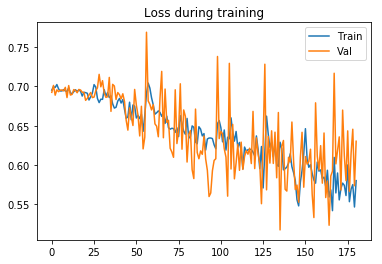

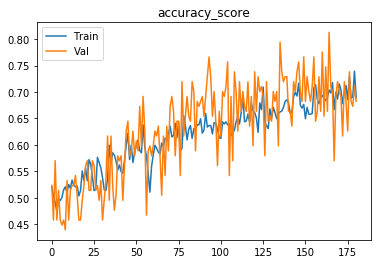

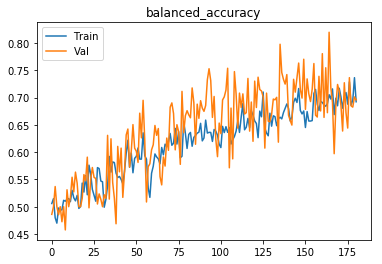

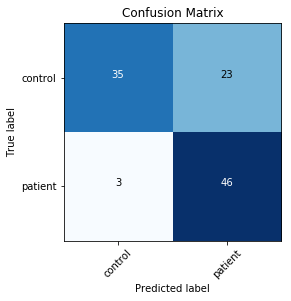

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69134
[0,     4] loss: 0.70279
Time elapsed: 0h:0m:7s
train accuracy_score: 51.07 %
train balanced_accuracy: 49.99 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.700048
[1,     2] loss: 0.69007
[1,     4] loss: 0.70006
Time elapsed: 0h:0m:17s
train accuracy_score: 51.36 %
train balanced_accuracy: 50.39 %
val accuracy_score: 51.40 %
val balanced_accuracy: 48.21 %
Val loss: 0.698874
[2,     2] loss: 0.69979
[2,     4] loss: 0.69638
Time elapsed: 0h:0m:27s
train accuracy_score: 51.50 %
train balanced_accuracy: 51.42 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.703905
[3,     2] loss: 0.70159
[3,     4] loss: 0.69257
Time elapsed: 0h:0m:37s
train accuracy_score: 49.50 %
train balanced_accuracy: 48.97 %
val accuracy_score: 51.40 %
val balanced_accuracy: 51.37 %
Val loss: 0.695064
[4,    

val accuracy_score: 57.94 %
val balanced_accuracy: 59.94 %
Val loss: 0.684335
[38,     2] loss: 0.64990
[38,     4] loss: 0.64892
Time elapsed: 0h:6m:43s
train accuracy_score: 63.38 %
train balanced_accuracy: 63.48 %
val accuracy_score: 62.62 %
val balanced_accuracy: 64.88 %
Val loss: 0.654756
[39,     2] loss: 0.68228
[39,     4] loss: 0.67060
Time elapsed: 0h:6m:53s
train accuracy_score: 58.94 %
train balanced_accuracy: 58.88 %
val accuracy_score: 70.09 %
val balanced_accuracy: 71.31 %
Val loss: 0.618683
[40,     2] loss: 0.67819
[40,     4] loss: 0.66009
Time elapsed: 0h:7m:3s
train accuracy_score: 59.94 %
train balanced_accuracy: 59.32 %
val accuracy_score: 71.03 %
val balanced_accuracy: 69.79 %
Val loss: 0.629789
[41,     2] loss: 0.66233
[41,     4] loss: 0.66158
Time elapsed: 0h:7m:14s
train accuracy_score: 59.66 %
train balanced_accuracy: 60.03 %
val accuracy_score: 48.60 %
val balanced_accuracy: 51.79 %
Val loss: 0.709964
[42,     2] loss: 0.66474
[42,     4] loss: 0.64806
Tim

val accuracy_score: 60.75 %
val balanced_accuracy: 63.32 %
Val loss: 0.684830
[76,     2] loss: 0.62991
[76,     4] loss: 0.62879
Time elapsed: 0h:13m:29s
train accuracy_score: 65.24 %
train balanced_accuracy: 65.03 %
val accuracy_score: 70.09 %
val balanced_accuracy: 70.04 %
Val loss: 0.586938
[77,     2] loss: 0.61490
[77,     4] loss: 0.63936
Time elapsed: 0h:13m:40s
train accuracy_score: 63.95 %
train balanced_accuracy: 63.58 %
val accuracy_score: 67.29 %
val balanced_accuracy: 67.93 %
Val loss: 0.611561
[78,     2] loss: 0.59500
[78,     4] loss: 0.62217
Time elapsed: 0h:13m:51s
train accuracy_score: 69.53 %
train balanced_accuracy: 69.64 %
val accuracy_score: 71.96 %
val balanced_accuracy: 73.19 %
Val loss: 0.575660
[79,     2] loss: 0.62263
[79,     4] loss: 0.60322
Time elapsed: 0h:14m:1s
train accuracy_score: 66.09 %
train balanced_accuracy: 65.84 %
val accuracy_score: 71.03 %
val balanced_accuracy: 70.43 %
Val loss: 0.608904
[80,     2] loss: 0.59145
[80,     4] loss: 0.64044

Time elapsed: 0h:20m:12s
train accuracy_score: 67.81 %
train balanced_accuracy: 68.17 %
val accuracy_score: 73.83 %
val balanced_accuracy: 74.60 %
Val loss: 0.574467
[114,     2] loss: 0.57314
[114,     4] loss: 0.59013
Time elapsed: 0h:20m:22s
train accuracy_score: 69.24 %
train balanced_accuracy: 69.04 %
val accuracy_score: 71.03 %
val balanced_accuracy: 70.74 %
Val loss: 0.573404
[115,     2] loss: 0.59135
[115,     4] loss: 0.53427
Time elapsed: 0h:20m:33s
train accuracy_score: 70.96 %
train balanced_accuracy: 71.12 %
val accuracy_score: 67.29 %
val balanced_accuracy: 69.04 %
Val loss: 0.600321
[116,     2] loss: 0.56617
[116,     4] loss: 0.56982
Time elapsed: 0h:20m:44s
train accuracy_score: 70.24 %
train balanced_accuracy: 70.02 %
val accuracy_score: 75.70 %
val balanced_accuracy: 74.89 %
Val loss: 0.590863
[117,     2] loss: 0.57971
[117,     4] loss: 0.57467
Time elapsed: 0h:20m:55s
train accuracy_score: 70.24 %
train balanced_accuracy: 70.28 %
val accuracy_score: 73.83 %
val 

val accuracy_score: 69.16 %
val balanced_accuracy: 68.07 %
Val loss: 0.609516
[151,     2] loss: 0.55560
[151,     4] loss: 0.52923
Time elapsed: 0h:27m:5s
train accuracy_score: 72.82 %
train balanced_accuracy: 72.77 %
val accuracy_score: 68.22 %
val balanced_accuracy: 69.74 %
Val loss: 0.644340
[152,     2] loss: 0.52933
[152,     4] loss: 0.55913
Time elapsed: 0h:27m:16s
train accuracy_score: 72.39 %
train balanced_accuracy: 72.47 %
val accuracy_score: 71.96 %
val balanced_accuracy: 72.24 %
Val loss: 0.583541
[153,     2] loss: 0.49288
[153,     4] loss: 0.53070
Time elapsed: 0h:27m:27s
train accuracy_score: 73.82 %
train balanced_accuracy: 73.80 %
val accuracy_score: 71.96 %
val balanced_accuracy: 72.87 %
Val loss: 0.613527
[154,     2] loss: 0.51785
[154,     4] loss: 0.53332
Time elapsed: 0h:27m:38s
train accuracy_score: 73.96 %
train balanced_accuracy: 74.07 %
val accuracy_score: 76.64 %
val balanced_accuracy: 77.18 %
Val loss: 0.567954
[155,     2] loss: 0.50791
[155,     4] los

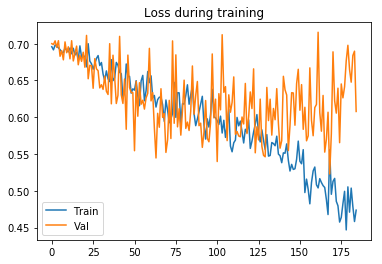

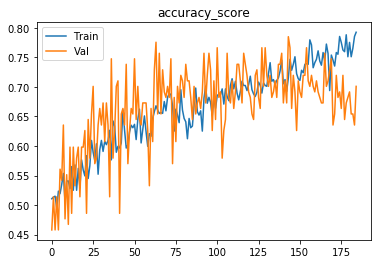

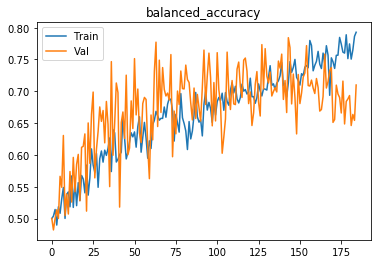

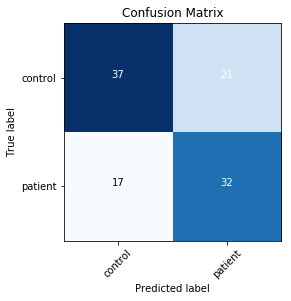

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69850
[0,     4] loss: 0.69190
Time elapsed: 0h:0m:7s
train accuracy_score: 49.36 %
train balanced_accuracy: 49.66 %
val accuracy_score: 52.34 %
val balanced_accuracy: 55.40 %
Val loss: 0.692582
[1,     2] loss: 0.69289
[1,     4] loss: 0.70573
Time elapsed: 0h:0m:18s
train accuracy_score: 51.65 %
train balanced_accuracy: 50.95 %
val accuracy_score: 49.53 %
val balanced_accuracy: 53.29 %
Val loss: 0.692603
[2,     2] loss: 0.69602
[2,     4] loss: 0.69873
Time elapsed: 0h:0m:28s
train accuracy_score: 49.07 %
train balanced_accuracy: 49.29 %
val accuracy_score: 54.21 %
val balanced_accuracy: 50.00 %
Val loss: 0.689252
[3,     2] loss: 0.69321
[3,     4] loss: 0.69281
Time elapsed: 0h:0m:39s
train accuracy_score: 50.36 %
train balanced_accuracy: 49.95 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.701012
[4,    

val accuracy_score: 59.81 %
val balanced_accuracy: 62.30 %
Val loss: 0.660195
[38,     2] loss: 0.66451
[38,     4] loss: 0.66775
Time elapsed: 0h:6m:53s
train accuracy_score: 60.80 %
train balanced_accuracy: 60.64 %
val accuracy_score: 63.55 %
val balanced_accuracy: 63.53 %
Val loss: 0.669601
[39,     2] loss: 0.66047
[39,     4] loss: 0.66339
Time elapsed: 0h:7m:3s
train accuracy_score: 60.52 %
train balanced_accuracy: 60.20 %
val accuracy_score: 64.49 %
val balanced_accuracy: 65.18 %
Val loss: 0.640373
[40,     2] loss: 0.63831
[40,     4] loss: 0.67165
Time elapsed: 0h:7m:14s
train accuracy_score: 60.80 %
train balanced_accuracy: 60.81 %
val accuracy_score: 61.68 %
val balanced_accuracy: 63.55 %
Val loss: 0.639791
[41,     2] loss: 0.62513
[41,     4] loss: 0.64939
Time elapsed: 0h:7m:24s
train accuracy_score: 64.52 %
train balanced_accuracy: 64.53 %
val accuracy_score: 63.55 %
val balanced_accuracy: 65.75 %
Val loss: 0.645742
[42,     2] loss: 0.63012
[42,     4] loss: 0.66782
Tim

val accuracy_score: 64.49 %
val balanced_accuracy: 65.50 %
Val loss: 0.629130
[76,     2] loss: 0.61510
[76,     4] loss: 0.62874
Time elapsed: 0h:13m:30s
train accuracy_score: 65.24 %
train balanced_accuracy: 65.36 %
val accuracy_score: 69.16 %
val balanced_accuracy: 70.13 %
Val loss: 0.608368
[77,     2] loss: 0.64136
[77,     4] loss: 0.62302
Time elapsed: 0h:13m:40s
train accuracy_score: 65.09 %
train balanced_accuracy: 64.80 %
val accuracy_score: 72.90 %
val balanced_accuracy: 71.36 %
Val loss: 0.595431
[78,     2] loss: 0.63474
[78,     4] loss: 0.68375
Time elapsed: 0h:13m:51s
train accuracy_score: 65.09 %
train balanced_accuracy: 64.84 %
val accuracy_score: 73.83 %
val balanced_accuracy: 73.65 %
Val loss: 0.587705
[79,     2] loss: 0.64334
[79,     4] loss: 0.62142
Time elapsed: 0h:14m:1s
train accuracy_score: 65.09 %
train balanced_accuracy: 65.40 %
val accuracy_score: 57.94 %
val balanced_accuracy: 60.26 %
Val loss: 0.657434
[80,     2] loss: 0.61498
[80,     4] loss: 0.62187

Time elapsed: 0h:19m:57s
train accuracy_score: 67.24 %
train balanced_accuracy: 67.35 %
val accuracy_score: 69.16 %
val balanced_accuracy: 70.44 %
Val loss: 0.604885
[114,     2] loss: 0.54252
[114,     4] loss: 0.63407
Time elapsed: 0h:20m:7s
train accuracy_score: 69.96 %
train balanced_accuracy: 70.00 %
val accuracy_score: 73.83 %
val balanced_accuracy: 73.96 %
Val loss: 0.574291
[115,     2] loss: 0.57908
[115,     4] loss: 0.59297
Time elapsed: 0h:20m:18s
train accuracy_score: 69.53 %
train balanced_accuracy: 69.55 %
val accuracy_score: 69.16 %
val balanced_accuracy: 70.92 %
Val loss: 0.593361
[116,     2] loss: 0.58242
[116,     4] loss: 0.57877
Time elapsed: 0h:20m:29s
train accuracy_score: 70.10 %
train balanced_accuracy: 70.13 %
val accuracy_score: 71.03 %
val balanced_accuracy: 71.69 %
Val loss: 0.599112
[117,     2] loss: 0.59603
[117,     4] loss: 0.55665
Time elapsed: 0h:20m:40s
train accuracy_score: 69.53 %
train balanced_accuracy: 69.63 %
val accuracy_score: 75.70 %
val b

val accuracy_score: 69.16 %
val balanced_accuracy: 68.38 %
Val loss: 0.562886
[151,     2] loss: 0.53920
[151,     4] loss: 0.54068
Time elapsed: 0h:26m:49s
train accuracy_score: 71.67 %
train balanced_accuracy: 71.77 %
val accuracy_score: 71.03 %
val balanced_accuracy: 72.17 %
Val loss: 0.616486
[152,     2] loss: 0.52993
[152,     4] loss: 0.56436
Time elapsed: 0h:27m:0s
train accuracy_score: 72.39 %
train balanced_accuracy: 72.47 %
val accuracy_score: 64.49 %
val balanced_accuracy: 65.50 %
Val loss: 0.619515
[153,     2] loss: 0.55105
[153,     4] loss: 0.56287
Time elapsed: 0h:27m:11s
train accuracy_score: 72.25 %
train balanced_accuracy: 72.20 %
val accuracy_score: 57.01 %
val balanced_accuracy: 59.24 %
Val loss: 0.690279
[154,     2] loss: 0.55220
[154,     4] loss: 0.56541
Time elapsed: 0h:27m:21s
train accuracy_score: 72.10 %
train balanced_accuracy: 72.29 %
val accuracy_score: 73.83 %
val balanced_accuracy: 75.07 %
Val loss: 0.613206
[155,     2] loss: 0.57456
[155,     4] los

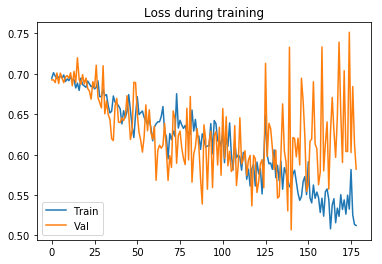

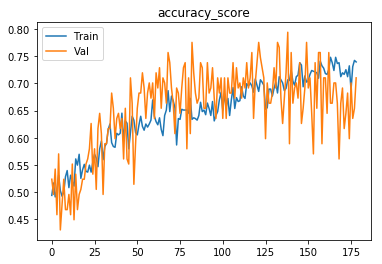

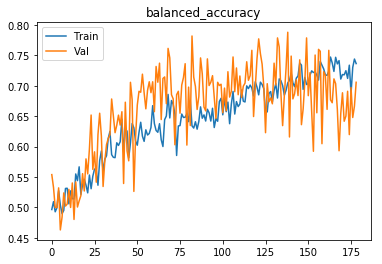

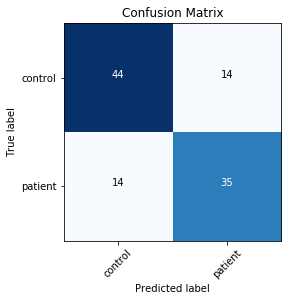

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69933
[0,     4] loss: 0.69197
Time elapsed: 0h:0m:9s
train accuracy_score: 49.93 %
train balanced_accuracy: 50.13 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.706610
[1,     2] loss: 0.69557
[1,     4] loss: 0.69292
Time elapsed: 0h:0m:19s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.02 %
val accuracy_score: 52.34 %
val balanced_accuracy: 55.56 %
Val loss: 0.693193
[2,     2] loss: 0.69038
[2,     4] loss: 0.69146
Time elapsed: 0h:0m:30s
train accuracy_score: 54.08 %
train balanced_accuracy: 53.14 %
val accuracy_score: 46.73 %
val balanced_accuracy: 50.70 %
Val loss: 0.694997
[3,     2] loss: 0.69196
[3,     4] loss: 0.70731
Time elapsed: 0h:0m:41s
train accuracy_score: 50.07 %
train balanced_accuracy: 48.81 %
val accuracy_score: 51.40 %
val balanced_accuracy: 54.70 %
Val loss: 0.692309
[4,    

val accuracy_score: 54.21 %
val balanced_accuracy: 52.69 %
Val loss: 0.682333
[38,     2] loss: 0.68074
[38,     4] loss: 0.67656
Time elapsed: 0h:6m:53s
train accuracy_score: 56.65 %
train balanced_accuracy: 57.31 %
val accuracy_score: 47.66 %
val balanced_accuracy: 51.57 %
Val loss: 0.692808
[39,     2] loss: 0.68708
[39,     4] loss: 0.68593
Time elapsed: 0h:7m:4s
train accuracy_score: 53.08 %
train balanced_accuracy: 51.76 %
val accuracy_score: 64.49 %
val balanced_accuracy: 63.60 %
Val loss: 0.657370
[40,     2] loss: 0.69221
[40,     4] loss: 0.69475
Time elapsed: 0h:7m:15s
train accuracy_score: 53.65 %
train balanced_accuracy: 54.56 %
val accuracy_score: 63.55 %
val balanced_accuracy: 64.16 %
Val loss: 0.665434
[41,     2] loss: 0.67279
[41,     4] loss: 0.68201
Time elapsed: 0h:7m:26s
train accuracy_score: 57.65 %
train balanced_accuracy: 56.85 %
val accuracy_score: 59.81 %
val balanced_accuracy: 62.30 %
Val loss: 0.667709
[42,     2] loss: 0.66506
[42,     4] loss: 0.65412
Tim

val accuracy_score: 67.29 %
val balanced_accuracy: 66.03 %
Val loss: 0.641589
[76,     2] loss: 0.65904
[76,     4] loss: 0.66879
Time elapsed: 0h:13m:44s
train accuracy_score: 60.80 %
train balanced_accuracy: 60.33 %
val accuracy_score: 63.55 %
val balanced_accuracy: 64.64 %
Val loss: 0.659069
[77,     2] loss: 0.63045
[77,     4] loss: 0.63223
Time elapsed: 0h:13m:55s
train accuracy_score: 64.38 %
train balanced_accuracy: 64.32 %
val accuracy_score: 63.55 %
val balanced_accuracy: 63.37 %
Val loss: 0.649162
[78,     2] loss: 0.65757
[78,     4] loss: 0.61109
Time elapsed: 0h:14m:7s
train accuracy_score: 62.95 %
train balanced_accuracy: 62.92 %
val accuracy_score: 62.62 %
val balanced_accuracy: 64.88 %
Val loss: 0.617197
[79,     2] loss: 0.66325
[79,     4] loss: 0.65546
Time elapsed: 0h:14m:18s
train accuracy_score: 59.08 %
train balanced_accuracy: 59.03 %
val accuracy_score: 56.07 %
val balanced_accuracy: 59.17 %
Val loss: 0.663058
[80,     2] loss: 0.63896
[80,     4] loss: 0.64126

Time elapsed: 0h:20m:39s
train accuracy_score: 62.80 %
train balanced_accuracy: 62.72 %
val accuracy_score: 60.75 %
val balanced_accuracy: 63.00 %
Val loss: 0.651880
[114,     2] loss: 0.64738
[114,     4] loss: 0.65624
Time elapsed: 0h:20m:50s
train accuracy_score: 59.23 %
train balanced_accuracy: 58.81 %
val accuracy_score: 65.42 %
val balanced_accuracy: 63.83 %
Val loss: 0.630942
[115,     2] loss: 0.65736
[115,     4] loss: 0.62611
Time elapsed: 0h:21m:1s
train accuracy_score: 63.23 %
train balanced_accuracy: 63.74 %
val accuracy_score: 67.29 %
val balanced_accuracy: 69.04 %
Val loss: 0.629404
[116,     2] loss: 0.60619
[116,     4] loss: 0.62895
Time elapsed: 0h:21m:12s
train accuracy_score: 67.38 %
train balanced_accuracy: 66.88 %
val accuracy_score: 66.36 %
val balanced_accuracy: 65.80 %
Val loss: 0.605394
[117,     2] loss: 0.64874
[117,     4] loss: 0.61832
Time elapsed: 0h:21m:24s
train accuracy_score: 63.09 %
train balanced_accuracy: 63.44 %
val accuracy_score: 64.49 %
val b

val accuracy_score: 70.09 %
val balanced_accuracy: 71.62 %
Val loss: 0.591033
[151,     2] loss: 0.56852
[151,     4] loss: 0.60772
Time elapsed: 0h:27m:28s
train accuracy_score: 69.24 %
train balanced_accuracy: 69.18 %
val accuracy_score: 61.68 %
val balanced_accuracy: 62.12 %
Val loss: 0.661538
[152,     2] loss: 0.59722
[152,     4] loss: 0.59007
Time elapsed: 0h:27m:38s
train accuracy_score: 68.96 %
train balanced_accuracy: 69.06 %
val accuracy_score: 67.29 %
val balanced_accuracy: 68.09 %
Val loss: 0.682200
[153,     2] loss: 0.56134
[153,     4] loss: 0.55307
Time elapsed: 0h:27m:48s
train accuracy_score: 70.39 %
train balanced_accuracy: 70.24 %
val accuracy_score: 64.49 %
val balanced_accuracy: 63.92 %
Val loss: 0.615742
[154,     2] loss: 0.62785
[154,     4] loss: 0.55147
Time elapsed: 0h:27m:58s
train accuracy_score: 68.38 %
train balanced_accuracy: 68.57 %
val accuracy_score: 72.90 %
val balanced_accuracy: 74.05 %
Val loss: 0.603352
[155,     2] loss: 0.56509
[155,     4] lo

[188,     2] loss: 0.52165
[188,     4] loss: 0.51018
Time elapsed: 0h:33m:57s
train accuracy_score: 73.39 %
train balanced_accuracy: 73.31 %
val accuracy_score: 64.49 %
val balanced_accuracy: 63.76 %
Val loss: 0.681409
[189,     2] loss: 0.57329
[189,     4] loss: 0.51778
Time elapsed: 0h:34m:8s
train accuracy_score: 71.96 %
train balanced_accuracy: 71.96 %
val accuracy_score: 59.81 %
val balanced_accuracy: 60.40 %
Val loss: 0.650065
[190,     2] loss: 0.53604
[190,     4] loss: 0.54923
Time elapsed: 0h:34m:18s
train accuracy_score: 73.10 %
train balanced_accuracy: 73.17 %
val accuracy_score: 68.22 %
val balanced_accuracy: 70.06 %
Val loss: 0.655728
[191,     2] loss: 0.57199
[191,     4] loss: 0.60696
Time elapsed: 0h:34m:28s
train accuracy_score: 68.38 %
train balanced_accuracy: 68.37 %
val accuracy_score: 70.09 %
val balanced_accuracy: 70.67 %
Val loss: 0.583942
Early stopping in epoch 192
Total time elapsed: 0h:34m:30s
Writing model to disk...
Best result during training: 0.74. Sa

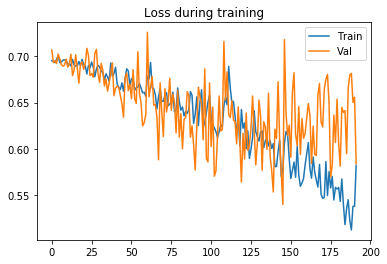

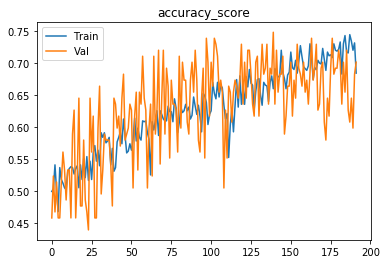

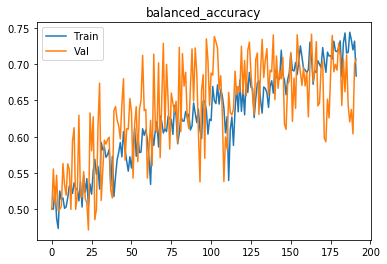

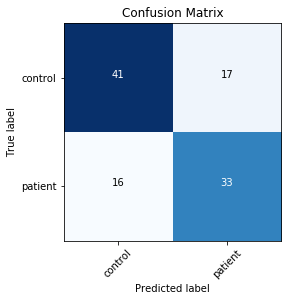

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.68965
[0,     4] loss: 0.70272
Time elapsed: 0h:0m:8s
train accuracy_score: 51.65 %
train balanced_accuracy: 51.04 %
val accuracy_score: 54.21 %
val balanced_accuracy: 50.00 %
Val loss: 0.701945
[1,     2] loss: 0.71650
[1,     4] loss: 0.69284
Time elapsed: 0h:0m:19s
train accuracy_score: 46.78 %
train balanced_accuracy: 47.20 %
val accuracy_score: 44.86 %
val balanced_accuracy: 47.71 %
Val loss: 0.694321
[2,     2] loss: 0.69592
[2,     4] loss: 0.69576
Time elapsed: 0h:0m:29s
train accuracy_score: 49.07 %
train balanced_accuracy: 49.69 %
val accuracy_score: 54.21 %
val balanced_accuracy: 50.00 %
Val loss: 0.689632
[3,     2] loss: 0.70058
[3,     4] loss: 0.69395
Time elapsed: 0h:0m:40s
train accuracy_score: 47.07 %
train balanced_accuracy: 47.94 %
val accuracy_score: 45.79 %
val balanced_accuracy: 50.00 %
Val loss: 0.696001
[4,    

val accuracy_score: 63.55 %
val balanced_accuracy: 62.42 %
Val loss: 0.648760
[38,     2] loss: 0.66462
[38,     4] loss: 0.66922
Time elapsed: 0h:6m:52s
train accuracy_score: 59.66 %
train balanced_accuracy: 59.81 %
val accuracy_score: 54.21 %
val balanced_accuracy: 57.60 %
Val loss: 0.688175
[39,     2] loss: 0.69013
[39,     4] loss: 0.65679
Time elapsed: 0h:7m:3s
train accuracy_score: 56.94 %
train balanced_accuracy: 56.25 %
val accuracy_score: 64.49 %
val balanced_accuracy: 63.44 %
Val loss: 0.664928
[40,     2] loss: 0.67318
[40,     4] loss: 0.68214
Time elapsed: 0h:7m:13s
train accuracy_score: 58.94 %
train balanced_accuracy: 58.87 %
val accuracy_score: 48.60 %
val balanced_accuracy: 52.27 %
Val loss: 0.704569
[41,     2] loss: 0.68892
[41,     4] loss: 0.68419
Time elapsed: 0h:7m:24s
train accuracy_score: 56.51 %
train balanced_accuracy: 56.11 %
val accuracy_score: 57.94 %
val balanced_accuracy: 56.46 %
Val loss: 0.667015
[42,     2] loss: 0.67454
[42,     4] loss: 0.66653
Tim

val accuracy_score: 64.49 %
val balanced_accuracy: 66.61 %
Val loss: 0.650110
[76,     2] loss: 0.65425
[76,     4] loss: 0.67384
Time elapsed: 0h:13m:43s
train accuracy_score: 58.94 %
train balanced_accuracy: 59.00 %
val accuracy_score: 63.55 %
val balanced_accuracy: 63.53 %
Val loss: 0.639319
[77,     2] loss: 0.63821
[77,     4] loss: 0.64090
Time elapsed: 0h:13m:55s
train accuracy_score: 63.23 %
train balanced_accuracy: 62.79 %
val accuracy_score: 71.03 %
val balanced_accuracy: 72.48 %
Val loss: 0.653321
[78,     2] loss: 0.60868
[78,     4] loss: 0.62035
Time elapsed: 0h:14m:6s
train accuracy_score: 67.81 %
train balanced_accuracy: 67.61 %
val accuracy_score: 66.36 %
val balanced_accuracy: 67.54 %
Val loss: 0.619048
[79,     2] loss: 0.62492
[79,     4] loss: 0.62844
Time elapsed: 0h:14m:19s
train accuracy_score: 65.24 %
train balanced_accuracy: 65.18 %
val accuracy_score: 68.22 %
val balanced_accuracy: 69.11 %
Val loss: 0.598959
[80,     2] loss: 0.65101
[80,     4] loss: 0.59349

Time elapsed: 0h:20m:44s
train accuracy_score: 68.10 %
train balanced_accuracy: 68.20 %
val accuracy_score: 66.36 %
val balanced_accuracy: 67.38 %
Val loss: 0.594931
[114,     2] loss: 0.61296
[114,     4] loss: 0.60086
Time elapsed: 0h:20m:55s
train accuracy_score: 63.66 %
train balanced_accuracy: 63.58 %
val accuracy_score: 72.90 %
val balanced_accuracy: 72.62 %
Val loss: 0.583858
[115,     2] loss: 0.58174
[115,     4] loss: 0.61623
Time elapsed: 0h:21m:6s
train accuracy_score: 67.81 %
train balanced_accuracy: 67.64 %
val accuracy_score: 69.16 %
val balanced_accuracy: 68.23 %
Val loss: 0.603930
[116,     2] loss: 0.59673
[116,     4] loss: 0.62976
Time elapsed: 0h:21m:17s
train accuracy_score: 65.95 %
train balanced_accuracy: 66.08 %
val accuracy_score: 64.49 %
val balanced_accuracy: 66.77 %
Val loss: 0.670585
[117,     2] loss: 0.62952
[117,     4] loss: 0.62702
Time elapsed: 0h:21m:28s
train accuracy_score: 67.10 %
train balanced_accuracy: 67.09 %
val accuracy_score: 74.77 %
val b

val accuracy_score: 69.16 %
val balanced_accuracy: 68.70 %
Val loss: 0.581152
[151,     2] loss: 0.55336
[151,     4] loss: 0.56428
Time elapsed: 0h:27m:23s
train accuracy_score: 72.82 %
train balanced_accuracy: 72.56 %
val accuracy_score: 70.09 %
val balanced_accuracy: 70.51 %
Val loss: 0.588171
[152,     2] loss: 0.53503
[152,     4] loss: 0.60117
Time elapsed: 0h:27m:34s
train accuracy_score: 72.10 %
train balanced_accuracy: 72.28 %
val accuracy_score: 72.90 %
val balanced_accuracy: 74.05 %
Val loss: 0.582752
[153,     2] loss: 0.60252
[153,     4] loss: 0.53754
Time elapsed: 0h:27m:45s
train accuracy_score: 69.67 %
train balanced_accuracy: 69.46 %
val accuracy_score: 65.42 %
val balanced_accuracy: 64.62 %
Val loss: 0.630460
[154,     2] loss: 0.55027
[154,     4] loss: 0.54771
Time elapsed: 0h:27m:55s
train accuracy_score: 72.96 %
train balanced_accuracy: 73.19 %
val accuracy_score: 58.88 %
val balanced_accuracy: 61.44 %
Val loss: 0.725145
[155,     2] loss: 0.57316
[155,     4] lo

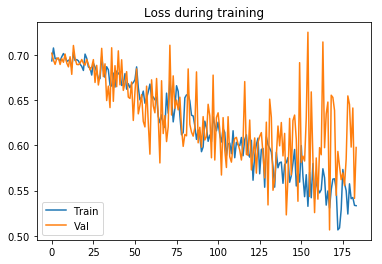

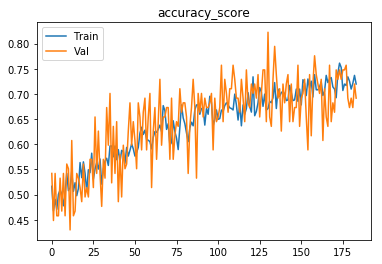

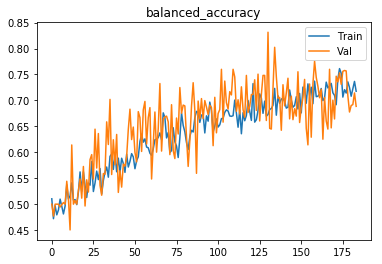

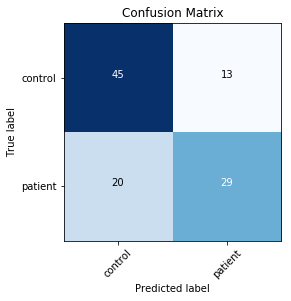

Finished outer fold.
{'final_acc': 0.6885995777621393, 'best_acc': 0.775686136523575, 'final_iter': 184, 'best_iter': 131, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 4}
###### Starting outer fold 1
# of patients 398, # of healthy controls 395
698
95
(698, 96, 114, 96)
(95, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70132
[0,     4] loss: 0.69901
Time elapsed: 0h:0m:8s
train accuracy_score: 46.99 %
train balanced_accuracy: 47.40 %
val accuracy_score: 52.63 %
val balanced_accuracy: 53.64 %
Val loss: 0.693682
[1,     2] loss: 0.69117
[1,     4] loss: 0.69396
Time elapsed: 0h:0m:19s
train accuracy_score: 50.72 %
train balanced_accuracy: 49.72 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697556
[2,     2] loss: 0.69214
[2,     4] loss: 0.69550
Time elapsed: 0h:0m:31s
train accuracy_score

[36,     2] loss: 0.70990
[36,     4] loss: 0.68607
Time elapsed: 0h:6m:45s
train accuracy_score: 52.72 %
train balanced_accuracy: 52.99 %
val accuracy_score: 42.11 %
val balanced_accuracy: 49.66 %
Val loss: 0.707037
[37,     2] loss: 0.68514
[37,     4] loss: 0.69027
Time elapsed: 0h:6m:56s
train accuracy_score: 53.58 %
train balanced_accuracy: 52.69 %
val accuracy_score: 61.05 %
val balanced_accuracy: 61.25 %
Val loss: 0.682483
[38,     2] loss: 0.68165
[38,     4] loss: 0.68112
Time elapsed: 0h:7m:7s
train accuracy_score: 58.74 %
train balanced_accuracy: 58.87 %
val accuracy_score: 62.11 %
val balanced_accuracy: 60.45 %
Val loss: 0.675732
[39,     2] loss: 0.67828
[39,     4] loss: 0.67436
Time elapsed: 0h:7m:17s
train accuracy_score: 61.46 %
train balanced_accuracy: 61.57 %
val accuracy_score: 66.32 %
val balanced_accuracy: 66.82 %
Val loss: 0.664694
[40,     2] loss: 0.67651
[40,     4] loss: 0.68067
Time elapsed: 0h:7m:27s
train accuracy_score: 58.60 %
train balanced_accuracy: 58

[74,     2] loss: 0.65296
[74,     4] loss: 0.64517
Time elapsed: 0h:13m:16s
train accuracy_score: 63.04 %
train balanced_accuracy: 62.81 %
val accuracy_score: 64.21 %
val balanced_accuracy: 60.23 %
Val loss: 0.617478
[75,     2] loss: 0.63405
[75,     4] loss: 0.67434
Time elapsed: 0h:13m:26s
train accuracy_score: 62.32 %
train balanced_accuracy: 62.51 %
val accuracy_score: 54.74 %
val balanced_accuracy: 59.55 %
Val loss: 0.682507
[76,     2] loss: 0.68141
[76,     4] loss: 0.65623
Time elapsed: 0h:13m:37s
train accuracy_score: 60.17 %
train balanced_accuracy: 60.11 %
val accuracy_score: 69.47 %
val balanced_accuracy: 67.16 %
Val loss: 0.617612
[77,     2] loss: 0.65610
[77,     4] loss: 0.65416
Time elapsed: 0h:13m:47s
train accuracy_score: 61.03 %
train balanced_accuracy: 60.84 %
val accuracy_score: 66.32 %
val balanced_accuracy: 62.73 %
Val loss: 0.597122
[78,     2] loss: 0.63179
[78,     4] loss: 0.65610
Time elapsed: 0h:13m:56s
train accuracy_score: 64.47 %
train balanced_accura

val accuracy_score: 70.53 %
val balanced_accuracy: 70.45 %
Val loss: 0.621654
[112,     2] loss: 0.62704
[112,     4] loss: 0.60206
Time elapsed: 0h:19m:49s
train accuracy_score: 65.47 %
train balanced_accuracy: 65.40 %
val accuracy_score: 72.63 %
val balanced_accuracy: 69.55 %
Val loss: 0.552791
[113,     2] loss: 0.63292
[113,     4] loss: 0.57484
Time elapsed: 0h:19m:59s
train accuracy_score: 66.76 %
train balanced_accuracy: 66.60 %
val accuracy_score: 64.21 %
val balanced_accuracy: 62.61 %
Val loss: 0.594885
[114,     2] loss: 0.61600
[114,     4] loss: 0.61457
Time elapsed: 0h:20m:9s
train accuracy_score: 67.05 %
train balanced_accuracy: 67.04 %
val accuracy_score: 68.42 %
val balanced_accuracy: 65.91 %
Val loss: 0.596369
[115,     2] loss: 0.59294
[115,     4] loss: 0.63317
Time elapsed: 0h:20m:19s
train accuracy_score: 68.19 %
train balanced_accuracy: 68.12 %
val accuracy_score: 67.37 %
val balanced_accuracy: 64.32 %
Val loss: 0.592624
[116,     2] loss: 0.64639
[116,     4] los

[149,     2] loss: 0.58991
[149,     4] loss: 0.59502
Time elapsed: 0h:26m:9s
train accuracy_score: 68.77 %
train balanced_accuracy: 69.04 %
val accuracy_score: 61.05 %
val balanced_accuracy: 61.59 %
Val loss: 0.614159
[150,     2] loss: 0.57599
[150,     4] loss: 0.61224
Time elapsed: 0h:26m:19s
train accuracy_score: 69.20 %
train balanced_accuracy: 68.95 %
val accuracy_score: 73.68 %
val balanced_accuracy: 70.80 %
Val loss: 0.562056
[151,     2] loss: 0.59985
[151,     4] loss: 0.54174
Time elapsed: 0h:26m:29s
train accuracy_score: 69.34 %
train balanced_accuracy: 69.44 %
val accuracy_score: 64.21 %
val balanced_accuracy: 64.66 %
Val loss: 0.589925
[152,     2] loss: 0.56552
[152,     4] loss: 0.59686
Time elapsed: 0h:26m:40s
train accuracy_score: 72.35 %
train balanced_accuracy: 72.29 %
val accuracy_score: 74.74 %
val balanced_accuracy: 73.07 %
Val loss: 0.508625
[153,     2] loss: 0.58272
[153,     4] loss: 0.53816
Time elapsed: 0h:26m:50s
train accuracy_score: 70.20 %
train balanc

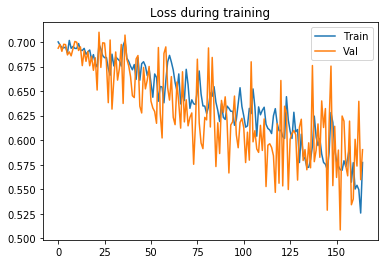

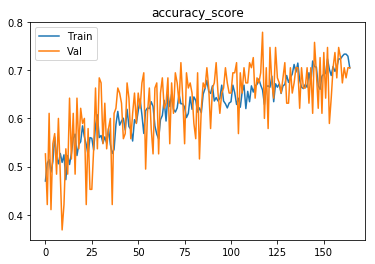

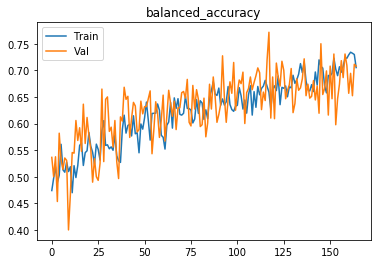

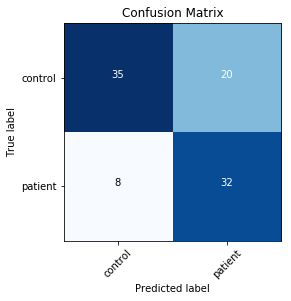

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69419
[0,     4] loss: 0.70293
Time elapsed: 0h:0m:8s
train accuracy_score: 50.14 %
train balanced_accuracy: 49.48 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.696682
[1,     2] loss: 0.69645
[1,     4] loss: 0.69657
Time elapsed: 0h:0m:19s
train accuracy_score: 49.57 %
train balanced_accuracy: 48.97 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.700146
[2,     2] loss: 0.69739
[2,     4] loss: 0.69254
Time elapsed: 0h:0m:29s
train accuracy_score: 50.43 %
train balanced_accuracy: 49.76 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.699253
[3,     2] loss: 0.70008
[3,     4] loss: 0.70188
Time elapsed: 0h:0m:39s
train accuracy_score: 49.43 %
train balanced_accuracy: 49.03 %
val accuracy_score: 52.63 %
val balanced_accuracy: 55.68 %
Val loss: 0.692870
[4,    

val accuracy_score: 49.47 %
val balanced_accuracy: 54.66 %
Val loss: 0.711001
[38,     2] loss: 0.69448
[38,     4] loss: 0.67717
Time elapsed: 0h:6m:38s
train accuracy_score: 55.44 %
train balanced_accuracy: 54.53 %
val accuracy_score: 54.74 %
val balanced_accuracy: 56.48 %
Val loss: 0.684392
[39,     2] loss: 0.68273
[39,     4] loss: 0.68678
Time elapsed: 0h:6m:48s
train accuracy_score: 55.01 %
train balanced_accuracy: 54.63 %
val accuracy_score: 55.79 %
val balanced_accuracy: 56.36 %
Val loss: 0.684865
[40,     2] loss: 0.68341
[40,     4] loss: 0.67787
Time elapsed: 0h:6m:59s
train accuracy_score: 58.31 %
train balanced_accuracy: 58.41 %
val accuracy_score: 60.00 %
val balanced_accuracy: 62.05 %
Val loss: 0.669321
[41,     2] loss: 0.68518
[41,     4] loss: 0.68042
Time elapsed: 0h:7m:10s
train accuracy_score: 54.73 %
train balanced_accuracy: 54.31 %
val accuracy_score: 61.05 %
val balanced_accuracy: 61.59 %
Val loss: 0.661802
[42,     2] loss: 0.68333
[42,     4] loss: 0.67265
Ti

val accuracy_score: 73.68 %
val balanced_accuracy: 71.82 %
Val loss: 0.596907
[76,     2] loss: 0.65040
[76,     4] loss: 0.63960
Time elapsed: 0h:13m:20s
train accuracy_score: 62.03 %
train balanced_accuracy: 61.99 %
val accuracy_score: 66.32 %
val balanced_accuracy: 63.07 %
Val loss: 0.590275
[77,     2] loss: 0.61227
[77,     4] loss: 0.69761
Time elapsed: 0h:13m:31s
train accuracy_score: 63.90 %
train balanced_accuracy: 63.89 %
val accuracy_score: 62.11 %
val balanced_accuracy: 66.25 %
Val loss: 0.665177
[78,     2] loss: 0.64716
[78,     4] loss: 0.64731
Time elapsed: 0h:13m:42s
train accuracy_score: 64.33 %
train balanced_accuracy: 64.42 %
val accuracy_score: 72.63 %
val balanced_accuracy: 71.59 %
Val loss: 0.609900
[79,     2] loss: 0.64310
[79,     4] loss: 0.60936
Time elapsed: 0h:13m:53s
train accuracy_score: 65.76 %
train balanced_accuracy: 65.58 %
val accuracy_score: 65.26 %
val balanced_accuracy: 62.84 %
Val loss: 0.616103
[80,     2] loss: 0.64041
[80,     4] loss: 0.6497

Time elapsed: 0h:20m:1s
train accuracy_score: 66.48 %
train balanced_accuracy: 66.31 %
val accuracy_score: 70.53 %
val balanced_accuracy: 67.39 %
Val loss: 0.595062
[114,     2] loss: 0.63188
[114,     4] loss: 0.60664
Time elapsed: 0h:20m:11s
train accuracy_score: 64.76 %
train balanced_accuracy: 64.99 %
val accuracy_score: 62.11 %
val balanced_accuracy: 63.52 %
Val loss: 0.658973
[115,     2] loss: 0.62700
[115,     4] loss: 0.62184
Time elapsed: 0h:20m:22s
train accuracy_score: 65.33 %
train balanced_accuracy: 65.25 %
val accuracy_score: 68.42 %
val balanced_accuracy: 64.89 %
Val loss: 0.570193
[116,     2] loss: 0.61293
[116,     4] loss: 0.61670
Time elapsed: 0h:20m:32s
train accuracy_score: 67.91 %
train balanced_accuracy: 67.72 %
val accuracy_score: 66.32 %
val balanced_accuracy: 65.45 %
Val loss: 0.629119
[117,     2] loss: 0.62802
[117,     4] loss: 0.60431
Time elapsed: 0h:20m:43s
train accuracy_score: 66.05 %
train balanced_accuracy: 66.10 %
val accuracy_score: 64.21 %
val b

val accuracy_score: 64.21 %
val balanced_accuracy: 61.59 %
Val loss: 0.609660
[151,     2] loss: 0.56717
[151,     4] loss: 0.63537
Time elapsed: 0h:26m:49s
train accuracy_score: 68.19 %
train balanced_accuracy: 68.29 %
val accuracy_score: 68.42 %
val balanced_accuracy: 68.98 %
Val loss: 0.561681
[152,     2] loss: 0.60120
[152,     4] loss: 0.60158
Time elapsed: 0h:27m:0s
train accuracy_score: 68.48 %
train balanced_accuracy: 68.48 %
val accuracy_score: 73.68 %
val balanced_accuracy: 72.50 %
Val loss: 0.540825
[153,     2] loss: 0.59397
[153,     4] loss: 0.58383
Time elapsed: 0h:27m:10s
train accuracy_score: 69.91 %
train balanced_accuracy: 69.89 %
val accuracy_score: 62.11 %
val balanced_accuracy: 63.86 %
Val loss: 0.676857
[154,     2] loss: 0.57917
[154,     4] loss: 0.59858
Time elapsed: 0h:27m:21s
train accuracy_score: 71.92 %
train balanced_accuracy: 72.04 %
val accuracy_score: 75.79 %
val balanced_accuracy: 73.64 %
Val loss: 0.565309
[155,     2] loss: 0.59669
[155,     4] los

[188,     2] loss: 0.53321
[188,     4] loss: 0.56088
Time elapsed: 0h:33m:33s
train accuracy_score: 72.06 %
train balanced_accuracy: 71.97 %
val accuracy_score: 63.16 %
val balanced_accuracy: 64.09 %
Val loss: 0.615473
[189,     2] loss: 0.52537
[189,     4] loss: 0.55146
Time elapsed: 0h:33m:43s
train accuracy_score: 74.50 %
train balanced_accuracy: 74.53 %
val accuracy_score: 64.21 %
val balanced_accuracy: 65.34 %
Val loss: 0.631721
[190,     2] loss: 0.56199
[190,     4] loss: 0.53184
Time elapsed: 0h:33m:54s
train accuracy_score: 72.64 %
train balanced_accuracy: 72.65 %
val accuracy_score: 68.42 %
val balanced_accuracy: 68.98 %
Val loss: 0.569941
Early stopping in epoch 191
Total time elapsed: 0h:33m:56s
Writing model to disk...
Best result during training: 0.75. Saving model..
Finished inner fold.


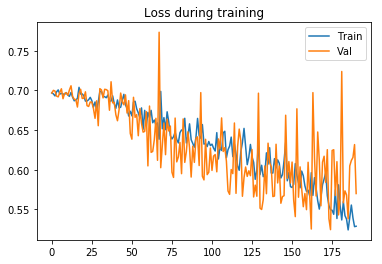

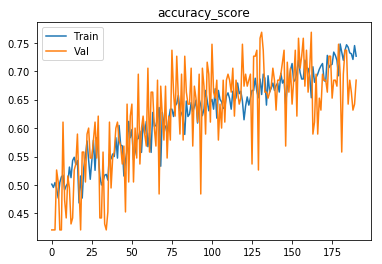

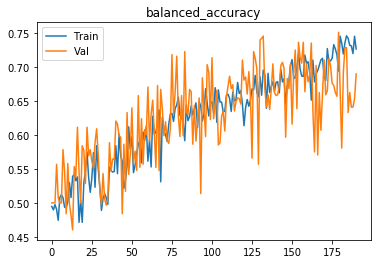

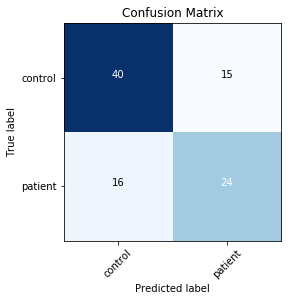

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69591
[0,     4] loss: 0.69007
Time elapsed: 0h:0m:9s
train accuracy_score: 51.86 %
train balanced_accuracy: 51.65 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.717125
[1,     2] loss: 0.69541
[1,     4] loss: 0.69827
Time elapsed: 0h:0m:19s
train accuracy_score: 50.14 %
train balanced_accuracy: 49.69 %
val accuracy_score: 53.68 %
val balanced_accuracy: 47.73 %
Val loss: 0.689484
[2,     2] loss: 0.69578
[2,     4] loss: 0.69390
Time elapsed: 0h:0m:30s
train accuracy_score: 48.57 %
train balanced_accuracy: 48.18 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.697701
[3,     2] loss: 0.69124
[3,     4] loss: 0.69467
Time elapsed: 0h:0m:41s
train accuracy_score: 51.72 %
train balanced_accuracy: 51.34 %
val accuracy_score: 60.00 %
val balanced_accuracy: 53.18 %
Val loss: 0.687177
[4,    

val accuracy_score: 69.47 %
val balanced_accuracy: 65.80 %
Val loss: 0.631649
[38,     2] loss: 0.65765
[38,     4] loss: 0.67065
Time elapsed: 0h:6m:51s
train accuracy_score: 61.46 %
train balanced_accuracy: 61.63 %
val accuracy_score: 56.84 %
val balanced_accuracy: 61.02 %
Val loss: 0.665048
[39,     2] loss: 0.67039
[39,     4] loss: 0.68727
Time elapsed: 0h:7m:1s
train accuracy_score: 58.45 %
train balanced_accuracy: 58.23 %
val accuracy_score: 64.21 %
val balanced_accuracy: 64.66 %
Val loss: 0.640463
[40,     2] loss: 0.66401
[40,     4] loss: 0.65482
Time elapsed: 0h:7m:12s
train accuracy_score: 60.03 %
train balanced_accuracy: 59.80 %
val accuracy_score: 64.21 %
val balanced_accuracy: 62.27 %
Val loss: 0.631764
[41,     2] loss: 0.65885
[41,     4] loss: 0.67031
Time elapsed: 0h:7m:22s
train accuracy_score: 59.74 %
train balanced_accuracy: 59.50 %
val accuracy_score: 65.26 %
val balanced_accuracy: 60.80 %
Val loss: 0.668912
[42,     2] loss: 0.67517
[42,     4] loss: 0.64936
Tim

val accuracy_score: 64.21 %
val balanced_accuracy: 60.23 %
Val loss: 0.634404
[76,     2] loss: 0.65191
[76,     4] loss: 0.63087
Time elapsed: 0h:13m:37s
train accuracy_score: 63.47 %
train balanced_accuracy: 63.71 %
val accuracy_score: 58.95 %
val balanced_accuracy: 62.16 %
Val loss: 0.656060
[77,     2] loss: 0.65969
[77,     4] loss: 0.62765
Time elapsed: 0h:13m:48s
train accuracy_score: 60.89 %
train balanced_accuracy: 60.64 %
val accuracy_score: 73.68 %
val balanced_accuracy: 70.45 %
Val loss: 0.605832
[78,     2] loss: 0.62241
[78,     4] loss: 0.63643
Time elapsed: 0h:13m:59s
train accuracy_score: 63.61 %
train balanced_accuracy: 63.45 %
val accuracy_score: 73.68 %
val balanced_accuracy: 71.48 %
Val loss: 0.594902
[79,     2] loss: 0.64287
[79,     4] loss: 0.64166
Time elapsed: 0h:14m:9s
train accuracy_score: 64.18 %
train balanced_accuracy: 64.17 %
val accuracy_score: 64.21 %
val balanced_accuracy: 61.93 %
Val loss: 0.597361
[80,     2] loss: 0.65597
[80,     4] loss: 0.65235

Time elapsed: 0h:20m:13s
train accuracy_score: 65.76 %
train balanced_accuracy: 65.66 %
val accuracy_score: 67.37 %
val balanced_accuracy: 65.68 %
Val loss: 0.570352
[114,     2] loss: 0.62653
[114,     4] loss: 0.63130
Time elapsed: 0h:20m:24s
train accuracy_score: 64.61 %
train balanced_accuracy: 64.61 %
val accuracy_score: 66.32 %
val balanced_accuracy: 67.84 %
Val loss: 0.604241
[115,     2] loss: 0.61202
[115,     4] loss: 0.62280
Time elapsed: 0h:20m:35s
train accuracy_score: 65.90 %
train balanced_accuracy: 65.78 %
val accuracy_score: 73.68 %
val balanced_accuracy: 70.80 %
Val loss: 0.585190
[116,     2] loss: 0.61546
[116,     4] loss: 0.62882
Time elapsed: 0h:20m:46s
train accuracy_score: 65.90 %
train balanced_accuracy: 66.00 %
val accuracy_score: 63.16 %
val balanced_accuracy: 65.11 %
Val loss: 0.625811
[117,     2] loss: 0.61209
[117,     4] loss: 0.65689
Time elapsed: 0h:20m:56s
train accuracy_score: 64.18 %
train balanced_accuracy: 64.33 %
val accuracy_score: 65.26 %
val 

val accuracy_score: 68.42 %
val balanced_accuracy: 69.32 %
Val loss: 0.561138
[151,     2] loss: 0.55030
[151,     4] loss: 0.59484
Time elapsed: 0h:26m:58s
train accuracy_score: 69.34 %
train balanced_accuracy: 69.53 %
val accuracy_score: 65.26 %
val balanced_accuracy: 66.59 %
Val loss: 0.623865
[152,     2] loss: 0.59608
[152,     4] loss: 0.58129
Time elapsed: 0h:27m:9s
train accuracy_score: 67.05 %
train balanced_accuracy: 66.74 %
val accuracy_score: 68.42 %
val balanced_accuracy: 65.57 %
Val loss: 0.591715
[153,     2] loss: 0.59973
[153,     4] loss: 0.60501
Time elapsed: 0h:27m:20s
train accuracy_score: 67.05 %
train balanced_accuracy: 67.03 %
val accuracy_score: 58.95 %
val balanced_accuracy: 60.80 %
Val loss: 0.665558
[154,     2] loss: 0.59010
[154,     4] loss: 0.61759
Time elapsed: 0h:27m:31s
train accuracy_score: 70.20 %
train balanced_accuracy: 70.26 %
val accuracy_score: 69.47 %
val balanced_accuracy: 70.91 %
Val loss: 0.565156
[155,     2] loss: 0.57957
[155,     4] los

[188,     2] loss: 0.54363
[188,     4] loss: 0.49605
Time elapsed: 0h:33m:38s
train accuracy_score: 73.93 %
train balanced_accuracy: 73.94 %
val accuracy_score: 71.58 %
val balanced_accuracy: 72.39 %
Val loss: 0.548915
[189,     2] loss: 0.53628
[189,     4] loss: 0.54724
Time elapsed: 0h:33m:49s
train accuracy_score: 72.92 %
train balanced_accuracy: 72.99 %
val accuracy_score: 72.63 %
val balanced_accuracy: 73.64 %
Val loss: 0.597369
[190,     2] loss: 0.51218
[190,     4] loss: 0.54732
Time elapsed: 0h:34m:0s
train accuracy_score: 72.64 %
train balanced_accuracy: 72.66 %
val accuracy_score: 69.47 %
val balanced_accuracy: 69.89 %
Val loss: 0.566088
[191,     2] loss: 0.54281
[191,     4] loss: 0.57443
Time elapsed: 0h:34m:11s
train accuracy_score: 72.49 %
train balanced_accuracy: 72.41 %
val accuracy_score: 67.37 %
val balanced_accuracy: 66.36 %
Val loss: 0.558915
Early stopping in epoch 192
Total time elapsed: 0h:34m:13s
Writing model to disk...
Best result during training: 0.75. Sa

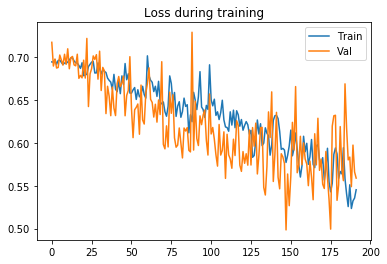

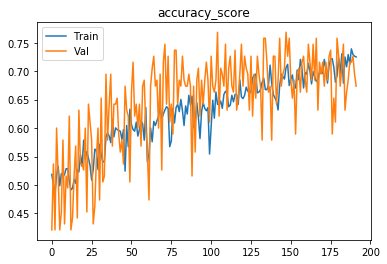

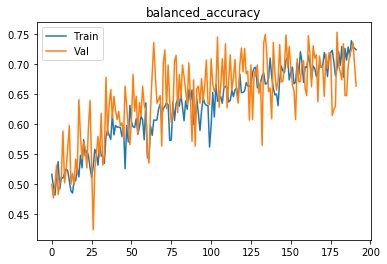

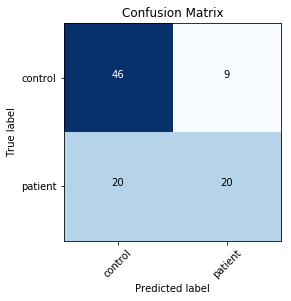

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70400
[0,     4] loss: 0.69170
Time elapsed: 0h:0m:8s
train accuracy_score: 49.14 %
train balanced_accuracy: 48.39 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.700441
[1,     2] loss: 0.69375
[1,     4] loss: 0.69495
Time elapsed: 0h:0m:19s
train accuracy_score: 49.14 %
train balanced_accuracy: 48.63 %
val accuracy_score: 52.63 %
val balanced_accuracy: 51.59 %
Val loss: 0.691935
[2,     2] loss: 0.69649
[2,     4] loss: 0.68968
Time elapsed: 0h:0m:30s
train accuracy_score: 49.57 %
train balanced_accuracy: 48.89 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.700726
[3,     2] loss: 0.69167
[3,     4] loss: 0.69645
Time elapsed: 0h:0m:41s
train accuracy_score: 47.71 %
train balanced_accuracy: 47.36 %
val accuracy_score: 46.32 %
val balanced_accuracy: 47.84 %
Val loss: 0.698578
[4,    

val accuracy_score: 48.42 %
val balanced_accuracy: 55.11 %
Val loss: 0.692648
[38,     2] loss: 0.68206
[38,     4] loss: 0.68896
Time elapsed: 0h:7m:4s
train accuracy_score: 54.58 %
train balanced_accuracy: 54.53 %
val accuracy_score: 65.26 %
val balanced_accuracy: 61.82 %
Val loss: 0.668649
[39,     2] loss: 0.69110
[39,     4] loss: 0.68996
Time elapsed: 0h:7m:14s
train accuracy_score: 53.87 %
train balanced_accuracy: 53.93 %
val accuracy_score: 46.32 %
val balanced_accuracy: 52.27 %
Val loss: 0.698473
[40,     2] loss: 0.68931
[40,     4] loss: 0.68825
Time elapsed: 0h:7m:24s
train accuracy_score: 55.30 %
train balanced_accuracy: 54.41 %
val accuracy_score: 56.84 %
val balanced_accuracy: 60.34 %
Val loss: 0.686400
[41,     2] loss: 0.68905
[41,     4] loss: 0.68615
Time elapsed: 0h:7m:35s
train accuracy_score: 54.87 %
train balanced_accuracy: 54.73 %
val accuracy_score: 53.68 %
val balanced_accuracy: 53.86 %
Val loss: 0.686937
[42,     2] loss: 0.68180
[42,     4] loss: 0.67797
Tim

val accuracy_score: 69.47 %
val balanced_accuracy: 67.16 %
Val loss: 0.575322
[76,     2] loss: 0.62578
[76,     4] loss: 0.62772
Time elapsed: 0h:13m:49s
train accuracy_score: 65.33 %
train balanced_accuracy: 65.25 %
val accuracy_score: 71.58 %
val balanced_accuracy: 67.95 %
Val loss: 0.608555
[77,     2] loss: 0.64755
[77,     4] loss: 0.65725
Time elapsed: 0h:14m:0s
train accuracy_score: 62.46 %
train balanced_accuracy: 62.37 %
val accuracy_score: 67.37 %
val balanced_accuracy: 62.95 %
Val loss: 0.627290
[78,     2] loss: 0.67655
[78,     4] loss: 0.65348
Time elapsed: 0h:14m:11s
train accuracy_score: 59.03 %
train balanced_accuracy: 59.09 %
val accuracy_score: 51.58 %
val balanced_accuracy: 53.75 %
Val loss: 0.684147
[79,     2] loss: 0.64614
[79,     4] loss: 0.65802
Time elapsed: 0h:14m:22s
train accuracy_score: 61.03 %
train balanced_accuracy: 60.89 %
val accuracy_score: 70.53 %
val balanced_accuracy: 66.36 %
Val loss: 0.641211
[80,     2] loss: 0.64278
[80,     4] loss: 0.64901

Time elapsed: 0h:20m:34s
train accuracy_score: 66.48 %
train balanced_accuracy: 66.87 %
val accuracy_score: 65.26 %
val balanced_accuracy: 67.27 %
Val loss: 0.638902
[114,     2] loss: 0.63162
[114,     4] loss: 0.61618
Time elapsed: 0h:20m:44s
train accuracy_score: 65.33 %
train balanced_accuracy: 64.94 %
val accuracy_score: 72.63 %
val balanced_accuracy: 71.59 %
Val loss: 0.602746
[115,     2] loss: 0.61279
[115,     4] loss: 0.63125
Time elapsed: 0h:20m:55s
train accuracy_score: 66.05 %
train balanced_accuracy: 65.98 %
val accuracy_score: 70.53 %
val balanced_accuracy: 70.11 %
Val loss: 0.609234
[116,     2] loss: 0.61081
[116,     4] loss: 0.62310
Time elapsed: 0h:21m:6s
train accuracy_score: 68.05 %
train balanced_accuracy: 68.06 %
val accuracy_score: 69.47 %
val balanced_accuracy: 69.20 %
Val loss: 0.570896
[117,     2] loss: 0.58027
[117,     4] loss: 0.64131
Time elapsed: 0h:21m:17s
train accuracy_score: 68.05 %
train balanced_accuracy: 67.96 %
val accuracy_score: 71.58 %
val b

val accuracy_score: 67.37 %
val balanced_accuracy: 67.73 %
Val loss: 0.593188
[151,     2] loss: 0.59833
[151,     4] loss: 0.60804
Time elapsed: 0h:27m:18s
train accuracy_score: 67.19 %
train balanced_accuracy: 67.04 %
val accuracy_score: 71.58 %
val balanced_accuracy: 69.32 %
Val loss: 0.544231
[152,     2] loss: 0.55660
[152,     4] loss: 0.61215
Time elapsed: 0h:27m:29s
train accuracy_score: 68.34 %
train balanced_accuracy: 68.51 %
val accuracy_score: 57.89 %
val balanced_accuracy: 61.59 %
Val loss: 0.703890
[153,     2] loss: 0.62644
[153,     4] loss: 0.57933
Time elapsed: 0h:27m:39s
train accuracy_score: 69.34 %
train balanced_accuracy: 69.08 %
val accuracy_score: 72.63 %
val balanced_accuracy: 70.23 %
Val loss: 0.594264
[154,     2] loss: 0.59441
[154,     4] loss: 0.59695
Time elapsed: 0h:27m:50s
train accuracy_score: 68.62 %
train balanced_accuracy: 68.66 %
val accuracy_score: 66.32 %
val balanced_accuracy: 68.52 %
Val loss: 0.602782
[155,     2] loss: 0.60035
[155,     4] lo

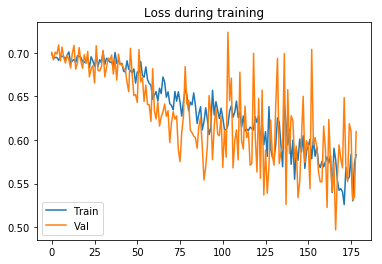

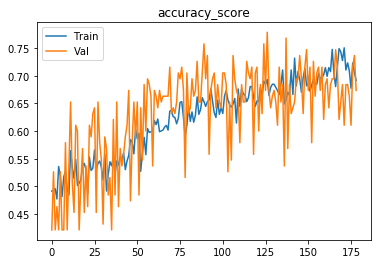

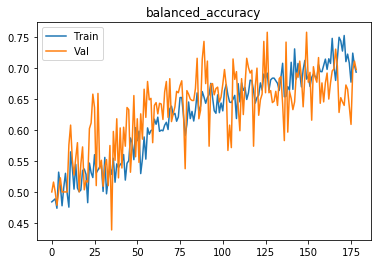

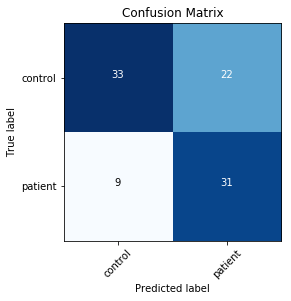

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69502
[0,     4] loss: 0.69590
Time elapsed: 0h:0m:8s
train accuracy_score: 51.29 %
train balanced_accuracy: 51.18 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.723312
[1,     2] loss: 0.69623
[1,     4] loss: 0.69978
Time elapsed: 0h:0m:18s
train accuracy_score: 52.44 %
train balanced_accuracy: 51.32 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.688730
[2,     2] loss: 0.69021
[2,     4] loss: 0.69435
Time elapsed: 0h:0m:29s
train accuracy_score: 53.44 %
train balanced_accuracy: 53.49 %
val accuracy_score: 42.11 %
val balanced_accuracy: 50.00 %
Val loss: 0.712200
[3,     2] loss: 0.68840
[3,     4] loss: 0.68759
Time elapsed: 0h:0m:40s
train accuracy_score: 53.72 %
train balanced_accuracy: 53.49 %
val accuracy_score: 57.89 %
val balanced_accuracy: 50.00 %
Val loss: 0.685986
[4,    

val accuracy_score: 65.26 %
val balanced_accuracy: 62.84 %
Val loss: 0.662407
[38,     2] loss: 0.68394
[38,     4] loss: 0.67588
Time elapsed: 0h:6m:59s
train accuracy_score: 54.87 %
train balanced_accuracy: 54.70 %
val accuracy_score: 58.95 %
val balanced_accuracy: 62.50 %
Val loss: 0.671662
[39,     2] loss: 0.68324
[39,     4] loss: 0.68996
Time elapsed: 0h:7m:10s
train accuracy_score: 56.45 %
train balanced_accuracy: 56.19 %
val accuracy_score: 55.79 %
val balanced_accuracy: 59.09 %
Val loss: 0.668245
[40,     2] loss: 0.68581
[40,     4] loss: 0.67725
Time elapsed: 0h:7m:21s
train accuracy_score: 58.74 %
train balanced_accuracy: 58.53 %
val accuracy_score: 66.32 %
val balanced_accuracy: 65.45 %
Val loss: 0.655648
[41,     2] loss: 0.66767
[41,     4] loss: 0.66774
Time elapsed: 0h:7m:32s
train accuracy_score: 56.73 %
train balanced_accuracy: 56.45 %
val accuracy_score: 63.16 %
val balanced_accuracy: 57.61 %
Val loss: 0.650876
[42,     2] loss: 0.69053
[42,     4] loss: 0.69198
Ti

val accuracy_score: 51.58 %
val balanced_accuracy: 53.75 %
Val loss: 0.707760
[76,     2] loss: 0.67882
[76,     4] loss: 0.66612
Time elapsed: 0h:13m:57s
train accuracy_score: 60.03 %
train balanced_accuracy: 60.38 %
val accuracy_score: 64.21 %
val balanced_accuracy: 65.34 %
Val loss: 0.620310
[77,     2] loss: 0.64918
[77,     4] loss: 0.64444
Time elapsed: 0h:14m:7s
train accuracy_score: 61.89 %
train balanced_accuracy: 61.40 %
val accuracy_score: 63.16 %
val balanced_accuracy: 61.36 %
Val loss: 0.645605
[78,     2] loss: 0.65673
[78,     4] loss: 0.64767
Time elapsed: 0h:14m:18s
train accuracy_score: 61.32 %
train balanced_accuracy: 61.35 %
val accuracy_score: 58.95 %
val balanced_accuracy: 62.16 %
Val loss: 0.650747
[79,     2] loss: 0.65424
[79,     4] loss: 0.68137
Time elapsed: 0h:14m:28s
train accuracy_score: 59.31 %
train balanced_accuracy: 59.28 %
val accuracy_score: 65.26 %
val balanced_accuracy: 64.89 %
Val loss: 0.625918
[80,     2] loss: 0.64000
[80,     4] loss: 0.65927

Time elapsed: 0h:20m:34s
train accuracy_score: 62.75 %
train balanced_accuracy: 62.33 %
val accuracy_score: 69.47 %
val balanced_accuracy: 65.45 %
Val loss: 0.608300
[114,     2] loss: 0.64561
[114,     4] loss: 0.63028
Time elapsed: 0h:20m:45s
train accuracy_score: 64.18 %
train balanced_accuracy: 64.34 %
val accuracy_score: 64.21 %
val balanced_accuracy: 64.66 %
Val loss: 0.627151
[115,     2] loss: 0.63709
[115,     4] loss: 0.62150
Time elapsed: 0h:20m:56s
train accuracy_score: 66.33 %
train balanced_accuracy: 66.22 %
val accuracy_score: 67.37 %
val balanced_accuracy: 65.00 %
Val loss: 0.614254
[116,     2] loss: 0.62472
[116,     4] loss: 0.59614
Time elapsed: 0h:21m:7s
train accuracy_score: 66.62 %
train balanced_accuracy: 66.64 %
val accuracy_score: 65.26 %
val balanced_accuracy: 64.89 %
Val loss: 0.606032
[117,     2] loss: 0.64520
[117,     4] loss: 0.61444
Time elapsed: 0h:21m:17s
train accuracy_score: 64.61 %
train balanced_accuracy: 64.46 %
val accuracy_score: 68.42 %
val b

val accuracy_score: 74.74 %
val balanced_accuracy: 73.07 %
Val loss: 0.543978
[151,     2] loss: 0.60071
[151,     4] loss: 0.58046
Time elapsed: 0h:27m:19s
train accuracy_score: 68.77 %
train balanced_accuracy: 68.90 %
val accuracy_score: 57.89 %
val balanced_accuracy: 59.89 %
Val loss: 0.642659
[152,     2] loss: 0.63548
[152,     4] loss: 0.58457
Time elapsed: 0h:27m:30s
train accuracy_score: 66.48 %
train balanced_accuracy: 66.29 %
val accuracy_score: 72.63 %
val balanced_accuracy: 70.23 %
Val loss: 0.560868
[153,     2] loss: 0.56913
[153,     4] loss: 0.60053
Time elapsed: 0h:27m:40s
train accuracy_score: 68.34 %
train balanced_accuracy: 68.31 %
val accuracy_score: 69.47 %
val balanced_accuracy: 70.23 %
Val loss: 0.543292
[154,     2] loss: 0.60222
[154,     4] loss: 0.58819
Time elapsed: 0h:27m:51s
train accuracy_score: 66.62 %
train balanced_accuracy: 66.76 %
val accuracy_score: 67.37 %
val balanced_accuracy: 67.39 %
Val loss: 0.616661
[155,     2] loss: 0.58114
[155,     4] lo

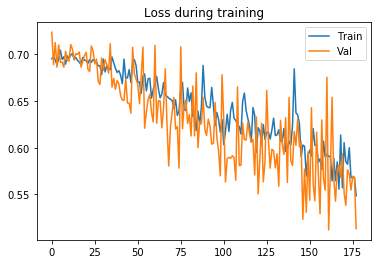

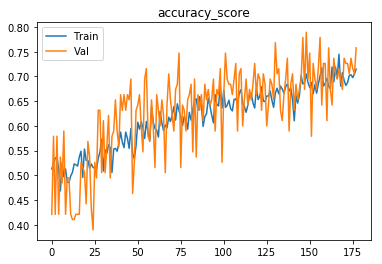

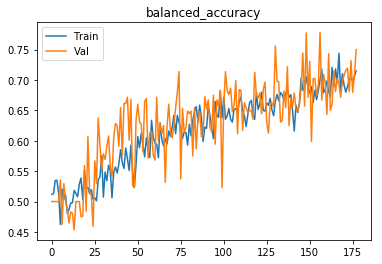

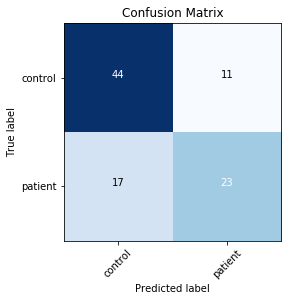

Finished outer fold.
{'final_acc': 0.7079545454545455, 'best_acc': 0.7306818181818182, 'final_iter': 165, 'best_iter': 118, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 2
# of patients 397, # of healthy controls 394
690
101
(690, 96, 114, 96)
(101, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69987
[0,     4] loss: 0.71140
Time elapsed: 0h:0m:8s
train accuracy_score: 48.84 %
train balanced_accuracy: 48.75 %
val accuracy_score: 45.54 %
val balanced_accuracy: 49.64 %
Val loss: 0.698014
[1,     2] loss: 0.69259
[1,     4] loss: 0.69304
Time elapsed: 0h:0m:18s
train accuracy_score: 49.42 %
train balanced_accuracy: 49.75 %
val accuracy_score: 51.49 %
val balanced_accuracy: 48.87 %
Val loss: 0.689955
[2,     2] loss: 0.69400
[2,     4] loss: 0.68954
Time elapsed: 0h:0m:28s
train accuracy_sc

[36,     2] loss: 0.68210
[36,     4] loss: 0.70754
Time elapsed: 0h:6m:23s
train accuracy_score: 54.78 %
train balanced_accuracy: 55.18 %
val accuracy_score: 61.39 %
val balanced_accuracy: 60.45 %
Val loss: 0.657180
[37,     2] loss: 0.66736
[37,     4] loss: 0.69065
Time elapsed: 0h:6m:34s
train accuracy_score: 57.97 %
train balanced_accuracy: 57.73 %
val accuracy_score: 48.51 %
val balanced_accuracy: 52.02 %
Val loss: 0.726309
[38,     2] loss: 0.68130
[38,     4] loss: 0.67294
Time elapsed: 0h:6m:44s
train accuracy_score: 55.94 %
train balanced_accuracy: 55.69 %
val accuracy_score: 53.47 %
val balanced_accuracy: 52.29 %
Val loss: 0.689116
[39,     2] loss: 0.67024
[39,     4] loss: 0.68789
Time elapsed: 0h:6m:54s
train accuracy_score: 56.96 %
train balanced_accuracy: 57.00 %
val accuracy_score: 52.48 %
val balanced_accuracy: 52.98 %
Val loss: 0.696672
[40,     2] loss: 0.68098
[40,     4] loss: 0.67126
Time elapsed: 0h:7m:5s
train accuracy_score: 58.41 %
train balanced_accuracy: 58

[74,     2] loss: 0.65425
[74,     4] loss: 0.67678
Time elapsed: 0h:13m:7s
train accuracy_score: 60.00 %
train balanced_accuracy: 60.00 %
val accuracy_score: 56.44 %
val balanced_accuracy: 55.20 %
Val loss: 0.677532
[75,     2] loss: 0.65589
[75,     4] loss: 0.65662
Time elapsed: 0h:13m:18s
train accuracy_score: 61.45 %
train balanced_accuracy: 61.78 %
val accuracy_score: 57.43 %
val balanced_accuracy: 58.60 %
Val loss: 0.694485
[76,     2] loss: 0.67840
[76,     4] loss: 0.62107
Time elapsed: 0h:13m:29s
train accuracy_score: 61.01 %
train balanced_accuracy: 60.77 %
val accuracy_score: 59.41 %
val balanced_accuracy: 58.99 %
Val loss: 0.706505
[77,     2] loss: 0.63942
[77,     4] loss: 0.64390
Time elapsed: 0h:13m:39s
train accuracy_score: 63.62 %
train balanced_accuracy: 63.51 %
val accuracy_score: 58.42 %
val balanced_accuracy: 58.26 %
Val loss: 0.692033
[78,     2] loss: 0.63475
[78,     4] loss: 0.62889
Time elapsed: 0h:13m:50s
train accuracy_score: 65.22 %
train balanced_accurac

val accuracy_score: 57.43 %
val balanced_accuracy: 54.33 %
Val loss: 0.695360
[112,     2] loss: 0.65360
[112,     4] loss: 0.63008
Time elapsed: 0h:19m:56s
train accuracy_score: 63.91 %
train balanced_accuracy: 64.17 %
val accuracy_score: 54.46 %
val balanced_accuracy: 57.11 %
Val loss: 0.767482
[113,     2] loss: 0.66797
[113,     4] loss: 0.62307
Time elapsed: 0h:20m:7s
train accuracy_score: 61.59 %
train balanced_accuracy: 61.35 %
val accuracy_score: 59.41 %
val balanced_accuracy: 56.68 %
Val loss: 0.694101
[114,     2] loss: 0.62433
[114,     4] loss: 0.63264
Time elapsed: 0h:20m:17s
train accuracy_score: 64.35 %
train balanced_accuracy: 64.43 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.78 %
Val loss: 0.722350
[115,     2] loss: 0.65134
[115,     4] loss: 0.61427
Time elapsed: 0h:20m:27s
train accuracy_score: 63.91 %
train balanced_accuracy: 63.76 %
val accuracy_score: 52.48 %
val balanced_accuracy: 52.27 %
Val loss: 0.692902
[116,     2] loss: 0.63322
[116,     4] los

[149,     2] loss: 0.57877
[149,     4] loss: 0.55237
Time elapsed: 0h:26m:30s
train accuracy_score: 69.71 %
train balanced_accuracy: 69.68 %
val accuracy_score: 56.44 %
val balanced_accuracy: 56.09 %
Val loss: 0.704443
[150,     2] loss: 0.57636
[150,     4] loss: 0.58535
Time elapsed: 0h:26m:40s
train accuracy_score: 69.57 %
train balanced_accuracy: 69.56 %
val accuracy_score: 58.42 %
val balanced_accuracy: 59.51 %
Val loss: 0.684152
[151,     2] loss: 0.61315
[151,     4] loss: 0.55135
Time elapsed: 0h:26m:50s
train accuracy_score: 67.97 %
train balanced_accuracy: 67.96 %
val accuracy_score: 59.41 %
val balanced_accuracy: 58.28 %
Val loss: 0.752943
[152,     2] loss: 0.60526
[152,     4] loss: 0.60978
Time elapsed: 0h:27m:0s
train accuracy_score: 66.23 %
train balanced_accuracy: 66.37 %
val accuracy_score: 61.39 %
val balanced_accuracy: 61.52 %
Val loss: 0.679175
[153,     2] loss: 0.61273
[153,     4] loss: 0.58108
Time elapsed: 0h:27m:10s
train accuracy_score: 65.80 %
train balanc

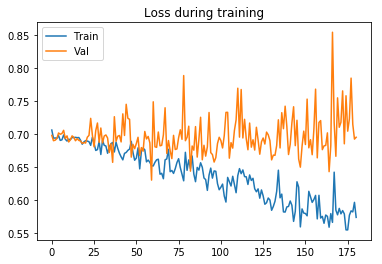

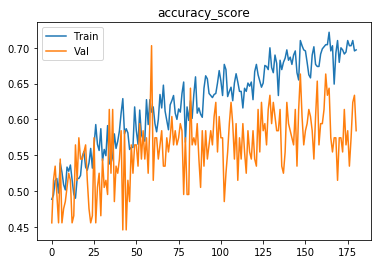

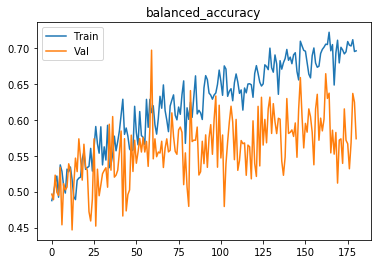

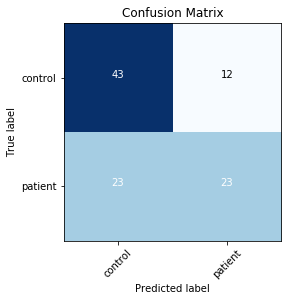

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69416
[0,     4] loss: 0.70172
Time elapsed: 0h:0m:8s
train accuracy_score: 48.12 %
train balanced_accuracy: 48.10 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.689895
[1,     2] loss: 0.69377
[1,     4] loss: 0.69685
Time elapsed: 0h:0m:19s
train accuracy_score: 52.03 %
train balanced_accuracy: 51.94 %
val accuracy_score: 47.52 %
val balanced_accuracy: 51.46 %
Val loss: 0.693198
[2,     2] loss: 0.69476
[2,     4] loss: 0.69397
Time elapsed: 0h:0m:29s
train accuracy_score: 47.54 %
train balanced_accuracy: 47.54 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691246
[3,     2] loss: 0.69313
[3,     4] loss: 0.69471
Time elapsed: 0h:0m:40s
train accuracy_score: 50.43 %
train balanced_accuracy: 50.07 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698367
[4,    

val accuracy_score: 41.58 %
val balanced_accuracy: 44.58 %
Val loss: 0.716700
[38,     2] loss: 0.68504
[38,     4] loss: 0.66951
Time elapsed: 0h:6m:46s
train accuracy_score: 54.49 %
train balanced_accuracy: 54.38 %
val accuracy_score: 54.46 %
val balanced_accuracy: 51.96 %
Val loss: 0.688692
[39,     2] loss: 0.67919
[39,     4] loss: 0.72436
Time elapsed: 0h:6m:57s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.89 %
val accuracy_score: 60.40 %
val balanced_accuracy: 57.41 %
Val loss: 0.687010
[40,     2] loss: 0.69690
[40,     4] loss: 0.68395
Time elapsed: 0h:7m:8s
train accuracy_score: 55.07 %
train balanced_accuracy: 55.59 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.07 %
Val loss: 0.686194
[41,     2] loss: 0.68248
[41,     4] loss: 0.71172
Time elapsed: 0h:7m:18s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.68 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.715847
[42,     2] loss: 0.69247
[42,     4] loss: 0.68526
Tim

val accuracy_score: 57.43 %
val balanced_accuracy: 56.46 %
Val loss: 0.671987
[76,     2] loss: 0.65068
[76,     4] loss: 0.65240
Time elapsed: 0h:13m:26s
train accuracy_score: 61.74 %
train balanced_accuracy: 61.65 %
val accuracy_score: 60.40 %
val balanced_accuracy: 60.08 %
Val loss: 0.666126
[77,     2] loss: 0.65554
[77,     4] loss: 0.63789
Time elapsed: 0h:13m:36s
train accuracy_score: 62.17 %
train balanced_accuracy: 62.25 %
val accuracy_score: 51.49 %
val balanced_accuracy: 53.50 %
Val loss: 0.724089
[78,     2] loss: 0.62458
[78,     4] loss: 0.65259
Time elapsed: 0h:13m:46s
train accuracy_score: 62.90 %
train balanced_accuracy: 62.96 %
val accuracy_score: 57.43 %
val balanced_accuracy: 56.46 %
Val loss: 0.694272
[79,     2] loss: 0.61371
[79,     4] loss: 0.68484
Time elapsed: 0h:13m:56s
train accuracy_score: 62.32 %
train balanced_accuracy: 62.01 %
val accuracy_score: 58.42 %
val balanced_accuracy: 56.13 %
Val loss: 0.683947
[80,     2] loss: 0.68590
[80,     4] loss: 0.6477

Time elapsed: 0h:19m:59s
train accuracy_score: 64.64 %
train balanced_accuracy: 64.62 %
val accuracy_score: 57.43 %
val balanced_accuracy: 55.75 %
Val loss: 0.682755
[114,     2] loss: 0.59965
[114,     4] loss: 0.60141
Time elapsed: 0h:20m:10s
train accuracy_score: 69.86 %
train balanced_accuracy: 69.84 %
val accuracy_score: 57.43 %
val balanced_accuracy: 56.11 %
Val loss: 0.685782
[115,     2] loss: 0.60229
[115,     4] loss: 0.58233
Time elapsed: 0h:20m:19s
train accuracy_score: 66.81 %
train balanced_accuracy: 66.84 %
val accuracy_score: 60.40 %
val balanced_accuracy: 59.55 %
Val loss: 0.643335
[116,     2] loss: 0.61001
[116,     4] loss: 0.64248
Time elapsed: 0h:20m:30s
train accuracy_score: 66.23 %
train balanced_accuracy: 66.34 %
val accuracy_score: 66.34 %
val balanced_accuracy: 66.60 %
Val loss: 0.630755
[117,     2] loss: 0.63457
[117,     4] loss: 0.59020
Time elapsed: 0h:20m:40s
train accuracy_score: 66.52 %
train balanced_accuracy: 66.57 %
val accuracy_score: 56.44 %
val 

val accuracy_score: 65.35 %
val balanced_accuracy: 66.05 %
Val loss: 0.640844
[151,     2] loss: 0.58559
[151,     4] loss: 0.54670
Time elapsed: 0h:26m:41s
train accuracy_score: 69.71 %
train balanced_accuracy: 69.73 %
val accuracy_score: 61.39 %
val balanced_accuracy: 60.28 %
Val loss: 0.649015
[152,     2] loss: 0.57625
[152,     4] loss: 0.58355
Time elapsed: 0h:26m:51s
train accuracy_score: 68.84 %
train balanced_accuracy: 68.75 %
val accuracy_score: 63.37 %
val balanced_accuracy: 62.63 %
Val loss: 0.710508
[153,     2] loss: 0.58014
[153,     4] loss: 0.59068
Time elapsed: 0h:27m:1s
train accuracy_score: 69.57 %
train balanced_accuracy: 69.79 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.07 %
Val loss: 0.707022
[154,     2] loss: 0.61989
[154,     4] loss: 0.58682
Time elapsed: 0h:27m:12s
train accuracy_score: 67.25 %
train balanced_accuracy: 67.11 %
val accuracy_score: 58.42 %
val balanced_accuracy: 56.84 %
Val loss: 0.674181
[155,     2] loss: 0.63463
[155,     4] los

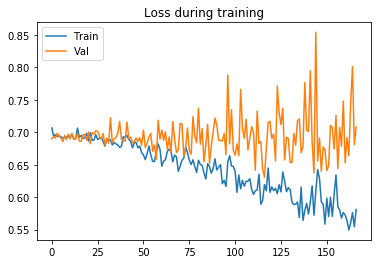

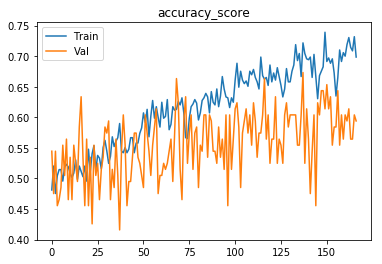

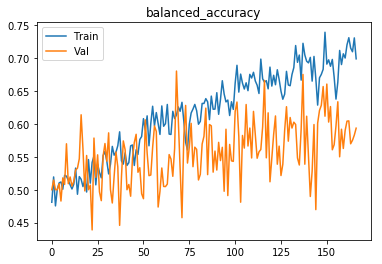

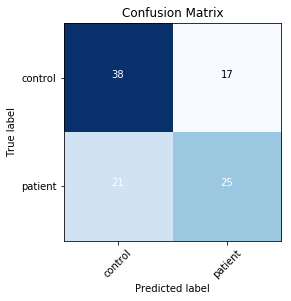

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69665
[0,     4] loss: 0.70401
Time elapsed: 0h:0m:8s
train accuracy_score: 46.09 %
train balanced_accuracy: 46.55 %
val accuracy_score: 53.47 %
val balanced_accuracy: 49.45 %
Val loss: 0.692399
[1,     2] loss: 0.69484
[1,     4] loss: 0.69110
Time elapsed: 0h:0m:18s
train accuracy_score: 50.29 %
train balanced_accuracy: 50.23 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697550
[2,     2] loss: 0.69404
[2,     4] loss: 0.69784
Time elapsed: 0h:0m:29s
train accuracy_score: 48.70 %
train balanced_accuracy: 48.97 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696004
[3,     2] loss: 0.69452
[3,     4] loss: 0.69222
Time elapsed: 0h:0m:40s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.42 %
val accuracy_score: 49.50 %
val balanced_accuracy: 50.97 %
Val loss: 0.694051
[4,    

val accuracy_score: 49.50 %
val balanced_accuracy: 50.43 %
Val loss: 0.693358
[38,     2] loss: 0.70168
[38,     4] loss: 0.67054
Time elapsed: 0h:6m:52s
train accuracy_score: 54.64 %
train balanced_accuracy: 54.60 %
val accuracy_score: 53.47 %
val balanced_accuracy: 54.60 %
Val loss: 0.702183
[39,     2] loss: 0.69159
[39,     4] loss: 0.69247
Time elapsed: 0h:7m:3s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.99 %
val accuracy_score: 49.50 %
val balanced_accuracy: 51.15 %
Val loss: 0.709378
[40,     2] loss: 0.69377
[40,     4] loss: 0.69472
Time elapsed: 0h:7m:13s
train accuracy_score: 53.33 %
train balanced_accuracy: 53.20 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.96 %
Val loss: 0.689865
[41,     2] loss: 0.70136
[41,     4] loss: 0.69281
Time elapsed: 0h:7m:24s
train accuracy_score: 50.58 %
train balanced_accuracy: 50.32 %
val accuracy_score: 45.54 %
val balanced_accuracy: 48.04 %
Val loss: 0.695396
[42,     2] loss: 0.68590
[42,     4] loss: 0.70140
Tim

val accuracy_score: 56.44 %
val balanced_accuracy: 58.75 %
Val loss: 0.701163
[76,     2] loss: 0.67488
[76,     4] loss: 0.65109
Time elapsed: 0h:13m:36s
train accuracy_score: 59.28 %
train balanced_accuracy: 59.23 %
val accuracy_score: 56.44 %
val balanced_accuracy: 54.66 %
Val loss: 0.692416
[77,     2] loss: 0.65914
[77,     4] loss: 0.65033
Time elapsed: 0h:13m:46s
train accuracy_score: 61.30 %
train balanced_accuracy: 61.20 %
val accuracy_score: 53.47 %
val balanced_accuracy: 53.89 %
Val loss: 0.686620
[78,     2] loss: 0.66054
[78,     4] loss: 0.67859
Time elapsed: 0h:13m:57s
train accuracy_score: 58.84 %
train balanced_accuracy: 58.79 %
val accuracy_score: 50.50 %
val balanced_accuracy: 50.28 %
Val loss: 0.692424
[79,     2] loss: 0.68620
[79,     4] loss: 0.64072
Time elapsed: 0h:14m:7s
train accuracy_score: 57.83 %
train balanced_accuracy: 57.46 %
val accuracy_score: 56.44 %
val balanced_accuracy: 53.77 %
Val loss: 0.674979
[80,     2] loss: 0.67707
[80,     4] loss: 0.66449

Time elapsed: 0h:20m:10s
train accuracy_score: 61.30 %
train balanced_accuracy: 61.36 %
val accuracy_score: 59.41 %
val balanced_accuracy: 57.75 %
Val loss: 0.673516
[114,     2] loss: 0.63872
[114,     4] loss: 0.62906
Time elapsed: 0h:20m:20s
train accuracy_score: 64.20 %
train balanced_accuracy: 64.01 %
val accuracy_score: 66.34 %
val balanced_accuracy: 65.53 %
Val loss: 0.651919
[115,     2] loss: 0.64703
[115,     4] loss: 0.67396
Time elapsed: 0h:20m:30s
train accuracy_score: 61.30 %
train balanced_accuracy: 61.53 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.78 %
Val loss: 0.699777
[116,     2] loss: 0.66697
[116,     4] loss: 0.59814
Time elapsed: 0h:20m:40s
train accuracy_score: 62.46 %
train balanced_accuracy: 62.30 %
val accuracy_score: 58.42 %
val balanced_accuracy: 56.84 %
Val loss: 0.664868
[117,     2] loss: 0.64364
[117,     4] loss: 0.63981
Time elapsed: 0h:20m:51s
train accuracy_score: 63.62 %
train balanced_accuracy: 63.55 %
val accuracy_score: 57.43 %
val 

val accuracy_score: 58.42 %
val balanced_accuracy: 58.97 %
Val loss: 0.683492
[151,     2] loss: 0.58170
[151,     4] loss: 0.56665
Time elapsed: 0h:26m:45s
train accuracy_score: 69.42 %
train balanced_accuracy: 69.36 %
val accuracy_score: 53.47 %
val balanced_accuracy: 51.94 %
Val loss: 0.716141
[152,     2] loss: 0.59218
[152,     4] loss: 0.64072
Time elapsed: 0h:26m:56s
train accuracy_score: 67.25 %
train balanced_accuracy: 67.24 %
val accuracy_score: 56.44 %
val balanced_accuracy: 57.69 %
Val loss: 0.710048
[153,     2] loss: 0.56991
[153,     4] loss: 0.65501
Time elapsed: 0h:27m:6s
train accuracy_score: 67.54 %
train balanced_accuracy: 67.58 %
val accuracy_score: 62.38 %
val balanced_accuracy: 61.72 %
Val loss: 0.668546
[154,     2] loss: 0.62022
[154,     4] loss: 0.56409
Time elapsed: 0h:27m:16s
train accuracy_score: 68.70 %
train balanced_accuracy: 68.66 %
val accuracy_score: 57.43 %
val balanced_accuracy: 56.28 %
Val loss: 0.730635
[155,     2] loss: 0.59414
[155,     4] los

[188,     2] loss: 0.54764
[188,     4] loss: 0.60363
Time elapsed: 0h:33m:10s
train accuracy_score: 71.45 %
train balanced_accuracy: 71.59 %
val accuracy_score: 55.45 %
val balanced_accuracy: 56.25 %
Val loss: 0.775790
Early stopping in epoch 189
Total time elapsed: 0h:33m:11s
Writing model to disk...
Best result during training: 0.68. Saving model..
Finished inner fold.


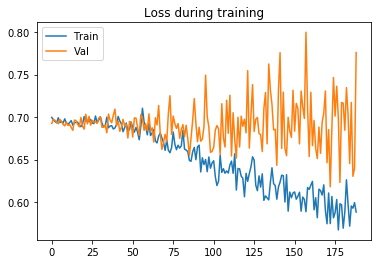

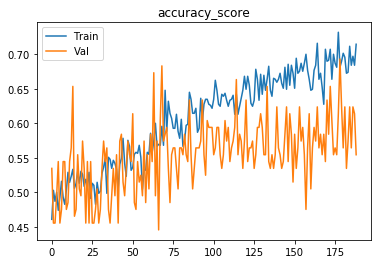

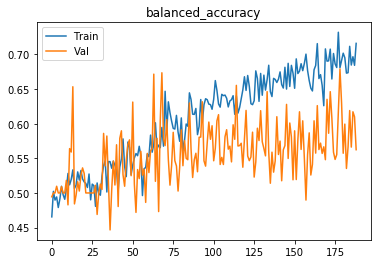

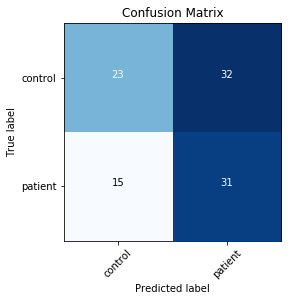

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69331
[0,     4] loss: 0.69882
Time elapsed: 0h:0m:8s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.93 %
val accuracy_score: 55.45 %
val balanced_accuracy: 52.51 %
Val loss: 0.692384
[1,     2] loss: 0.69956
[1,     4] loss: 0.69520
Time elapsed: 0h:0m:18s
train accuracy_score: 50.58 %
train balanced_accuracy: 50.15 %
val accuracy_score: 54.46 %
val balanced_accuracy: 51.07 %
Val loss: 0.691477
[2,     2] loss: 0.69314
[2,     4] loss: 0.69651
Time elapsed: 0h:0m:30s
train accuracy_score: 47.39 %
train balanced_accuracy: 47.27 %
val accuracy_score: 42.57 %
val balanced_accuracy: 44.07 %
Val loss: 0.694876
[3,     2] loss: 0.69374
[3,     4] loss: 0.69011
Time elapsed: 0h:0m:39s
train accuracy_score: 51.16 %
train balanced_accuracy: 50.78 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696524
[4,    

val accuracy_score: 48.51 %
val balanced_accuracy: 51.30 %
Val loss: 0.694258
[38,     2] loss: 0.67324
[38,     4] loss: 0.67427
Time elapsed: 0h:6m:48s
train accuracy_score: 57.68 %
train balanced_accuracy: 57.24 %
val accuracy_score: 60.40 %
val balanced_accuracy: 58.48 %
Val loss: 0.677039
[39,     2] loss: 0.64905
[39,     4] loss: 0.64792
Time elapsed: 0h:6m:58s
train accuracy_score: 61.59 %
train balanced_accuracy: 61.78 %
val accuracy_score: 44.55 %
val balanced_accuracy: 45.00 %
Val loss: 0.745660
[40,     2] loss: 0.64626
[40,     4] loss: 0.66995
Time elapsed: 0h:7m:7s
train accuracy_score: 59.86 %
train balanced_accuracy: 59.51 %
val accuracy_score: 54.46 %
val balanced_accuracy: 52.67 %
Val loss: 0.714596
[41,     2] loss: 0.70479
[41,     4] loss: 0.65031
Time elapsed: 0h:7m:17s
train accuracy_score: 58.70 %
train balanced_accuracy: 59.00 %
val accuracy_score: 49.50 %
val balanced_accuracy: 53.64 %
Val loss: 0.713423
[42,     2] loss: 0.69909
[42,     4] loss: 0.69290
Tim

val accuracy_score: 63.37 %
val balanced_accuracy: 63.16 %
Val loss: 0.626877
[76,     2] loss: 0.62917
[76,     4] loss: 0.61586
Time elapsed: 0h:13m:30s
train accuracy_score: 65.07 %
train balanced_accuracy: 65.02 %
val accuracy_score: 55.45 %
val balanced_accuracy: 53.40 %
Val loss: 0.687973
[77,     2] loss: 0.64644
[77,     4] loss: 0.65765
Time elapsed: 0h:13m:41s
train accuracy_score: 61.88 %
train balanced_accuracy: 61.89 %
val accuracy_score: 57.43 %
val balanced_accuracy: 56.46 %
Val loss: 0.686979
[78,     2] loss: 0.62191
[78,     4] loss: 0.67841
Time elapsed: 0h:13m:51s
train accuracy_score: 63.19 %
train balanced_accuracy: 63.53 %
val accuracy_score: 46.53 %
val balanced_accuracy: 49.31 %
Val loss: 0.777364
[79,     2] loss: 0.65001
[79,     4] loss: 0.61801
Time elapsed: 0h:14m:2s
train accuracy_score: 61.88 %
train balanced_accuracy: 61.58 %
val accuracy_score: 59.41 %
val balanced_accuracy: 57.39 %
Val loss: 0.692932
[80,     2] loss: 0.65297
[80,     4] loss: 0.59688

Time elapsed: 0h:20m:2s
train accuracy_score: 68.12 %
train balanced_accuracy: 68.03 %
val accuracy_score: 53.47 %
val balanced_accuracy: 51.58 %
Val loss: 0.670536
[114,     2] loss: 0.56884
[114,     4] loss: 0.58661
Time elapsed: 0h:20m:13s
train accuracy_score: 70.14 %
train balanced_accuracy: 70.13 %
val accuracy_score: 53.47 %
val balanced_accuracy: 53.89 %
Val loss: 0.731834
[115,     2] loss: 0.58495
[115,     4] loss: 0.55630
Time elapsed: 0h:20m:23s
train accuracy_score: 69.28 %
train balanced_accuracy: 69.34 %
val accuracy_score: 53.47 %
val balanced_accuracy: 54.60 %
Val loss: 0.706393
[116,     2] loss: 0.57670
[116,     4] loss: 0.60854
Time elapsed: 0h:20m:34s
train accuracy_score: 68.55 %
train balanced_accuracy: 68.51 %
val accuracy_score: 58.42 %
val balanced_accuracy: 58.97 %
Val loss: 0.688638
[117,     2] loss: 0.60256
[117,     4] loss: 0.58659
Time elapsed: 0h:20m:45s
train accuracy_score: 68.84 %
train balanced_accuracy: 68.83 %
val accuracy_score: 59.41 %
val b

val accuracy_score: 56.44 %
val balanced_accuracy: 56.09 %
Val loss: 0.738618
[151,     2] loss: 0.52970
[151,     4] loss: 0.54965
Time elapsed: 0h:26m:38s
train accuracy_score: 74.20 %
train balanced_accuracy: 74.29 %
val accuracy_score: 57.43 %
val balanced_accuracy: 58.24 %
Val loss: 0.775057
[152,     2] loss: 0.55418
[152,     4] loss: 0.54322
Time elapsed: 0h:26m:49s
train accuracy_score: 73.19 %
train balanced_accuracy: 73.14 %
val accuracy_score: 62.38 %
val balanced_accuracy: 61.72 %
Val loss: 0.656754
[153,     2] loss: 0.52672
[153,     4] loss: 0.53457
Time elapsed: 0h:26m:59s
train accuracy_score: 72.61 %
train balanced_accuracy: 72.52 %
val accuracy_score: 56.44 %
val balanced_accuracy: 55.02 %
Val loss: 0.752336
[154,     2] loss: 0.58257
[154,     4] loss: 0.56648
Time elapsed: 0h:27m:10s
train accuracy_score: 70.43 %
train balanced_accuracy: 70.56 %
val accuracy_score: 56.44 %
val balanced_accuracy: 57.33 %
Val loss: 0.702802
[155,     2] loss: 0.54050
[155,     4] lo

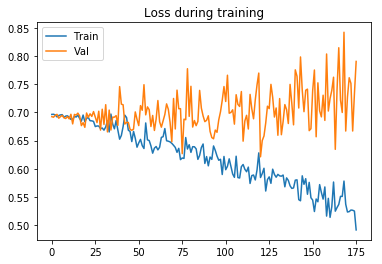

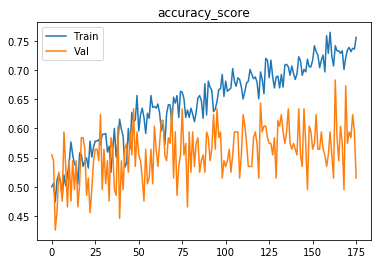

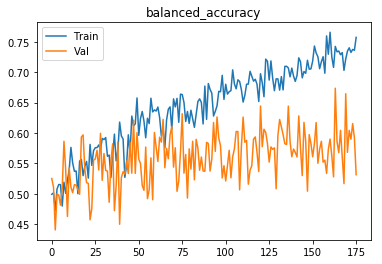

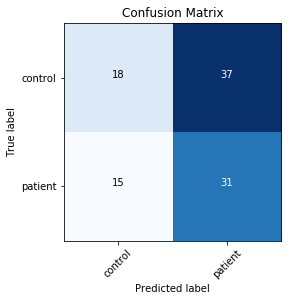

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69069
[0,     4] loss: 0.70930
Time elapsed: 0h:0m:8s
train accuracy_score: 49.28 %
train balanced_accuracy: 49.50 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705515
[1,     2] loss: 0.69276
[1,     4] loss: 0.69576
Time elapsed: 0h:0m:19s
train accuracy_score: 51.30 %
train balanced_accuracy: 50.60 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.686418
[2,     2] loss: 0.70055
[2,     4] loss: 0.69872
Time elapsed: 0h:0m:30s
train accuracy_score: 47.83 %
train balanced_accuracy: 47.75 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701995
[3,     2] loss: 0.69989
[3,     4] loss: 0.69714
Time elapsed: 0h:0m:41s
train accuracy_score: 48.99 %
train balanced_accuracy: 48.42 %
val accuracy_score: 53.47 %
val balanced_accuracy: 52.83 %
Val loss: 0.692433
[4,    

val accuracy_score: 49.50 %
val balanced_accuracy: 52.75 %
Val loss: 0.702448
[38,     2] loss: 0.69069
[38,     4] loss: 0.69364
Time elapsed: 0h:6m:52s
train accuracy_score: 52.03 %
train balanced_accuracy: 51.35 %
val accuracy_score: 44.55 %
val balanced_accuracy: 48.74 %
Val loss: 0.707891
[39,     2] loss: 0.68852
[39,     4] loss: 0.68655
Time elapsed: 0h:7m:2s
train accuracy_score: 54.06 %
train balanced_accuracy: 53.76 %
val accuracy_score: 52.48 %
val balanced_accuracy: 49.78 %
Val loss: 0.682725
[40,     2] loss: 0.67657
[40,     4] loss: 0.69012
Time elapsed: 0h:7m:12s
train accuracy_score: 56.52 %
train balanced_accuracy: 56.85 %
val accuracy_score: 52.48 %
val balanced_accuracy: 53.87 %
Val loss: 0.696961
[41,     2] loss: 0.67614
[41,     4] loss: 0.68074
Time elapsed: 0h:7m:23s
train accuracy_score: 56.52 %
train balanced_accuracy: 56.29 %
val accuracy_score: 62.38 %
val balanced_accuracy: 61.72 %
Val loss: 0.670059
[42,     2] loss: 0.68444
[42,     4] loss: 0.69289
Tim

val accuracy_score: 56.44 %
val balanced_accuracy: 55.91 %
Val loss: 0.690712
[76,     2] loss: 0.62259
[76,     4] loss: 0.64943
Time elapsed: 0h:13m:35s
train accuracy_score: 64.78 %
train balanced_accuracy: 64.83 %
val accuracy_score: 54.46 %
val balanced_accuracy: 54.45 %
Val loss: 0.688700
[77,     2] loss: 0.64413
[77,     4] loss: 0.62101
Time elapsed: 0h:13m:46s
train accuracy_score: 62.17 %
train balanced_accuracy: 62.22 %
val accuracy_score: 57.43 %
val balanced_accuracy: 57.35 %
Val loss: 0.707320
[78,     2] loss: 0.64168
[78,     4] loss: 0.65343
Time elapsed: 0h:13m:56s
train accuracy_score: 63.33 %
train balanced_accuracy: 63.48 %
val accuracy_score: 50.50 %
val balanced_accuracy: 52.23 %
Val loss: 0.727248
[79,     2] loss: 0.63477
[79,     4] loss: 0.65528
Time elapsed: 0h:14m:6s
train accuracy_score: 62.46 %
train balanced_accuracy: 62.37 %
val accuracy_score: 58.42 %
val balanced_accuracy: 57.19 %
Val loss: 0.675363
[80,     2] loss: 0.63934
[80,     4] loss: 0.62484

Time elapsed: 0h:20m:9s
train accuracy_score: 62.32 %
train balanced_accuracy: 62.73 %
val accuracy_score: 57.43 %
val balanced_accuracy: 56.46 %
Val loss: 0.687315
[114,     2] loss: 0.64391
[114,     4] loss: 0.68218
Time elapsed: 0h:20m:20s
train accuracy_score: 59.71 %
train balanced_accuracy: 59.43 %
val accuracy_score: 48.51 %
val balanced_accuracy: 50.77 %
Val loss: 0.716997
[115,     2] loss: 0.63453
[115,     4] loss: 0.60664
Time elapsed: 0h:20m:30s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.61 %
val accuracy_score: 62.38 %
val balanced_accuracy: 61.01 %
Val loss: 0.651434
[116,     2] loss: 0.64000
[116,     4] loss: 0.61877
Time elapsed: 0h:20m:40s
train accuracy_score: 64.78 %
train balanced_accuracy: 64.86 %
val accuracy_score: 57.43 %
val balanced_accuracy: 57.71 %
Val loss: 0.697257
[117,     2] loss: 0.61930
[117,     4] loss: 0.60090
Time elapsed: 0h:20m:50s
train accuracy_score: 66.52 %
train balanced_accuracy: 66.64 %
val accuracy_score: 52.48 %
val b

val accuracy_score: 52.48 %
val balanced_accuracy: 51.38 %
Val loss: 0.713167
[151,     2] loss: 0.60077
[151,     4] loss: 0.62214
Time elapsed: 0h:26m:46s
train accuracy_score: 67.39 %
train balanced_accuracy: 67.48 %
val accuracy_score: 57.43 %
val balanced_accuracy: 58.60 %
Val loss: 0.707633
[152,     2] loss: 0.60571
[152,     4] loss: 0.57048
Time elapsed: 0h:26m:57s
train accuracy_score: 66.52 %
train balanced_accuracy: 66.46 %
val accuracy_score: 53.47 %
val balanced_accuracy: 52.11 %
Val loss: 0.730508
[153,     2] loss: 0.59474
[153,     4] loss: 0.55493
Time elapsed: 0h:27m:8s
train accuracy_score: 69.57 %
train balanced_accuracy: 69.58 %
val accuracy_score: 57.43 %
val balanced_accuracy: 57.00 %
Val loss: 0.706381
[154,     2] loss: 0.55672
[154,     4] loss: 0.60495
Time elapsed: 0h:27m:18s
train accuracy_score: 70.29 %
train balanced_accuracy: 70.46 %
val accuracy_score: 59.41 %
val balanced_accuracy: 59.88 %
Val loss: 0.718922
[155,     2] loss: 0.58709
[155,     4] los

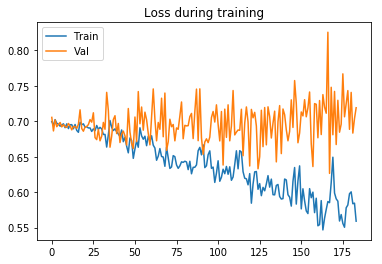

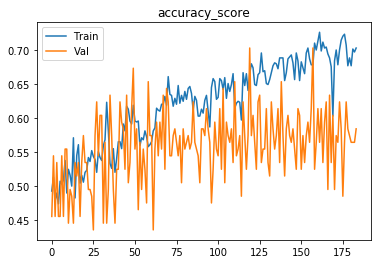

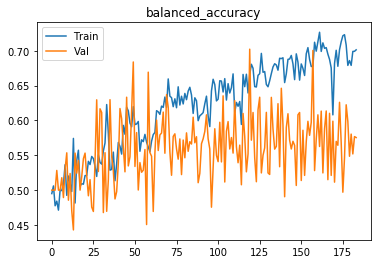

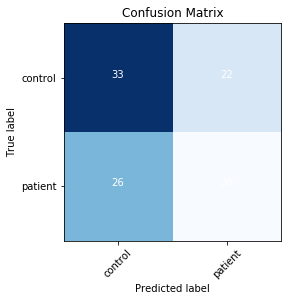

Finished outer fold.
{'final_acc': 0.5934782608695652, 'best_acc': 0.6604743083003951, 'final_iter': 167, 'best_iter': 69, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}
###### Starting outer fold 3
# of patients 405, # of healthy controls 401
708
98
(708, 96, 114, 96)
(98, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69718
[0,     4] loss: 0.70191
Time elapsed: 0h:0m:7s
train accuracy_score: 45.90 %
train balanced_accuracy: 46.15 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.702496
[1,     2] loss: 0.69438
[1,     4] loss: 0.69151
Time elapsed: 0h:0m:17s
train accuracy_score: 53.39 %
train balanced_accuracy: 52.29 %
val accuracy_score: 56.12 %
val balanced_accuracy: 51.62 %
Val loss: 0.690516
[2,     2] loss: 0.68922
[2,     4] loss: 0.69951
Time elapsed: 0h:0m:27s
train accuracy_score

[36,     2] loss: 0.67878
[36,     4] loss: 0.68749
Time elapsed: 0h:6m:25s
train accuracy_score: 53.67 %
train balanced_accuracy: 52.65 %
val accuracy_score: 47.96 %
val balanced_accuracy: 55.57 %
Val loss: 0.706702
[37,     2] loss: 0.66680
[37,     4] loss: 0.68442
Time elapsed: 0h:6m:36s
train accuracy_score: 57.34 %
train balanced_accuracy: 56.94 %
val accuracy_score: 61.22 %
val balanced_accuracy: 59.65 %
Val loss: 0.676582
[38,     2] loss: 0.68491
[38,     4] loss: 0.67182
Time elapsed: 0h:6m:46s
train accuracy_score: 56.50 %
train balanced_accuracy: 56.39 %
val accuracy_score: 54.08 %
val balanced_accuracy: 61.05 %
Val loss: 0.699760
[39,     2] loss: 0.67765
[39,     4] loss: 0.67278
Time elapsed: 0h:6m:57s
train accuracy_score: 58.90 %
train balanced_accuracy: 58.46 %
val accuracy_score: 70.41 %
val balanced_accuracy: 66.67 %
Val loss: 0.639332
[40,     2] loss: 0.67181
[40,     4] loss: 0.68952
Time elapsed: 0h:7m:8s
train accuracy_score: 58.90 %
train balanced_accuracy: 58

[74,     2] loss: 0.63895
[74,     4] loss: 0.64004
Time elapsed: 0h:13m:5s
train accuracy_score: 64.69 %
train balanced_accuracy: 64.69 %
val accuracy_score: 58.16 %
val balanced_accuracy: 61.01 %
Val loss: 0.686346
[75,     2] loss: 0.63975
[75,     4] loss: 0.64318
Time elapsed: 0h:13m:15s
train accuracy_score: 63.42 %
train balanced_accuracy: 62.88 %
val accuracy_score: 71.43 %
val balanced_accuracy: 66.05 %
Val loss: 0.608316
[76,     2] loss: 0.65977
[76,     4] loss: 0.65987
Time elapsed: 0h:13m:25s
train accuracy_score: 60.88 %
train balanced_accuracy: 61.21 %
val accuracy_score: 56.12 %
val balanced_accuracy: 61.75 %
Val loss: 0.721556
[77,     2] loss: 0.64934
[77,     4] loss: 0.70354
Time elapsed: 0h:13m:36s
train accuracy_score: 59.60 %
train balanced_accuracy: 60.16 %
val accuracy_score: 54.08 %
val balanced_accuracy: 58.64 %
Val loss: 0.709550
[78,     2] loss: 0.65050
[78,     4] loss: 0.61691
Time elapsed: 0h:13m:46s
train accuracy_score: 62.99 %
train balanced_accurac

val accuracy_score: 68.37 %
val balanced_accuracy: 70.79 %
Val loss: 0.609911
[112,     2] loss: 0.57270
[112,     4] loss: 0.60609
Time elapsed: 0h:19m:42s
train accuracy_score: 68.50 %
train balanced_accuracy: 68.36 %
val accuracy_score: 69.39 %
val balanced_accuracy: 68.73 %
Val loss: 0.624243
[113,     2] loss: 0.61142
[113,     4] loss: 0.60046
Time elapsed: 0h:19m:52s
train accuracy_score: 65.96 %
train balanced_accuracy: 65.91 %
val accuracy_score: 66.33 %
val balanced_accuracy: 67.19 %
Val loss: 0.611035
[114,     2] loss: 0.59426
[114,     4] loss: 0.58259
Time elapsed: 0h:20m:2s
train accuracy_score: 68.79 %
train balanced_accuracy: 68.86 %
val accuracy_score: 72.45 %
val balanced_accuracy: 71.71 %
Val loss: 0.606429
[115,     2] loss: 0.64681
[115,     4] loss: 0.60971
Time elapsed: 0h:20m:13s
train accuracy_score: 66.10 %
train balanced_accuracy: 66.07 %
val accuracy_score: 58.16 %
val balanced_accuracy: 58.11 %
Val loss: 0.673064
[116,     2] loss: 0.63751
[116,     4] los

[149,     2] loss: 0.58377
[149,     4] loss: 0.60220
Time elapsed: 0h:26m:18s
train accuracy_score: 68.64 %
train balanced_accuracy: 68.55 %
val accuracy_score: 60.20 %
val balanced_accuracy: 61.23 %
Val loss: 0.643053
[150,     2] loss: 0.57223
[150,     4] loss: 0.60311
Time elapsed: 0h:26m:29s
train accuracy_score: 70.62 %
train balanced_accuracy: 70.69 %
val accuracy_score: 59.18 %
val balanced_accuracy: 62.32 %
Val loss: 0.692629
[151,     2] loss: 0.58340
[151,     4] loss: 0.60306
Time elapsed: 0h:26m:39s
train accuracy_score: 69.77 %
train balanced_accuracy: 69.72 %
val accuracy_score: 63.27 %
val balanced_accuracy: 66.62 %
Val loss: 0.659552
[152,     2] loss: 0.60964
[152,     4] loss: 0.52746
Time elapsed: 0h:26m:50s
train accuracy_score: 69.35 %
train balanced_accuracy: 69.21 %
val accuracy_score: 70.41 %
val balanced_accuracy: 70.04 %
Val loss: 0.612704
[153,     2] loss: 0.57721
[153,     4] loss: 0.59391
Time elapsed: 0h:27m:1s
train accuracy_score: 69.07 %
train balanc

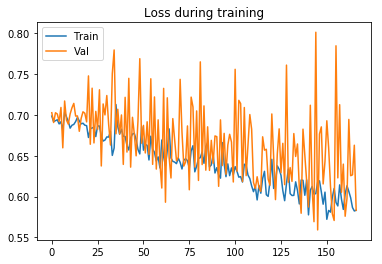

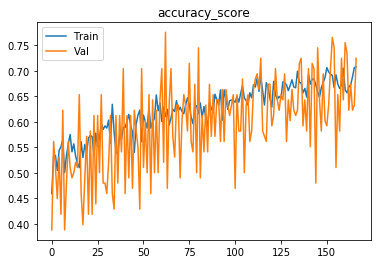

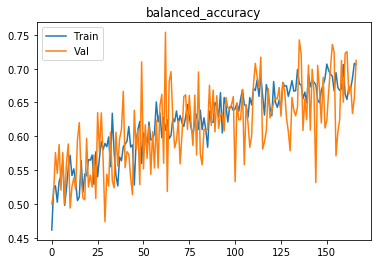

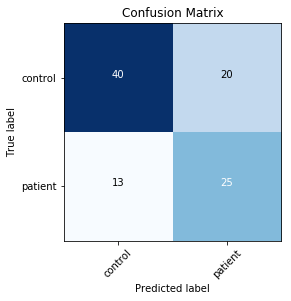

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69739
[0,     4] loss: 0.69069
Time elapsed: 0h:0m:8s
train accuracy_score: 51.84 %
train balanced_accuracy: 52.07 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.731294
[1,     2] loss: 0.69409
[1,     4] loss: 0.69236
Time elapsed: 0h:0m:19s
train accuracy_score: 50.28 %
train balanced_accuracy: 49.20 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.710024
[2,     2] loss: 0.68865
[2,     4] loss: 0.69143
Time elapsed: 0h:0m:30s
train accuracy_score: 54.38 %
train balanced_accuracy: 53.92 %
val accuracy_score: 64.29 %
val balanced_accuracy: 54.91 %
Val loss: 0.687258
[3,     2] loss: 0.69372
[3,     4] loss: 0.69245
Time elapsed: 0h:0m:40s
train accuracy_score: 51.84 %
train balanced_accuracy: 51.03 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.702470
[4,    

val accuracy_score: 55.10 %
val balanced_accuracy: 58.03 %
Val loss: 0.684153
[38,     2] loss: 0.65986
[38,     4] loss: 0.66534
Time elapsed: 0h:6m:48s
train accuracy_score: 59.89 %
train balanced_accuracy: 59.95 %
val accuracy_score: 58.16 %
val balanced_accuracy: 58.60 %
Val loss: 0.669810
[39,     2] loss: 0.66538
[39,     4] loss: 0.67985
Time elapsed: 0h:6m:58s
train accuracy_score: 58.62 %
train balanced_accuracy: 58.34 %
val accuracy_score: 56.12 %
val balanced_accuracy: 60.79 %
Val loss: 0.700718
[40,     2] loss: 0.65248
[40,     4] loss: 0.66544
Time elapsed: 0h:7m:9s
train accuracy_score: 61.02 %
train balanced_accuracy: 60.75 %
val accuracy_score: 62.24 %
val balanced_accuracy: 64.34 %
Val loss: 0.661252
[41,     2] loss: 0.67736
[41,     4] loss: 0.65287
Time elapsed: 0h:7m:19s
train accuracy_score: 59.32 %
train balanced_accuracy: 58.56 %
val accuracy_score: 60.20 %
val balanced_accuracy: 56.89 %
Val loss: 0.659837
[42,     2] loss: 0.70187
[42,     4] loss: 0.67103
Tim

val accuracy_score: 61.22 %
val balanced_accuracy: 57.24 %
Val loss: 0.649458
[76,     2] loss: 0.64500
[76,     4] loss: 0.64126
Time elapsed: 0h:13m:24s
train accuracy_score: 61.58 %
train balanced_accuracy: 61.59 %
val accuracy_score: 65.31 %
val balanced_accuracy: 67.32 %
Val loss: 0.638112
[77,     2] loss: 0.59592
[77,     4] loss: 0.62913
Time elapsed: 0h:13m:34s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.49 %
val accuracy_score: 70.41 %
val balanced_accuracy: 69.08 %
Val loss: 0.619305
[78,     2] loss: 0.62353
[78,     4] loss: 0.66750
Time elapsed: 0h:13m:44s
train accuracy_score: 63.42 %
train balanced_accuracy: 63.10 %
val accuracy_score: 67.35 %
val balanced_accuracy: 62.72 %
Val loss: 0.628092
[79,     2] loss: 0.63462
[79,     4] loss: 0.63238
Time elapsed: 0h:13m:55s
train accuracy_score: 64.97 %
train balanced_accuracy: 65.14 %
val accuracy_score: 56.12 %
val balanced_accuracy: 62.72 %
Val loss: 0.723599
[80,     2] loss: 0.64373
[80,     4] loss: 0.6301

Time elapsed: 0h:19m:47s
train accuracy_score: 69.49 %
train balanced_accuracy: 69.36 %
val accuracy_score: 65.31 %
val balanced_accuracy: 65.88 %
Val loss: 0.604993
[114,     2] loss: 0.57982
[114,     4] loss: 0.60143
Time elapsed: 0h:19m:58s
train accuracy_score: 68.93 %
train balanced_accuracy: 68.87 %
val accuracy_score: 70.41 %
val balanced_accuracy: 68.11 %
Val loss: 0.574404
[115,     2] loss: 0.59630
[115,     4] loss: 0.63237
Time elapsed: 0h:20m:8s
train accuracy_score: 65.82 %
train balanced_accuracy: 65.66 %
val accuracy_score: 67.35 %
val balanced_accuracy: 65.61 %
Val loss: 0.584651
[116,     2] loss: 0.58711
[116,     4] loss: 0.56225
Time elapsed: 0h:20m:19s
train accuracy_score: 68.08 %
train balanced_accuracy: 68.06 %
val accuracy_score: 60.20 %
val balanced_accuracy: 64.12 %
Val loss: 0.707961
[117,     2] loss: 0.57379
[117,     4] loss: 0.60757
Time elapsed: 0h:20m:30s
train accuracy_score: 67.37 %
train balanced_accuracy: 67.33 %
val accuracy_score: 66.33 %
val b

val accuracy_score: 63.27 %
val balanced_accuracy: 62.28 %
Val loss: 0.700162
[151,     2] loss: 0.52592
[151,     4] loss: 0.57632
Time elapsed: 0h:26m:31s
train accuracy_score: 71.89 %
train balanced_accuracy: 71.96 %
val accuracy_score: 68.37 %
val balanced_accuracy: 67.89 %
Val loss: 0.615605
[152,     2] loss: 0.56036
[152,     4] loss: 0.60524
Time elapsed: 0h:26m:41s
train accuracy_score: 69.21 %
train balanced_accuracy: 69.07 %
val accuracy_score: 69.39 %
val balanced_accuracy: 63.90 %
Val loss: 0.589044
[153,     2] loss: 0.59552
[153,     4] loss: 0.57894
Time elapsed: 0h:26m:51s
train accuracy_score: 68.93 %
train balanced_accuracy: 69.14 %
val accuracy_score: 56.12 %
val balanced_accuracy: 61.27 %
Val loss: 0.759138
[154,     2] loss: 0.53150
[154,     4] loss: 0.54060
Time elapsed: 0h:27m:2s
train accuracy_score: 72.88 %
train balanced_accuracy: 72.79 %
val accuracy_score: 58.16 %
val balanced_accuracy: 58.60 %
Val loss: 0.693028
[155,     2] loss: 0.51675
[155,     4] los

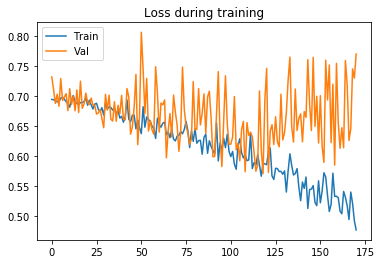

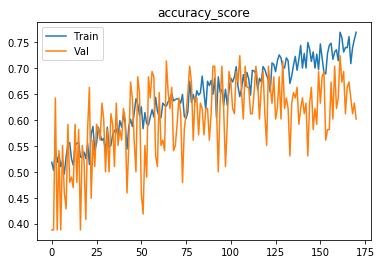

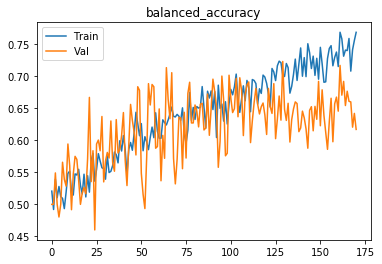

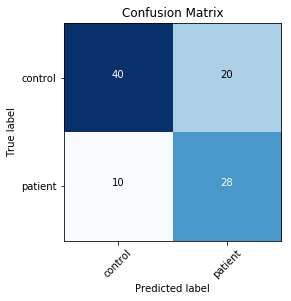

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69312
[0,     4] loss: 0.69880
Time elapsed: 0h:0m:8s
train accuracy_score: 51.13 %
train balanced_accuracy: 50.75 %
val accuracy_score: 41.84 %
val balanced_accuracy: 52.02 %
Val loss: 0.696877
[1,     2] loss: 0.70609
[1,     4] loss: 0.69504
Time elapsed: 0h:0m:19s
train accuracy_score: 48.59 %
train balanced_accuracy: 49.39 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.710978
[2,     2] loss: 0.69258
[2,     4] loss: 0.70536
Time elapsed: 0h:0m:30s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.70 %
val accuracy_score: 61.22 %
val balanced_accuracy: 50.00 %
Val loss: 0.680633
[3,     2] loss: 0.69913
[3,     4] loss: 0.69549
Time elapsed: 0h:0m:40s
train accuracy_score: 47.03 %
train balanced_accuracy: 48.01 %
val accuracy_score: 46.94 %
val balanced_accuracy: 53.29 %
Val loss: 0.694080
[4,    

val accuracy_score: 68.37 %
val balanced_accuracy: 64.52 %
Val loss: 0.642692
[38,     2] loss: 0.67223
[38,     4] loss: 0.71143
Time elapsed: 0h:6m:48s
train accuracy_score: 58.90 %
train balanced_accuracy: 58.60 %
val accuracy_score: 53.06 %
val balanced_accuracy: 50.57 %
Val loss: 0.664484
[39,     2] loss: 0.66237
[39,     4] loss: 0.64707
Time elapsed: 0h:6m:59s
train accuracy_score: 59.60 %
train balanced_accuracy: 59.88 %
val accuracy_score: 45.92 %
val balanced_accuracy: 51.97 %
Val loss: 0.711917
[40,     2] loss: 0.67472
[40,     4] loss: 0.65999
Time elapsed: 0h:7m:9s
train accuracy_score: 58.90 %
train balanced_accuracy: 58.51 %
val accuracy_score: 66.33 %
val balanced_accuracy: 67.19 %
Val loss: 0.637849
[41,     2] loss: 0.66800
[41,     4] loss: 0.65637
Time elapsed: 0h:7m:20s
train accuracy_score: 59.60 %
train balanced_accuracy: 59.19 %
val accuracy_score: 70.41 %
val balanced_accuracy: 68.11 %
Val loss: 0.641129
[42,     2] loss: 0.65533
[42,     4] loss: 0.64510
Tim

val accuracy_score: 56.12 %
val balanced_accuracy: 59.34 %
Val loss: 0.703983
[76,     2] loss: 0.64787
[76,     4] loss: 0.60195
Time elapsed: 0h:13m:28s
train accuracy_score: 63.42 %
train balanced_accuracy: 63.07 %
val accuracy_score: 67.35 %
val balanced_accuracy: 65.61 %
Val loss: 0.609558
[77,     2] loss: 0.63913
[77,     4] loss: 0.62470
Time elapsed: 0h:13m:38s
train accuracy_score: 63.14 %
train balanced_accuracy: 63.07 %
val accuracy_score: 61.22 %
val balanced_accuracy: 63.03 %
Val loss: 0.675079
[78,     2] loss: 0.60420
[78,     4] loss: 0.63109
Time elapsed: 0h:13m:50s
train accuracy_score: 65.82 %
train balanced_accuracy: 66.03 %
val accuracy_score: 56.12 %
val balanced_accuracy: 60.79 %
Val loss: 0.685150
[79,     2] loss: 0.61494
[79,     4] loss: 0.59057
Time elapsed: 0h:14m:1s
train accuracy_score: 67.23 %
train balanced_accuracy: 66.83 %
val accuracy_score: 63.27 %
val balanced_accuracy: 63.25 %
Val loss: 0.622155
[80,     2] loss: 0.62967
[80,     4] loss: 0.62092

Time elapsed: 0h:20m:12s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.51 %
val accuracy_score: 72.45 %
val balanced_accuracy: 70.75 %
Val loss: 0.587979
[114,     2] loss: 0.59507
[114,     4] loss: 0.61524
Time elapsed: 0h:20m:23s
train accuracy_score: 69.07 %
train balanced_accuracy: 69.20 %
val accuracy_score: 59.18 %
val balanced_accuracy: 62.32 %
Val loss: 0.678340
[115,     2] loss: 0.57154
[115,     4] loss: 0.60042
Time elapsed: 0h:20m:34s
train accuracy_score: 68.50 %
train balanced_accuracy: 68.63 %
val accuracy_score: 60.20 %
val balanced_accuracy: 64.12 %
Val loss: 0.723523
[116,     2] loss: 0.58922
[116,     4] loss: 0.61420
Time elapsed: 0h:20m:45s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.31 %
val accuracy_score: 71.43 %
val balanced_accuracy: 67.02 %
Val loss: 0.630049
[117,     2] loss: 0.60182
[117,     4] loss: 0.62664
Time elapsed: 0h:20m:56s
train accuracy_score: 66.53 %
train balanced_accuracy: 66.37 %
val accuracy_score: 62.24 %
val 

val accuracy_score: 68.37 %
val balanced_accuracy: 67.89 %
Val loss: 0.607799
[151,     2] loss: 0.56367
[151,     4] loss: 0.52700
Time elapsed: 0h:26m:58s
train accuracy_score: 74.58 %
train balanced_accuracy: 74.71 %
val accuracy_score: 51.02 %
val balanced_accuracy: 58.07 %
Val loss: 0.773748
[152,     2] loss: 0.56292
[152,     4] loss: 0.62943
Time elapsed: 0h:27m:8s
train accuracy_score: 67.94 %
train balanced_accuracy: 67.68 %
val accuracy_score: 67.35 %
val balanced_accuracy: 63.68 %
Val loss: 0.610944
[153,     2] loss: 0.56277
[153,     4] loss: 0.54645
Time elapsed: 0h:27m:19s
train accuracy_score: 70.76 %
train balanced_accuracy: 70.79 %
val accuracy_score: 59.18 %
val balanced_accuracy: 63.29 %
Val loss: 0.764128
[154,     2] loss: 0.54124
[154,     4] loss: 0.56063
Time elapsed: 0h:27m:30s
train accuracy_score: 74.15 %
train balanced_accuracy: 74.08 %
val accuracy_score: 60.20 %
val balanced_accuracy: 60.75 %
Val loss: 0.704495
[155,     2] loss: 0.55263
[155,     4] los

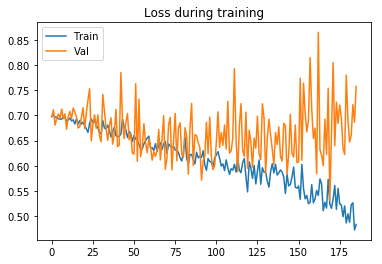

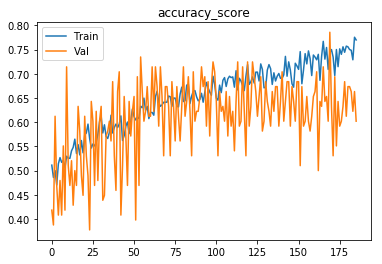

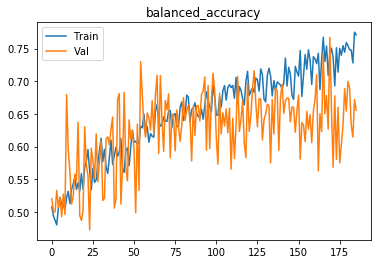

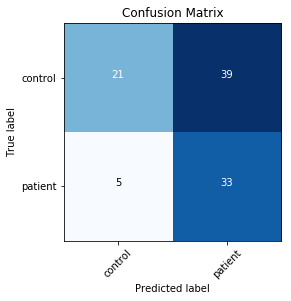

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69855
[0,     4] loss: 0.69428
Time elapsed: 0h:0m:9s
train accuracy_score: 49.86 %
train balanced_accuracy: 49.01 %
val accuracy_score: 43.88 %
val balanced_accuracy: 45.48 %
Val loss: 0.704725
[1,     2] loss: 0.69551
[1,     4] loss: 0.69783
Time elapsed: 0h:0m:20s
train accuracy_score: 49.29 %
train balanced_accuracy: 49.07 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.715483
[2,     2] loss: 0.69289
[2,     4] loss: 0.69658
Time elapsed: 0h:0m:32s
train accuracy_score: 49.15 %
train balanced_accuracy: 48.02 %
val accuracy_score: 54.08 %
val balanced_accuracy: 59.61 %
Val loss: 0.693827
[3,     2] loss: 0.69516
[3,     4] loss: 0.68150
Time elapsed: 0h:0m:42s
train accuracy_score: 53.53 %
train balanced_accuracy: 53.23 %
val accuracy_score: 40.82 %
val balanced_accuracy: 50.70 %
Val loss: 0.709525
[4,    

val accuracy_score: 66.33 %
val balanced_accuracy: 62.85 %
Val loss: 0.656402
[38,     2] loss: 0.67098
[38,     4] loss: 0.65195
Time elapsed: 0h:6m:53s
train accuracy_score: 60.59 %
train balanced_accuracy: 60.65 %
val accuracy_score: 54.08 %
val balanced_accuracy: 59.61 %
Val loss: 0.714755
[39,     2] loss: 0.68633
[39,     4] loss: 0.62048
Time elapsed: 0h:7m:3s
train accuracy_score: 62.85 %
train balanced_accuracy: 62.40 %
val accuracy_score: 61.22 %
val balanced_accuracy: 61.10 %
Val loss: 0.657970
[40,     2] loss: 0.65344
[40,     4] loss: 0.67522
Time elapsed: 0h:7m:14s
train accuracy_score: 58.33 %
train balanced_accuracy: 58.26 %
val accuracy_score: 68.37 %
val balanced_accuracy: 63.55 %
Val loss: 0.618565
[41,     2] loss: 0.66052
[41,     4] loss: 0.64895
Time elapsed: 0h:7m:24s
train accuracy_score: 62.01 %
train balanced_accuracy: 62.12 %
val accuracy_score: 52.04 %
val balanced_accuracy: 56.97 %
Val loss: 0.721118
[42,     2] loss: 0.63614
[42,     4] loss: 0.64562
Tim

val accuracy_score: 57.14 %
val balanced_accuracy: 63.55 %
Val loss: 0.718936
[76,     2] loss: 0.62933
[76,     4] loss: 0.64130
Time elapsed: 0h:13m:44s
train accuracy_score: 63.56 %
train balanced_accuracy: 63.45 %
val accuracy_score: 72.45 %
val balanced_accuracy: 69.78 %
Val loss: 0.597743
[77,     2] loss: 0.64479
[77,     4] loss: 0.64884
Time elapsed: 0h:13m:55s
train accuracy_score: 61.86 %
train balanced_accuracy: 61.44 %
val accuracy_score: 64.29 %
val balanced_accuracy: 62.15 %
Val loss: 0.668005
[78,     2] loss: 0.62340
[78,     4] loss: 0.61899
Time elapsed: 0h:14m:6s
train accuracy_score: 65.68 %
train balanced_accuracy: 66.13 %
val accuracy_score: 55.10 %
val balanced_accuracy: 60.44 %
Val loss: 0.687677
[79,     2] loss: 0.61116
[79,     4] loss: 0.59959
Time elapsed: 0h:14m:16s
train accuracy_score: 66.53 %
train balanced_accuracy: 66.14 %
val accuracy_score: 69.39 %
val balanced_accuracy: 66.32 %
Val loss: 0.615836
[80,     2] loss: 0.61983
[80,     4] loss: 0.63347

Time elapsed: 0h:20m:20s
train accuracy_score: 66.10 %
train balanced_accuracy: 66.23 %
val accuracy_score: 58.16 %
val balanced_accuracy: 61.49 %
Val loss: 0.685508
[114,     2] loss: 0.60440
[114,     4] loss: 0.66212
Time elapsed: 0h:20m:30s
train accuracy_score: 64.12 %
train balanced_accuracy: 63.61 %
val accuracy_score: 68.37 %
val balanced_accuracy: 61.62 %
Val loss: 0.604168
[115,     2] loss: 0.64399
[115,     4] loss: 0.60518
Time elapsed: 0h:20m:41s
train accuracy_score: 65.96 %
train balanced_accuracy: 66.38 %
val accuracy_score: 54.08 %
val balanced_accuracy: 60.09 %
Val loss: 0.733855
[116,     2] loss: 0.63011
[116,     4] loss: 0.59010
Time elapsed: 0h:20m:52s
train accuracy_score: 66.81 %
train balanced_accuracy: 66.42 %
val accuracy_score: 69.39 %
val balanced_accuracy: 65.35 %
Val loss: 0.606042
[117,     2] loss: 0.61788
[117,     4] loss: 0.57052
Time elapsed: 0h:21m:2s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.73 %
val accuracy_score: 57.14 %
val b

val accuracy_score: 73.47 %
val balanced_accuracy: 74.96 %
Val loss: 0.590708
[151,     2] loss: 0.54756
[151,     4] loss: 0.54950
Time elapsed: 0h:26m:56s
train accuracy_score: 72.46 %
train balanced_accuracy: 72.45 %
val accuracy_score: 68.37 %
val balanced_accuracy: 69.34 %
Val loss: 0.618811
[152,     2] loss: 0.52630
[152,     4] loss: 0.58647
Time elapsed: 0h:27m:7s
train accuracy_score: 71.19 %
train balanced_accuracy: 71.17 %
val accuracy_score: 71.43 %
val balanced_accuracy: 71.36 %
Val loss: 0.574939
[153,     2] loss: 0.55497
[153,     4] loss: 0.52644
Time elapsed: 0h:27m:18s
train accuracy_score: 72.32 %
train balanced_accuracy: 72.35 %
val accuracy_score: 58.16 %
val balanced_accuracy: 61.01 %
Val loss: 0.698583
[154,     2] loss: 0.58448
[154,     4] loss: 0.52902
Time elapsed: 0h:27m:28s
train accuracy_score: 70.48 %
train balanced_accuracy: 70.40 %
val accuracy_score: 73.47 %
val balanced_accuracy: 70.13 %
Val loss: 0.589542
[155,     2] loss: 0.56694
[155,     4] los

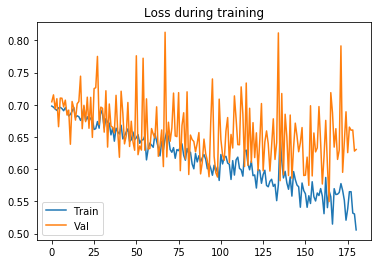

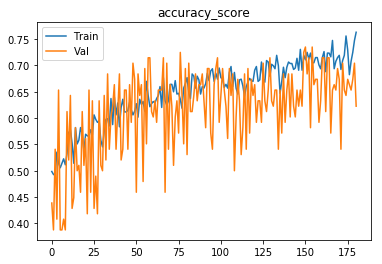

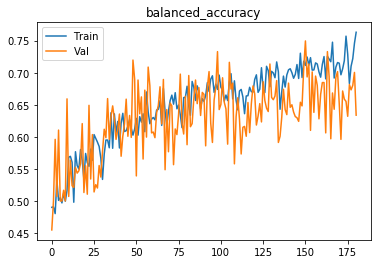

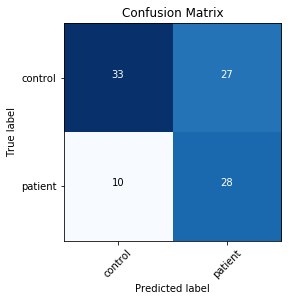

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70207
[0,     4] loss: 0.70503
Time elapsed: 0h:0m:8s
train accuracy_score: 49.58 %
train balanced_accuracy: 49.06 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.709194
[1,     2] loss: 0.69063
[1,     4] loss: 0.69334
Time elapsed: 0h:0m:19s
train accuracy_score: 53.95 %
train balanced_accuracy: 52.45 %
val accuracy_score: 55.10 %
val balanced_accuracy: 53.68 %
Val loss: 0.692971
[2,     2] loss: 0.69143
[2,     4] loss: 0.69343
Time elapsed: 0h:0m:30s
train accuracy_score: 51.84 %
train balanced_accuracy: 51.92 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.698132
[3,     2] loss: 0.69164
[3,     4] loss: 0.68842
Time elapsed: 0h:0m:40s
train accuracy_score: 52.26 %
train balanced_accuracy: 51.17 %
val accuracy_score: 38.78 %
val balanced_accuracy: 50.00 %
Val loss: 0.703534
[4,    

val accuracy_score: 53.06 %
val balanced_accuracy: 52.02 %
Val loss: 0.675438
[38,     2] loss: 0.69709
[38,     4] loss: 0.71179
Time elapsed: 0h:6m:58s
train accuracy_score: 52.40 %
train balanced_accuracy: 51.86 %
val accuracy_score: 61.22 %
val balanced_accuracy: 52.41 %
Val loss: 0.646986
[39,     2] loss: 0.69329
[39,     4] loss: 0.66811
Time elapsed: 0h:7m:9s
train accuracy_score: 56.92 %
train balanced_accuracy: 57.34 %
val accuracy_score: 41.84 %
val balanced_accuracy: 52.02 %
Val loss: 0.718768
[40,     2] loss: 0.69074
[40,     4] loss: 0.67788
Time elapsed: 0h:7m:20s
train accuracy_score: 55.51 %
train balanced_accuracy: 54.66 %
val accuracy_score: 48.98 %
val balanced_accuracy: 48.68 %
Val loss: 0.711017
[41,     2] loss: 0.68567
[41,     4] loss: 0.67469
Time elapsed: 0h:7m:31s
train accuracy_score: 57.77 %
train balanced_accuracy: 57.45 %
val accuracy_score: 44.90 %
val balanced_accuracy: 54.52 %
Val loss: 0.703904
[42,     2] loss: 0.67737
[42,     4] loss: 0.68981
Tim

val accuracy_score: 66.33 %
val balanced_accuracy: 67.68 %
Val loss: 0.643458
[76,     2] loss: 0.64668
[76,     4] loss: 0.63251
Time elapsed: 0h:13m:44s
train accuracy_score: 62.15 %
train balanced_accuracy: 61.61 %
val accuracy_score: 64.29 %
val balanced_accuracy: 62.15 %
Val loss: 0.648511
[77,     2] loss: 0.64885
[77,     4] loss: 0.64971
Time elapsed: 0h:13m:55s
train accuracy_score: 61.44 %
train balanced_accuracy: 61.33 %
val accuracy_score: 61.22 %
val balanced_accuracy: 64.47 %
Val loss: 0.671467
[78,     2] loss: 0.63831
[78,     4] loss: 0.62530
Time elapsed: 0h:14m:6s
train accuracy_score: 61.72 %
train balanced_accuracy: 61.73 %
val accuracy_score: 56.12 %
val balanced_accuracy: 60.31 %
Val loss: 0.665133
[79,     2] loss: 0.62939
[79,     4] loss: 0.60397
Time elapsed: 0h:14m:18s
train accuracy_score: 65.82 %
train balanced_accuracy: 65.76 %
val accuracy_score: 46.94 %
val balanced_accuracy: 54.74 %
Val loss: 0.800326
[80,     2] loss: 0.68399
[80,     4] loss: 0.60413

Time elapsed: 0h:20m:28s
train accuracy_score: 65.11 %
train balanced_accuracy: 64.98 %
val accuracy_score: 54.08 %
val balanced_accuracy: 56.71 %
Val loss: 0.708288
[114,     2] loss: 0.64578
[114,     4] loss: 0.63472
Time elapsed: 0h:20m:38s
train accuracy_score: 62.01 %
train balanced_accuracy: 62.25 %
val accuracy_score: 46.94 %
val balanced_accuracy: 55.22 %
Val loss: 0.800351
[115,     2] loss: 0.66450
[115,     4] loss: 0.63452
Time elapsed: 0h:20m:49s
train accuracy_score: 60.73 %
train balanced_accuracy: 60.63 %
val accuracy_score: 73.47 %
val balanced_accuracy: 71.10 %
Val loss: 0.623822
[116,     2] loss: 0.59979
[116,     4] loss: 0.65198
Time elapsed: 0h:21m:1s
train accuracy_score: 64.97 %
train balanced_accuracy: 64.55 %
val accuracy_score: 63.27 %
val balanced_accuracy: 65.18 %
Val loss: 0.689028
[117,     2] loss: 0.64464
[117,     4] loss: 0.66555
Time elapsed: 0h:21m:11s
train accuracy_score: 60.73 %
train balanced_accuracy: 61.37 %
val accuracy_score: 72.45 %
val b

val accuracy_score: 59.18 %
val balanced_accuracy: 60.88 %
Val loss: 0.679377
[151,     2] loss: 0.58062
[151,     4] loss: 0.60868
Time elapsed: 0h:27m:19s
train accuracy_score: 69.07 %
train balanced_accuracy: 68.95 %
val accuracy_score: 64.29 %
val balanced_accuracy: 64.08 %
Val loss: 0.664635
[152,     2] loss: 0.56638
[152,     4] loss: 0.61063
Time elapsed: 0h:27m:31s
train accuracy_score: 70.06 %
train balanced_accuracy: 70.01 %
val accuracy_score: 66.33 %
val balanced_accuracy: 66.23 %
Val loss: 0.589676
[153,     2] loss: 0.57922
[153,     4] loss: 0.55094
Time elapsed: 0h:27m:42s
train accuracy_score: 69.35 %
train balanced_accuracy: 69.27 %
val accuracy_score: 68.37 %
val balanced_accuracy: 65.96 %
Val loss: 0.632863
[154,     2] loss: 0.57494
[154,     4] loss: 0.58023
Time elapsed: 0h:27m:53s
train accuracy_score: 72.03 %
train balanced_accuracy: 72.00 %
val accuracy_score: 61.22 %
val balanced_accuracy: 62.06 %
Val loss: 0.663780
[155,     2] loss: 0.57974
[155,     4] lo

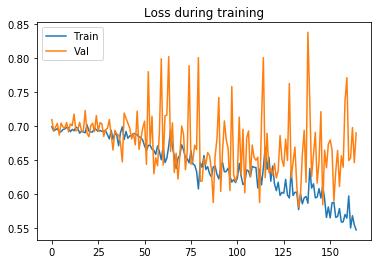

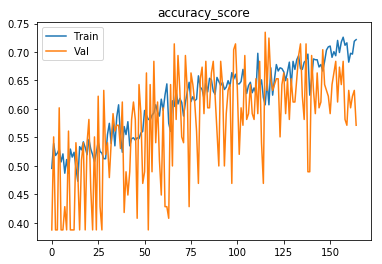

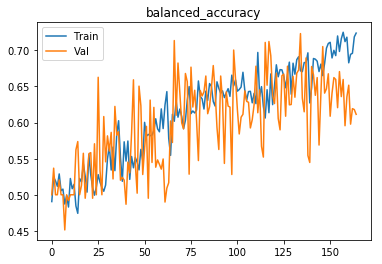

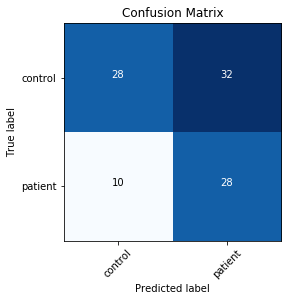

Finished outer fold.
{'final_acc': 0.712280701754386, 'best_acc': 0.7359649122807017, 'final_iter': 167, 'best_iter': 63, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 4
# of patients 402, # of healthy controls 398
696
104
(696, 96, 114, 96)
(104, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70141
[0,     4] loss: 0.69516
Time elapsed: 0h:0m:7s
train accuracy_score: 47.56 %
train balanced_accuracy: 47.93 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.69 %
Val loss: 0.699673
[1,     2] loss: 0.69878
[1,     4] loss: 0.68836
Time elapsed: 0h:0m:17s
train accuracy_score: 51.72 %
train balanced_accuracy: 51.28 %
val accuracy_score: 51.92 %
val balanced_accuracy: 49.98 %
Val loss: 0.692083
[2,     2] loss: 0.70225
[2,     4] loss: 0.69494
Time elapsed: 0h:0m:29s
train accuracy_scor

[36,     2] loss: 0.70651
[36,     4] loss: 0.67772
Time elapsed: 0h:6m:33s
train accuracy_score: 53.02 %
train balanced_accuracy: 52.47 %
val accuracy_score: 64.42 %
val balanced_accuracy: 62.69 %
Val loss: 0.664522
[37,     2] loss: 0.68429
[37,     4] loss: 0.69033
Time elapsed: 0h:6m:44s
train accuracy_score: 54.60 %
train balanced_accuracy: 55.01 %
val accuracy_score: 59.62 %
val balanced_accuracy: 60.36 %
Val loss: 0.664353
[38,     2] loss: 0.67825
[38,     4] loss: 0.67617
Time elapsed: 0h:6m:55s
train accuracy_score: 56.47 %
train balanced_accuracy: 56.14 %
val accuracy_score: 65.38 %
val balanced_accuracy: 64.87 %
Val loss: 0.664571
[39,     2] loss: 0.67030
[39,     4] loss: 0.70648
Time elapsed: 0h:7m:6s
train accuracy_score: 58.62 %
train balanced_accuracy: 58.85 %
val accuracy_score: 64.42 %
val balanced_accuracy: 64.18 %
Val loss: 0.657596
[40,     2] loss: 0.66855
[40,     4] loss: 0.65425
Time elapsed: 0h:7m:16s
train accuracy_score: 59.77 %
train balanced_accuracy: 59

[74,     2] loss: 0.63894
[74,     4] loss: 0.58958
Time elapsed: 0h:13m:21s
train accuracy_score: 65.37 %
train balanced_accuracy: 65.44 %
val accuracy_score: 66.35 %
val balanced_accuracy: 68.18 %
Val loss: 0.622783
[75,     2] loss: 0.63552
[75,     4] loss: 0.61511
Time elapsed: 0h:13m:32s
train accuracy_score: 63.94 %
train balanced_accuracy: 64.03 %
val accuracy_score: 58.65 %
val balanced_accuracy: 60.23 %
Val loss: 0.640281
[76,     2] loss: 0.62319
[76,     4] loss: 0.61901
Time elapsed: 0h:13m:44s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.65 %
val accuracy_score: 68.27 %
val balanced_accuracy: 68.25 %
Val loss: 0.605564
[77,     2] loss: 0.58671
[77,     4] loss: 0.63809
Time elapsed: 0h:13m:54s
train accuracy_score: 66.09 %
train balanced_accuracy: 66.12 %
val accuracy_score: 62.50 %
val balanced_accuracy: 62.06 %
Val loss: 0.619719
[78,     2] loss: 0.63622
[78,     4] loss: 0.60689
Time elapsed: 0h:14m:6s
train accuracy_score: 63.94 %
train balanced_accurac

val accuracy_score: 62.50 %
val balanced_accuracy: 58.88 %
Val loss: 0.634443
[112,     2] loss: 0.64790
[112,     4] loss: 0.57810
Time elapsed: 0h:20m:9s
train accuracy_score: 66.81 %
train balanced_accuracy: 67.07 %
val accuracy_score: 66.35 %
val balanced_accuracy: 67.81 %
Val loss: 0.619527
[113,     2] loss: 0.63188
[113,     4] loss: 0.60710
Time elapsed: 0h:20m:21s
train accuracy_score: 62.93 %
train balanced_accuracy: 63.03 %
val accuracy_score: 65.38 %
val balanced_accuracy: 64.13 %
Val loss: 0.616950
[114,     2] loss: 0.64133
[114,     4] loss: 0.63157
Time elapsed: 0h:20m:32s
train accuracy_score: 64.22 %
train balanced_accuracy: 63.88 %
val accuracy_score: 62.50 %
val balanced_accuracy: 60.75 %
Val loss: 0.632182
[115,     2] loss: 0.59904
[115,     4] loss: 0.62965
Time elapsed: 0h:20m:44s
train accuracy_score: 65.95 %
train balanced_accuracy: 66.30 %
val accuracy_score: 66.35 %
val balanced_accuracy: 66.50 %
Val loss: 0.618411
[116,     2] loss: 0.59711
[116,     4] los

[149,     2] loss: 0.60033
[149,     4] loss: 0.57461
Time elapsed: 0h:26m:58s
train accuracy_score: 69.25 %
train balanced_accuracy: 69.14 %
val accuracy_score: 64.42 %
val balanced_accuracy: 63.62 %
Val loss: 0.629455
[150,     2] loss: 0.52656
[150,     4] loss: 0.63745
Time elapsed: 0h:27m:9s
train accuracy_score: 72.41 %
train balanced_accuracy: 72.26 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.94 %
Val loss: 0.645722
[151,     2] loss: 0.58769
[151,     4] loss: 0.55465
Time elapsed: 0h:27m:19s
train accuracy_score: 68.25 %
train balanced_accuracy: 68.43 %
val accuracy_score: 54.81 %
val balanced_accuracy: 55.79 %
Val loss: 0.720467
[152,     2] loss: 0.52305
[152,     4] loss: 0.59852
Time elapsed: 0h:27m:30s
train accuracy_score: 70.83 %
train balanced_accuracy: 70.70 %
val accuracy_score: 68.27 %
val balanced_accuracy: 66.95 %
Val loss: 0.602231
[153,     2] loss: 0.54889
[153,     4] loss: 0.56499
Time elapsed: 0h:27m:41s
train accuracy_score: 71.70 %
train balanc

val accuracy_score: 65.38 %
val balanced_accuracy: 65.06 %
Val loss: 0.596078
[187,     2] loss: 0.51071
[187,     4] loss: 0.48515
Time elapsed: 0h:34m:2s
train accuracy_score: 76.15 %
train balanced_accuracy: 76.27 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.08 %
Val loss: 0.607505
[188,     2] loss: 0.48490
[188,     4] loss: 0.48934
Time elapsed: 0h:34m:13s
train accuracy_score: 76.58 %
train balanced_accuracy: 76.48 %
val accuracy_score: 67.31 %
val balanced_accuracy: 65.70 %
Val loss: 0.554772
[189,     2] loss: 0.55585
[189,     4] loss: 0.48391
Time elapsed: 0h:34m:24s
train accuracy_score: 73.42 %
train balanced_accuracy: 73.49 %
val accuracy_score: 72.12 %
val balanced_accuracy: 72.14 %
Val loss: 0.590744
[190,     2] loss: 0.48752
[190,     4] loss: 0.50584
Time elapsed: 0h:34m:35s
train accuracy_score: 77.30 %
train balanced_accuracy: 77.41 %
val accuracy_score: 73.08 %
val balanced_accuracy: 72.45 %
Val loss: 0.572224
[191,     2] loss: 0.54213
[191,     4] los

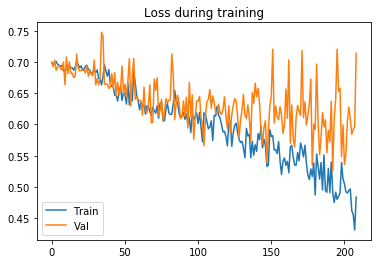

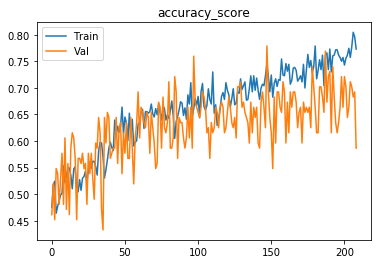

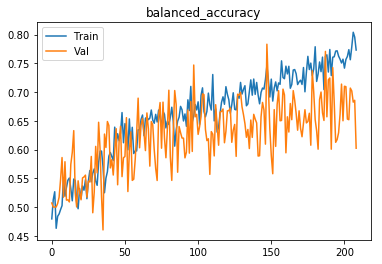

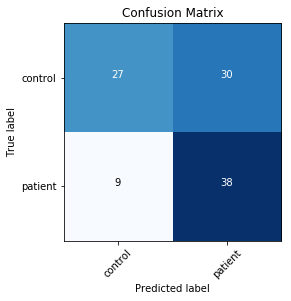

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69868
[0,     4] loss: 0.69451
Time elapsed: 0h:0m:9s
train accuracy_score: 46.98 %
train balanced_accuracy: 46.58 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.88 %
Val loss: 0.694575
[1,     2] loss: 0.69622
[1,     4] loss: 0.69550
Time elapsed: 0h:0m:20s
train accuracy_score: 51.87 %
train balanced_accuracy: 51.38 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.686804
[2,     2] loss: 0.69414
[2,     4] loss: 0.69334
Time elapsed: 0h:0m:31s
train accuracy_score: 49.57 %
train balanced_accuracy: 49.71 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.713491
[3,     2] loss: 0.69102
[3,     4] loss: 0.69970
Time elapsed: 0h:0m:42s
train accuracy_score: 50.72 %
train balanced_accuracy: 49.98 %
val accuracy_score: 51.92 %
val balanced_accuracy: 48.11 %
Val loss: 0.700445
[4,    

val accuracy_score: 54.81 %
val balanced_accuracy: 56.72 %
Val loss: 0.679122
[38,     2] loss: 0.65545
[38,     4] loss: 0.65413
Time elapsed: 0h:6m:54s
train accuracy_score: 61.06 %
train balanced_accuracy: 61.05 %
val accuracy_score: 59.62 %
val balanced_accuracy: 61.66 %
Val loss: 0.675654
[39,     2] loss: 0.66188
[39,     4] loss: 0.65281
Time elapsed: 0h:7m:6s
train accuracy_score: 62.07 %
train balanced_accuracy: 61.96 %
val accuracy_score: 60.58 %
val balanced_accuracy: 60.30 %
Val loss: 0.681946
[40,     2] loss: 0.62436
[40,     4] loss: 0.64899
Time elapsed: 0h:7m:17s
train accuracy_score: 61.49 %
train balanced_accuracy: 61.39 %
val accuracy_score: 56.73 %
val balanced_accuracy: 56.42 %
Val loss: 0.663495
[41,     2] loss: 0.65559
[41,     4] loss: 0.62489
Time elapsed: 0h:7m:28s
train accuracy_score: 64.37 %
train balanced_accuracy: 64.38 %
val accuracy_score: 57.69 %
val balanced_accuracy: 60.47 %
Val loss: 0.695240
[42,     2] loss: 0.66429
[42,     4] loss: 0.67760
Tim

val accuracy_score: 62.50 %
val balanced_accuracy: 60.56 %
Val loss: 0.655264
[76,     2] loss: 0.61400
[76,     4] loss: 0.62541
Time elapsed: 0h:13m:45s
train accuracy_score: 69.11 %
train balanced_accuracy: 68.98 %
val accuracy_score: 64.42 %
val balanced_accuracy: 65.49 %
Val loss: 0.661202
[77,     2] loss: 0.63134
[77,     4] loss: 0.63165
Time elapsed: 0h:13m:57s
train accuracy_score: 64.66 %
train balanced_accuracy: 64.77 %
val accuracy_score: 72.12 %
val balanced_accuracy: 70.83 %
Val loss: 0.580567
[78,     2] loss: 0.61841
[78,     4] loss: 0.62248
Time elapsed: 0h:14m:9s
train accuracy_score: 67.82 %
train balanced_accuracy: 67.70 %
val accuracy_score: 64.42 %
val balanced_accuracy: 63.25 %
Val loss: 0.600290
[79,     2] loss: 0.62704
[79,     4] loss: 0.61910
Time elapsed: 0h:14m:20s
train accuracy_score: 65.66 %
train balanced_accuracy: 65.79 %
val accuracy_score: 65.38 %
val balanced_accuracy: 67.67 %
Val loss: 0.655634
[80,     2] loss: 0.61779
[80,     4] loss: 0.62711

[113,     4] loss: 0.60528
Time elapsed: 0h:20m:31s
train accuracy_score: 67.67 %
train balanced_accuracy: 67.46 %
val accuracy_score: 68.27 %
val balanced_accuracy: 66.76 %
Val loss: 0.610344
[114,     2] loss: 0.60786
[114,     4] loss: 0.57140
Time elapsed: 0h:20m:42s
train accuracy_score: 68.39 %
train balanced_accuracy: 68.60 %
val accuracy_score: 61.54 %
val balanced_accuracy: 62.86 %
Val loss: 0.633343
[115,     2] loss: 0.57814
[115,     4] loss: 0.61080
Time elapsed: 0h:20m:52s
train accuracy_score: 68.39 %
train balanced_accuracy: 68.19 %
val accuracy_score: 66.35 %
val balanced_accuracy: 64.82 %
Val loss: 0.586991
[116,     2] loss: 0.56511
[116,     4] loss: 0.57026
Time elapsed: 0h:21m:3s
train accuracy_score: 70.83 %
train balanced_accuracy: 70.92 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.13 %
Val loss: 0.600291
[117,     2] loss: 0.58062
[117,     4] loss: 0.57755
Time elapsed: 0h:21m:13s
train accuracy_score: 69.11 %
train balanced_accuracy: 69.13 %
val ac

val accuracy_score: 66.35 %
val balanced_accuracy: 66.87 %
Val loss: 0.644032
[151,     2] loss: 0.51157
[151,     4] loss: 0.51801
Time elapsed: 0h:27m:20s
train accuracy_score: 73.99 %
train balanced_accuracy: 74.10 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.44 %
Val loss: 0.601963
[152,     2] loss: 0.49861
[152,     4] loss: 0.59865
Time elapsed: 0h:27m:31s
train accuracy_score: 70.40 %
train balanced_accuracy: 70.29 %
val accuracy_score: 64.42 %
val balanced_accuracy: 62.88 %
Val loss: 0.652916
[153,     2] loss: 0.52518
[153,     4] loss: 0.49808
Time elapsed: 0h:27m:43s
train accuracy_score: 76.15 %
train balanced_accuracy: 76.21 %
val accuracy_score: 65.38 %
val balanced_accuracy: 66.74 %
Val loss: 0.637261
[154,     2] loss: 0.55854
[154,     4] loss: 0.53598
Time elapsed: 0h:27m:54s
train accuracy_score: 72.13 %
train balanced_accuracy: 72.16 %
val accuracy_score: 70.19 %
val balanced_accuracy: 70.57 %
Val loss: 0.598735
[155,     2] loss: 0.55343
[155,     4] lo

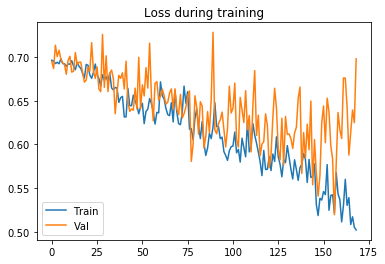

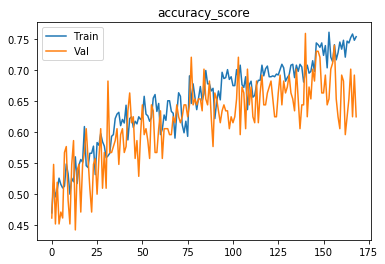

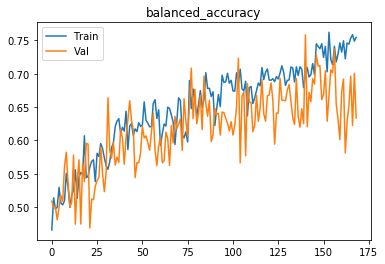

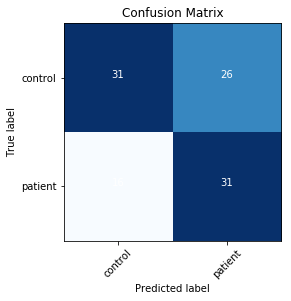

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69527
[0,     4] loss: 0.69747
Time elapsed: 0h:0m:9s
train accuracy_score: 50.72 %
train balanced_accuracy: 50.20 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.700510
[1,     2] loss: 0.69462
[1,     4] loss: 0.69731
Time elapsed: 0h:0m:21s
train accuracy_score: 48.99 %
train balanced_accuracy: 48.09 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.697978
[2,     2] loss: 0.69156
[2,     4] loss: 0.69653
Time elapsed: 0h:0m:32s
train accuracy_score: 49.71 %
train balanced_accuracy: 48.88 %
val accuracy_score: 58.65 %
val balanced_accuracy: 55.38 %
Val loss: 0.685852
[3,     2] loss: 0.69519
[3,     4] loss: 0.69920
Time elapsed: 0h:0m:42s
train accuracy_score: 47.99 %
train balanced_accuracy: 48.45 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.700833
[4,    

val accuracy_score: 53.85 %
val balanced_accuracy: 56.03 %
Val loss: 0.693114
[38,     2] loss: 0.65842
[38,     4] loss: 0.66267
Time elapsed: 0h:7m:0s
train accuracy_score: 61.21 %
train balanced_accuracy: 61.13 %
val accuracy_score: 63.46 %
val balanced_accuracy: 62.75 %
Val loss: 0.622744
[39,     2] loss: 0.63232
[39,     4] loss: 0.64145
Time elapsed: 0h:7m:10s
train accuracy_score: 63.22 %
train balanced_accuracy: 63.04 %
val accuracy_score: 62.50 %
val balanced_accuracy: 63.36 %
Val loss: 0.616356
[40,     2] loss: 0.64288
[40,     4] loss: 0.63790
Time elapsed: 0h:7m:21s
train accuracy_score: 63.51 %
train balanced_accuracy: 63.41 %
val accuracy_score: 58.65 %
val balanced_accuracy: 55.75 %
Val loss: 0.671220
[41,     2] loss: 0.65195
[41,     4] loss: 0.64763
Time elapsed: 0h:7m:31s
train accuracy_score: 61.21 %
train balanced_accuracy: 61.26 %
val accuracy_score: 64.42 %
val balanced_accuracy: 61.57 %
Val loss: 0.599470
[42,     2] loss: 0.67048
[42,     4] loss: 0.60666
Tim

val accuracy_score: 55.77 %
val balanced_accuracy: 59.09 %
Val loss: 0.715350
[76,     2] loss: 0.62407
[76,     4] loss: 0.61609
Time elapsed: 0h:13m:41s
train accuracy_score: 63.79 %
train balanced_accuracy: 63.48 %
val accuracy_score: 62.50 %
val balanced_accuracy: 59.82 %
Val loss: 0.632376
[77,     2] loss: 0.65429
[77,     4] loss: 0.64927
Time elapsed: 0h:13m:52s
train accuracy_score: 61.35 %
train balanced_accuracy: 61.72 %
val accuracy_score: 64.42 %
val balanced_accuracy: 63.81 %
Val loss: 0.635063
[78,     2] loss: 0.60820
[78,     4] loss: 0.62657
Time elapsed: 0h:14m:4s
train accuracy_score: 67.24 %
train balanced_accuracy: 67.08 %
val accuracy_score: 59.62 %
val balanced_accuracy: 57.93 %
Val loss: 0.639210
[79,     2] loss: 0.61911
[79,     4] loss: 0.60894
Time elapsed: 0h:14m:16s
train accuracy_score: 65.80 %
train balanced_accuracy: 65.87 %
val accuracy_score: 67.31 %
val balanced_accuracy: 66.82 %
Val loss: 0.613719
[80,     2] loss: 0.62165
[80,     4] loss: 0.61724

Time elapsed: 0h:20m:20s
train accuracy_score: 70.55 %
train balanced_accuracy: 70.52 %
val accuracy_score: 70.19 %
val balanced_accuracy: 69.07 %
Val loss: 0.556925
[114,     2] loss: 0.59229
[114,     4] loss: 0.56727
Time elapsed: 0h:20m:31s
train accuracy_score: 68.68 %
train balanced_accuracy: 68.62 %
val accuracy_score: 63.46 %
val balanced_accuracy: 62.00 %
Val loss: 0.598722
[115,     2] loss: 0.56286
[115,     4] loss: 0.59465
Time elapsed: 0h:20m:42s
train accuracy_score: 69.68 %
train balanced_accuracy: 69.86 %
val accuracy_score: 63.46 %
val balanced_accuracy: 64.05 %
Val loss: 0.624931
[116,     2] loss: 0.57489
[116,     4] loss: 0.56133
Time elapsed: 0h:20m:53s
train accuracy_score: 70.55 %
train balanced_accuracy: 70.53 %
val accuracy_score: 64.42 %
val balanced_accuracy: 62.50 %
Val loss: 0.653132
[117,     2] loss: 0.55641
[117,     4] loss: 0.61464
Time elapsed: 0h:21m:5s
train accuracy_score: 68.97 %
train balanced_accuracy: 68.91 %
val accuracy_score: 73.08 %
val b

val accuracy_score: 68.27 %
val balanced_accuracy: 66.20 %
Val loss: 0.620061
[151,     2] loss: 0.56974
[151,     4] loss: 0.52523
Time elapsed: 0h:27m:13s
train accuracy_score: 71.98 %
train balanced_accuracy: 72.03 %
val accuracy_score: 64.42 %
val balanced_accuracy: 65.30 %
Val loss: 0.630605
[152,     2] loss: 0.53878
[152,     4] loss: 0.50358
Time elapsed: 0h:27m:24s
train accuracy_score: 75.43 %
train balanced_accuracy: 75.49 %
val accuracy_score: 68.27 %
val balanced_accuracy: 68.44 %
Val loss: 0.605348
[153,     2] loss: 0.54923
[153,     4] loss: 0.55014
Time elapsed: 0h:27m:35s
train accuracy_score: 70.98 %
train balanced_accuracy: 70.95 %
val accuracy_score: 71.15 %
val balanced_accuracy: 69.95 %
Val loss: 0.571356
[154,     2] loss: 0.51211
[154,     4] loss: 0.60836
Time elapsed: 0h:27m:45s
train accuracy_score: 70.11 %
train balanced_accuracy: 69.96 %
val accuracy_score: 68.27 %
val balanced_accuracy: 66.39 %
Val loss: 0.600599
[155,     2] loss: 0.52800
[155,     4] lo

[188,     2] loss: 0.51498
[188,     4] loss: 0.53343
Time elapsed: 0h:33m:55s
train accuracy_score: 74.28 %
train balanced_accuracy: 74.29 %
val accuracy_score: 64.42 %
val balanced_accuracy: 64.37 %
Val loss: 0.667558
[189,     2] loss: 0.52412
[189,     4] loss: 0.50604
Time elapsed: 0h:34m:5s
train accuracy_score: 75.43 %
train balanced_accuracy: 75.44 %
val accuracy_score: 65.38 %
val balanced_accuracy: 65.43 %
Val loss: 0.661329
[190,     2] loss: 0.51234
[190,     4] loss: 0.52884
Time elapsed: 0h:34m:15s
train accuracy_score: 74.43 %
train balanced_accuracy: 74.50 %
val accuracy_score: 63.46 %
val balanced_accuracy: 64.24 %
Val loss: 0.672817
Early stopping in epoch 191
Total time elapsed: 0h:34m:17s
Writing model to disk...
Best result during training: 0.74. Saving model..
Finished inner fold.


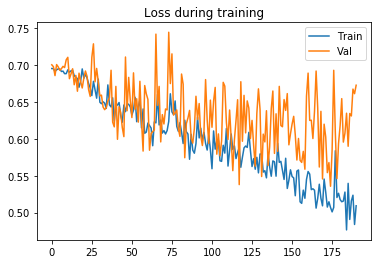

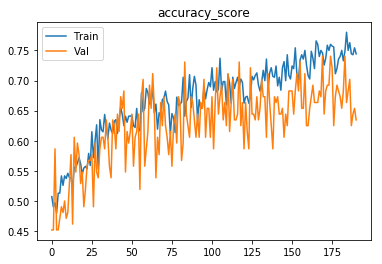

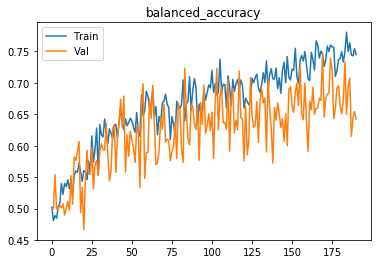

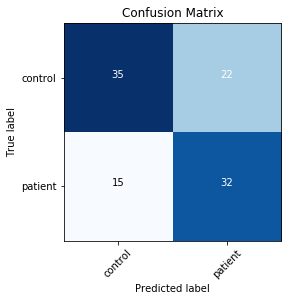

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69649
[0,     4] loss: 0.69917
Time elapsed: 0h:0m:8s
train accuracy_score: 48.13 %
train balanced_accuracy: 47.78 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.56 %
Val loss: 0.686605
[1,     2] loss: 0.69608
[1,     4] loss: 0.69976
Time elapsed: 0h:0m:19s
train accuracy_score: 49.71 %
train balanced_accuracy: 49.29 %
val accuracy_score: 54.81 %
val balanced_accuracy: 57.28 %
Val loss: 0.692108
[2,     2] loss: 0.69314
[2,     4] loss: 0.69500
Time elapsed: 0h:0m:30s
train accuracy_score: 51.29 %
train balanced_accuracy: 50.87 %
val accuracy_score: 47.12 %
val balanced_accuracy: 51.19 %
Val loss: 0.694474
[3,     2] loss: 0.69096
[3,     4] loss: 0.70091
Time elapsed: 0h:0m:41s
train accuracy_score: 51.29 %
train balanced_accuracy: 51.09 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.10 %
Val loss: 0.690607
[4,    

val accuracy_score: 56.73 %
val balanced_accuracy: 58.47 %
Val loss: 0.696970
[38,     2] loss: 0.65447
[38,     4] loss: 0.68924
Time elapsed: 0h:6m:49s
train accuracy_score: 60.20 %
train balanced_accuracy: 60.23 %
val accuracy_score: 59.62 %
val balanced_accuracy: 60.92 %
Val loss: 0.643521
[39,     2] loss: 0.66888
[39,     4] loss: 0.67254
Time elapsed: 0h:6m:59s
train accuracy_score: 57.18 %
train balanced_accuracy: 57.35 %
val accuracy_score: 59.62 %
val balanced_accuracy: 59.80 %
Val loss: 0.653231
[40,     2] loss: 0.65447
[40,     4] loss: 0.64952
Time elapsed: 0h:7m:10s
train accuracy_score: 60.20 %
train balanced_accuracy: 59.77 %
val accuracy_score: 59.62 %
val balanced_accuracy: 57.00 %
Val loss: 0.657089
[41,     2] loss: 0.65170
[41,     4] loss: 0.63833
Time elapsed: 0h:7m:20s
train accuracy_score: 62.79 %
train balanced_accuracy: 63.19 %
val accuracy_score: 56.73 %
val balanced_accuracy: 59.03 %
Val loss: 0.665411
[42,     2] loss: 0.64548
[42,     4] loss: 0.62900
Ti

val accuracy_score: 60.58 %
val balanced_accuracy: 58.44 %
Val loss: 0.639175
[76,     2] loss: 0.58041
[76,     4] loss: 0.59427
Time elapsed: 0h:13m:33s
train accuracy_score: 68.82 %
train balanced_accuracy: 68.83 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.06 %
Val loss: 0.628660
[77,     2] loss: 0.56397
[77,     4] loss: 0.63734
Time elapsed: 0h:13m:44s
train accuracy_score: 68.53 %
train balanced_accuracy: 68.68 %
val accuracy_score: 63.46 %
val balanced_accuracy: 66.48 %
Val loss: 0.654384
[78,     2] loss: 0.62537
[78,     4] loss: 0.59261
Time elapsed: 0h:13m:54s
train accuracy_score: 67.53 %
train balanced_accuracy: 67.53 %
val accuracy_score: 63.46 %
val balanced_accuracy: 62.19 %
Val loss: 0.636984
[79,     2] loss: 0.62930
[79,     4] loss: 0.60994
Time elapsed: 0h:14m:5s
train accuracy_score: 64.22 %
train balanced_accuracy: 63.93 %
val accuracy_score: 66.35 %
val balanced_accuracy: 65.38 %
Val loss: 0.633286
[80,     2] loss: 0.59839
[80,     4] loss: 0.62905

Time elapsed: 0h:20m:8s
train accuracy_score: 67.24 %
train balanced_accuracy: 67.18 %
val accuracy_score: 66.35 %
val balanced_accuracy: 64.26 %
Val loss: 0.618098
[114,     2] loss: 0.57961
[114,     4] loss: 0.60928
Time elapsed: 0h:20m:18s
train accuracy_score: 70.11 %
train balanced_accuracy: 69.96 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.26 %
Val loss: 0.543732
[115,     2] loss: 0.58948
[115,     4] loss: 0.55604
Time elapsed: 0h:20m:29s
train accuracy_score: 70.40 %
train balanced_accuracy: 70.62 %
val accuracy_score: 65.38 %
val balanced_accuracy: 67.11 %
Val loss: 0.632496
[116,     2] loss: 0.58796
[116,     4] loss: 0.57735
Time elapsed: 0h:20m:40s
train accuracy_score: 72.27 %
train balanced_accuracy: 72.07 %
val accuracy_score: 60.58 %
val balanced_accuracy: 58.25 %
Val loss: 0.632039
[117,     2] loss: 0.59872
[117,     4] loss: 0.54875
Time elapsed: 0h:20m:51s
train accuracy_score: 69.54 %
train balanced_accuracy: 69.66 %
val accuracy_score: 67.31 %
val b

val accuracy_score: 69.23 %
val balanced_accuracy: 67.45 %
Val loss: 0.597644
[151,     2] loss: 0.51802
[151,     4] loss: 0.56675
Time elapsed: 0h:26m:58s
train accuracy_score: 71.70 %
train balanced_accuracy: 71.57 %
val accuracy_score: 65.38 %
val balanced_accuracy: 64.69 %
Val loss: 0.622675
[152,     2] loss: 0.53094
[152,     4] loss: 0.53021
Time elapsed: 0h:27m:10s
train accuracy_score: 74.14 %
train balanced_accuracy: 74.33 %
val accuracy_score: 75.00 %
val balanced_accuracy: 75.70 %
Val loss: 0.546393
[153,     2] loss: 0.56288
[153,     4] loss: 0.54851
Time elapsed: 0h:27m:20s
train accuracy_score: 72.84 %
train balanced_accuracy: 72.71 %
val accuracy_score: 67.31 %
val balanced_accuracy: 65.32 %
Val loss: 0.579019
[154,     2] loss: 0.51765
[154,     4] loss: 0.50423
Time elapsed: 0h:27m:30s
train accuracy_score: 74.57 %
train balanced_accuracy: 74.66 %
val accuracy_score: 68.27 %
val balanced_accuracy: 68.25 %
Val loss: 0.634939
[155,     2] loss: 0.51764
[155,     4] lo

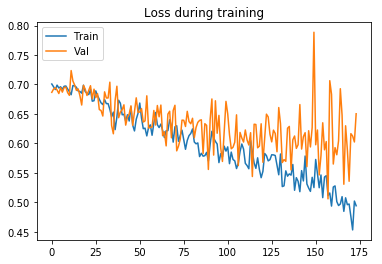

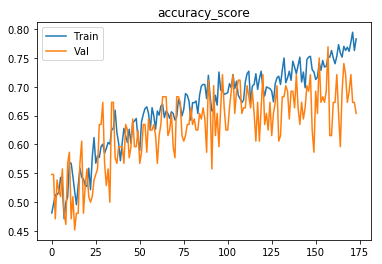

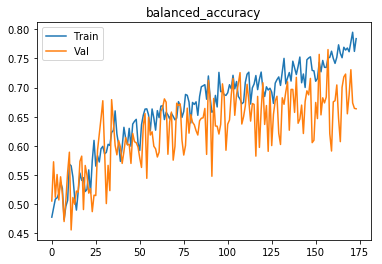

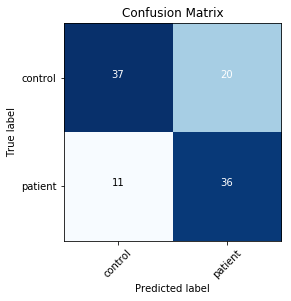

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.68963
[0,     4] loss: 0.72508
Time elapsed: 0h:0m:9s
train accuracy_score: 49.57 %
train balanced_accuracy: 48.90 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.689631
[1,     2] loss: 0.69254
[1,     4] loss: 0.69082
Time elapsed: 0h:0m:21s
train accuracy_score: 50.57 %
train balanced_accuracy: 50.88 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.710177
[2,     2] loss: 0.70215
[2,     4] loss: 0.69000
Time elapsed: 0h:0m:31s
train accuracy_score: 50.86 %
train balanced_accuracy: 50.19 %
val accuracy_score: 54.81 %
val balanced_accuracy: 50.00 %
Val loss: 0.690138
[3,     2] loss: 0.69442
[3,     4] loss: 0.69723
Time elapsed: 0h:0m:43s
train accuracy_score: 50.14 %
train balanced_accuracy: 50.40 %
val accuracy_score: 45.19 %
val balanced_accuracy: 50.00 %
Val loss: 0.694596
[4,    

val accuracy_score: 59.62 %
val balanced_accuracy: 59.80 %
Val loss: 0.665893
[38,     2] loss: 0.68477
[38,     4] loss: 0.70497
Time elapsed: 0h:7m:2s
train accuracy_score: 54.31 %
train balanced_accuracy: 54.58 %
val accuracy_score: 54.81 %
val balanced_accuracy: 58.21 %
Val loss: 0.700728
[39,     2] loss: 0.70061
[39,     4] loss: 0.70282
Time elapsed: 0h:7m:13s
train accuracy_score: 50.72 %
train balanced_accuracy: 49.93 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.62 %
Val loss: 0.678679
[40,     2] loss: 0.68397
[40,     4] loss: 0.69854
Time elapsed: 0h:7m:24s
train accuracy_score: 52.44 %
train balanced_accuracy: 52.84 %
val accuracy_score: 58.65 %
val balanced_accuracy: 55.19 %
Val loss: 0.682564
[41,     2] loss: 0.69141
[41,     4] loss: 0.69044
Time elapsed: 0h:7m:34s
train accuracy_score: 51.58 %
train balanced_accuracy: 51.99 %
val accuracy_score: 50.96 %
val balanced_accuracy: 49.85 %
Val loss: 0.693814
[42,     2] loss: 0.68121
[42,     4] loss: 0.68097
Tim

val accuracy_score: 61.54 %
val balanced_accuracy: 62.67 %
Val loss: 0.638588
[76,     2] loss: 0.64733
[76,     4] loss: 0.63573
Time elapsed: 0h:13m:42s
train accuracy_score: 65.37 %
train balanced_accuracy: 65.51 %
val accuracy_score: 64.42 %
val balanced_accuracy: 65.30 %
Val loss: 0.654908
[77,     2] loss: 0.65057
[77,     4] loss: 0.62135
Time elapsed: 0h:13m:51s
train accuracy_score: 62.07 %
train balanced_accuracy: 61.82 %
val accuracy_score: 68.27 %
val balanced_accuracy: 65.83 %
Val loss: 0.636750
[78,     2] loss: 0.65522
[78,     4] loss: 0.63847
Time elapsed: 0h:14m:2s
train accuracy_score: 62.50 %
train balanced_accuracy: 62.34 %
val accuracy_score: 62.50 %
val balanced_accuracy: 63.36 %
Val loss: 0.614666
[79,     2] loss: 0.62702
[79,     4] loss: 0.64654
Time elapsed: 0h:14m:11s
train accuracy_score: 64.80 %
train balanced_accuracy: 64.89 %
val accuracy_score: 68.27 %
val balanced_accuracy: 67.32 %
Val loss: 0.615110
[80,     2] loss: 0.65288
[80,     4] loss: 0.63542

Time elapsed: 0h:20m:11s
train accuracy_score: 67.24 %
train balanced_accuracy: 67.29 %
val accuracy_score: 65.38 %
val balanced_accuracy: 66.74 %
Val loss: 0.661200
[114,     2] loss: 0.60967
[114,     4] loss: 0.61638
Time elapsed: 0h:20m:22s
train accuracy_score: 68.82 %
train balanced_accuracy: 68.84 %
val accuracy_score: 59.62 %
val balanced_accuracy: 58.87 %
Val loss: 0.631720
[115,     2] loss: 0.60940
[115,     4] loss: 0.60836
Time elapsed: 0h:20m:33s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.46 %
val accuracy_score: 58.65 %
val balanced_accuracy: 55.38 %
Val loss: 0.665587
[116,     2] loss: 0.67757
[116,     4] loss: 0.60505
Time elapsed: 0h:20m:44s
train accuracy_score: 64.66 %
train balanced_accuracy: 64.95 %
val accuracy_score: 50.96 %
val balanced_accuracy: 53.77 %
Val loss: 0.704826
[117,     2] loss: 0.60917
[117,     4] loss: 0.61803
Time elapsed: 0h:20m:54s
train accuracy_score: 66.81 %
train balanced_accuracy: 66.42 %
val accuracy_score: 64.42 %
val 

val accuracy_score: 66.35 %
val balanced_accuracy: 65.94 %
Val loss: 0.608598
[151,     2] loss: 0.56247
[151,     4] loss: 0.58447
Time elapsed: 0h:26m:51s
train accuracy_score: 70.11 %
train balanced_accuracy: 70.02 %
val accuracy_score: 66.35 %
val balanced_accuracy: 65.57 %
Val loss: 0.564073
[152,     2] loss: 0.60225
[152,     4] loss: 0.55851
Time elapsed: 0h:27m:1s
train accuracy_score: 69.25 %
train balanced_accuracy: 69.33 %
val accuracy_score: 72.12 %
val balanced_accuracy: 73.07 %
Val loss: 0.544345
[153,     2] loss: 0.58600
[153,     4] loss: 0.53774
Time elapsed: 0h:27m:12s
train accuracy_score: 69.97 %
train balanced_accuracy: 69.92 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.89 %
Val loss: 0.600290
[154,     2] loss: 0.59807
[154,     4] loss: 0.56329
Time elapsed: 0h:27m:23s
train accuracy_score: 69.40 %
train balanced_accuracy: 69.51 %
val accuracy_score: 67.31 %
val balanced_accuracy: 67.38 %
Val loss: 0.618592
[155,     2] loss: 0.55700
[155,     4] los

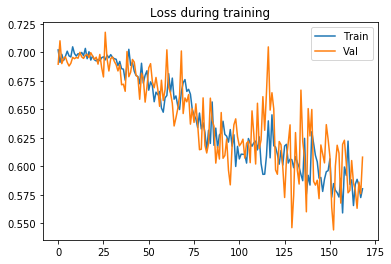

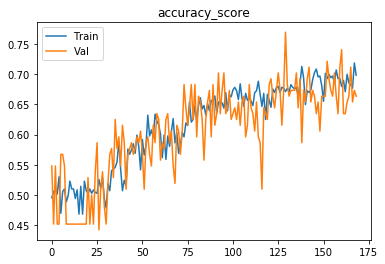

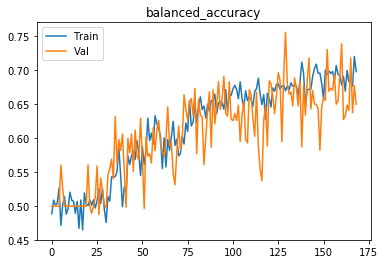

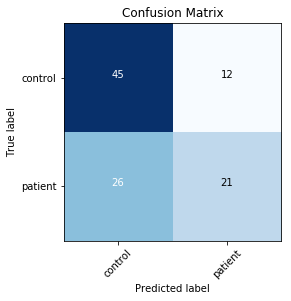

Finished outer fold.
{'final_acc': 0.6500559910414334, 'best_acc': 0.7388951101157148, 'final_iter': 169, 'best_iter': 130, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 4}
###### Starting outer fold 5
# of patients 402, # of healthy controls 397
684
115
(684, 96, 114, 96)
(115, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69438
[0,     4] loss: 0.68644
Time elapsed: 0h:0m:9s
train accuracy_score: 51.46 %
train balanced_accuracy: 51.61 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.723827
[1,     2] loss: 0.69839
[1,     4] loss: 0.70151
Time elapsed: 0h:0m:18s
train accuracy_score: 51.61 %
train balanced_accuracy: 51.77 %
val accuracy_score: 50.43 %
val balanced_accuracy: 54.19 %
Val loss: 0.695101
[2,     2] loss: 0.70532
[2,     4] loss: 0.69308
Time elapsed: 0h:0m:28s
train accuracy_sc

[36,     2] loss: 0.69398
[36,     4] loss: 0.69171
Time elapsed: 0h:6m:26s
train accuracy_score: 53.07 %
train balanced_accuracy: 52.77 %
val accuracy_score: 47.83 %
val balanced_accuracy: 51.13 %
Val loss: 0.691545
[37,     2] loss: 0.68700
[37,     4] loss: 0.68951
Time elapsed: 0h:6m:36s
train accuracy_score: 55.26 %
train balanced_accuracy: 54.66 %
val accuracy_score: 56.52 %
val balanced_accuracy: 56.86 %
Val loss: 0.681289
[38,     2] loss: 0.68942
[38,     4] loss: 0.68757
Time elapsed: 0h:6m:46s
train accuracy_score: 53.51 %
train balanced_accuracy: 53.25 %
val accuracy_score: 60.87 %
val balanced_accuracy: 61.18 %
Val loss: 0.681353
[39,     2] loss: 0.68388
[39,     4] loss: 0.69008
Time elapsed: 0h:6m:56s
train accuracy_score: 57.60 %
train balanced_accuracy: 57.42 %
val accuracy_score: 60.00 %
val balanced_accuracy: 63.84 %
Val loss: 0.678440
[40,     2] loss: 0.68931
[40,     4] loss: 0.68806
Time elapsed: 0h:7m:7s
train accuracy_score: 54.09 %
train balanced_accuracy: 53

[74,     2] loss: 0.65161
[74,     4] loss: 0.68415
Time elapsed: 0h:13m:8s
train accuracy_score: 59.21 %
train balanced_accuracy: 59.47 %
val accuracy_score: 55.65 %
val balanced_accuracy: 57.95 %
Val loss: 0.686068
[75,     2] loss: 0.68809
[75,     4] loss: 0.64951
Time elapsed: 0h:13m:19s
train accuracy_score: 58.77 %
train balanced_accuracy: 58.31 %
val accuracy_score: 66.09 %
val balanced_accuracy: 64.41 %
Val loss: 0.631074
[76,     2] loss: 0.67397
[76,     4] loss: 0.64437
Time elapsed: 0h:13m:30s
train accuracy_score: 62.28 %
train balanced_accuracy: 61.77 %
val accuracy_score: 65.22 %
val balanced_accuracy: 61.02 %
Val loss: 0.630169
[77,     2] loss: 0.66491
[77,     4] loss: 0.66252
Time elapsed: 0h:13m:40s
train accuracy_score: 59.21 %
train balanced_accuracy: 59.82 %
val accuracy_score: 68.70 %
val balanced_accuracy: 70.62 %
Val loss: 0.623651
[78,     2] loss: 0.63954
[78,     4] loss: 0.63799
Time elapsed: 0h:13m:50s
train accuracy_score: 62.13 %
train balanced_accurac

val accuracy_score: 64.35 %
val balanced_accuracy: 60.79 %
Val loss: 0.633803
[112,     2] loss: 0.68215
[112,     4] loss: 0.66993
Time elapsed: 0h:19m:49s
train accuracy_score: 57.60 %
train balanced_accuracy: 57.60 %
val accuracy_score: 59.13 %
val balanced_accuracy: 59.40 %
Val loss: 0.659483
[113,     2] loss: 0.67711
[113,     4] loss: 0.66164
Time elapsed: 0h:20m:0s
train accuracy_score: 57.16 %
train balanced_accuracy: 57.74 %
val accuracy_score: 73.91 %
val balanced_accuracy: 76.48 %
Val loss: 0.614595
[114,     2] loss: 0.64600
[114,     4] loss: 0.66344
Time elapsed: 0h:20m:11s
train accuracy_score: 61.55 %
train balanced_accuracy: 60.68 %
val accuracy_score: 62.61 %
val balanced_accuracy: 63.22 %
Val loss: 0.644872
[115,     2] loss: 0.63817
[115,     4] loss: 0.64596
Time elapsed: 0h:20m:23s
train accuracy_score: 64.33 %
train balanced_accuracy: 64.19 %
val accuracy_score: 64.35 %
val balanced_accuracy: 62.11 %
Val loss: 0.635712
[116,     2] loss: 0.64670
[116,     4] los

[149,     2] loss: 0.63242
[149,     4] loss: 0.59850
Time elapsed: 0h:26m:32s
train accuracy_score: 65.79 %
train balanced_accuracy: 65.95 %
val accuracy_score: 68.70 %
val balanced_accuracy: 69.57 %
Val loss: 0.576795
[150,     2] loss: 0.59745
[150,     4] loss: 0.61391
Time elapsed: 0h:26m:42s
train accuracy_score: 65.35 %
train balanced_accuracy: 65.58 %
val accuracy_score: 71.30 %
val balanced_accuracy: 70.79 %
Val loss: 0.562760
[151,     2] loss: 0.62573
[151,     4] loss: 0.60328
Time elapsed: 0h:26m:53s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.50 %
val accuracy_score: 73.91 %
val balanced_accuracy: 72.28 %
Val loss: 0.551533
[152,     2] loss: 0.62048
[152,     4] loss: 0.61860
Time elapsed: 0h:27m:4s
train accuracy_score: 65.94 %
train balanced_accuracy: 65.77 %
val accuracy_score: 68.70 %
val balanced_accuracy: 68.52 %
Val loss: 0.595958
[153,     2] loss: 0.61338
[153,     4] loss: 0.59703
Time elapsed: 0h:27m:15s
train accuracy_score: 70.03 %
train balanc

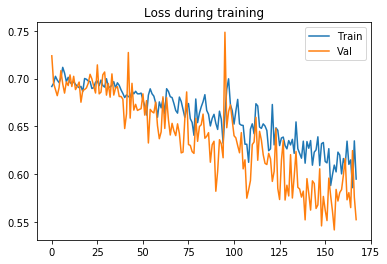

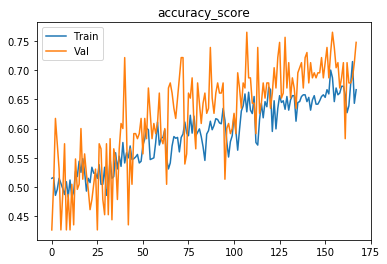

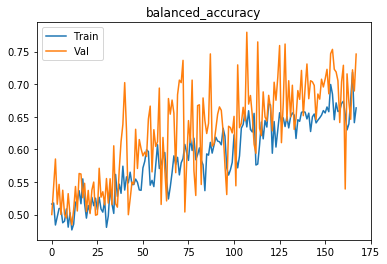

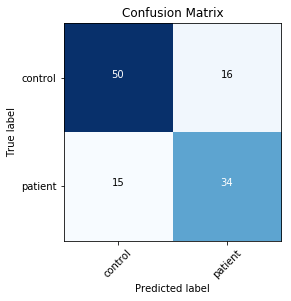

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69539
[0,     4] loss: 0.69273
Time elapsed: 0h:0m:8s
train accuracy_score: 49.71 %
train balanced_accuracy: 49.66 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.718261
[1,     2] loss: 0.69663
[1,     4] loss: 0.70136
Time elapsed: 0h:0m:19s
train accuracy_score: 49.71 %
train balanced_accuracy: 49.67 %
val accuracy_score: 53.91 %
val balanced_accuracy: 53.54 %
Val loss: 0.692546
[2,     2] loss: 0.69187
[2,     4] loss: 0.69484
Time elapsed: 0h:0m:30s
train accuracy_score: 52.92 %
train balanced_accuracy: 53.35 %
val accuracy_score: 53.04 %
val balanced_accuracy: 55.67 %
Val loss: 0.691989
[3,     2] loss: 0.69283
[3,     4] loss: 0.70282
Time elapsed: 0h:0m:41s
train accuracy_score: 53.07 %
train balanced_accuracy: 51.79 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.699396
[4,    

val accuracy_score: 50.43 %
val balanced_accuracy: 53.40 %
Val loss: 0.688698
[38,     2] loss: 0.68592
[38,     4] loss: 0.69071
Time elapsed: 0h:6m:52s
train accuracy_score: 54.24 %
train balanced_accuracy: 53.73 %
val accuracy_score: 63.48 %
val balanced_accuracy: 65.29 %
Val loss: 0.679671
[39,     2] loss: 0.68731
[39,     4] loss: 0.70284
Time elapsed: 0h:7m:2s
train accuracy_score: 54.39 %
train balanced_accuracy: 53.77 %
val accuracy_score: 58.26 %
val balanced_accuracy: 58.64 %
Val loss: 0.674504
[40,     2] loss: 0.68367
[40,     4] loss: 0.69616
Time elapsed: 0h:7m:13s
train accuracy_score: 55.70 %
train balanced_accuracy: 55.82 %
val accuracy_score: 60.87 %
val balanced_accuracy: 59.60 %
Val loss: 0.671757
[41,     2] loss: 0.68569
[41,     4] loss: 0.67997
Time elapsed: 0h:7m:24s
train accuracy_score: 53.80 %
train balanced_accuracy: 52.88 %
val accuracy_score: 53.04 %
val balanced_accuracy: 58.83 %
Val loss: 0.684346
[42,     2] loss: 0.69199
[42,     4] loss: 0.68631
Tim

val accuracy_score: 49.57 %
val balanced_accuracy: 54.22 %
Val loss: 0.719428
[76,     2] loss: 0.69927
[76,     4] loss: 0.66433
Time elapsed: 0h:13m:33s
train accuracy_score: 54.09 %
train balanced_accuracy: 53.49 %
val accuracy_score: 65.22 %
val balanced_accuracy: 62.34 %
Val loss: 0.639428
[77,     2] loss: 0.66556
[77,     4] loss: 0.65824
Time elapsed: 0h:13m:44s
train accuracy_score: 61.70 %
train balanced_accuracy: 61.52 %
val accuracy_score: 64.35 %
val balanced_accuracy: 64.21 %
Val loss: 0.656203
[78,     2] loss: 0.66888
[78,     4] loss: 0.64551
Time elapsed: 0h:13m:54s
train accuracy_score: 62.43 %
train balanced_accuracy: 62.45 %
val accuracy_score: 68.70 %
val balanced_accuracy: 69.84 %
Val loss: 0.632407
[79,     2] loss: 0.68967
[79,     4] loss: 0.68613
Time elapsed: 0h:14m:5s
train accuracy_score: 56.29 %
train balanced_accuracy: 56.52 %
val accuracy_score: 66.09 %
val balanced_accuracy: 69.14 %
Val loss: 0.640840
[80,     2] loss: 0.68078
[80,     4] loss: 0.67247

Time elapsed: 0h:20m:1s
train accuracy_score: 64.04 %
train balanced_accuracy: 64.34 %
val accuracy_score: 67.83 %
val balanced_accuracy: 70.66 %
Val loss: 0.631108
[114,     2] loss: 0.63037
[114,     4] loss: 0.65561
Time elapsed: 0h:20m:11s
train accuracy_score: 63.30 %
train balanced_accuracy: 63.09 %
val accuracy_score: 64.35 %
val balanced_accuracy: 58.69 %
Val loss: 0.597963
[115,     2] loss: 0.66873
[115,     4] loss: 0.63443
Time elapsed: 0h:20m:21s
train accuracy_score: 60.67 %
train balanced_accuracy: 60.81 %
val accuracy_score: 70.43 %
val balanced_accuracy: 70.56 %
Val loss: 0.605412
[116,     2] loss: 0.63350
[116,     4] loss: 0.66870
Time elapsed: 0h:20m:31s
train accuracy_score: 60.96 %
train balanced_accuracy: 61.44 %
val accuracy_score: 67.83 %
val balanced_accuracy: 65.92 %
Val loss: 0.607761
[117,     2] loss: 0.63744
[117,     4] loss: 0.65643
Time elapsed: 0h:20m:41s
train accuracy_score: 64.18 %
train balanced_accuracy: 63.83 %
val accuracy_score: 70.43 %
val b

val accuracy_score: 69.57 %
val balanced_accuracy: 67.44 %
Val loss: 0.566259
[151,     2] loss: 0.58984
[151,     4] loss: 0.61982
Time elapsed: 0h:26m:38s
train accuracy_score: 67.69 %
train balanced_accuracy: 67.69 %
val accuracy_score: 71.30 %
val balanced_accuracy: 69.74 %
Val loss: 0.574592
[152,     2] loss: 0.61410
[152,     4] loss: 0.60206
Time elapsed: 0h:26m:48s
train accuracy_score: 66.23 %
train balanced_accuracy: 66.27 %
val accuracy_score: 62.61 %
val balanced_accuracy: 63.48 %
Val loss: 0.613805
[153,     2] loss: 0.61148
[153,     4] loss: 0.63465
Time elapsed: 0h:26m:59s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.46 %
val accuracy_score: 78.26 %
val balanced_accuracy: 76.86 %
Val loss: 0.547381
[154,     2] loss: 0.59241
[154,     4] loss: 0.58901
Time elapsed: 0h:27m:9s
train accuracy_score: 68.71 %
train balanced_accuracy: 68.64 %
val accuracy_score: 71.30 %
val balanced_accuracy: 69.48 %
Val loss: 0.559276
[155,     2] loss: 0.58961
[155,     4] los

[188,     2] loss: 0.57947
[188,     4] loss: 0.59813
Time elapsed: 0h:33m:10s
train accuracy_score: 68.42 %
train balanced_accuracy: 68.64 %
val accuracy_score: 71.30 %
val balanced_accuracy: 72.63 %
Val loss: 0.586377
[189,     2] loss: 0.57886
[189,     4] loss: 0.56027
Time elapsed: 0h:33m:20s
train accuracy_score: 70.61 %
train balanced_accuracy: 70.48 %
val accuracy_score: 65.22 %
val balanced_accuracy: 63.39 %
Val loss: 0.619179
[190,     2] loss: 0.55649
[190,     4] loss: 0.53930
Time elapsed: 0h:33m:31s
train accuracy_score: 71.20 %
train balanced_accuracy: 71.31 %
val accuracy_score: 67.83 %
val balanced_accuracy: 68.55 %
Val loss: 0.565697
[191,     2] loss: 0.57166
[191,     4] loss: 0.61156
Time elapsed: 0h:33m:41s
train accuracy_score: 68.57 %
train balanced_accuracy: 68.70 %
val accuracy_score: 74.78 %
val balanced_accuracy: 75.14 %
Val loss: 0.569597
[192,     2] loss: 0.61823
[192,     4] loss: 0.51985
Time elapsed: 0h:33m:52s
train accuracy_score: 69.44 %
train balan

val accuracy_score: 72.17 %
val balanced_accuracy: 71.55 %
Val loss: 0.526472
[226,     2] loss: 0.53638
[226,     4] loss: 0.51947
Time elapsed: 0h:39m:55s
train accuracy_score: 74.42 %
train balanced_accuracy: 74.40 %
val accuracy_score: 63.48 %
val balanced_accuracy: 63.19 %
Val loss: 0.635349
[227,     2] loss: 0.43874
[227,     4] loss: 0.55059
Time elapsed: 0h:40m:6s
train accuracy_score: 77.34 %
train balanced_accuracy: 77.31 %
val accuracy_score: 76.52 %
val balanced_accuracy: 76.13 %
Val loss: 0.535399
[228,     2] loss: 0.52321
[228,     4] loss: 0.55392
Time elapsed: 0h:40m:17s
train accuracy_score: 73.83 %
train balanced_accuracy: 73.93 %
val accuracy_score: 67.83 %
val balanced_accuracy: 69.60 %
Val loss: 0.602538
[229,     2] loss: 0.48692
[229,     4] loss: 0.53364
Time elapsed: 0h:40m:28s
train accuracy_score: 75.29 %
train balanced_accuracy: 75.33 %
val accuracy_score: 72.17 %
val balanced_accuracy: 72.87 %
Val loss: 0.588141
[230,     2] loss: 0.49378
[230,     4] los

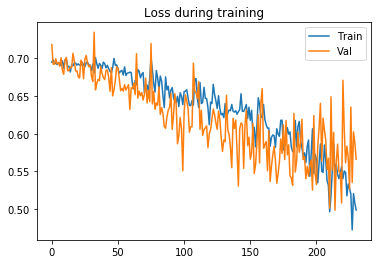

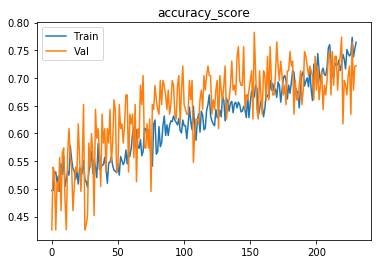

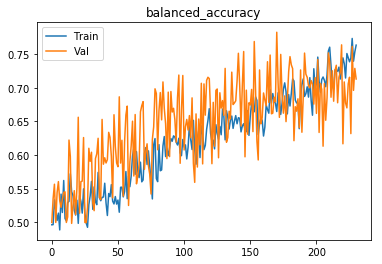

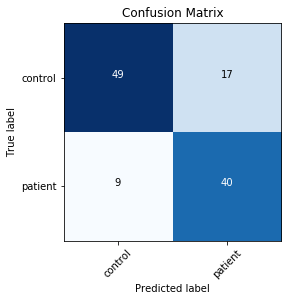

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69475
[0,     4] loss: 0.70940
Time elapsed: 0h:0m:9s
train accuracy_score: 50.73 %
train balanced_accuracy: 50.82 %
val accuracy_score: 57.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.680683
[1,     2] loss: 0.69724
[1,     4] loss: 0.68485
Time elapsed: 0h:0m:20s
train accuracy_score: 51.75 %
train balanced_accuracy: 52.15 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.714793
[2,     2] loss: 0.68914
[2,     4] loss: 0.71435
Time elapsed: 0h:0m:30s
train accuracy_score: 51.32 %
train balanced_accuracy: 50.34 %
val accuracy_score: 53.04 %
val balanced_accuracy: 47.79 %
Val loss: 0.682658
[3,     2] loss: 0.69757
[3,     4] loss: 0.70467
Time elapsed: 0h:0m:41s
train accuracy_score: 49.42 %
train balanced_accuracy: 50.39 %
val accuracy_score: 43.48 %
val balanced_accuracy: 48.13 %
Val loss: 0.693016
[4,    

val accuracy_score: 53.04 %
val balanced_accuracy: 56.73 %
Val loss: 0.684560
[38,     2] loss: 0.68467
[38,     4] loss: 0.69371
Time elapsed: 0h:6m:54s
train accuracy_score: 54.53 %
train balanced_accuracy: 53.71 %
val accuracy_score: 55.65 %
val balanced_accuracy: 56.11 %
Val loss: 0.679659
[39,     2] loss: 0.68670
[39,     4] loss: 0.68218
Time elapsed: 0h:7m:5s
train accuracy_score: 54.09 %
train balanced_accuracy: 53.66 %
val accuracy_score: 62.61 %
val balanced_accuracy: 63.48 %
Val loss: 0.659413
[40,     2] loss: 0.68886
[40,     4] loss: 0.68179
Time elapsed: 0h:7m:15s
train accuracy_score: 54.82 %
train balanced_accuracy: 54.62 %
val accuracy_score: 58.26 %
val balanced_accuracy: 58.91 %
Val loss: 0.660586
[41,     2] loss: 0.67331
[41,     4] loss: 0.69010
Time elapsed: 0h:7m:26s
train accuracy_score: 55.56 %
train balanced_accuracy: 54.93 %
val accuracy_score: 57.39 %
val balanced_accuracy: 56.05 %
Val loss: 0.666451
[42,     2] loss: 0.68784
[42,     4] loss: 0.68786
Tim

val accuracy_score: 60.87 %
val balanced_accuracy: 63.02 %
Val loss: 0.655415
[76,     2] loss: 0.67684
[76,     4] loss: 0.67254
Time elapsed: 0h:13m:40s
train accuracy_score: 58.48 %
train balanced_accuracy: 58.54 %
val accuracy_score: 70.43 %
val balanced_accuracy: 67.93 %
Val loss: 0.635015
[77,     2] loss: 0.65570
[77,     4] loss: 0.68802
Time elapsed: 0h:13m:51s
train accuracy_score: 57.31 %
train balanced_accuracy: 56.96 %
val accuracy_score: 64.35 %
val balanced_accuracy: 67.89 %
Val loss: 0.635924
[78,     2] loss: 0.65250
[78,     4] loss: 0.64721
Time elapsed: 0h:14m:2s
train accuracy_score: 61.40 %
train balanced_accuracy: 61.08 %
val accuracy_score: 63.48 %
val balanced_accuracy: 60.56 %
Val loss: 0.618298
[79,     2] loss: 0.66725
[79,     4] loss: 0.66566
Time elapsed: 0h:14m:12s
train accuracy_score: 59.36 %
train balanced_accuracy: 59.24 %
val accuracy_score: 69.57 %
val balanced_accuracy: 70.33 %
Val loss: 0.611831
[80,     2] loss: 0.65578
[80,     4] loss: 0.66018

Time elapsed: 0h:20m:17s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.69 %
val accuracy_score: 72.17 %
val balanced_accuracy: 70.50 %
Val loss: 0.567169
[114,     2] loss: 0.63146
[114,     4] loss: 0.64315
Time elapsed: 0h:20m:28s
train accuracy_score: 64.77 %
train balanced_accuracy: 64.92 %
val accuracy_score: 67.83 %
val balanced_accuracy: 70.92 %
Val loss: 0.610963
[115,     2] loss: 0.64167
[115,     4] loss: 0.63045
Time elapsed: 0h:20m:39s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.89 %
val accuracy_score: 66.96 %
val balanced_accuracy: 62.80 %
Val loss: 0.581517
[116,     2] loss: 0.64501
[116,     4] loss: 0.63667
Time elapsed: 0h:20m:50s
train accuracy_score: 62.72 %
train balanced_accuracy: 62.77 %
val accuracy_score: 69.57 %
val balanced_accuracy: 70.07 %
Val loss: 0.586977
[117,     2] loss: 0.63413
[117,     4] loss: 0.60655
Time elapsed: 0h:21m:1s
train accuracy_score: 64.62 %
train balanced_accuracy: 64.65 %
val accuracy_score: 73.04 %
val b

val accuracy_score: 76.52 %
val balanced_accuracy: 75.34 %
Val loss: 0.538825
[151,     2] loss: 0.59695
[151,     4] loss: 0.59201
Time elapsed: 0h:27m:4s
train accuracy_score: 68.86 %
train balanced_accuracy: 68.74 %
val accuracy_score: 75.65 %
val balanced_accuracy: 74.32 %
Val loss: 0.546280
[152,     2] loss: 0.57130
[152,     4] loss: 0.62931
Time elapsed: 0h:27m:15s
train accuracy_score: 68.57 %
train balanced_accuracy: 68.52 %
val accuracy_score: 67.83 %
val balanced_accuracy: 68.03 %
Val loss: 0.575599
[153,     2] loss: 0.60160
[153,     4] loss: 0.56565
Time elapsed: 0h:27m:26s
train accuracy_score: 67.40 %
train balanced_accuracy: 67.30 %
val accuracy_score: 70.43 %
val balanced_accuracy: 71.09 %
Val loss: 0.596381
[154,     2] loss: 0.59541
[154,     4] loss: 0.59457
Time elapsed: 0h:27m:37s
train accuracy_score: 67.98 %
train balanced_accuracy: 67.77 %
val accuracy_score: 68.70 %
val balanced_accuracy: 65.37 %
Val loss: 0.572135
[155,     2] loss: 0.61556
[155,     4] los

[188,     2] loss: 0.60547
[188,     4] loss: 0.59754
Time elapsed: 0h:33m:42s
train accuracy_score: 68.42 %
train balanced_accuracy: 68.26 %
val accuracy_score: 75.65 %
val balanced_accuracy: 74.32 %
Val loss: 0.518994
[189,     2] loss: 0.58947
[189,     4] loss: 0.54138
Time elapsed: 0h:33m:53s
train accuracy_score: 71.05 %
train balanced_accuracy: 70.84 %
val accuracy_score: 71.30 %
val balanced_accuracy: 70.01 %
Val loss: 0.512927
[190,     2] loss: 0.54079
[190,     4] loss: 0.51814
Time elapsed: 0h:34m:4s
train accuracy_score: 73.54 %
train balanced_accuracy: 73.50 %
val accuracy_score: 70.43 %
val balanced_accuracy: 71.88 %
Val loss: 0.545231
[191,     2] loss: 0.54820
[191,     4] loss: 0.58291
Time elapsed: 0h:34m:15s
train accuracy_score: 70.91 %
train balanced_accuracy: 70.95 %
val accuracy_score: 69.57 %
val balanced_accuracy: 68.23 %
Val loss: 0.547815
[192,     2] loss: 0.56424
[192,     4] loss: 0.53825
Time elapsed: 0h:34m:26s
train accuracy_score: 71.05 %
train balanc

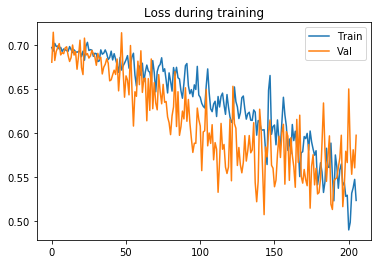

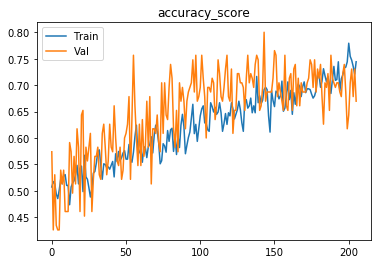

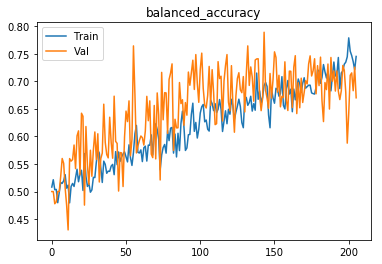

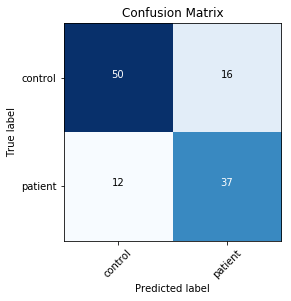

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69265
[0,     4] loss: 0.70807
Time elapsed: 0h:0m:9s
train accuracy_score: 51.75 %
train balanced_accuracy: 51.36 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.743500
[1,     2] loss: 0.70742
[1,     4] loss: 0.69677
Time elapsed: 0h:0m:20s
train accuracy_score: 49.27 %
train balanced_accuracy: 48.49 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.701655
[2,     2] loss: 0.69554
[2,     4] loss: 0.68978
Time elapsed: 0h:0m:31s
train accuracy_score: 52.34 %
train balanced_accuracy: 51.24 %
val accuracy_score: 49.57 %
val balanced_accuracy: 52.91 %
Val loss: 0.695774
[3,     2] loss: 0.69565
[3,     4] loss: 0.70258
Time elapsed: 0h:0m:42s
train accuracy_score: 48.39 %
train balanced_accuracy: 48.20 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.706873
[4,    

val accuracy_score: 66.96 %
val balanced_accuracy: 65.17 %
Val loss: 0.651195
[38,     2] loss: 0.67674
[38,     4] loss: 0.67623
Time elapsed: 0h:7m:1s
train accuracy_score: 57.46 %
train balanced_accuracy: 56.65 %
val accuracy_score: 65.22 %
val balanced_accuracy: 65.23 %
Val loss: 0.668191
[39,     2] loss: 0.66365
[39,     4] loss: 0.68364
Time elapsed: 0h:7m:12s
train accuracy_score: 59.21 %
train balanced_accuracy: 59.14 %
val accuracy_score: 73.91 %
val balanced_accuracy: 72.54 %
Val loss: 0.595177
[40,     2] loss: 0.66375
[40,     4] loss: 0.68154
Time elapsed: 0h:7m:23s
train accuracy_score: 59.21 %
train balanced_accuracy: 59.07 %
val accuracy_score: 64.35 %
val balanced_accuracy: 63.16 %
Val loss: 0.642565
[41,     2] loss: 0.67297
[41,     4] loss: 0.66655
Time elapsed: 0h:7m:34s
train accuracy_score: 63.16 %
train balanced_accuracy: 63.29 %
val accuracy_score: 63.48 %
val balanced_accuracy: 66.87 %
Val loss: 0.658575
[42,     2] loss: 0.66969
[42,     4] loss: 0.69771
Tim

val accuracy_score: 65.22 %
val balanced_accuracy: 68.12 %
Val loss: 0.612335
[76,     2] loss: 0.65502
[76,     4] loss: 0.64255
Time elapsed: 0h:13m:43s
train accuracy_score: 60.67 %
train balanced_accuracy: 60.63 %
val accuracy_score: 67.83 %
val balanced_accuracy: 67.76 %
Val loss: 0.593035
[77,     2] loss: 0.63854
[77,     4] loss: 0.67144
Time elapsed: 0h:13m:53s
train accuracy_score: 61.55 %
train balanced_accuracy: 61.07 %
val accuracy_score: 72.17 %
val balanced_accuracy: 68.66 %
Val loss: 0.574256
[78,     2] loss: 0.65386
[78,     4] loss: 0.61218
Time elapsed: 0h:14m:3s
train accuracy_score: 63.60 %
train balanced_accuracy: 64.04 %
val accuracy_score: 66.96 %
val balanced_accuracy: 70.42 %
Val loss: 0.639640
[79,     2] loss: 0.64542
[79,     4] loss: 0.67653
Time elapsed: 0h:14m:14s
train accuracy_score: 62.28 %
train balanced_accuracy: 61.63 %
val accuracy_score: 58.26 %
val balanced_accuracy: 54.44 %
Val loss: 0.628954
[80,     2] loss: 0.65124
[80,     4] loss: 0.65244

Time elapsed: 0h:20m:17s
train accuracy_score: 62.13 %
train balanced_accuracy: 61.76 %
val accuracy_score: 70.43 %
val balanced_accuracy: 68.46 %
Val loss: 0.605443
[114,     2] loss: 0.63028
[114,     4] loss: 0.62230
Time elapsed: 0h:20m:27s
train accuracy_score: 66.23 %
train balanced_accuracy: 66.28 %
val accuracy_score: 70.43 %
val balanced_accuracy: 71.88 %
Val loss: 0.571156
[115,     2] loss: 0.62622
[115,     4] loss: 0.61241
Time elapsed: 0h:20m:37s
train accuracy_score: 66.23 %
train balanced_accuracy: 66.15 %
val accuracy_score: 73.91 %
val balanced_accuracy: 72.80 %
Val loss: 0.591120
[116,     2] loss: 0.63267
[116,     4] loss: 0.64707
Time elapsed: 0h:20m:47s
train accuracy_score: 63.30 %
train balanced_accuracy: 62.96 %
val accuracy_score: 68.70 %
val balanced_accuracy: 64.84 %
Val loss: 0.589525
[117,     2] loss: 0.63165
[117,     4] loss: 0.59572
Time elapsed: 0h:20m:58s
train accuracy_score: 65.06 %
train balanced_accuracy: 65.10 %
val accuracy_score: 73.04 %
val 

val accuracy_score: 72.17 %
val balanced_accuracy: 74.18 %
Val loss: 0.533816
[151,     2] loss: 0.54340
[151,     4] loss: 0.60444
Time elapsed: 0h:27m:0s
train accuracy_score: 71.49 %
train balanced_accuracy: 71.50 %
val accuracy_score: 64.35 %
val balanced_accuracy: 63.16 %
Val loss: 0.575442
[152,     2] loss: 0.52624
[152,     4] loss: 0.59533
Time elapsed: 0h:27m:11s
train accuracy_score: 71.05 %
train balanced_accuracy: 71.06 %
val accuracy_score: 70.43 %
val balanced_accuracy: 71.09 %
Val loss: 0.533457
[153,     2] loss: 0.60133
[153,     4] loss: 0.58739
Time elapsed: 0h:27m:22s
train accuracy_score: 68.27 %
train balanced_accuracy: 68.24 %
val accuracy_score: 69.57 %
val balanced_accuracy: 68.23 %
Val loss: 0.573299
[154,     2] loss: 0.56431
[154,     4] loss: 0.55107
Time elapsed: 0h:27m:32s
train accuracy_score: 70.91 %
train balanced_accuracy: 70.87 %
val accuracy_score: 73.04 %
val balanced_accuracy: 74.15 %
Val loss: 0.552847
[155,     2] loss: 0.60175
[155,     4] los

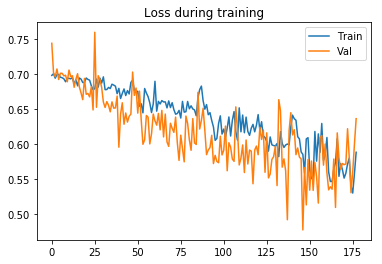

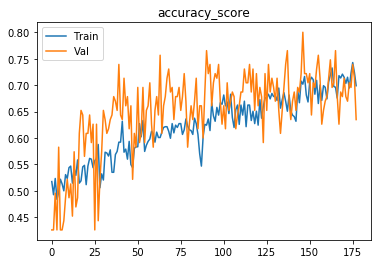

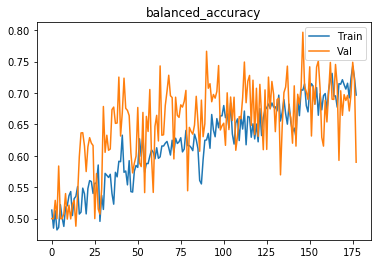

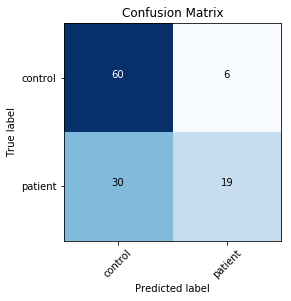

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69178
[0,     4] loss: 0.70157
Time elapsed: 0h:0m:8s
train accuracy_score: 52.78 %
train balanced_accuracy: 52.59 %
val accuracy_score: 57.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.679846
[1,     2] loss: 0.70032
[1,     4] loss: 0.69288
Time elapsed: 0h:0m:19s
train accuracy_score: 49.71 %
train balanced_accuracy: 49.82 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.706398
[2,     2] loss: 0.70320
[2,     4] loss: 0.70259
Time elapsed: 0h:0m:29s
train accuracy_score: 47.51 %
train balanced_accuracy: 48.06 %
val accuracy_score: 47.83 %
val balanced_accuracy: 46.40 %
Val loss: 0.692426
[3,     2] loss: 0.69202
[3,     4] loss: 0.69100
Time elapsed: 0h:0m:40s
train accuracy_score: 51.75 %
train balanced_accuracy: 51.14 %
val accuracy_score: 42.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.706469
[4,    

val accuracy_score: 46.09 %
val balanced_accuracy: 52.50 %
Val loss: 0.708664
[38,     2] loss: 0.70552
[38,     4] loss: 0.69224
Time elapsed: 0h:6m:45s
train accuracy_score: 51.46 %
train balanced_accuracy: 51.04 %
val accuracy_score: 62.61 %
val balanced_accuracy: 58.49 %
Val loss: 0.667363
[39,     2] loss: 0.69113
[39,     4] loss: 0.68143
Time elapsed: 0h:6m:57s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.99 %
val accuracy_score: 50.43 %
val balanced_accuracy: 56.56 %
Val loss: 0.696937
[40,     2] loss: 0.68432
[40,     4] loss: 0.69535
Time elapsed: 0h:7m:8s
train accuracy_score: 52.92 %
train balanced_accuracy: 52.22 %
val accuracy_score: 65.22 %
val balanced_accuracy: 60.24 %
Val loss: 0.663661
[41,     2] loss: 0.69685
[41,     4] loss: 0.68875
Time elapsed: 0h:7m:19s
train accuracy_score: 55.56 %
train balanced_accuracy: 55.95 %
val accuracy_score: 60.00 %
val balanced_accuracy: 60.68 %
Val loss: 0.666610
[42,     2] loss: 0.68378
[42,     4] loss: 0.66758
Tim

val accuracy_score: 60.87 %
val balanced_accuracy: 58.02 %
Val loss: 0.652833
[76,     2] loss: 0.65510
[76,     4] loss: 0.67409
Time elapsed: 0h:13m:33s
train accuracy_score: 60.23 %
train balanced_accuracy: 60.40 %
val accuracy_score: 58.26 %
val balanced_accuracy: 61.53 %
Val loss: 0.677374
[77,     2] loss: 0.66378
[77,     4] loss: 0.66360
Time elapsed: 0h:13m:44s
train accuracy_score: 60.67 %
train balanced_accuracy: 60.37 %
val accuracy_score: 63.48 %
val balanced_accuracy: 62.93 %
Val loss: 0.629406
[78,     2] loss: 0.66423
[78,     4] loss: 0.66722
Time elapsed: 0h:13m:55s
train accuracy_score: 58.77 %
train balanced_accuracy: 58.43 %
val accuracy_score: 65.22 %
val balanced_accuracy: 61.81 %
Val loss: 0.636800
[79,     2] loss: 0.67166
[79,     4] loss: 0.67311
Time elapsed: 0h:14m:6s
train accuracy_score: 58.63 %
train balanced_accuracy: 59.13 %
val accuracy_score: 53.91 %
val balanced_accuracy: 59.85 %
Val loss: 0.695413
[80,     2] loss: 0.65956
[80,     4] loss: 0.66440

Time elapsed: 0h:20m:11s
train accuracy_score: 64.62 %
train balanced_accuracy: 64.75 %
val accuracy_score: 58.26 %
val balanced_accuracy: 62.06 %
Val loss: 0.642615
[114,     2] loss: 0.63956
[114,     4] loss: 0.63740
Time elapsed: 0h:20m:21s
train accuracy_score: 63.74 %
train balanced_accuracy: 63.23 %
val accuracy_score: 59.13 %
val balanced_accuracy: 54.14 %
Val loss: 0.630053
[115,     2] loss: 0.63006
[115,     4] loss: 0.64278
Time elapsed: 0h:20m:31s
train accuracy_score: 64.33 %
train balanced_accuracy: 64.53 %
val accuracy_score: 69.57 %
val balanced_accuracy: 72.17 %
Val loss: 0.594437
[116,     2] loss: 0.65758
[116,     4] loss: 0.67580
Time elapsed: 0h:20m:41s
train accuracy_score: 61.55 %
train balanced_accuracy: 61.47 %
val accuracy_score: 59.13 %
val balanced_accuracy: 56.25 %
Val loss: 0.608355
[117,     2] loss: 0.62334
[117,     4] loss: 0.59767
Time elapsed: 0h:20m:52s
train accuracy_score: 64.62 %
train balanced_accuracy: 64.53 %
val accuracy_score: 72.17 %
val 

val accuracy_score: 69.57 %
val balanced_accuracy: 67.44 %
Val loss: 0.592012
[151,     2] loss: 0.59715
[151,     4] loss: 0.60432
Time elapsed: 0h:27m:0s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.69 %
val accuracy_score: 72.17 %
val balanced_accuracy: 72.87 %
Val loss: 0.593806
[152,     2] loss: 0.61260
[152,     4] loss: 0.57079
Time elapsed: 0h:27m:10s
train accuracy_score: 68.27 %
train balanced_accuracy: 68.29 %
val accuracy_score: 67.83 %
val balanced_accuracy: 65.66 %
Val loss: 0.547211
[153,     2] loss: 0.62989
[153,     4] loss: 0.58941
Time elapsed: 0h:27m:21s
train accuracy_score: 67.11 %
train balanced_accuracy: 67.25 %
val accuracy_score: 75.65 %
val balanced_accuracy: 75.90 %
Val loss: 0.538719
[154,     2] loss: 0.58815
[154,     4] loss: 0.62426
Time elapsed: 0h:27m:31s
train accuracy_score: 69.30 %
train balanced_accuracy: 69.59 %
val accuracy_score: 71.30 %
val balanced_accuracy: 72.37 %
Val loss: 0.574592
[155,     2] loss: 0.60043
[155,     4] los

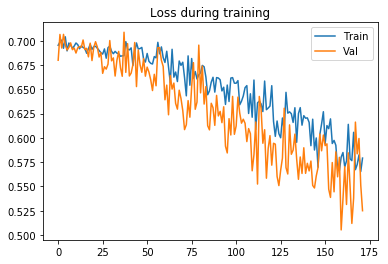

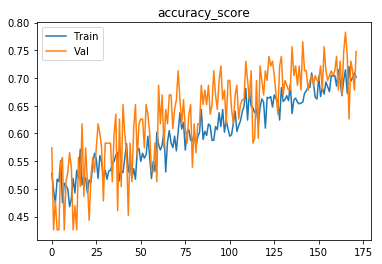

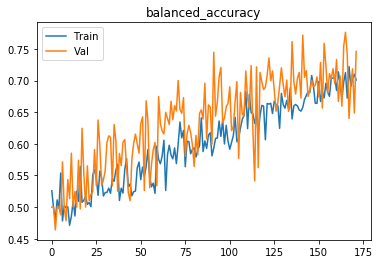

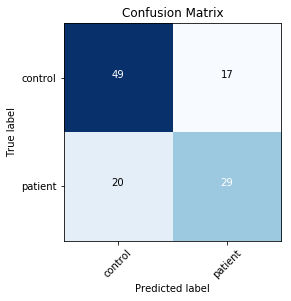

Finished outer fold.
{'final_acc': 0.7461348175633891, 'best_acc': 0.7534013605442177, 'final_iter': 168, 'best_iter': 108, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 6
# of patients 407, # of healthy controls 404
708
103
(708, 96, 114, 96)
(103, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69533
[0,     4] loss: 0.70989
Time elapsed: 0h:0m:10s
train accuracy_score: 49.58 %
train balanced_accuracy: 49.34 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.724448
[1,     2] loss: 0.69042
[1,     4] loss: 0.69493
Time elapsed: 0h:0m:20s
train accuracy_score: 52.12 %
train balanced_accuracy: 50.62 %
val accuracy_score: 59.22 %
val balanced_accuracy: 51.61 %
Val loss: 0.687004
[2,     2] loss: 0.69757
[2,     4] loss: 0.69363
Time elapsed: 0h:0m:30s
train accuracy_s

[36,     2] loss: 0.68909
[36,     4] loss: 0.67038
Time elapsed: 0h:6m:27s
train accuracy_score: 55.65 %
train balanced_accuracy: 56.10 %
val accuracy_score: 44.66 %
val balanced_accuracy: 52.02 %
Val loss: 0.708880
[37,     2] loss: 0.67019
[37,     4] loss: 0.67304
Time elapsed: 0h:6m:38s
train accuracy_score: 56.50 %
train balanced_accuracy: 56.23 %
val accuracy_score: 71.84 %
val balanced_accuracy: 66.94 %
Val loss: 0.640016
[38,     2] loss: 0.67283
[38,     4] loss: 0.68111
Time elapsed: 0h:6m:48s
train accuracy_score: 57.91 %
train balanced_accuracy: 57.56 %
val accuracy_score: 60.19 %
val balanced_accuracy: 60.62 %
Val loss: 0.679533
[39,     2] loss: 0.67422
[39,     4] loss: 0.65711
Time elapsed: 0h:6m:59s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.28 %
val accuracy_score: 54.37 %
val balanced_accuracy: 54.03 %
Val loss: 0.685825
[40,     2] loss: 0.65446
[40,     4] loss: 0.66198
Time elapsed: 0h:7m:8s
train accuracy_score: 59.32 %
train balanced_accuracy: 59

[74,     2] loss: 0.67940
[74,     4] loss: 0.71395
Time elapsed: 0h:13m:14s
train accuracy_score: 58.33 %
train balanced_accuracy: 59.27 %
val accuracy_score: 56.31 %
val balanced_accuracy: 59.72 %
Val loss: 0.700233
[75,     2] loss: 0.65866
[75,     4] loss: 0.65165
Time elapsed: 0h:13m:25s
train accuracy_score: 58.76 %
train balanced_accuracy: 57.55 %
val accuracy_score: 64.08 %
val balanced_accuracy: 62.42 %
Val loss: 0.637306
[76,     2] loss: 0.64720
[76,     4] loss: 0.70341
Time elapsed: 0h:13m:36s
train accuracy_score: 59.46 %
train balanced_accuracy: 60.47 %
val accuracy_score: 63.11 %
val balanced_accuracy: 59.80 %
Val loss: 0.633239
[77,     2] loss: 0.64979
[77,     4] loss: 0.67523
Time elapsed: 0h:13m:47s
train accuracy_score: 58.33 %
train balanced_accuracy: 57.65 %
val accuracy_score: 54.37 %
val balanced_accuracy: 61.79 %
Val loss: 0.697746
[78,     2] loss: 0.64561
[78,     4] loss: 0.64319
Time elapsed: 0h:13m:58s
train accuracy_score: 60.45 %
train balanced_accura

val accuracy_score: 62.14 %
val balanced_accuracy: 65.40 %
Val loss: 0.703109
[112,     2] loss: 0.59579
[112,     4] loss: 0.56744
Time elapsed: 0h:20m:3s
train accuracy_score: 68.64 %
train balanced_accuracy: 68.48 %
val accuracy_score: 66.02 %
val balanced_accuracy: 64.46 %
Val loss: 0.604372
[113,     2] loss: 0.53999
[113,     4] loss: 0.62264
Time elapsed: 0h:20m:14s
train accuracy_score: 70.06 %
train balanced_accuracy: 69.96 %
val accuracy_score: 62.14 %
val balanced_accuracy: 64.94 %
Val loss: 0.618362
[114,     2] loss: 0.57426
[114,     4] loss: 0.57612
Time elapsed: 0h:20m:24s
train accuracy_score: 69.92 %
train balanced_accuracy: 69.86 %
val accuracy_score: 74.76 %
val balanced_accuracy: 76.63 %
Val loss: 0.589653
[115,     2] loss: 0.56262
[115,     4] loss: 0.61858
Time elapsed: 0h:20m:35s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.48 %
val accuracy_score: 67.96 %
val balanced_accuracy: 66.51 %
Val loss: 0.614338
[116,     2] loss: 0.55273
[116,     4] los

[149,     2] loss: 0.55070
[149,     4] loss: 0.52036
Time elapsed: 0h:26m:33s
train accuracy_score: 72.88 %
train balanced_accuracy: 73.00 %
val accuracy_score: 61.17 %
val balanced_accuracy: 62.78 %
Val loss: 0.678198
[150,     2] loss: 0.55642
[150,     4] loss: 0.52868
Time elapsed: 0h:26m:43s
train accuracy_score: 69.77 %
train balanced_accuracy: 69.73 %
val accuracy_score: 73.79 %
val balanced_accuracy: 72.64 %
Val loss: 0.596671
[151,     2] loss: 0.59017
[151,     4] loss: 0.59245
Time elapsed: 0h:26m:54s
train accuracy_score: 69.07 %
train balanced_accuracy: 68.79 %
val accuracy_score: 67.96 %
val balanced_accuracy: 65.14 %
Val loss: 0.634615
[152,     2] loss: 0.58999
[152,     4] loss: 0.56711
Time elapsed: 0h:27m:4s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.82 %
val accuracy_score: 61.17 %
val balanced_accuracy: 63.69 %
Val loss: 0.669698
[153,     2] loss: 0.54171
[153,     4] loss: 0.56383
Time elapsed: 0h:27m:14s
train accuracy_score: 71.33 %
train balanc

val accuracy_score: 63.11 %
val balanced_accuracy: 63.00 %
Val loss: 0.740406
[187,     2] loss: 0.49010
[187,     4] loss: 0.49662
Time elapsed: 0h:33m:19s
train accuracy_score: 76.13 %
train balanced_accuracy: 76.21 %
val accuracy_score: 66.99 %
val balanced_accuracy: 69.82 %
Val loss: 0.663526
Early stopping in epoch 188
Total time elapsed: 0h:33m:21s
Writing model to disk...
Best result during training: 0.76. Saving model..
Finished inner fold.


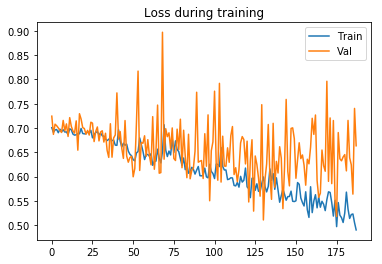

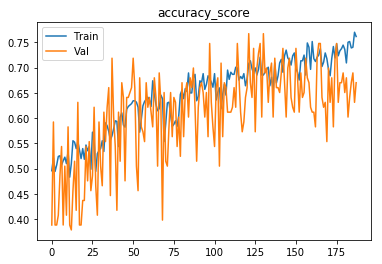

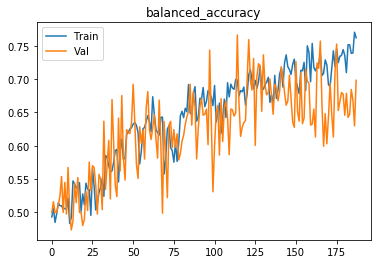

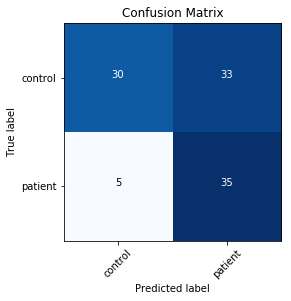

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69714
[0,     4] loss: 0.68914
Time elapsed: 0h:0m:8s
train accuracy_score: 50.85 %
train balanced_accuracy: 49.51 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.709621
[1,     2] loss: 0.69032
[1,     4] loss: 0.69328
Time elapsed: 0h:0m:19s
train accuracy_score: 52.40 %
train balanced_accuracy: 50.96 %
val accuracy_score: 59.22 %
val balanced_accuracy: 48.41 %
Val loss: 0.681188
[2,     2] loss: 0.69440
[2,     4] loss: 0.69100
Time elapsed: 0h:0m:30s
train accuracy_score: 52.54 %
train balanced_accuracy: 52.89 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.731071
[3,     2] loss: 0.69729
[3,     4] loss: 0.70169
Time elapsed: 0h:0m:41s
train accuracy_score: 49.72 %
train balanced_accuracy: 49.22 %
val accuracy_score: 58.25 %
val balanced_accuracy: 54.46 %
Val loss: 0.690222
[4,    

val accuracy_score: 52.43 %
val balanced_accuracy: 56.09 %
Val loss: 0.685896
[38,     2] loss: 0.66339
[38,     4] loss: 0.66946
Time elapsed: 0h:6m:58s
train accuracy_score: 59.60 %
train balanced_accuracy: 59.20 %
val accuracy_score: 65.05 %
val balanced_accuracy: 65.04 %
Val loss: 0.636960
[39,     2] loss: 0.65180
[39,     4] loss: 0.67515
Time elapsed: 0h:7m:9s
train accuracy_score: 60.45 %
train balanced_accuracy: 60.48 %
val accuracy_score: 53.40 %
val balanced_accuracy: 57.80 %
Val loss: 0.722500
[40,     2] loss: 0.67616
[40,     4] loss: 0.66552
Time elapsed: 0h:7m:20s
train accuracy_score: 58.05 %
train balanced_accuracy: 57.91 %
val accuracy_score: 66.02 %
val balanced_accuracy: 67.66 %
Val loss: 0.643080
[41,     2] loss: 0.67570
[41,     4] loss: 0.67386
Time elapsed: 0h:7m:32s
train accuracy_score: 56.50 %
train balanced_accuracy: 56.31 %
val accuracy_score: 60.19 %
val balanced_accuracy: 62.44 %
Val loss: 0.663806
[42,     2] loss: 0.65287
[42,     4] loss: 0.65992
Tim

val accuracy_score: 67.96 %
val balanced_accuracy: 67.88 %
Val loss: 0.618119
[76,     2] loss: 0.59583
[76,     4] loss: 0.64793
Time elapsed: 0h:13m:33s
train accuracy_score: 66.95 %
train balanced_accuracy: 66.96 %
val accuracy_score: 66.99 %
val balanced_accuracy: 68.00 %
Val loss: 0.598950
[77,     2] loss: 0.60514
[77,     4] loss: 0.62711
Time elapsed: 0h:13m:44s
train accuracy_score: 66.10 %
train balanced_accuracy: 65.91 %
val accuracy_score: 70.87 %
val balanced_accuracy: 71.63 %
Val loss: 0.582365
[78,     2] loss: 0.62584
[78,     4] loss: 0.63814
Time elapsed: 0h:13m:55s
train accuracy_score: 65.11 %
train balanced_accuracy: 64.96 %
val accuracy_score: 70.87 %
val balanced_accuracy: 70.26 %
Val loss: 0.625252
[79,     2] loss: 0.60941
[79,     4] loss: 0.65166
Time elapsed: 0h:14m:5s
train accuracy_score: 65.82 %
train balanced_accuracy: 66.14 %
val accuracy_score: 49.51 %
val balanced_accuracy: 54.17 %
Val loss: 0.737538
[80,     2] loss: 0.61263
[80,     4] loss: 0.64259

Time elapsed: 0h:20m:7s
train accuracy_score: 72.32 %
train balanced_accuracy: 72.29 %
val accuracy_score: 64.08 %
val balanced_accuracy: 62.42 %
Val loss: 0.644418
[114,     2] loss: 0.58224
[114,     4] loss: 0.53690
Time elapsed: 0h:20m:17s
train accuracy_score: 70.76 %
train balanced_accuracy: 70.69 %
val accuracy_score: 67.96 %
val balanced_accuracy: 65.14 %
Val loss: 0.603440
[115,     2] loss: 0.58223
[115,     4] loss: 0.55336
Time elapsed: 0h:20m:28s
train accuracy_score: 72.32 %
train balanced_accuracy: 72.43 %
val accuracy_score: 57.28 %
val balanced_accuracy: 61.88 %
Val loss: 0.750938
[116,     2] loss: 0.61590
[116,     4] loss: 0.52044
Time elapsed: 0h:20m:38s
train accuracy_score: 69.77 %
train balanced_accuracy: 69.72 %
val accuracy_score: 65.05 %
val balanced_accuracy: 60.48 %
Val loss: 0.649641
[117,     2] loss: 0.60256
[117,     4] loss: 0.59217
Time elapsed: 0h:20m:49s
train accuracy_score: 69.35 %
train balanced_accuracy: 69.23 %
val accuracy_score: 63.11 %
val b

val accuracy_score: 64.08 %
val balanced_accuracy: 68.81 %
Val loss: 0.706706
[151,     2] loss: 0.55899
[151,     4] loss: 0.53452
Time elapsed: 0h:26m:43s
train accuracy_score: 72.74 %
train balanced_accuracy: 72.55 %
val accuracy_score: 65.05 %
val balanced_accuracy: 60.02 %
Val loss: 0.668101
[152,     2] loss: 0.50399
[152,     4] loss: 0.56019
Time elapsed: 0h:26m:53s
train accuracy_score: 75.14 %
train balanced_accuracy: 75.21 %
val accuracy_score: 62.14 %
val balanced_accuracy: 64.94 %
Val loss: 0.640043
[153,     2] loss: 0.54981
[153,     4] loss: 0.53208
Time elapsed: 0h:27m:4s
train accuracy_score: 72.88 %
train balanced_accuracy: 72.66 %
val accuracy_score: 76.70 %
val balanced_accuracy: 74.56 %
Val loss: 0.591938
[154,     2] loss: 0.55608
[154,     4] loss: 0.50649
Time elapsed: 0h:27m:15s
train accuracy_score: 73.16 %
train balanced_accuracy: 73.11 %
val accuracy_score: 69.90 %
val balanced_accuracy: 69.01 %
Val loss: 0.589441
[155,     2] loss: 0.55526
[155,     4] los

[188,     2] loss: 0.50517
[188,     4] loss: 0.53023
Time elapsed: 0h:33m:18s
train accuracy_score: 75.14 %
train balanced_accuracy: 75.00 %
val accuracy_score: 67.96 %
val balanced_accuracy: 66.96 %
Val loss: 0.654885
[189,     2] loss: 0.52897
[189,     4] loss: 0.50277
Time elapsed: 0h:33m:29s
train accuracy_score: 74.58 %
train balanced_accuracy: 74.69 %
val accuracy_score: 67.96 %
val balanced_accuracy: 67.88 %
Val loss: 0.604008
[190,     2] loss: 0.47625
[190,     4] loss: 0.46100
Time elapsed: 0h:33m:39s
train accuracy_score: 77.82 %
train balanced_accuracy: 77.82 %
val accuracy_score: 70.87 %
val balanced_accuracy: 70.26 %
Val loss: 0.665780
Early stopping in epoch 191
Total time elapsed: 0h:33m:41s
Writing model to disk...
Best result during training: 0.75. Saving model..
Finished inner fold.


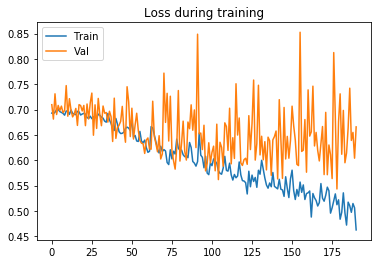

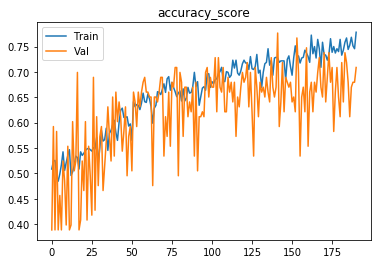

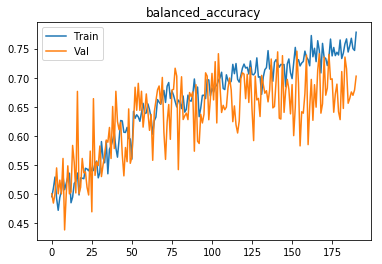

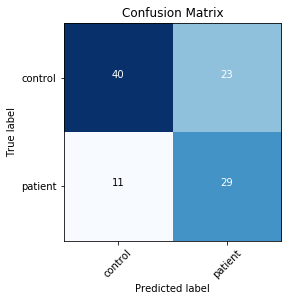

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69334
[0,     4] loss: 0.70566
Time elapsed: 0h:0m:8s
train accuracy_score: 52.54 %
train balanced_accuracy: 51.95 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.701132
[1,     2] loss: 0.69225
[1,     4] loss: 0.69938
Time elapsed: 0h:0m:18s
train accuracy_score: 50.14 %
train balanced_accuracy: 49.79 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.704514
[2,     2] loss: 0.69679
[2,     4] loss: 0.69613
Time elapsed: 0h:0m:29s
train accuracy_score: 47.74 %
train balanced_accuracy: 47.59 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.703003
[3,     2] loss: 0.69213
[3,     4] loss: 0.68924
Time elapsed: 0h:0m:39s
train accuracy_score: 51.41 %
train balanced_accuracy: 49.80 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.716477
[4,    

val accuracy_score: 43.69 %
val balanced_accuracy: 52.60 %
Val loss: 0.727793
[38,     2] loss: 0.68203
[38,     4] loss: 0.70062
Time elapsed: 0h:6m:50s
train accuracy_score: 57.20 %
train balanced_accuracy: 57.33 %
val accuracy_score: 57.28 %
val balanced_accuracy: 63.25 %
Val loss: 0.696054
[39,     2] loss: 0.68234
[39,     4] loss: 0.64153
Time elapsed: 0h:7m:1s
train accuracy_score: 57.20 %
train balanced_accuracy: 56.26 %
val accuracy_score: 64.08 %
val balanced_accuracy: 62.42 %
Val loss: 0.660695
[40,     2] loss: 0.65164
[40,     4] loss: 0.65410
Time elapsed: 0h:7m:12s
train accuracy_score: 63.42 %
train balanced_accuracy: 63.46 %
val accuracy_score: 64.08 %
val balanced_accuracy: 64.70 %
Val loss: 0.656251
[41,     2] loss: 0.64623
[41,     4] loss: 0.65043
Time elapsed: 0h:7m:22s
train accuracy_score: 62.29 %
train balanced_accuracy: 61.90 %
val accuracy_score: 48.54 %
val balanced_accuracy: 53.83 %
Val loss: 0.709885
[42,     2] loss: 0.65501
[42,     4] loss: 0.65569
Tim

val accuracy_score: 65.05 %
val balanced_accuracy: 66.41 %
Val loss: 0.651440
[76,     2] loss: 0.62387
[76,     4] loss: 0.60134
Time elapsed: 0h:13m:22s
train accuracy_score: 66.38 %
train balanced_accuracy: 66.10 %
val accuracy_score: 66.02 %
val balanced_accuracy: 61.73 %
Val loss: 0.614296
[77,     2] loss: 0.68142
[77,     4] loss: 0.61399
Time elapsed: 0h:13m:32s
train accuracy_score: 62.85 %
train balanced_accuracy: 62.88 %
val accuracy_score: 61.17 %
val balanced_accuracy: 59.58 %
Val loss: 0.625331
[78,     2] loss: 0.62404
[78,     4] loss: 0.63699
Time elapsed: 0h:13m:42s
train accuracy_score: 64.12 %
train balanced_accuracy: 64.09 %
val accuracy_score: 68.93 %
val balanced_accuracy: 67.76 %
Val loss: 0.624547
[79,     2] loss: 0.62280
[79,     4] loss: 0.62649
Time elapsed: 0h:13m:53s
train accuracy_score: 65.82 %
train balanced_accuracy: 66.28 %
val accuracy_score: 55.34 %
val balanced_accuracy: 62.12 %
Val loss: 0.708393
[80,     2] loss: 0.63633
[80,     4] loss: 0.6349

Time elapsed: 0h:19m:55s
train accuracy_score: 71.75 %
train balanced_accuracy: 71.86 %
val accuracy_score: 66.02 %
val balanced_accuracy: 68.57 %
Val loss: 0.699583
[114,     2] loss: 0.55480
[114,     4] loss: 0.60950
Time elapsed: 0h:20m:6s
train accuracy_score: 70.76 %
train balanced_accuracy: 70.68 %
val accuracy_score: 66.99 %
val balanced_accuracy: 68.45 %
Val loss: 0.598218
[115,     2] loss: 0.59466
[115,     4] loss: 0.58193
Time elapsed: 0h:20m:17s
train accuracy_score: 67.80 %
train balanced_accuracy: 67.77 %
val accuracy_score: 62.14 %
val balanced_accuracy: 61.75 %
Val loss: 0.610248
[116,     2] loss: 0.60453
[116,     4] loss: 0.57181
Time elapsed: 0h:20m:28s
train accuracy_score: 68.93 %
train balanced_accuracy: 68.86 %
val accuracy_score: 71.84 %
val balanced_accuracy: 72.42 %
Val loss: 0.615698
[117,     2] loss: 0.57792
[117,     4] loss: 0.56063
Time elapsed: 0h:20m:39s
train accuracy_score: 69.63 %
train balanced_accuracy: 69.63 %
val accuracy_score: 60.19 %
val b

val accuracy_score: 66.02 %
val balanced_accuracy: 65.83 %
Val loss: 0.627778
[151,     2] loss: 0.55042
[151,     4] loss: 0.56209
Time elapsed: 0h:26m:42s
train accuracy_score: 71.05 %
train balanced_accuracy: 70.96 %
val accuracy_score: 67.96 %
val balanced_accuracy: 69.25 %
Val loss: 0.612659
[152,     2] loss: 0.55261
[152,     4] loss: 0.55552
Time elapsed: 0h:26m:52s
train accuracy_score: 71.05 %
train balanced_accuracy: 70.93 %
val accuracy_score: 60.19 %
val balanced_accuracy: 60.16 %
Val loss: 0.668377
[153,     2] loss: 0.56489
[153,     4] loss: 0.49371
Time elapsed: 0h:27m:3s
train accuracy_score: 73.45 %
train balanced_accuracy: 73.62 %
val accuracy_score: 66.99 %
val balanced_accuracy: 68.00 %
Val loss: 0.662438
[154,     2] loss: 0.53586
[154,     4] loss: 0.53475
Time elapsed: 0h:27m:13s
train accuracy_score: 71.47 %
train balanced_accuracy: 71.53 %
val accuracy_score: 64.08 %
val balanced_accuracy: 65.62 %
Val loss: 0.641854
[155,     2] loss: 0.54912
[155,     4] los

[188,     2] loss: 0.49735
[188,     4] loss: 0.47422
Time elapsed: 0h:33m:10s
train accuracy_score: 75.28 %
train balanced_accuracy: 75.34 %
val accuracy_score: 67.96 %
val balanced_accuracy: 71.07 %
Val loss: 0.688187
Early stopping in epoch 189
Total time elapsed: 0h:33m:12s
Writing model to disk...
Best result during training: 0.74. Saving model..
Finished inner fold.


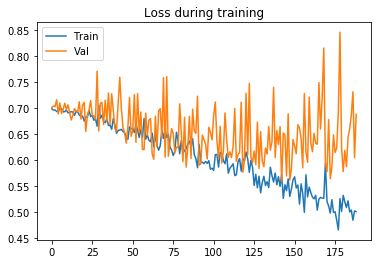

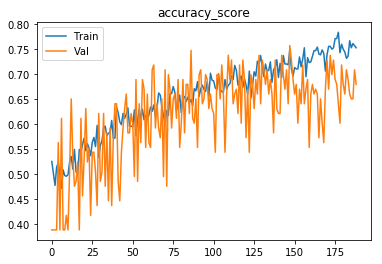

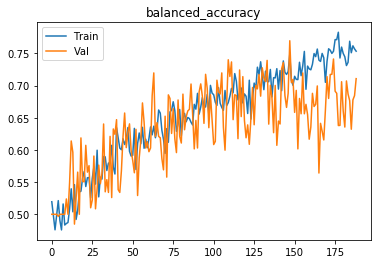

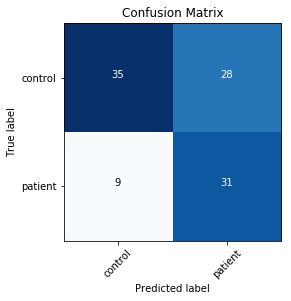

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69680
[0,     4] loss: 0.69361
Time elapsed: 0h:0m:8s
train accuracy_score: 49.86 %
train balanced_accuracy: 50.00 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.723229
[1,     2] loss: 0.70191
[1,     4] loss: 0.69645
Time elapsed: 0h:0m:18s
train accuracy_score: 51.84 %
train balanced_accuracy: 50.48 %
val accuracy_score: 61.17 %
val balanced_accuracy: 50.00 %
Val loss: 0.677294
[2,     2] loss: 0.70225
[2,     4] loss: 0.69064
Time elapsed: 0h:0m:29s
train accuracy_score: 49.72 %
train balanced_accuracy: 50.85 %
val accuracy_score: 44.66 %
val balanced_accuracy: 52.02 %
Val loss: 0.696786
[3,     2] loss: 0.69050
[3,     4] loss: 0.70033
Time elapsed: 0h:0m:39s
train accuracy_score: 50.85 %
train balanced_accuracy: 50.28 %
val accuracy_score: 54.37 %
val balanced_accuracy: 54.48 %
Val loss: 0.692720
[4,    

val accuracy_score: 46.60 %
val balanced_accuracy: 53.61 %
Val loss: 0.699911
[38,     2] loss: 0.67255
[38,     4] loss: 0.66935
Time elapsed: 0h:6m:59s
train accuracy_score: 56.21 %
train balanced_accuracy: 55.37 %
val accuracy_score: 59.22 %
val balanced_accuracy: 61.19 %
Val loss: 0.666295
[39,     2] loss: 0.66019
[39,     4] loss: 0.68232
Time elapsed: 0h:7m:10s
train accuracy_score: 58.62 %
train balanced_accuracy: 58.48 %
val accuracy_score: 56.31 %
val balanced_accuracy: 56.98 %
Val loss: 0.669797
[40,     2] loss: 0.66868
[40,     4] loss: 0.62381
Time elapsed: 0h:7m:21s
train accuracy_score: 62.15 %
train balanced_accuracy: 61.90 %
val accuracy_score: 60.19 %
val balanced_accuracy: 61.98 %
Val loss: 0.666640
[41,     2] loss: 0.65220
[41,     4] loss: 0.65756
Time elapsed: 0h:7m:32s
train accuracy_score: 60.31 %
train balanced_accuracy: 60.18 %
val accuracy_score: 51.46 %
val balanced_accuracy: 58.49 %
Val loss: 0.707000
[42,     2] loss: 0.65594
[42,     4] loss: 0.64308
Ti

val accuracy_score: 64.08 %
val balanced_accuracy: 61.96 %
Val loss: 0.645869
[76,     2] loss: 0.60466
[76,     4] loss: 0.60700
Time elapsed: 0h:13m:40s
train accuracy_score: 66.10 %
train balanced_accuracy: 66.36 %
val accuracy_score: 66.02 %
val balanced_accuracy: 70.40 %
Val loss: 0.651552
[77,     2] loss: 0.63298
[77,     4] loss: 0.60905
Time elapsed: 0h:13m:50s
train accuracy_score: 63.84 %
train balanced_accuracy: 63.96 %
val accuracy_score: 51.46 %
val balanced_accuracy: 58.95 %
Val loss: 0.732642
[78,     2] loss: 0.63303
[78,     4] loss: 0.59872
Time elapsed: 0h:14m:1s
train accuracy_score: 64.41 %
train balanced_accuracy: 64.33 %
val accuracy_score: 66.99 %
val balanced_accuracy: 71.19 %
Val loss: 0.695500
[79,     2] loss: 0.65058
[79,     4] loss: 0.62831
Time elapsed: 0h:14m:11s
train accuracy_score: 62.15 %
train balanced_accuracy: 61.78 %
val accuracy_score: 66.02 %
val balanced_accuracy: 62.18 %
Val loss: 0.607455
[80,     2] loss: 0.64541
[80,     4] loss: 0.61635

Time elapsed: 0h:20m:11s
train accuracy_score: 66.53 %
train balanced_accuracy: 66.43 %
val accuracy_score: 61.17 %
val balanced_accuracy: 63.69 %
Val loss: 0.645712
[114,     2] loss: 0.58869
[114,     4] loss: 0.58762
Time elapsed: 0h:20m:21s
train accuracy_score: 67.51 %
train balanced_accuracy: 67.57 %
val accuracy_score: 74.76 %
val balanced_accuracy: 75.26 %
Val loss: 0.580313
[115,     2] loss: 0.58221
[115,     4] loss: 0.59450
Time elapsed: 0h:20m:31s
train accuracy_score: 68.64 %
train balanced_accuracy: 68.50 %
val accuracy_score: 76.70 %
val balanced_accuracy: 75.93 %
Val loss: 0.589880
[116,     2] loss: 0.59542
[116,     4] loss: 0.58536
Time elapsed: 0h:20m:42s
train accuracy_score: 68.08 %
train balanced_accuracy: 68.04 %
val accuracy_score: 68.93 %
val balanced_accuracy: 69.58 %
Val loss: 0.602852
[117,     2] loss: 0.56601
[117,     4] loss: 0.56132
Time elapsed: 0h:20m:52s
train accuracy_score: 71.61 %
train balanced_accuracy: 71.55 %
val accuracy_score: 67.96 %
val 

val accuracy_score: 59.22 %
val balanced_accuracy: 63.02 %
Val loss: 0.770804
[151,     2] loss: 0.53571
[151,     4] loss: 0.52760
Time elapsed: 0h:26m:58s
train accuracy_score: 72.32 %
train balanced_accuracy: 72.26 %
val accuracy_score: 65.05 %
val balanced_accuracy: 64.58 %
Val loss: 0.615529
[152,     2] loss: 0.54661
[152,     4] loss: 0.54065
Time elapsed: 0h:27m:8s
train accuracy_score: 72.74 %
train balanced_accuracy: 72.63 %
val accuracy_score: 66.02 %
val balanced_accuracy: 65.83 %
Val loss: 0.662873
[153,     2] loss: 0.52434
[153,     4] loss: 0.55485
Time elapsed: 0h:27m:19s
train accuracy_score: 74.44 %
train balanced_accuracy: 74.58 %
val accuracy_score: 67.96 %
val balanced_accuracy: 68.79 %
Val loss: 0.628277
[154,     2] loss: 0.50610
[154,     4] loss: 0.58916
Time elapsed: 0h:27m:29s
train accuracy_score: 74.15 %
train balanced_accuracy: 74.05 %
val accuracy_score: 67.96 %
val balanced_accuracy: 65.14 %
Val loss: 0.615193
[155,     2] loss: 0.54205
[155,     4] los

[188,     2] loss: 0.48280
[188,     4] loss: 0.50193
Time elapsed: 0h:33m:25s
train accuracy_score: 75.00 %
train balanced_accuracy: 75.04 %
val accuracy_score: 69.90 %
val balanced_accuracy: 69.46 %
Val loss: 0.596356
[189,     2] loss: 0.53841
[189,     4] loss: 0.45821
Time elapsed: 0h:33m:36s
train accuracy_score: 75.00 %
train balanced_accuracy: 75.01 %
val accuracy_score: 70.87 %
val balanced_accuracy: 70.71 %
Val loss: 0.623855
[190,     2] loss: 0.47266
[190,     4] loss: 0.49133
Time elapsed: 0h:33m:48s
train accuracy_score: 77.40 %
train balanced_accuracy: 77.51 %
val accuracy_score: 62.14 %
val balanced_accuracy: 63.57 %
Val loss: 0.678035
[191,     2] loss: 0.49773
[191,     4] loss: 0.51644
Time elapsed: 0h:33m:59s
train accuracy_score: 76.27 %
train balanced_accuracy: 76.38 %
val accuracy_score: 59.22 %
val balanced_accuracy: 63.47 %
Val loss: 0.788568
[192,     2] loss: 0.58745
[192,     4] loss: 0.53743
Time elapsed: 0h:34m:10s
train accuracy_score: 72.18 %
train balan

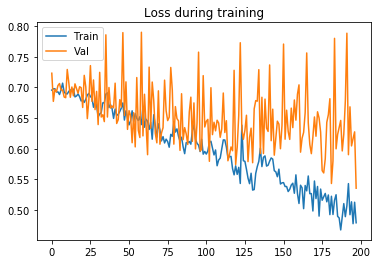

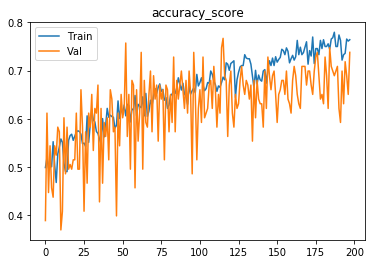

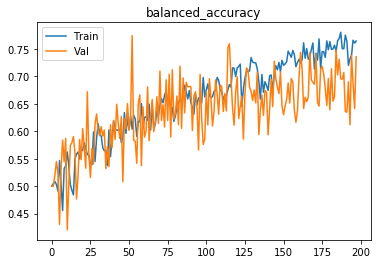

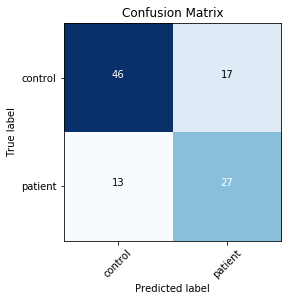

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69879
[0,     4] loss: 0.69447
Time elapsed: 0h:0m:9s
train accuracy_score: 51.98 %
train balanced_accuracy: 51.47 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.748885
[1,     2] loss: 0.70496
[1,     4] loss: 0.69136
Time elapsed: 0h:0m:19s
train accuracy_score: 51.13 %
train balanced_accuracy: 50.74 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.718935
[2,     2] loss: 0.70313
[2,     4] loss: 0.69698
Time elapsed: 0h:0m:30s
train accuracy_score: 50.99 %
train balanced_accuracy: 49.51 %
val accuracy_score: 57.28 %
val balanced_accuracy: 49.11 %
Val loss: 0.688101
[3,     2] loss: 0.69297
[3,     4] loss: 0.69525
Time elapsed: 0h:0m:41s
train accuracy_score: 53.39 %
train balanced_accuracy: 53.68 %
val accuracy_score: 38.83 %
val balanced_accuracy: 50.00 %
Val loss: 0.715701
[4,    

val accuracy_score: 59.22 %
val balanced_accuracy: 64.38 %
Val loss: 0.688752
[38,     2] loss: 0.61780
[38,     4] loss: 0.65339
Time elapsed: 0h:6m:49s
train accuracy_score: 61.16 %
train balanced_accuracy: 61.24 %
val accuracy_score: 60.19 %
val balanced_accuracy: 61.98 %
Val loss: 0.653405
[39,     2] loss: 0.64747
[39,     4] loss: 0.63099
Time elapsed: 0h:7m:0s
train accuracy_score: 64.12 %
train balanced_accuracy: 63.85 %
val accuracy_score: 63.11 %
val balanced_accuracy: 61.17 %
Val loss: 0.616280
[40,     2] loss: 0.61632
[40,     4] loss: 0.68895
Time elapsed: 0h:7m:11s
train accuracy_score: 63.98 %
train balanced_accuracy: 63.70 %
val accuracy_score: 72.82 %
val balanced_accuracy: 67.74 %
Val loss: 0.584193
[41,     2] loss: 0.63868
[41,     4] loss: 0.65051
Time elapsed: 0h:7m:23s
train accuracy_score: 63.98 %
train balanced_accuracy: 64.03 %
val accuracy_score: 59.22 %
val balanced_accuracy: 59.82 %
Val loss: 0.670826
[42,     2] loss: 0.65405
[42,     4] loss: 0.61987
Tim

val accuracy_score: 64.08 %
val balanced_accuracy: 65.62 %
Val loss: 0.605232
[76,     2] loss: 0.63490
[76,     4] loss: 0.59127
Time elapsed: 0h:13m:40s
train accuracy_score: 66.24 %
train balanced_accuracy: 66.08 %
val accuracy_score: 70.87 %
val balanced_accuracy: 69.80 %
Val loss: 0.599446
[77,     2] loss: 0.61240
[77,     4] loss: 0.58451
Time elapsed: 0h:13m:50s
train accuracy_score: 68.93 %
train balanced_accuracy: 68.84 %
val accuracy_score: 62.14 %
val balanced_accuracy: 63.57 %
Val loss: 0.630736
[78,     2] loss: 0.59375
[78,     4] loss: 0.62766
Time elapsed: 0h:14m:1s
train accuracy_score: 68.08 %
train balanced_accuracy: 68.34 %
val accuracy_score: 65.05 %
val balanced_accuracy: 68.69 %
Val loss: 0.655210
[79,     2] loss: 0.57109
[79,     4] loss: 0.62149
Time elapsed: 0h:14m:12s
train accuracy_score: 68.08 %
train balanced_accuracy: 67.90 %
val accuracy_score: 67.96 %
val balanced_accuracy: 66.51 %
Val loss: 0.603200
[80,     2] loss: 0.60628
[80,     4] loss: 0.62727

Time elapsed: 0h:20m:19s
train accuracy_score: 69.92 %
train balanced_accuracy: 70.10 %
val accuracy_score: 46.60 %
val balanced_accuracy: 53.15 %
Val loss: 0.843342
[114,     2] loss: 0.62081
[114,     4] loss: 0.58644
Time elapsed: 0h:20m:29s
train accuracy_score: 67.94 %
train balanced_accuracy: 67.98 %
val accuracy_score: 79.61 %
val balanced_accuracy: 79.68 %
Val loss: 0.526528
[115,     2] loss: 0.57068
[115,     4] loss: 0.53756
Time elapsed: 0h:20m:39s
train accuracy_score: 72.88 %
train balanced_accuracy: 72.77 %
val accuracy_score: 67.96 %
val balanced_accuracy: 71.07 %
Val loss: 0.620352
[116,     2] loss: 0.58799
[116,     4] loss: 0.54845
Time elapsed: 0h:20m:51s
train accuracy_score: 70.20 %
train balanced_accuracy: 70.16 %
val accuracy_score: 70.87 %
val balanced_accuracy: 73.45 %
Val loss: 0.594915
[117,     2] loss: 0.55491
[117,     4] loss: 0.52206
Time elapsed: 0h:21m:2s
train accuracy_score: 73.73 %
train balanced_accuracy: 73.79 %
val accuracy_score: 72.82 %
val b

val accuracy_score: 61.17 %
val balanced_accuracy: 64.15 %
Val loss: 0.634763
[151,     2] loss: 0.48521
[151,     4] loss: 0.50396
Time elapsed: 0h:27m:8s
train accuracy_score: 77.12 %
train balanced_accuracy: 77.19 %
val accuracy_score: 62.14 %
val balanced_accuracy: 66.31 %
Val loss: 0.734092
[152,     2] loss: 0.48318
[152,     4] loss: 0.56353
Time elapsed: 0h:27m:19s
train accuracy_score: 73.02 %
train balanced_accuracy: 72.96 %
val accuracy_score: 67.96 %
val balanced_accuracy: 69.25 %
Val loss: 0.615812
[153,     2] loss: 0.47902
[153,     4] loss: 0.51296
Time elapsed: 0h:27m:30s
train accuracy_score: 76.69 %
train balanced_accuracy: 76.62 %
val accuracy_score: 64.08 %
val balanced_accuracy: 63.33 %
Val loss: 0.632550
[154,     2] loss: 0.49370
[154,     4] loss: 0.54812
Time elapsed: 0h:27m:41s
train accuracy_score: 76.27 %
train balanced_accuracy: 76.28 %
val accuracy_score: 69.90 %
val balanced_accuracy: 69.92 %
Val loss: 0.635763
[155,     2] loss: 0.49588
[155,     4] los

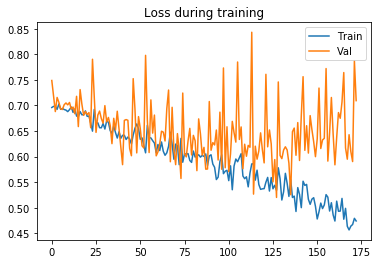

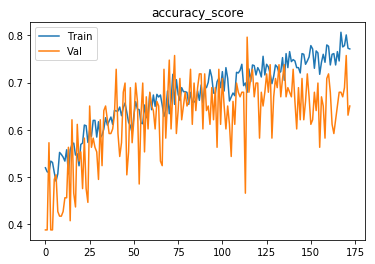

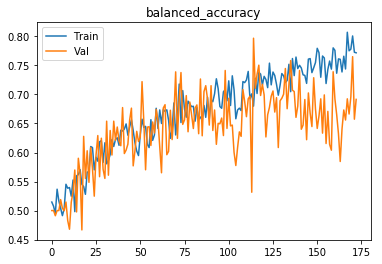

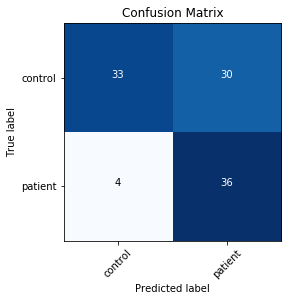

Finished outer fold.
{'final_acc': 0.6982142857142857, 'best_acc': 0.7571428571428571, 'final_iter': 188, 'best_iter': 115, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}
###### Starting outer fold 7
# of patients 401, # of healthy controls 395
702
94
(702, 96, 114, 96)
(94, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69338
[0,     4] loss: 0.69550
Time elapsed: 0h:0m:11s
train accuracy_score: 52.28 %
train balanced_accuracy: 52.02 %
val accuracy_score: 51.06 %
val balanced_accuracy: 49.13 %
Val loss: 0.690086
[1,     2] loss: 0.69250
[1,     4] loss: 0.69400
Time elapsed: 0h:0m:22s
train accuracy_score: 52.28 %
train balanced_accuracy: 51.55 %
val accuracy_score: 57.45 %
val balanced_accuracy: 60.39 %
Val loss: 0.689911
[2,     2] loss: 0.69254
[2,     4] loss: 0.70261
Time elapsed: 0h:0m:32s
train accuracy_sco

[36,     2] loss: 0.68763
[36,     4] loss: 0.69864
Time elapsed: 0h:6m:42s
train accuracy_score: 56.41 %
train balanced_accuracy: 55.79 %
val accuracy_score: 63.83 %
val balanced_accuracy: 62.04 %
Val loss: 0.670289
[37,     2] loss: 0.67667
[37,     4] loss: 0.68552
Time elapsed: 0h:6m:53s
train accuracy_score: 58.83 %
train balanced_accuracy: 59.13 %
val accuracy_score: 42.55 %
val balanced_accuracy: 45.79 %
Val loss: 0.720158
[38,     2] loss: 0.67404
[38,     4] loss: 0.66794
Time elapsed: 0h:7m:4s
train accuracy_score: 58.26 %
train balanced_accuracy: 57.80 %
val accuracy_score: 56.38 %
val balanced_accuracy: 51.19 %
Val loss: 0.686093
[39,     2] loss: 0.69128
[39,     4] loss: 0.67646
Time elapsed: 0h:7m:14s
train accuracy_score: 58.55 %
train balanced_accuracy: 58.80 %
val accuracy_score: 51.06 %
val balanced_accuracy: 54.40 %
Val loss: 0.706464
[40,     2] loss: 0.67740
[40,     4] loss: 0.67523
Time elapsed: 0h:7m:25s
train accuracy_score: 60.97 %
train balanced_accuracy: 60

[74,     2] loss: 0.64137
[74,     4] loss: 0.64497
Time elapsed: 0h:13m:32s
train accuracy_score: 65.38 %
train balanced_accuracy: 65.42 %
val accuracy_score: 57.45 %
val balanced_accuracy: 57.19 %
Val loss: 0.634919
[75,     2] loss: 0.61686
[75,     4] loss: 0.59916
Time elapsed: 0h:13m:44s
train accuracy_score: 69.80 %
train balanced_accuracy: 69.75 %
val accuracy_score: 63.83 %
val balanced_accuracy: 61.13 %
Val loss: 0.635236
[76,     2] loss: 0.65668
[76,     4] loss: 0.65896
Time elapsed: 0h:13m:54s
train accuracy_score: 60.97 %
train balanced_accuracy: 60.91 %
val accuracy_score: 57.45 %
val balanced_accuracy: 53.98 %
Val loss: 0.660704
[77,     2] loss: 0.63881
[77,     4] loss: 0.62343
Time elapsed: 0h:14m:5s
train accuracy_score: 64.96 %
train balanced_accuracy: 64.89 %
val accuracy_score: 62.77 %
val balanced_accuracy: 60.85 %
Val loss: 0.634395
[78,     2] loss: 0.62226
[78,     4] loss: 0.65906
Time elapsed: 0h:14m:16s
train accuracy_score: 64.96 %
train balanced_accurac

val accuracy_score: 58.51 %
val balanced_accuracy: 53.80 %
Val loss: 0.675938
[112,     2] loss: 0.66396
[112,     4] loss: 0.63489
Time elapsed: 0h:20m:26s
train accuracy_score: 62.11 %
train balanced_accuracy: 62.18 %
val accuracy_score: 59.57 %
val balanced_accuracy: 61.86 %
Val loss: 0.667326
[113,     2] loss: 0.64789
[113,     4] loss: 0.61924
Time elapsed: 0h:20m:38s
train accuracy_score: 62.96 %
train balanced_accuracy: 62.87 %
val accuracy_score: 55.32 %
val balanced_accuracy: 51.14 %
Val loss: 0.666703
[114,     2] loss: 0.63025
[114,     4] loss: 0.63450
Time elapsed: 0h:20m:48s
train accuracy_score: 66.38 %
train balanced_accuracy: 66.39 %
val accuracy_score: 60.64 %
val balanced_accuracy: 62.13 %
Val loss: 0.639919
[115,     2] loss: 0.60330
[115,     4] loss: 0.62556
Time elapsed: 0h:20m:58s
train accuracy_score: 66.81 %
train balanced_accuracy: 66.65 %
val accuracy_score: 63.83 %
val balanced_accuracy: 60.44 %
Val loss: 0.640724
[116,     2] loss: 0.61558
[116,     4] lo

[149,     2] loss: 0.59523
[149,     4] loss: 0.56928
Time elapsed: 0h:27m:5s
train accuracy_score: 68.38 %
train balanced_accuracy: 68.33 %
val accuracy_score: 63.83 %
val balanced_accuracy: 61.36 %
Val loss: 0.613949
[150,     2] loss: 0.52692
[150,     4] loss: 0.61557
Time elapsed: 0h:27m:15s
train accuracy_score: 70.66 %
train balanced_accuracy: 70.58 %
val accuracy_score: 57.45 %
val balanced_accuracy: 56.73 %
Val loss: 0.697180
[151,     2] loss: 0.55442
[151,     4] loss: 0.62395
Time elapsed: 0h:27m:26s
train accuracy_score: 69.09 %
train balanced_accuracy: 69.12 %
val accuracy_score: 60.64 %
val balanced_accuracy: 59.16 %
Val loss: 0.660418
[152,     2] loss: 0.58394
[152,     4] loss: 0.57805
Time elapsed: 0h:27m:37s
train accuracy_score: 68.80 %
train balanced_accuracy: 68.96 %
val accuracy_score: 61.70 %
val balanced_accuracy: 61.03 %
Val loss: 0.619933
[153,     2] loss: 0.58549
[153,     4] loss: 0.63002
Time elapsed: 0h:27m:48s
train accuracy_score: 66.81 %
train balanc

Best result during training: 0.70. Saving model..
Finished inner fold.


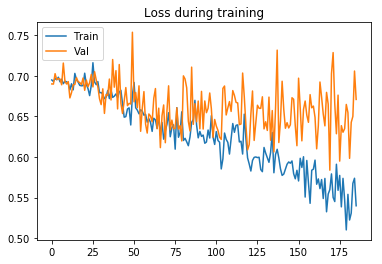

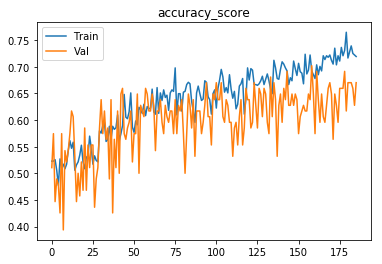

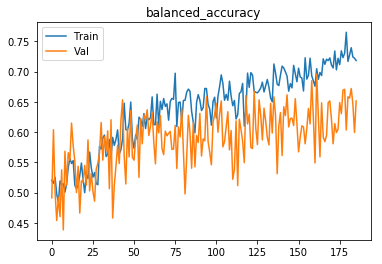

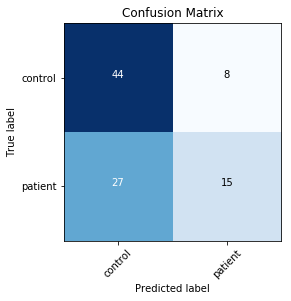

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69534
[0,     4] loss: 0.69345
Time elapsed: 0h:0m:9s
train accuracy_score: 49.86 %
train balanced_accuracy: 49.28 %
val accuracy_score: 63.83 %
val balanced_accuracy: 63.19 %
Val loss: 0.682038
[1,     2] loss: 0.69512
[1,     4] loss: 0.69943
Time elapsed: 0h:0m:20s
train accuracy_score: 52.28 %
train balanced_accuracy: 52.53 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.730286
[2,     2] loss: 0.71757
[2,     4] loss: 0.69161
Time elapsed: 0h:0m:30s
train accuracy_score: 51.57 %
train balanced_accuracy: 51.07 %
val accuracy_score: 55.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.693785
[3,     2] loss: 0.69842
[3,     4] loss: 0.69495
Time elapsed: 0h:0m:41s
train accuracy_score: 50.57 %
train balanced_accuracy: 50.93 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.710926
[4,    

val accuracy_score: 60.64 %
val balanced_accuracy: 58.47 %
Val loss: 0.656991
[38,     2] loss: 0.66254
[38,     4] loss: 0.63233
Time elapsed: 0h:7m:0s
train accuracy_score: 61.25 %
train balanced_accuracy: 61.30 %
val accuracy_score: 56.38 %
val balanced_accuracy: 58.06 %
Val loss: 0.670361
[39,     2] loss: 0.66985
[39,     4] loss: 0.65954
Time elapsed: 0h:7m:11s
train accuracy_score: 60.11 %
train balanced_accuracy: 60.03 %
val accuracy_score: 60.64 %
val balanced_accuracy: 59.16 %
Val loss: 0.640144
[40,     2] loss: 0.64733
[40,     4] loss: 0.63819
Time elapsed: 0h:7m:22s
train accuracy_score: 62.39 %
train balanced_accuracy: 62.34 %
val accuracy_score: 62.77 %
val balanced_accuracy: 60.85 %
Val loss: 0.656756
[41,     2] loss: 0.62739
[41,     4] loss: 0.66206
Time elapsed: 0h:7m:33s
train accuracy_score: 62.11 %
train balanced_accuracy: 62.19 %
val accuracy_score: 48.94 %
val balanced_accuracy: 52.24 %
Val loss: 0.703357
[42,     2] loss: 0.63607
[42,     4] loss: 0.71499
Tim

val accuracy_score: 56.38 %
val balanced_accuracy: 55.54 %
Val loss: 0.664133
[76,     2] loss: 0.63431
[76,     4] loss: 0.60151
Time elapsed: 0h:13m:49s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.59 %
val accuracy_score: 58.51 %
val balanced_accuracy: 57.01 %
Val loss: 0.664429
[77,     2] loss: 0.65706
[77,     4] loss: 0.62363
Time elapsed: 0h:14m:0s
train accuracy_score: 62.96 %
train balanced_accuracy: 62.82 %
val accuracy_score: 60.64 %
val balanced_accuracy: 58.47 %
Val loss: 0.667048
[78,     2] loss: 0.62693
[78,     4] loss: 0.63386
Time elapsed: 0h:14m:11s
train accuracy_score: 63.25 %
train balanced_accuracy: 63.12 %
val accuracy_score: 62.77 %
val balanced_accuracy: 58.79 %
Val loss: 0.665406
[79,     2] loss: 0.62971
[79,     4] loss: 0.65631
Time elapsed: 0h:14m:23s
train accuracy_score: 64.25 %
train balanced_accuracy: 64.37 %
val accuracy_score: 57.45 %
val balanced_accuracy: 56.96 %
Val loss: 0.669653
[80,     2] loss: 0.59707
[80,     4] loss: 0.68566

Time elapsed: 0h:20m:22s
train accuracy_score: 69.66 %
train balanced_accuracy: 69.63 %
val accuracy_score: 61.70 %
val balanced_accuracy: 58.97 %
Val loss: 0.686178
[114,     2] loss: 0.58001
[114,     4] loss: 0.56034
Time elapsed: 0h:20m:32s
train accuracy_score: 70.94 %
train balanced_accuracy: 70.95 %
val accuracy_score: 65.96 %
val balanced_accuracy: 64.42 %
Val loss: 0.632408
[115,     2] loss: 0.58896
[115,     4] loss: 0.55677
Time elapsed: 0h:20m:43s
train accuracy_score: 69.94 %
train balanced_accuracy: 70.04 %
val accuracy_score: 58.51 %
val balanced_accuracy: 57.46 %
Val loss: 0.663562
[116,     2] loss: 0.60068
[116,     4] loss: 0.51958
Time elapsed: 0h:20m:53s
train accuracy_score: 72.22 %
train balanced_accuracy: 72.18 %
val accuracy_score: 58.51 %
val balanced_accuracy: 54.49 %
Val loss: 0.720110
[117,     2] loss: 0.58485
[117,     4] loss: 0.53745
Time elapsed: 0h:21m:4s
train accuracy_score: 72.08 %
train balanced_accuracy: 72.15 %
val accuracy_score: 58.51 %
val b

val accuracy_score: 59.57 %
val balanced_accuracy: 55.91 %
Val loss: 0.730481
[151,     2] loss: 0.52508
[151,     4] loss: 0.57503
Time elapsed: 0h:26m:55s
train accuracy_score: 72.08 %
train balanced_accuracy: 72.07 %
val accuracy_score: 59.57 %
val balanced_accuracy: 57.28 %
Val loss: 0.718933
[152,     2] loss: 0.58348
[152,     4] loss: 0.53611
Time elapsed: 0h:27m:5s
train accuracy_score: 70.80 %
train balanced_accuracy: 71.01 %
val accuracy_score: 58.51 %
val balanced_accuracy: 59.98 %
Val loss: 0.676531
[153,     2] loss: 0.59301
[153,     4] loss: 0.58213
Time elapsed: 0h:27m:15s
train accuracy_score: 70.80 %
train balanced_accuracy: 70.83 %
val accuracy_score: 63.83 %
val balanced_accuracy: 61.13 %
Val loss: 0.612272
[154,     2] loss: 0.55291
[154,     4] loss: 0.53417
Time elapsed: 0h:27m:27s
train accuracy_score: 71.23 %
train balanced_accuracy: 71.07 %
val accuracy_score: 69.15 %
val balanced_accuracy: 66.62 %
Val loss: 0.616977
[155,     2] loss: 0.53386
[155,     4] los

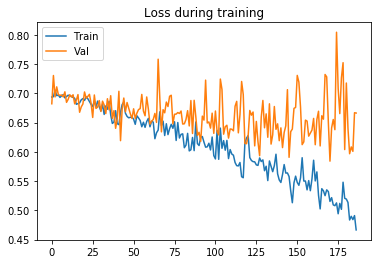

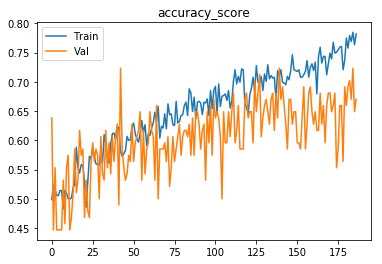

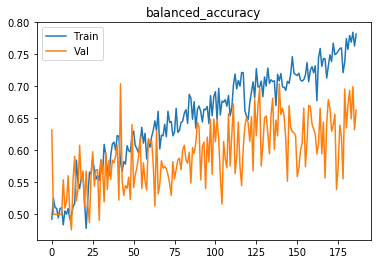

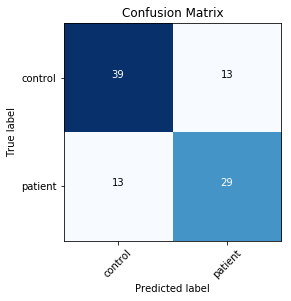

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69759
[0,     4] loss: 0.68897
Time elapsed: 0h:0m:8s
train accuracy_score: 50.00 %
train balanced_accuracy: 50.22 %
val accuracy_score: 44.68 %
val balanced_accuracy: 49.31 %
Val loss: 0.701046
[1,     2] loss: 0.68985
[1,     4] loss: 0.69825
Time elapsed: 0h:0m:20s
train accuracy_score: 51.57 %
train balanced_accuracy: 51.61 %
val accuracy_score: 43.62 %
val balanced_accuracy: 48.58 %
Val loss: 0.722828
[2,     2] loss: 0.69623
[2,     4] loss: 0.69171
Time elapsed: 0h:0m:31s
train accuracy_score: 52.71 %
train balanced_accuracy: 52.34 %
val accuracy_score: 53.19 %
val balanced_accuracy: 50.37 %
Val loss: 0.693009
[3,     2] loss: 0.70368
[3,     4] loss: 0.70044
Time elapsed: 0h:0m:43s
train accuracy_score: 50.28 %
train balanced_accuracy: 50.08 %
val accuracy_score: 45.74 %
val balanced_accuracy: 50.50 %
Val loss: 0.700985
[4,    

val accuracy_score: 60.64 %
val balanced_accuracy: 56.18 %
Val loss: 0.683752
[38,     2] loss: 0.67149
[38,     4] loss: 0.68444
Time elapsed: 0h:7m:1s
train accuracy_score: 55.41 %
train balanced_accuracy: 55.07 %
val accuracy_score: 64.89 %
val balanced_accuracy: 63.92 %
Val loss: 0.663739
[39,     2] loss: 0.67754
[39,     4] loss: 0.67514
Time elapsed: 0h:7m:12s
train accuracy_score: 57.55 %
train balanced_accuracy: 57.80 %
val accuracy_score: 56.38 %
val balanced_accuracy: 58.29 %
Val loss: 0.672247
[40,     2] loss: 0.67492
[40,     4] loss: 0.65973
Time elapsed: 0h:7m:23s
train accuracy_score: 59.40 %
train balanced_accuracy: 59.01 %
val accuracy_score: 60.64 %
val balanced_accuracy: 60.30 %
Val loss: 0.653816
[41,     2] loss: 0.66528
[41,     4] loss: 0.63061
Time elapsed: 0h:7m:34s
train accuracy_score: 61.11 %
train balanced_accuracy: 60.93 %
val accuracy_score: 60.64 %
val balanced_accuracy: 56.64 %
Val loss: 0.665435
[42,     2] loss: 0.66301
[42,     4] loss: 0.65585
Tim

val accuracy_score: 53.19 %
val balanced_accuracy: 53.11 %
Val loss: 0.723909
[76,     2] loss: 0.62545
[76,     4] loss: 0.63735
Time elapsed: 0h:13m:53s
train accuracy_score: 65.53 %
train balanced_accuracy: 65.61 %
val accuracy_score: 57.45 %
val balanced_accuracy: 56.73 %
Val loss: 0.677948
[77,     2] loss: 0.58598
[77,     4] loss: 0.61300
Time elapsed: 0h:14m:3s
train accuracy_score: 67.52 %
train balanced_accuracy: 67.54 %
val accuracy_score: 59.57 %
val balanced_accuracy: 57.97 %
Val loss: 0.647940
[78,     2] loss: 0.60385
[78,     4] loss: 0.61273
Time elapsed: 0h:14m:14s
train accuracy_score: 66.52 %
train balanced_accuracy: 66.45 %
val accuracy_score: 59.57 %
val balanced_accuracy: 57.74 %
Val loss: 0.665975
[79,     2] loss: 0.61745
[79,     4] loss: 0.59624
Time elapsed: 0h:14m:25s
train accuracy_score: 67.24 %
train balanced_accuracy: 67.24 %
val accuracy_score: 63.83 %
val balanced_accuracy: 61.36 %
Val loss: 0.646920
[80,     2] loss: 0.60263
[80,     4] loss: 0.62440

Time elapsed: 0h:20m:21s
train accuracy_score: 70.23 %
train balanced_accuracy: 70.12 %
val accuracy_score: 58.51 %
val balanced_accuracy: 56.55 %
Val loss: 0.705554
[114,     2] loss: 0.55435
[114,     4] loss: 0.58632
Time elapsed: 0h:20m:32s
train accuracy_score: 70.51 %
train balanced_accuracy: 70.42 %
val accuracy_score: 62.77 %
val balanced_accuracy: 59.71 %
Val loss: 0.631590
[115,     2] loss: 0.58005
[115,     4] loss: 0.58662
Time elapsed: 0h:20m:41s
train accuracy_score: 67.81 %
train balanced_accuracy: 67.87 %
val accuracy_score: 52.13 %
val balanced_accuracy: 51.24 %
Val loss: 0.699794
[116,     2] loss: 0.58200
[116,     4] loss: 0.57288
Time elapsed: 0h:20m:51s
train accuracy_score: 68.80 %
train balanced_accuracy: 69.00 %
val accuracy_score: 53.19 %
val balanced_accuracy: 54.49 %
Val loss: 0.708593
[117,     2] loss: 0.63253
[117,     4] loss: 0.58820
Time elapsed: 0h:21m:1s
train accuracy_score: 66.95 %
train balanced_accuracy: 66.80 %
val accuracy_score: 57.45 %
val b

val accuracy_score: 63.83 %
val balanced_accuracy: 63.42 %
Val loss: 0.643229
[151,     2] loss: 0.55930
[151,     4] loss: 0.53253
Time elapsed: 0h:26m:48s
train accuracy_score: 74.36 %
train balanced_accuracy: 74.37 %
val accuracy_score: 57.45 %
val balanced_accuracy: 55.82 %
Val loss: 0.687575
[152,     2] loss: 0.56680
[152,     4] loss: 0.52899
Time elapsed: 0h:27m:0s
train accuracy_score: 70.94 %
train balanced_accuracy: 70.94 %
val accuracy_score: 65.96 %
val balanced_accuracy: 65.11 %
Val loss: 0.660998
[153,     2] loss: 0.55305
[153,     4] loss: 0.54936
Time elapsed: 0h:27m:10s
train accuracy_score: 73.08 %
train balanced_accuracy: 73.00 %
val accuracy_score: 64.89 %
val balanced_accuracy: 62.77 %
Val loss: 0.650913
[154,     2] loss: 0.53475
[154,     4] loss: 0.56144
Time elapsed: 0h:27m:20s
train accuracy_score: 72.93 %
train balanced_accuracy: 72.97 %
val accuracy_score: 60.64 %
val balanced_accuracy: 59.62 %
Val loss: 0.675337
[155,     2] loss: 0.53677
[155,     4] los

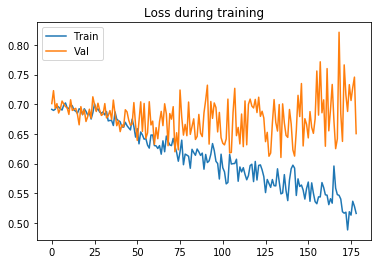

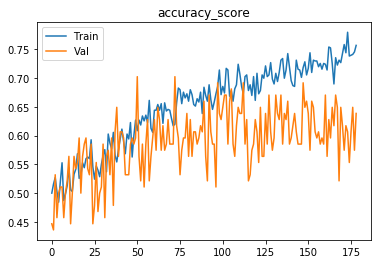

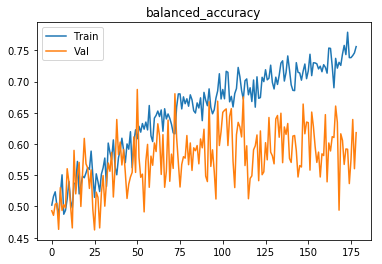

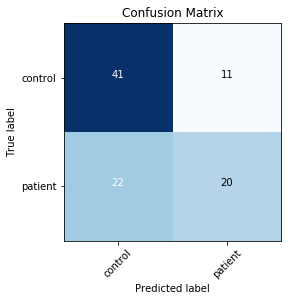

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69665
[0,     4] loss: 0.69181
Time elapsed: 0h:0m:9s
train accuracy_score: 51.42 %
train balanced_accuracy: 51.10 %
val accuracy_score: 50.00 %
val balanced_accuracy: 46.57 %
Val loss: 0.692005
[1,     2] loss: 0.70042
[1,     4] loss: 0.70774
Time elapsed: 0h:0m:19s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.17 %
val accuracy_score: 53.19 %
val balanced_accuracy: 51.51 %
Val loss: 0.692799
[2,     2] loss: 0.69403
[2,     4] loss: 0.69589
Time elapsed: 0h:0m:30s
train accuracy_score: 52.42 %
train balanced_accuracy: 52.14 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696053
[3,     2] loss: 0.69967
[3,     4] loss: 0.69199
Time elapsed: 0h:0m:40s
train accuracy_score: 48.58 %
train balanced_accuracy: 47.95 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696991
[4,    

val accuracy_score: 58.51 %
val balanced_accuracy: 58.84 %
Val loss: 0.689779
[38,     2] loss: 0.65385
[38,     4] loss: 0.66752
Time elapsed: 0h:7m:18s
train accuracy_score: 61.25 %
train balanced_accuracy: 61.35 %
val accuracy_score: 55.32 %
val balanced_accuracy: 56.18 %
Val loss: 0.673219
[39,     2] loss: 0.66045
[39,     4] loss: 0.63931
Time elapsed: 0h:7m:30s
train accuracy_score: 63.39 %
train balanced_accuracy: 63.20 %
val accuracy_score: 60.64 %
val balanced_accuracy: 59.62 %
Val loss: 0.654603
[40,     2] loss: 0.64762
[40,     4] loss: 0.63541
Time elapsed: 0h:7m:42s
train accuracy_score: 63.25 %
train balanced_accuracy: 63.14 %
val accuracy_score: 63.83 %
val balanced_accuracy: 62.27 %
Val loss: 0.636941
[41,     2] loss: 0.64636
[41,     4] loss: 0.66151
Time elapsed: 0h:7m:54s
train accuracy_score: 61.25 %
train balanced_accuracy: 61.18 %
val accuracy_score: 58.51 %
val balanced_accuracy: 57.46 %
Val loss: 0.671793
[42,     2] loss: 0.63475
[42,     4] loss: 0.64669
Ti

val accuracy_score: 57.45 %
val balanced_accuracy: 56.96 %
Val loss: 0.667861
[76,     2] loss: 0.59089
[76,     4] loss: 0.66868
Time elapsed: 0h:14m:9s
train accuracy_score: 65.53 %
train balanced_accuracy: 65.80 %
val accuracy_score: 62.77 %
val balanced_accuracy: 65.20 %
Val loss: 0.677783
[77,     2] loss: 0.66145
[77,     4] loss: 0.60984
Time elapsed: 0h:14m:20s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.55 %
val accuracy_score: 64.89 %
val balanced_accuracy: 60.71 %
Val loss: 0.685937
[78,     2] loss: 0.62969
[78,     4] loss: 0.61971
Time elapsed: 0h:14m:30s
train accuracy_score: 64.81 %
train balanced_accuracy: 64.96 %
val accuracy_score: 58.51 %
val balanced_accuracy: 59.29 %
Val loss: 0.637978
[79,     2] loss: 0.60989
[79,     4] loss: 0.60826
Time elapsed: 0h:14m:42s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.71 %
val accuracy_score: 69.15 %
val balanced_accuracy: 66.16 %
Val loss: 0.600034
[80,     2] loss: 0.61075
[80,     4] loss: 0.60162

Time elapsed: 0h:21m:12s
train accuracy_score: 70.51 %
train balanced_accuracy: 70.52 %
val accuracy_score: 68.09 %
val balanced_accuracy: 66.58 %
Val loss: 0.591445
[114,     2] loss: 0.58028
[114,     4] loss: 0.57651
Time elapsed: 0h:21m:24s
train accuracy_score: 71.65 %
train balanced_accuracy: 71.58 %
val accuracy_score: 68.09 %
val balanced_accuracy: 65.89 %
Val loss: 0.619393
[115,     2] loss: 0.55320
[115,     4] loss: 0.60224
Time elapsed: 0h:21m:36s
train accuracy_score: 69.09 %
train balanced_accuracy: 69.15 %
val accuracy_score: 62.77 %
val balanced_accuracy: 62.00 %
Val loss: 0.680680
[116,     2] loss: 0.57531
[116,     4] loss: 0.59803
Time elapsed: 0h:21m:48s
train accuracy_score: 69.66 %
train balanced_accuracy: 69.71 %
val accuracy_score: 64.89 %
val balanced_accuracy: 63.00 %
Val loss: 0.610965
[117,     2] loss: 0.56894
[117,     4] loss: 0.58224
Time elapsed: 0h:21m:59s
train accuracy_score: 69.94 %
train balanced_accuracy: 69.98 %
val accuracy_score: 63.83 %
val 

val accuracy_score: 61.70 %
val balanced_accuracy: 60.12 %
Val loss: 0.688552
[151,     2] loss: 0.50323
[151,     4] loss: 0.53006
Time elapsed: 0h:28m:11s
train accuracy_score: 73.22 %
train balanced_accuracy: 73.10 %
val accuracy_score: 61.70 %
val balanced_accuracy: 58.52 %
Val loss: 0.706167
[152,     2] loss: 0.57587
[152,     4] loss: 0.57865
Time elapsed: 0h:28m:20s
train accuracy_score: 69.52 %
train balanced_accuracy: 69.51 %
val accuracy_score: 65.96 %
val balanced_accuracy: 64.19 %
Val loss: 0.585027
[153,     2] loss: 0.53863
[153,     4] loss: 0.54240
Time elapsed: 0h:28m:30s
train accuracy_score: 73.50 %
train balanced_accuracy: 73.59 %
val accuracy_score: 70.21 %
val balanced_accuracy: 68.96 %
Val loss: 0.626470
[154,     2] loss: 0.51369
[154,     4] loss: 0.54465
Time elapsed: 0h:28m:41s
train accuracy_score: 74.64 %
train balanced_accuracy: 74.64 %
val accuracy_score: 68.09 %
val balanced_accuracy: 67.49 %
Val loss: 0.635735
[155,     2] loss: 0.52397
[155,     4] lo

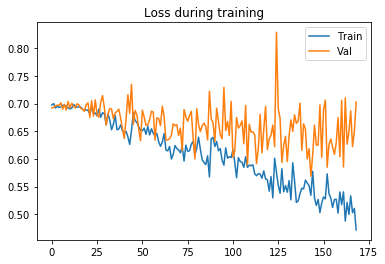

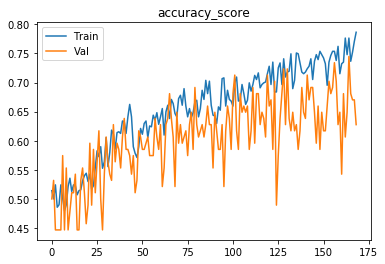

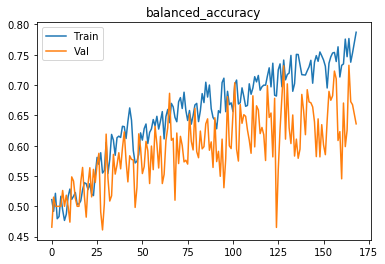

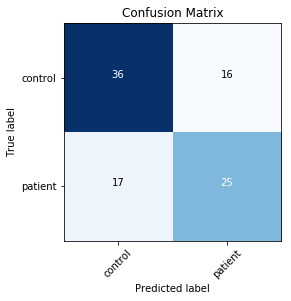

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70108
[0,     4] loss: 0.68746
Time elapsed: 0h:0m:8s
train accuracy_score: 49.57 %
train balanced_accuracy: 49.03 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.696204
[1,     2] loss: 0.69061
[1,     4] loss: 0.69825
Time elapsed: 0h:0m:18s
train accuracy_score: 50.14 %
train balanced_accuracy: 49.72 %
val accuracy_score: 53.19 %
val balanced_accuracy: 49.22 %
Val loss: 0.691206
[2,     2] loss: 0.69594
[2,     4] loss: 0.68133
Time elapsed: 0h:0m:29s
train accuracy_score: 51.28 %
train balanced_accuracy: 51.00 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.707330
[3,     2] loss: 0.70207
[3,     4] loss: 0.71633
Time elapsed: 0h:0m:40s
train accuracy_score: 47.01 %
train balanced_accuracy: 47.12 %
val accuracy_score: 44.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.694154
[4,    

val accuracy_score: 53.19 %
val balanced_accuracy: 54.26 %
Val loss: 0.681621
[38,     2] loss: 0.67172
[38,     4] loss: 0.68393
Time elapsed: 0h:6m:42s
train accuracy_score: 59.26 %
train balanced_accuracy: 58.93 %
val accuracy_score: 54.26 %
val balanced_accuracy: 52.01 %
Val loss: 0.686784
[39,     2] loss: 0.68056
[39,     4] loss: 0.68035
Time elapsed: 0h:6m:53s
train accuracy_score: 57.41 %
train balanced_accuracy: 57.44 %
val accuracy_score: 53.19 %
val balanced_accuracy: 56.55 %
Val loss: 0.715536
[40,     2] loss: 0.69438
[40,     4] loss: 0.65992
Time elapsed: 0h:7m:4s
train accuracy_score: 55.84 %
train balanced_accuracy: 55.88 %
val accuracy_score: 52.13 %
val balanced_accuracy: 52.61 %
Val loss: 0.703656
[41,     2] loss: 0.67955
[41,     4] loss: 0.69274
Time elapsed: 0h:7m:15s
train accuracy_score: 51.71 %
train balanced_accuracy: 51.02 %
val accuracy_score: 56.38 %
val balanced_accuracy: 51.42 %
Val loss: 0.671452
[42,     2] loss: 0.69694
[42,     4] loss: 0.68682
Tim

val accuracy_score: 57.45 %
val balanced_accuracy: 56.96 %
Val loss: 0.656359
[76,     2] loss: 0.60685
[76,     4] loss: 0.66992
Time elapsed: 0h:13m:29s
train accuracy_score: 64.39 %
train balanced_accuracy: 64.39 %
val accuracy_score: 60.64 %
val balanced_accuracy: 60.30 %
Val loss: 0.657186
[77,     2] loss: 0.61956
[77,     4] loss: 0.60435
Time elapsed: 0h:13m:39s
train accuracy_score: 66.52 %
train balanced_accuracy: 66.38 %
val accuracy_score: 64.89 %
val balanced_accuracy: 63.23 %
Val loss: 0.643406
[78,     2] loss: 0.61816
[78,     4] loss: 0.63899
Time elapsed: 0h:13m:50s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.89 %
val accuracy_score: 62.77 %
val balanced_accuracy: 59.48 %
Val loss: 0.626526
[79,     2] loss: 0.61890
[79,     4] loss: 0.57159
Time elapsed: 0h:14m:0s
train accuracy_score: 67.38 %
train balanced_accuracy: 67.43 %
val accuracy_score: 53.19 %
val balanced_accuracy: 54.72 %
Val loss: 0.696434
[80,     2] loss: 0.65077
[80,     4] loss: 0.63923

Time elapsed: 0h:20m:7s
train accuracy_score: 69.66 %
train balanced_accuracy: 69.52 %
val accuracy_score: 63.83 %
val balanced_accuracy: 60.67 %
Val loss: 0.665670
[114,     2] loss: 0.60288
[114,     4] loss: 0.59538
Time elapsed: 0h:20m:17s
train accuracy_score: 68.09 %
train balanced_accuracy: 68.11 %
val accuracy_score: 60.64 %
val balanced_accuracy: 59.39 %
Val loss: 0.669796
[115,     2] loss: 0.61375
[115,     4] loss: 0.65625
Time elapsed: 0h:20m:28s
train accuracy_score: 66.95 %
train balanced_accuracy: 67.01 %
val accuracy_score: 56.38 %
val balanced_accuracy: 54.17 %
Val loss: 0.665166
[116,     2] loss: 0.60110
[116,     4] loss: 0.60208
Time elapsed: 0h:20m:38s
train accuracy_score: 68.80 %
train balanced_accuracy: 68.80 %
val accuracy_score: 59.57 %
val balanced_accuracy: 60.26 %
Val loss: 0.653001
[117,     2] loss: 0.56717
[117,     4] loss: 0.64041
Time elapsed: 0h:20m:49s
train accuracy_score: 67.95 %
train balanced_accuracy: 67.94 %
val accuracy_score: 63.83 %
val b

val accuracy_score: 65.96 %
val balanced_accuracy: 64.42 %
Val loss: 0.618803
[151,     2] loss: 0.58539
[151,     4] loss: 0.53204
Time elapsed: 0h:26m:46s
train accuracy_score: 70.94 %
train balanced_accuracy: 71.00 %
val accuracy_score: 61.70 %
val balanced_accuracy: 60.12 %
Val loss: 0.659160
[152,     2] loss: 0.55578
[152,     4] loss: 0.53228
Time elapsed: 0h:26m:57s
train accuracy_score: 73.65 %
train balanced_accuracy: 73.56 %
val accuracy_score: 60.64 %
val balanced_accuracy: 57.55 %
Val loss: 0.690581
[153,     2] loss: 0.58831
[153,     4] loss: 0.52572
Time elapsed: 0h:27m:8s
train accuracy_score: 69.66 %
train balanced_accuracy: 69.79 %
val accuracy_score: 59.57 %
val balanced_accuracy: 59.80 %
Val loss: 0.667537
[154,     2] loss: 0.54995
[154,     4] loss: 0.53863
Time elapsed: 0h:27m:19s
train accuracy_score: 73.36 %
train balanced_accuracy: 73.33 %
val accuracy_score: 60.64 %
val balanced_accuracy: 58.47 %
Val loss: 0.646199
[155,     2] loss: 0.57945
[155,     4] los

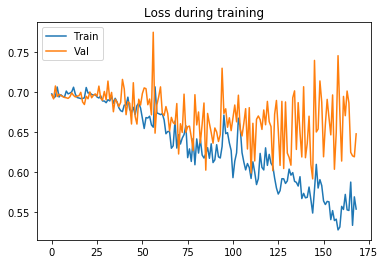

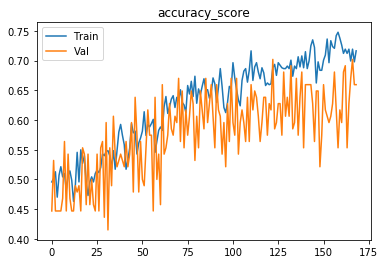

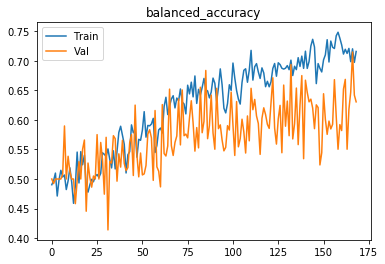

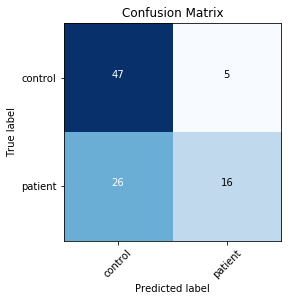

Finished outer fold.
{'final_acc': 0.663003663003663, 'best_acc': 0.6996336996336996, 'final_iter': 187, 'best_iter': 140, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}
###### Starting outer fold 8
# of patients 396, # of healthy controls 395
692
99
(692, 96, 114, 96)
(99, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69731
[0,     4] loss: 0.69373
Time elapsed: 0h:0m:11s
train accuracy_score: 48.99 %
train balanced_accuracy: 48.79 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.716206
[1,     2] loss: 0.69748
[1,     4] loss: 0.68657
Time elapsed: 0h:0m:22s
train accuracy_score: 52.89 %
train balanced_accuracy: 51.73 %
val accuracy_score: 45.45 %
val balanced_accuracy: 52.76 %
Val loss: 0.694292
[2,     2] loss: 0.68531
[2,     4] loss: 0.71588
Time elapsed: 0h:0m:33s
train accuracy_scor

[36,     2] loss: 0.66356
[36,     4] loss: 0.68615
Time elapsed: 0h:6m:23s
train accuracy_score: 58.82 %
train balanced_accuracy: 58.43 %
val accuracy_score: 54.55 %
val balanced_accuracy: 54.42 %
Val loss: 0.674064
[37,     2] loss: 0.67384
[37,     4] loss: 0.66877
Time elapsed: 0h:6m:33s
train accuracy_score: 59.25 %
train balanced_accuracy: 59.15 %
val accuracy_score: 54.55 %
val balanced_accuracy: 56.22 %
Val loss: 0.681464
[38,     2] loss: 0.66210
[38,     4] loss: 0.68658
Time elapsed: 0h:6m:43s
train accuracy_score: 57.37 %
train balanced_accuracy: 57.42 %
val accuracy_score: 51.52 %
val balanced_accuracy: 55.51 %
Val loss: 0.694177
[39,     2] loss: 0.68774
[39,     4] loss: 0.66086
Time elapsed: 0h:6m:54s
train accuracy_score: 58.09 %
train balanced_accuracy: 57.99 %
val accuracy_score: 62.63 %
val balanced_accuracy: 60.64 %
Val loss: 0.655274
[40,     2] loss: 0.66508
[40,     4] loss: 0.66341
Time elapsed: 0h:7m:4s
train accuracy_score: 58.38 %
train balanced_accuracy: 58

[74,     2] loss: 0.65943
[74,     4] loss: 0.65632
Time elapsed: 0h:12m:51s
train accuracy_score: 58.82 %
train balanced_accuracy: 58.07 %
val accuracy_score: 73.74 %
val balanced_accuracy: 68.46 %
Val loss: 0.599630
[75,     2] loss: 0.65765
[75,     4] loss: 0.64456
Time elapsed: 0h:13m:1s
train accuracy_score: 60.98 %
train balanced_accuracy: 61.50 %
val accuracy_score: 42.42 %
val balanced_accuracy: 51.15 %
Val loss: 0.765394
[76,     2] loss: 0.67448
[76,     4] loss: 0.65106
Time elapsed: 0h:13m:10s
train accuracy_score: 59.10 %
train balanced_accuracy: 58.70 %
val accuracy_score: 71.72 %
val balanced_accuracy: 65.45 %
Val loss: 0.598320
[77,     2] loss: 0.67948
[77,     4] loss: 0.67052
Time elapsed: 0h:13m:20s
train accuracy_score: 59.25 %
train balanced_accuracy: 59.26 %
val accuracy_score: 61.62 %
val balanced_accuracy: 64.74 %
Val loss: 0.654455
[78,     2] loss: 0.64268
[78,     4] loss: 0.63951
Time elapsed: 0h:13m:30s
train accuracy_score: 64.31 %
train balanced_accurac

val accuracy_score: 64.65 %
val balanced_accuracy: 65.90 %
Val loss: 0.597010
[112,     2] loss: 0.61534
[112,     4] loss: 0.59229
Time elapsed: 0h:19m:20s
train accuracy_score: 65.90 %
train balanced_accuracy: 66.00 %
val accuracy_score: 63.64 %
val balanced_accuracy: 62.82 %
Val loss: 0.655979
[113,     2] loss: 0.61063
[113,     4] loss: 0.62845
Time elapsed: 0h:19m:30s
train accuracy_score: 66.04 %
train balanced_accuracy: 65.92 %
val accuracy_score: 66.67 %
val balanced_accuracy: 65.77 %
Val loss: 0.605369
[114,     2] loss: 0.60059
[114,     4] loss: 0.62027
Time elapsed: 0h:19m:39s
train accuracy_score: 67.20 %
train balanced_accuracy: 67.07 %
val accuracy_score: 62.63 %
val balanced_accuracy: 61.09 %
Val loss: 0.657395
[115,     2] loss: 0.60379
[115,     4] loss: 0.61017
Time elapsed: 0h:19m:49s
train accuracy_score: 64.74 %
train balanced_accuracy: 64.72 %
val accuracy_score: 66.67 %
val balanced_accuracy: 66.22 %
Val loss: 0.602777
[116,     2] loss: 0.61122
[116,     4] lo

[149,     2] loss: 0.60130
[149,     4] loss: 0.59334
Time elapsed: 0h:25m:30s
train accuracy_score: 68.35 %
train balanced_accuracy: 68.56 %
val accuracy_score: 65.66 %
val balanced_accuracy: 68.53 %
Val loss: 0.634247
[150,     2] loss: 0.59029
[150,     4] loss: 0.56249
Time elapsed: 0h:25m:42s
train accuracy_score: 67.77 %
train balanced_accuracy: 67.70 %
val accuracy_score: 70.71 %
val balanced_accuracy: 72.24 %
Val loss: 0.576084
[151,     2] loss: 0.59471
[151,     4] loss: 0.59622
Time elapsed: 0h:25m:52s
train accuracy_score: 68.50 %
train balanced_accuracy: 68.35 %
val accuracy_score: 72.73 %
val balanced_accuracy: 72.12 %
Val loss: 0.582011
[152,     2] loss: 0.63174
[152,     4] loss: 0.54246
Time elapsed: 0h:26m:3s
train accuracy_score: 67.34 %
train balanced_accuracy: 67.62 %
val accuracy_score: 58.59 %
val balanced_accuracy: 62.69 %
Val loss: 0.697855
[153,     2] loss: 0.60429
[153,     4] loss: 0.54425
Time elapsed: 0h:26m:14s
train accuracy_score: 68.50 %
train balanc

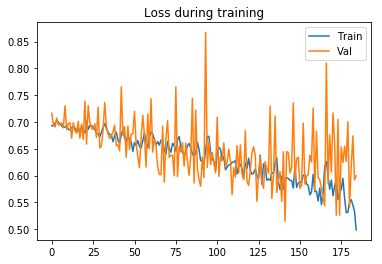

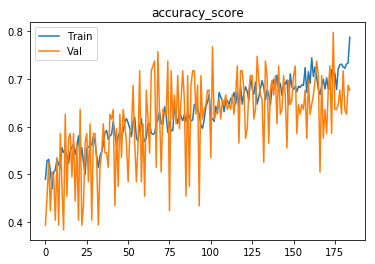

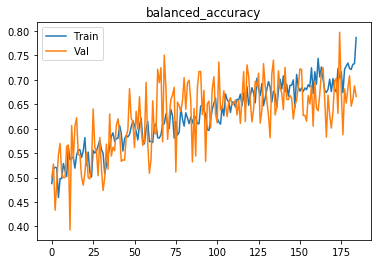

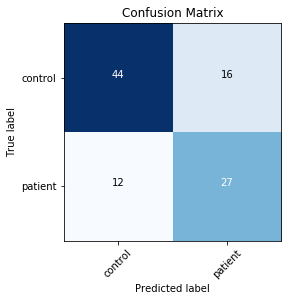

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69542
[0,     4] loss: 0.69618
Time elapsed: 0h:0m:8s
train accuracy_score: 48.70 %
train balanced_accuracy: 48.82 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.680274
[1,     2] loss: 0.69538
[1,     4] loss: 0.69751
Time elapsed: 0h:0m:19s
train accuracy_score: 51.73 %
train balanced_accuracy: 51.00 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.686207
[2,     2] loss: 0.70613
[2,     4] loss: 0.69914
Time elapsed: 0h:0m:29s
train accuracy_score: 49.57 %
train balanced_accuracy: 50.50 %
val accuracy_score: 39.39 %
val balanced_accuracy: 49.55 %
Val loss: 0.701348
[3,     2] loss: 0.69274
[3,     4] loss: 0.69426
Time elapsed: 0h:0m:40s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.54 %
val accuracy_score: 50.51 %
val balanced_accuracy: 47.50 %
Val loss: 0.694224
[4,    

val accuracy_score: 61.62 %
val balanced_accuracy: 63.85 %
Val loss: 0.679175
[38,     2] loss: 0.67313
[38,     4] loss: 0.67981
Time elapsed: 0h:6m:44s
train accuracy_score: 58.38 %
train balanced_accuracy: 57.81 %
val accuracy_score: 62.63 %
val balanced_accuracy: 59.74 %
Val loss: 0.633324
[39,     2] loss: 0.68492
[39,     4] loss: 0.67763
Time elapsed: 0h:6m:55s
train accuracy_score: 53.03 %
train balanced_accuracy: 53.06 %
val accuracy_score: 59.60 %
val balanced_accuracy: 59.49 %
Val loss: 0.660580
[40,     2] loss: 0.68327
[40,     4] loss: 0.67559
Time elapsed: 0h:7m:5s
train accuracy_score: 54.48 %
train balanced_accuracy: 54.57 %
val accuracy_score: 48.48 %
val balanced_accuracy: 56.15 %
Val loss: 0.699942
[41,     2] loss: 0.66855
[41,     4] loss: 0.67783
Time elapsed: 0h:7m:15s
train accuracy_score: 57.80 %
train balanced_accuracy: 57.34 %
val accuracy_score: 59.60 %
val balanced_accuracy: 54.10 %
Val loss: 0.663678
[42,     2] loss: 0.68220
[42,     4] loss: 0.67150
Tim

val accuracy_score: 69.70 %
val balanced_accuracy: 68.72 %
Val loss: 0.646318
[76,     2] loss: 0.66688
[76,     4] loss: 0.65647
Time elapsed: 0h:13m:28s
train accuracy_score: 62.14 %
train balanced_accuracy: 62.19 %
val accuracy_score: 65.66 %
val balanced_accuracy: 67.18 %
Val loss: 0.632969
[77,     2] loss: 0.65061
[77,     4] loss: 0.67470
Time elapsed: 0h:13m:40s
train accuracy_score: 60.26 %
train balanced_accuracy: 60.33 %
val accuracy_score: 66.67 %
val balanced_accuracy: 68.01 %
Val loss: 0.624915
[78,     2] loss: 0.65470
[78,     4] loss: 0.61727
Time elapsed: 0h:13m:51s
train accuracy_score: 62.57 %
train balanced_accuracy: 62.28 %
val accuracy_score: 64.65 %
val balanced_accuracy: 64.55 %
Val loss: 0.620808
[79,     2] loss: 0.67672
[79,     4] loss: 0.66861
Time elapsed: 0h:14m:2s
train accuracy_score: 58.96 %
train balanced_accuracy: 58.84 %
val accuracy_score: 62.63 %
val balanced_accuracy: 65.58 %
Val loss: 0.632231
[80,     2] loss: 0.66532
[80,     4] loss: 0.64993

Time elapsed: 0h:20m:18s
train accuracy_score: 64.16 %
train balanced_accuracy: 63.93 %
val accuracy_score: 67.68 %
val balanced_accuracy: 63.46 %
Val loss: 0.608674
[114,     2] loss: 0.66561
[114,     4] loss: 0.66735
Time elapsed: 0h:20m:29s
train accuracy_score: 60.69 %
train balanced_accuracy: 61.30 %
val accuracy_score: 52.53 %
val balanced_accuracy: 60.83 %
Val loss: 0.762946
[115,     2] loss: 0.65579
[115,     4] loss: 0.67309
Time elapsed: 0h:20m:40s
train accuracy_score: 59.39 %
train balanced_accuracy: 59.22 %
val accuracy_score: 67.68 %
val balanced_accuracy: 62.56 %
Val loss: 0.620677
[116,     2] loss: 0.64829
[116,     4] loss: 0.62762
Time elapsed: 0h:20m:50s
train accuracy_score: 62.57 %
train balanced_accuracy: 62.83 %
val accuracy_score: 59.60 %
val balanced_accuracy: 65.32 %
Val loss: 0.683711
[117,     2] loss: 0.62849
[117,     4] loss: 0.62386
Time elapsed: 0h:21m:2s
train accuracy_score: 64.02 %
train balanced_accuracy: 63.59 %
val accuracy_score: 70.71 %
val b

val accuracy_score: 69.70 %
val balanced_accuracy: 69.62 %
Val loss: 0.589699
[151,     2] loss: 0.61885
[151,     4] loss: 0.59783
Time elapsed: 0h:27m:11s
train accuracy_score: 68.50 %
train balanced_accuracy: 68.57 %
val accuracy_score: 62.63 %
val balanced_accuracy: 64.23 %
Val loss: 0.636078
[152,     2] loss: 0.59574
[152,     4] loss: 0.55891
Time elapsed: 0h:27m:21s
train accuracy_score: 69.65 %
train balanced_accuracy: 69.58 %
val accuracy_score: 69.70 %
val balanced_accuracy: 68.27 %
Val loss: 0.609700
[153,     2] loss: 0.58448
[153,     4] loss: 0.59860
Time elapsed: 0h:27m:32s
train accuracy_score: 69.51 %
train balanced_accuracy: 69.56 %
val accuracy_score: 67.68 %
val balanced_accuracy: 67.05 %
Val loss: 0.594549
[154,     2] loss: 0.59677
[154,     4] loss: 0.58698
Time elapsed: 0h:27m:43s
train accuracy_score: 67.63 %
train balanced_accuracy: 67.54 %
val accuracy_score: 64.65 %
val balanced_accuracy: 65.90 %
Val loss: 0.631122
[155,     2] loss: 0.60207
[155,     4] lo

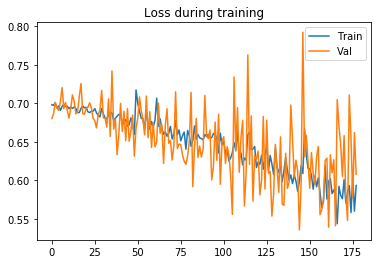

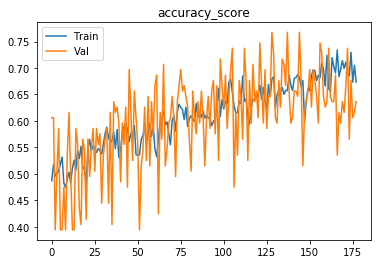

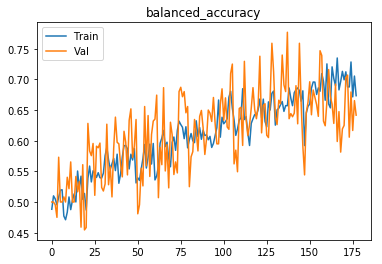

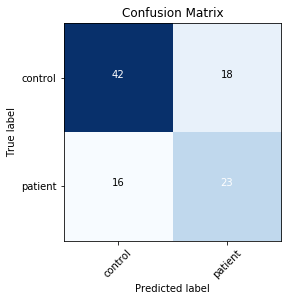

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.70476
[0,     4] loss: 0.69453
Time elapsed: 0h:0m:8s
train accuracy_score: 48.12 %
train balanced_accuracy: 48.16 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.683002
[1,     2] loss: 0.69766
[1,     4] loss: 0.69891
Time elapsed: 0h:0m:19s
train accuracy_score: 48.55 %
train balanced_accuracy: 49.20 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.724195
[2,     2] loss: 0.70184
[2,     4] loss: 0.68633
Time elapsed: 0h:0m:29s
train accuracy_score: 51.16 %
train balanced_accuracy: 50.52 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.691439
[3,     2] loss: 0.69773
[3,     4] loss: 0.69247
Time elapsed: 0h:0m:40s
train accuracy_score: 48.12 %
train balanced_accuracy: 48.88 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.689287
[4,    

val accuracy_score: 48.48 %
val balanced_accuracy: 43.59 %
Val loss: 0.692236
[38,     2] loss: 0.68928
[38,     4] loss: 0.69322
Time elapsed: 0h:7m:25s
train accuracy_score: 52.60 %
train balanced_accuracy: 52.97 %
val accuracy_score: 58.59 %
val balanced_accuracy: 60.90 %
Val loss: 0.684611
[39,     2] loss: 0.68842
[39,     4] loss: 0.69094
Time elapsed: 0h:7m:38s
train accuracy_score: 52.46 %
train balanced_accuracy: 51.54 %
val accuracy_score: 39.39 %
val balanced_accuracy: 49.10 %
Val loss: 0.708257
[40,     2] loss: 0.68648
[40,     4] loss: 0.69350
Time elapsed: 0h:7m:49s
train accuracy_score: 54.19 %
train balanced_accuracy: 53.16 %
val accuracy_score: 51.52 %
val balanced_accuracy: 49.68 %
Val loss: 0.693531
[41,     2] loss: 0.69809
[41,     4] loss: 0.68829
Time elapsed: 0h:8m:1s
train accuracy_score: 52.75 %
train balanced_accuracy: 52.77 %
val accuracy_score: 50.51 %
val balanced_accuracy: 53.78 %
Val loss: 0.703056
[42,     2] loss: 0.68428
[42,     4] loss: 0.67843
Tim

val accuracy_score: 57.58 %
val balanced_accuracy: 62.76 %
Val loss: 0.683358
[76,     2] loss: 0.65522
[76,     4] loss: 0.65164
Time elapsed: 0h:15m:9s
train accuracy_score: 61.85 %
train balanced_accuracy: 61.76 %
val accuracy_score: 63.64 %
val balanced_accuracy: 59.68 %
Val loss: 0.614670
[77,     2] loss: 0.67950
[77,     4] loss: 0.68308
Time elapsed: 0h:15m:23s
train accuracy_score: 56.79 %
train balanced_accuracy: 56.65 %
val accuracy_score: 59.60 %
val balanced_accuracy: 56.79 %
Val loss: 0.648249
[78,     2] loss: 0.66834
[78,     4] loss: 0.67390
Time elapsed: 0h:15m:35s
train accuracy_score: 58.38 %
train balanced_accuracy: 58.22 %
val accuracy_score: 63.64 %
val balanced_accuracy: 64.17 %
Val loss: 0.656411
[79,     2] loss: 0.67891
[79,     4] loss: 0.66122
Time elapsed: 0h:15m:47s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.83 %
val accuracy_score: 63.64 %
val balanced_accuracy: 68.65 %
Val loss: 0.659820
[80,     2] loss: 0.65066
[80,     4] loss: 0.66283

Time elapsed: 0h:22m:46s
train accuracy_score: 60.98 %
train balanced_accuracy: 61.20 %
val accuracy_score: 62.63 %
val balanced_accuracy: 63.33 %
Val loss: 0.622207
[114,     2] loss: 0.65370
[114,     4] loss: 0.64967
Time elapsed: 0h:22m:58s
train accuracy_score: 61.71 %
train balanced_accuracy: 61.17 %
val accuracy_score: 66.67 %
val balanced_accuracy: 66.22 %
Val loss: 0.627322
[115,     2] loss: 0.66387
[115,     4] loss: 0.64543
Time elapsed: 0h:23m:11s
train accuracy_score: 61.42 %
train balanced_accuracy: 61.55 %
val accuracy_score: 64.65 %
val balanced_accuracy: 70.38 %
Val loss: 0.640135
[116,     2] loss: 0.65863
[116,     4] loss: 0.66880
Time elapsed: 0h:23m:23s
train accuracy_score: 58.38 %
train balanced_accuracy: 58.33 %
val accuracy_score: 74.75 %
val balanced_accuracy: 71.09 %
Val loss: 0.618246
[117,     2] loss: 0.63053
[117,     4] loss: 0.63140
Time elapsed: 0h:23m:36s
train accuracy_score: 62.28 %
train balanced_accuracy: 62.20 %
val accuracy_score: 61.62 %
val 

val accuracy_score: 69.70 %
val balanced_accuracy: 66.92 %
Val loss: 0.579366
[151,     2] loss: 0.62242
[151,     4] loss: 0.60357
Time elapsed: 0h:30m:32s
train accuracy_score: 66.18 %
train balanced_accuracy: 66.30 %
val accuracy_score: 66.67 %
val balanced_accuracy: 68.01 %
Val loss: 0.617404
[152,     2] loss: 0.62300
[152,     4] loss: 0.63013
Time elapsed: 0h:30m:44s
train accuracy_score: 66.47 %
train balanced_accuracy: 66.68 %
val accuracy_score: 64.65 %
val balanced_accuracy: 65.45 %
Val loss: 0.627399
[153,     2] loss: 0.56832
[153,     4] loss: 0.65979
Time elapsed: 0h:30m:57s
train accuracy_score: 66.47 %
train balanced_accuracy: 66.61 %
val accuracy_score: 64.65 %
val balanced_accuracy: 68.59 %
Val loss: 0.634738
[154,     2] loss: 0.62837
[154,     4] loss: 0.59184
Time elapsed: 0h:31m:9s
train accuracy_score: 67.92 %
train balanced_accuracy: 67.95 %
val accuracy_score: 47.47 %
val balanced_accuracy: 54.42 %
Val loss: 0.788628
[155,     2] loss: 0.70443
[155,     4] los

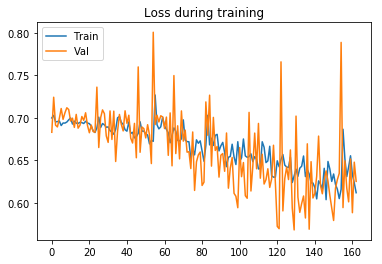

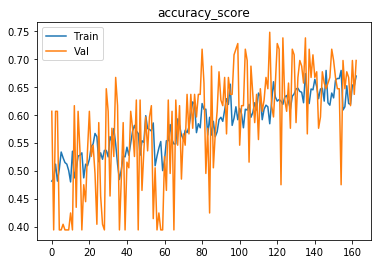

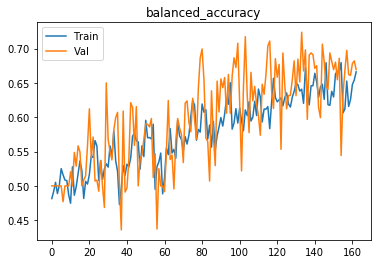

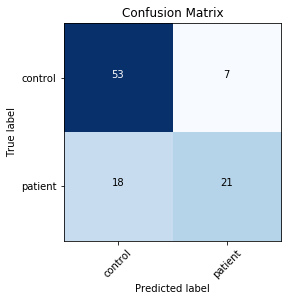

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69367
[0,     4] loss: 0.69558
Time elapsed: 0h:0m:10s
train accuracy_score: 49.71 %
train balanced_accuracy: 48.38 %
val accuracy_score: 60.61 %
val balanced_accuracy: 50.00 %
Val loss: 0.684831
[1,     2] loss: 0.69881
[1,     4] loss: 0.69235
Time elapsed: 0h:0m:23s
train accuracy_score: 50.87 %
train balanced_accuracy: 50.61 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.706112
[2,     2] loss: 0.69594
[2,     4] loss: 0.69803
Time elapsed: 0h:0m:35s
train accuracy_score: 48.41 %
train balanced_accuracy: 48.14 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.700285
[3,     2] loss: 0.68914
[3,     4] loss: 0.69912
Time elapsed: 0h:0m:47s
train accuracy_score: 50.72 %
train balanced_accuracy: 49.64 %
val accuracy_score: 48.48 %
val balanced_accuracy: 50.77 %
Val loss: 0.694387
[4,   

val accuracy_score: 41.41 %
val balanced_accuracy: 51.67 %
Val loss: 0.720151
[38,     2] loss: 0.68871
[38,     4] loss: 0.67922
Time elapsed: 0h:8m:1s
train accuracy_score: 55.64 %
train balanced_accuracy: 54.42 %
val accuracy_score: 63.64 %
val balanced_accuracy: 56.09 %
Val loss: 0.659611
[39,     2] loss: 0.69805
[39,     4] loss: 0.68809
Time elapsed: 0h:8m:14s
train accuracy_score: 56.50 %
train balanced_accuracy: 56.83 %
val accuracy_score: 50.51 %
val balanced_accuracy: 57.82 %
Val loss: 0.691830
[40,     2] loss: 0.68409
[40,     4] loss: 0.67162
Time elapsed: 0h:8m:26s
train accuracy_score: 58.67 %
train balanced_accuracy: 58.00 %
val accuracy_score: 55.56 %
val balanced_accuracy: 54.81 %
Val loss: 0.678851
[41,     2] loss: 0.68906
[41,     4] loss: 0.68374
Time elapsed: 0h:8m:38s
train accuracy_score: 54.91 %
train balanced_accuracy: 55.04 %
val accuracy_score: 42.42 %
val balanced_accuracy: 50.71 %
Val loss: 0.740863
[42,     2] loss: 0.68773
[42,     4] loss: 0.67365
Tim

val accuracy_score: 62.63 %
val balanced_accuracy: 59.29 %
Val loss: 0.648518
[76,     2] loss: 0.67603
[76,     4] loss: 0.66464
Time elapsed: 0h:15m:49s
train accuracy_score: 58.38 %
train balanced_accuracy: 57.90 %
val accuracy_score: 71.72 %
val balanced_accuracy: 67.69 %
Val loss: 0.616000
[77,     2] loss: 0.67292
[77,     4] loss: 0.66011
Time elapsed: 0h:16m:2s
train accuracy_score: 59.68 %
train balanced_accuracy: 59.84 %
val accuracy_score: 44.44 %
val balanced_accuracy: 54.17 %
Val loss: 0.746752
[78,     2] loss: 0.68400
[78,     4] loss: 0.68645
Time elapsed: 0h:16m:14s
train accuracy_score: 56.94 %
train balanced_accuracy: 56.44 %
val accuracy_score: 69.70 %
val balanced_accuracy: 63.78 %
Val loss: 0.633123
[79,     2] loss: 0.66960
[79,     4] loss: 0.69358
Time elapsed: 0h:16m:27s
train accuracy_score: 57.95 %
train balanced_accuracy: 57.82 %
val accuracy_score: 55.56 %
val balanced_accuracy: 61.54 %
Val loss: 0.681615
[80,     2] loss: 0.66048
[80,     4] loss: 0.67304

Time elapsed: 0h:23m:27s
train accuracy_score: 57.95 %
train balanced_accuracy: 57.02 %
val accuracy_score: 61.62 %
val balanced_accuracy: 65.64 %
Val loss: 0.653054
[114,     2] loss: 0.65379
[114,     4] loss: 0.64284
Time elapsed: 0h:23m:39s
train accuracy_score: 59.97 %
train balanced_accuracy: 60.00 %
val accuracy_score: 59.60 %
val balanced_accuracy: 63.97 %
Val loss: 0.648445
[115,     2] loss: 0.66432
[115,     4] loss: 0.65787
Time elapsed: 0h:23m:51s
train accuracy_score: 60.69 %
train balanced_accuracy: 59.96 %
val accuracy_score: 67.68 %
val balanced_accuracy: 64.36 %
Val loss: 0.632668
[116,     2] loss: 0.64115
[116,     4] loss: 0.63511
Time elapsed: 0h:24m:3s
train accuracy_score: 65.03 %
train balanced_accuracy: 65.15 %
val accuracy_score: 61.62 %
val balanced_accuracy: 64.29 %
Val loss: 0.680137
[117,     2] loss: 0.65722
[117,     4] loss: 0.64161
Time elapsed: 0h:24m:16s
train accuracy_score: 62.43 %
train balanced_accuracy: 62.47 %
val accuracy_score: 63.64 %
val b

val accuracy_score: 71.72 %
val balanced_accuracy: 67.69 %
Val loss: 0.579369
[151,     2] loss: 0.62968
[151,     4] loss: 0.61694
Time elapsed: 0h:30m:59s
train accuracy_score: 63.58 %
train balanced_accuracy: 63.95 %
val accuracy_score: 52.53 %
val balanced_accuracy: 59.04 %
Val loss: 0.703394
[152,     2] loss: 0.64647
[152,     4] loss: 0.60431
Time elapsed: 0h:31m:10s
train accuracy_score: 64.45 %
train balanced_accuracy: 64.10 %
val accuracy_score: 59.60 %
val balanced_accuracy: 59.04 %
Val loss: 0.632654
[153,     2] loss: 0.67139
[153,     4] loss: 0.60465
Time elapsed: 0h:31m:22s
train accuracy_score: 64.45 %
train balanced_accuracy: 64.18 %
val accuracy_score: 64.65 %
val balanced_accuracy: 67.24 %
Val loss: 0.611124
[154,     2] loss: 0.61355
[154,     4] loss: 0.60406
Time elapsed: 0h:31m:34s
train accuracy_score: 66.04 %
train balanced_accuracy: 65.97 %
val accuracy_score: 67.68 %
val balanced_accuracy: 68.40 %
Val loss: 0.592899
[155,     2] loss: 0.58204
[155,     4] lo

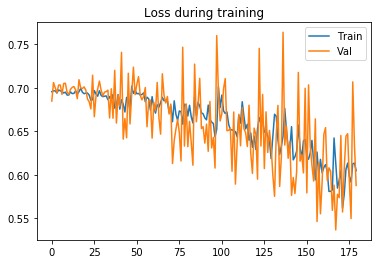

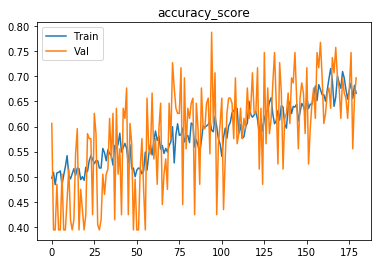

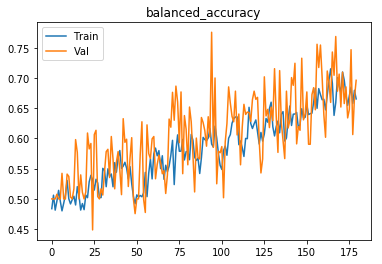

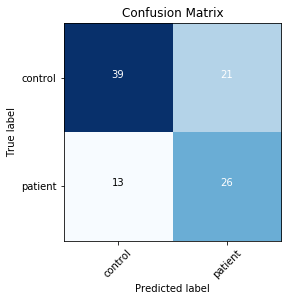

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69755
[0,     4] loss: 0.68566
Time elapsed: 0h:0m:9s
train accuracy_score: 52.02 %
train balanced_accuracy: 52.26 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.724072
[1,     2] loss: 0.70370
[1,     4] loss: 0.70582
Time elapsed: 0h:0m:21s
train accuracy_score: 53.03 %
train balanced_accuracy: 51.84 %
val accuracy_score: 61.62 %
val balanced_accuracy: 53.08 %
Val loss: 0.687703
[2,     2] loss: 0.70066
[2,     4] loss: 0.69300
Time elapsed: 0h:0m:32s
train accuracy_score: 49.86 %
train balanced_accuracy: 49.98 %
val accuracy_score: 39.39 %
val balanced_accuracy: 50.00 %
Val loss: 0.696750
[3,     2] loss: 0.69065
[3,     4] loss: 0.69300
Time elapsed: 0h:0m:44s
train accuracy_score: 52.46 %
train balanced_accuracy: 52.08 %
val accuracy_score: 41.41 %
val balanced_accuracy: 48.08 %
Val loss: 0.699200
[4,    

val accuracy_score: 46.46 %
val balanced_accuracy: 54.94 %
Val loss: 0.704506
[38,     2] loss: 0.69096
[38,     4] loss: 0.68945
Time elapsed: 0h:7m:40s
train accuracy_score: 53.03 %
train balanced_accuracy: 52.24 %
val accuracy_score: 43.43 %
val balanced_accuracy: 51.99 %
Val loss: 0.702655
[39,     2] loss: 0.68869
[39,     4] loss: 0.68672
Time elapsed: 0h:7m:52s
train accuracy_score: 53.18 %
train balanced_accuracy: 53.03 %
val accuracy_score: 53.54 %
val balanced_accuracy: 55.38 %
Val loss: 0.695564
[40,     2] loss: 0.69142
[40,     4] loss: 0.67301
Time elapsed: 0h:8m:4s
train accuracy_score: 56.07 %
train balanced_accuracy: 55.25 %
val accuracy_score: 58.59 %
val balanced_accuracy: 53.72 %
Val loss: 0.668208
[41,     2] loss: 0.69067
[41,     4] loss: 0.68245
Time elapsed: 0h:8m:16s
train accuracy_score: 54.19 %
train balanced_accuracy: 54.49 %
val accuracy_score: 42.42 %
val balanced_accuracy: 52.50 %
Val loss: 0.720195
[42,     2] loss: 0.68857
[42,     4] loss: 0.67241
Tim

val accuracy_score: 62.63 %
val balanced_accuracy: 61.99 %
Val loss: 0.655901
[76,     2] loss: 0.65202
[76,     4] loss: 0.65997
Time elapsed: 0h:15m:23s
train accuracy_score: 61.71 %
train balanced_accuracy: 61.71 %
val accuracy_score: 61.62 %
val balanced_accuracy: 66.54 %
Val loss: 0.658514
[77,     2] loss: 0.67736
[77,     4] loss: 0.66256
Time elapsed: 0h:15m:35s
train accuracy_score: 57.95 %
train balanced_accuracy: 57.62 %
val accuracy_score: 64.65 %
val balanced_accuracy: 65.00 %
Val loss: 0.642315
[78,     2] loss: 0.68861
[78,     4] loss: 0.67778
Time elapsed: 0h:15m:47s
train accuracy_score: 57.51 %
train balanced_accuracy: 57.42 %
val accuracy_score: 64.65 %
val balanced_accuracy: 63.21 %
Val loss: 0.629159
[79,     2] loss: 0.68129
[79,     4] loss: 0.69485
Time elapsed: 0h:15m:59s
train accuracy_score: 55.35 %
train balanced_accuracy: 54.55 %
val accuracy_score: 60.61 %
val balanced_accuracy: 59.87 %
Val loss: 0.659960
[80,     2] loss: 0.67361
[80,     4] loss: 0.6853

Time elapsed: 0h:22m:59s
train accuracy_score: 62.43 %
train balanced_accuracy: 62.21 %
val accuracy_score: 57.58 %
val balanced_accuracy: 62.76 %
Val loss: 0.655072
[114,     2] loss: 0.64529
[114,     4] loss: 0.64026
Time elapsed: 0h:23m:11s
train accuracy_score: 63.44 %
train balanced_accuracy: 63.49 %
val accuracy_score: 59.60 %
val balanced_accuracy: 63.53 %
Val loss: 0.662804
[115,     2] loss: 0.65451
[115,     4] loss: 0.62879
Time elapsed: 0h:23m:24s
train accuracy_score: 63.44 %
train balanced_accuracy: 63.33 %
val accuracy_score: 69.70 %
val balanced_accuracy: 70.96 %
Val loss: 0.633575
[116,     2] loss: 0.62976
[116,     4] loss: 0.61132
Time elapsed: 0h:23m:36s
train accuracy_score: 63.73 %
train balanced_accuracy: 63.87 %
val accuracy_score: 58.59 %
val balanced_accuracy: 64.04 %
Val loss: 0.677672
[117,     2] loss: 0.65585
[117,     4] loss: 0.63817
Time elapsed: 0h:23m:48s
train accuracy_score: 63.58 %
train balanced_accuracy: 63.68 %
val accuracy_score: 52.53 %
val 

val accuracy_score: 68.69 %
val balanced_accuracy: 72.37 %
Val loss: 0.628743
[151,     2] loss: 0.60259
[151,     4] loss: 0.59376
Time elapsed: 0h:30m:38s
train accuracy_score: 68.50 %
train balanced_accuracy: 68.45 %
val accuracy_score: 70.71 %
val balanced_accuracy: 67.76 %
Val loss: 0.569168
[152,     2] loss: 0.62959
[152,     4] loss: 0.61528
Time elapsed: 0h:30m:50s
train accuracy_score: 63.87 %
train balanced_accuracy: 63.94 %
val accuracy_score: 59.60 %
val balanced_accuracy: 61.73 %
Val loss: 0.657443
[153,     2] loss: 0.59947
[153,     4] loss: 0.63649
Time elapsed: 0h:31m:2s
train accuracy_score: 65.90 %
train balanced_accuracy: 66.04 %
val accuracy_score: 71.72 %
val balanced_accuracy: 74.42 %
Val loss: 0.610426
[154,     2] loss: 0.59035
[154,     4] loss: 0.62360
Time elapsed: 0h:31m:14s
train accuracy_score: 67.63 %
train balanced_accuracy: 67.47 %
val accuracy_score: 66.67 %
val balanced_accuracy: 66.67 %
Val loss: 0.640790
[155,     2] loss: 0.64274
[155,     4] los

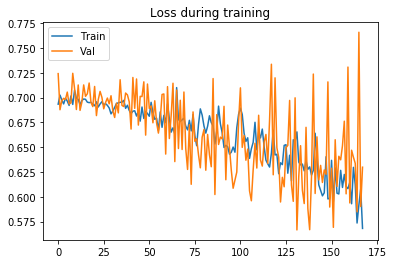

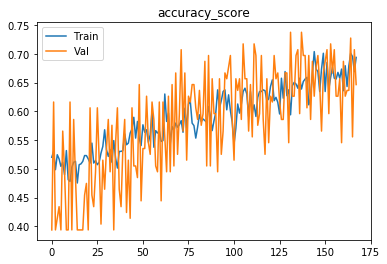

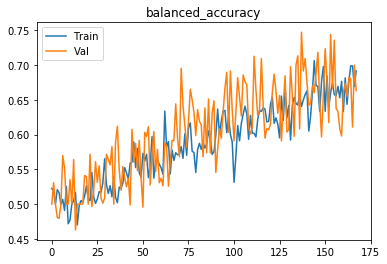

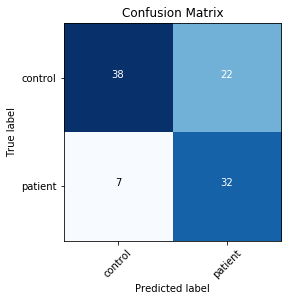

Finished outer fold.
{'final_acc': 0.6961538461538461, 'best_acc': 0.7685897435897435, 'final_iter': 180, 'best_iter': 95, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 3}
###### Starting outer fold 9
# of patients 403, # of healthy controls 398
689
112
(689, 96, 114, 96)
(112, 96, 114, 96)
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69606
[0,     4] loss: 0.69658
Time elapsed: 0h:0m:9s
train accuracy_score: 50.36 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696954
[1,     2] loss: 0.69546
[1,     4] loss: 0.69123
Time elapsed: 0h:0m:21s
train accuracy_score: 49.06 %
train balanced_accuracy: 49.09 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695436
[2,     2] loss: 0.69284
[2,     4] loss: 0.69219
Time elapsed: 0h:0m:32s
train accuracy_sco

[36,     2] loss: 0.67934
[36,     4] loss: 0.68167
Time elapsed: 0h:7m:11s
train accuracy_score: 55.44 %
train balanced_accuracy: 54.75 %
val accuracy_score: 55.36 %
val balanced_accuracy: 54.36 %
Val loss: 0.681039
[37,     2] loss: 0.68164
[37,     4] loss: 0.68621
Time elapsed: 0h:7m:23s
train accuracy_score: 56.60 %
train balanced_accuracy: 56.76 %
val accuracy_score: 54.46 %
val balanced_accuracy: 56.59 %
Val loss: 0.688013
[38,     2] loss: 0.67965
[38,     4] loss: 0.69296
Time elapsed: 0h:7m:35s
train accuracy_score: 54.28 %
train balanced_accuracy: 53.83 %
val accuracy_score: 60.71 %
val balanced_accuracy: 59.92 %
Val loss: 0.670224
[39,     2] loss: 0.67144
[39,     4] loss: 0.66969
Time elapsed: 0h:7m:46s
train accuracy_score: 58.64 %
train balanced_accuracy: 58.44 %
val accuracy_score: 50.00 %
val balanced_accuracy: 48.31 %
Val loss: 0.706259
[40,     2] loss: 0.67319
[40,     4] loss: 0.69913
Time elapsed: 0h:7m:58s
train accuracy_score: 56.02 %
train balanced_accuracy: 5

[74,     2] loss: 0.67309
[74,     4] loss: 0.65899
Time elapsed: 0h:14m:39s
train accuracy_score: 60.96 %
train balanced_accuracy: 61.37 %
val accuracy_score: 59.82 %
val balanced_accuracy: 60.54 %
Val loss: 0.679270
[75,     2] loss: 0.63300
[75,     4] loss: 0.66828
Time elapsed: 0h:14m:50s
train accuracy_score: 63.13 %
train balanced_accuracy: 62.71 %
val accuracy_score: 67.86 %
val balanced_accuracy: 66.47 %
Val loss: 0.634365
[76,     2] loss: 0.64001
[76,     4] loss: 0.64625
Time elapsed: 0h:15m:2s
train accuracy_score: 64.15 %
train balanced_accuracy: 64.28 %
val accuracy_score: 66.96 %
val balanced_accuracy: 66.46 %
Val loss: 0.625409
[77,     2] loss: 0.63828
[77,     4] loss: 0.63456
Time elapsed: 0h:15m:13s
train accuracy_score: 64.01 %
train balanced_accuracy: 64.13 %
val accuracy_score: 60.71 %
val balanced_accuracy: 61.52 %
Val loss: 0.663106
[78,     2] loss: 0.65448
[78,     4] loss: 0.65811
Time elapsed: 0h:15m:25s
train accuracy_score: 62.12 %
train balanced_accurac

val accuracy_score: 57.14 %
val balanced_accuracy: 58.24 %
Val loss: 0.669549
[112,     2] loss: 0.62498
[112,     4] loss: 0.60105
Time elapsed: 0h:22m:0s
train accuracy_score: 64.73 %
train balanced_accuracy: 64.71 %
val accuracy_score: 66.07 %
val balanced_accuracy: 64.67 %
Val loss: 0.641078
[113,     2] loss: 0.61095
[113,     4] loss: 0.64611
Time elapsed: 0h:22m:12s
train accuracy_score: 64.30 %
train balanced_accuracy: 64.23 %
val accuracy_score: 61.61 %
val balanced_accuracy: 62.02 %
Val loss: 0.649359
[114,     2] loss: 0.60916
[114,     4] loss: 0.61942
Time elapsed: 0h:22m:23s
train accuracy_score: 66.91 %
train balanced_accuracy: 66.77 %
val accuracy_score: 65.18 %
val balanced_accuracy: 62.41 %
Val loss: 0.643677
[115,     2] loss: 0.61543
[115,     4] loss: 0.67313
Time elapsed: 0h:22m:35s
train accuracy_score: 62.84 %
train balanced_accuracy: 63.14 %
val accuracy_score: 55.36 %
val balanced_accuracy: 57.89 %
Val loss: 0.721944
[116,     2] loss: 0.68515
[116,     4] los

[149,     2] loss: 0.59754
[149,     4] loss: 0.59912
Time elapsed: 0h:29m:4s
train accuracy_score: 70.10 %
train balanced_accuracy: 70.24 %
val accuracy_score: 61.61 %
val balanced_accuracy: 61.86 %
Val loss: 0.665262
[150,     2] loss: 0.56116
[150,     4] loss: 0.61119
Time elapsed: 0h:29m:15s
train accuracy_score: 69.23 %
train balanced_accuracy: 69.27 %
val accuracy_score: 70.54 %
val balanced_accuracy: 69.90 %
Val loss: 0.603377
[151,     2] loss: 0.55111
[151,     4] loss: 0.63493
Time elapsed: 0h:29m:27s
train accuracy_score: 68.36 %
train balanced_accuracy: 68.13 %
val accuracy_score: 60.71 %
val balanced_accuracy: 58.95 %
Val loss: 0.653941
[152,     2] loss: 0.58303
[152,     4] loss: 0.56406
Time elapsed: 0h:29m:37s
train accuracy_score: 69.67 %
train balanced_accuracy: 69.84 %
val accuracy_score: 59.82 %
val balanced_accuracy: 60.38 %
Val loss: 0.675283
[153,     2] loss: 0.60833
[153,     4] loss: 0.56063
Time elapsed: 0h:29m:48s
train accuracy_score: 69.09 %
train balanc

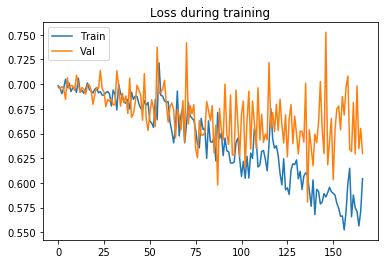

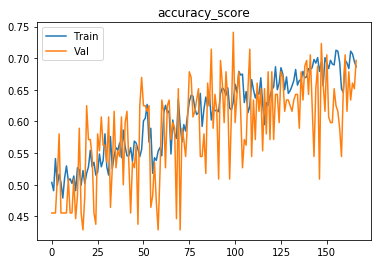

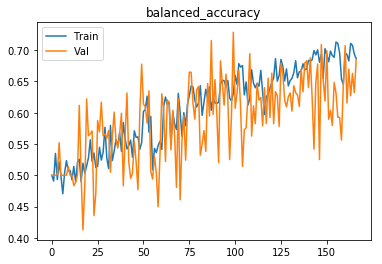

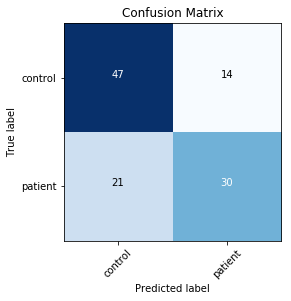

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69762
[0,     4] loss: 0.71479
Time elapsed: 0h:0m:8s
train accuracy_score: 49.49 %
train balanced_accuracy: 49.25 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694958
[1,     2] loss: 0.70082
[1,     4] loss: 0.69805
Time elapsed: 0h:0m:19s
train accuracy_score: 49.64 %
train balanced_accuracy: 48.83 %
val accuracy_score: 46.43 %
val balanced_accuracy: 49.37 %
Val loss: 0.696533
[2,     2] loss: 0.69401
[2,     4] loss: 0.69252
Time elapsed: 0h:0m:31s
train accuracy_score: 49.35 %
train balanced_accuracy: 48.83 %
val accuracy_score: 49.11 %
val balanced_accuracy: 52.48 %
Val loss: 0.693273
[3,     2] loss: 0.68856
[3,     4] loss: 0.69246
Time elapsed: 0h:0m:41s
train accuracy_score: 53.27 %
train balanced_accuracy: 53.55 %
val accuracy_score: 55.36 %
val balanced_accuracy: 53.07 %
Val loss: 0.691646
[4,    

val accuracy_score: 64.29 %
val balanced_accuracy: 63.68 %
Val loss: 0.671623
[38,     2] loss: 0.66629
[38,     4] loss: 0.66538
Time elapsed: 0h:7m:7s
train accuracy_score: 60.52 %
train balanced_accuracy: 60.14 %
val accuracy_score: 58.04 %
val balanced_accuracy: 57.46 %
Val loss: 0.670060
[39,     2] loss: 0.67716
[39,     4] loss: 0.65781
Time elapsed: 0h:7m:18s
train accuracy_score: 58.93 %
train balanced_accuracy: 59.22 %
val accuracy_score: 59.82 %
val balanced_accuracy: 60.54 %
Val loss: 0.660938
[40,     2] loss: 0.66100
[40,     4] loss: 0.67403
Time elapsed: 0h:7m:28s
train accuracy_score: 57.76 %
train balanced_accuracy: 57.68 %
val accuracy_score: 64.29 %
val balanced_accuracy: 61.75 %
Val loss: 0.657847
[41,     2] loss: 0.67584
[41,     4] loss: 0.64973
Time elapsed: 0h:7m:39s
train accuracy_score: 58.93 %
train balanced_accuracy: 58.88 %
val accuracy_score: 60.71 %
val balanced_accuracy: 58.47 %
Val loss: 0.673031
[42,     2] loss: 0.66643
[42,     4] loss: 0.67329
Tim

val accuracy_score: 63.39 %
val balanced_accuracy: 62.54 %
Val loss: 0.640126
[76,     2] loss: 0.63288
[76,     4] loss: 0.62363
Time elapsed: 0h:13m:57s
train accuracy_score: 63.86 %
train balanced_accuracy: 64.00 %
val accuracy_score: 56.25 %
val balanced_accuracy: 57.43 %
Val loss: 0.698862
[77,     2] loss: 0.62790
[77,     4] loss: 0.63235
Time elapsed: 0h:14m:8s
train accuracy_score: 63.28 %
train balanced_accuracy: 63.26 %
val accuracy_score: 66.96 %
val balanced_accuracy: 64.69 %
Val loss: 0.641641
[78,     2] loss: 0.63286
[78,     4] loss: 0.59657
Time elapsed: 0h:14m:19s
train accuracy_score: 68.07 %
train balanced_accuracy: 67.97 %
val accuracy_score: 63.39 %
val balanced_accuracy: 63.02 %
Val loss: 0.658309
[79,     2] loss: 0.62031
[79,     4] loss: 0.64117
Time elapsed: 0h:14m:30s
train accuracy_score: 66.33 %
train balanced_accuracy: 66.44 %
val accuracy_score: 67.86 %
val balanced_accuracy: 68.24 %
Val loss: 0.615486
[80,     2] loss: 0.63809
[80,     4] loss: 0.60667

Time elapsed: 0h:20m:47s
train accuracy_score: 68.36 %
train balanced_accuracy: 68.71 %
val accuracy_score: 45.54 %
val balanced_accuracy: 47.27 %
Val loss: 0.743367
[114,     2] loss: 0.58735
[114,     4] loss: 0.59825
Time elapsed: 0h:20m:59s
train accuracy_score: 68.65 %
train balanced_accuracy: 68.52 %
val accuracy_score: 60.71 %
val balanced_accuracy: 58.31 %
Val loss: 0.688935
[115,     2] loss: 0.60179
[115,     4] loss: 0.60697
Time elapsed: 0h:21m:10s
train accuracy_score: 67.20 %
train balanced_accuracy: 67.30 %
val accuracy_score: 60.71 %
val balanced_accuracy: 62.33 %
Val loss: 0.697864
[116,     2] loss: 0.64142
[116,     4] loss: 0.58908
Time elapsed: 0h:21m:22s
train accuracy_score: 66.76 %
train balanced_accuracy: 66.53 %
val accuracy_score: 62.50 %
val balanced_accuracy: 60.11 %
Val loss: 0.672761
[117,     2] loss: 0.60465
[117,     4] loss: 0.60439
Time elapsed: 0h:21m:33s
train accuracy_score: 67.63 %
train balanced_accuracy: 67.75 %
val accuracy_score: 58.04 %
val 

val accuracy_score: 68.75 %
val balanced_accuracy: 67.94 %
Val loss: 0.601639
[151,     2] loss: 0.55053
[151,     4] loss: 0.54231
Time elapsed: 0h:28m:2s
train accuracy_score: 72.28 %
train balanced_accuracy: 72.31 %
val accuracy_score: 62.50 %
val balanced_accuracy: 63.00 %
Val loss: 0.656347
[152,     2] loss: 0.56687
[152,     4] loss: 0.54925
Time elapsed: 0h:28m:13s
train accuracy_score: 70.54 %
train balanced_accuracy: 70.61 %
val accuracy_score: 62.50 %
val balanced_accuracy: 62.52 %
Val loss: 0.721209
[153,     2] loss: 0.57791
[153,     4] loss: 0.52088
Time elapsed: 0h:28m:25s
train accuracy_score: 74.17 %
train balanced_accuracy: 74.10 %
val accuracy_score: 65.18 %
val balanced_accuracy: 63.69 %
Val loss: 0.634087
[154,     2] loss: 0.59512
[154,     4] loss: 0.54892
Time elapsed: 0h:28m:36s
train accuracy_score: 68.51 %
train balanced_accuracy: 68.54 %
val accuracy_score: 65.18 %
val balanced_accuracy: 64.82 %
Val loss: 0.661273
[155,     2] loss: 0.57995
[155,     4] los

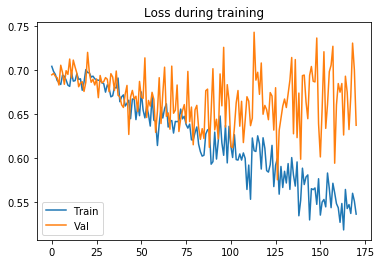

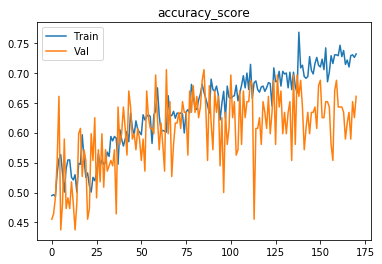

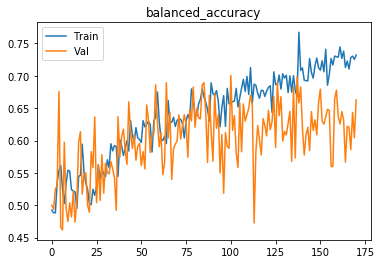

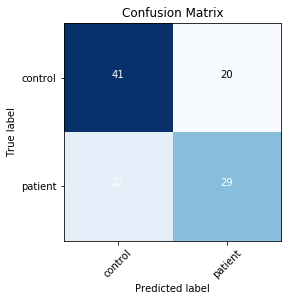

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69351
[0,     4] loss: 0.70214
Time elapsed: 0h:0m:9s
train accuracy_score: 48.91 %
train balanced_accuracy: 48.72 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699145
[1,     2] loss: 0.69537
[1,     4] loss: 0.69864
Time elapsed: 0h:0m:21s
train accuracy_score: 49.78 %
train balanced_accuracy: 49.68 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698423
[2,     2] loss: 0.69254
[2,     4] loss: 0.69814
Time elapsed: 0h:0m:33s
train accuracy_score: 49.64 %
train balanced_accuracy: 48.76 %
val accuracy_score: 48.21 %
val balanced_accuracy: 46.19 %
Val loss: 0.693463
[3,     2] loss: 0.69432
[3,     4] loss: 0.69783
Time elapsed: 0h:0m:45s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.61 %
val accuracy_score: 51.79 %
val balanced_accuracy: 54.77 %
Val loss: 0.691775
[4,    

val accuracy_score: 60.71 %
val balanced_accuracy: 60.88 %
Val loss: 0.683315
[38,     2] loss: 0.67209
[38,     4] loss: 0.66014
Time elapsed: 0h:7m:38s
train accuracy_score: 59.51 %
train balanced_accuracy: 59.24 %
val accuracy_score: 54.46 %
val balanced_accuracy: 50.32 %
Val loss: 0.697421
[39,     2] loss: 0.67314
[39,     4] loss: 0.70155
Time elapsed: 0h:7m:50s
train accuracy_score: 56.60 %
train balanced_accuracy: 56.49 %
val accuracy_score: 51.79 %
val balanced_accuracy: 54.13 %
Val loss: 0.701522
[40,     2] loss: 0.65270
[40,     4] loss: 0.66987
Time elapsed: 0h:8m:2s
train accuracy_score: 59.80 %
train balanced_accuracy: 59.79 %
val accuracy_score: 55.36 %
val balanced_accuracy: 53.39 %
Val loss: 0.676777
[41,     2] loss: 0.66571
[41,     4] loss: 0.68381
Time elapsed: 0h:8m:15s
train accuracy_score: 57.62 %
train balanced_accuracy: 57.13 %
val accuracy_score: 53.57 %
val balanced_accuracy: 54.97 %
Val loss: 0.669300
[42,     2] loss: 0.65928
[42,     4] loss: 0.69015
Tim

val accuracy_score: 53.57 %
val balanced_accuracy: 52.88 %
Val loss: 0.673247
[76,     2] loss: 0.64163
[76,     4] loss: 0.63314
Time elapsed: 0h:15m:6s
train accuracy_score: 62.70 %
train balanced_accuracy: 62.29 %
val accuracy_score: 61.61 %
val balanced_accuracy: 61.70 %
Val loss: 0.664672
[77,     2] loss: 0.62544
[77,     4] loss: 0.65848
Time elapsed: 0h:15m:17s
train accuracy_score: 62.12 %
train balanced_accuracy: 62.38 %
val accuracy_score: 62.50 %
val balanced_accuracy: 61.40 %
Val loss: 0.668261
[78,     2] loss: 0.64627
[78,     4] loss: 0.57879
Time elapsed: 0h:15m:29s
train accuracy_score: 67.49 %
train balanced_accuracy: 67.30 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.38 %
Val loss: 0.648728
[79,     2] loss: 0.61374
[79,     4] loss: 0.61073
Time elapsed: 0h:15m:41s
train accuracy_score: 67.78 %
train balanced_accuracy: 67.92 %
val accuracy_score: 59.82 %
val balanced_accuracy: 60.54 %
Val loss: 0.698606
[80,     2] loss: 0.62176
[80,     4] loss: 0.58529

Time elapsed: 0h:22m:16s
train accuracy_score: 69.81 %
train balanced_accuracy: 69.84 %
val accuracy_score: 58.04 %
val balanced_accuracy: 58.26 %
Val loss: 0.660154
[114,     2] loss: 0.54270
[114,     4] loss: 0.59399
Time elapsed: 0h:22m:28s
train accuracy_score: 71.55 %
train balanced_accuracy: 71.43 %
val accuracy_score: 60.71 %
val balanced_accuracy: 59.76 %
Val loss: 0.670128
[115,     2] loss: 0.56486
[115,     4] loss: 0.58053
Time elapsed: 0h:22m:39s
train accuracy_score: 71.55 %
train balanced_accuracy: 71.40 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.05 %
Val loss: 0.673051
[116,     2] loss: 0.53319
[116,     4] loss: 0.55926
Time elapsed: 0h:22m:51s
train accuracy_score: 70.54 %
train balanced_accuracy: 70.51 %
val accuracy_score: 60.71 %
val balanced_accuracy: 60.08 %
Val loss: 0.688177
[117,     2] loss: 0.55571
[117,     4] loss: 0.57077
Time elapsed: 0h:23m:3s
train accuracy_score: 71.70 %
train balanced_accuracy: 71.76 %
val accuracy_score: 60.71 %
val b

val accuracy_score: 64.29 %
val balanced_accuracy: 63.52 %
Val loss: 0.693149
[151,     2] loss: 0.54832
[151,     4] loss: 0.58800
Time elapsed: 0h:29m:41s
train accuracy_score: 72.57 %
train balanced_accuracy: 72.49 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.86 %
Val loss: 0.688797
[152,     2] loss: 0.55242
[152,     4] loss: 0.56113
Time elapsed: 0h:29m:54s
train accuracy_score: 71.55 %
train balanced_accuracy: 71.54 %
val accuracy_score: 58.04 %
val balanced_accuracy: 56.65 %
Val loss: 0.669990
[153,     2] loss: 0.51944
[153,     4] loss: 0.51364
Time elapsed: 0h:30m:5s
train accuracy_score: 73.44 %
train balanced_accuracy: 73.53 %
val accuracy_score: 58.93 %
val balanced_accuracy: 59.08 %
Val loss: 0.707004
[154,     2] loss: 0.51438
[154,     4] loss: 0.55625
Time elapsed: 0h:30m:17s
train accuracy_score: 74.02 %
train balanced_accuracy: 73.88 %
val accuracy_score: 59.82 %
val balanced_accuracy: 57.97 %
Val loss: 0.742809
[155,     2] loss: 0.53480
[155,     4] los

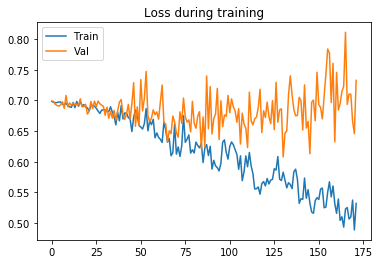

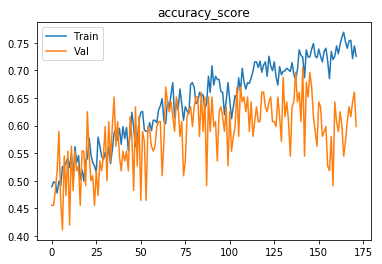

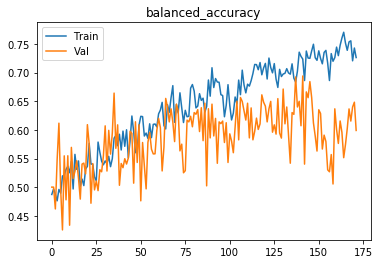

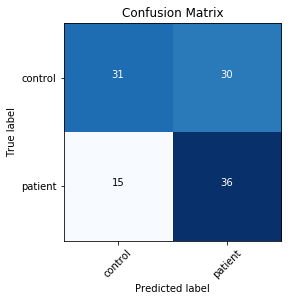

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69638
[0,     4] loss: 0.69341
Time elapsed: 0h:0m:9s
train accuracy_score: 50.80 %
train balanced_accuracy: 50.67 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.709061
[1,     2] loss: 0.69864
[1,     4] loss: 0.69331
Time elapsed: 0h:0m:21s
train accuracy_score: 49.20 %
train balanced_accuracy: 48.32 %
val accuracy_score: 48.21 %
val balanced_accuracy: 45.87 %
Val loss: 0.694354
[2,     2] loss: 0.69295
[2,     4] loss: 0.69559
Time elapsed: 0h:0m:33s
train accuracy_score: 50.22 %
train balanced_accuracy: 50.16 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705079
[3,     2] loss: 0.69229
[3,     4] loss: 0.69428
Time elapsed: 0h:0m:45s
train accuracy_score: 51.67 %
train balanced_accuracy: 50.78 %
val accuracy_score: 50.89 %
val balanced_accuracy: 50.42 %
Val loss: 0.693287
[4,    

val accuracy_score: 61.61 %
val balanced_accuracy: 59.13 %
Val loss: 0.675925
[38,     2] loss: 0.64676
[38,     4] loss: 0.62963
Time elapsed: 0h:7m:51s
train accuracy_score: 62.26 %
train balanced_accuracy: 62.30 %
val accuracy_score: 48.21 %
val balanced_accuracy: 50.69 %
Val loss: 0.712507
[39,     2] loss: 0.65167
[39,     4] loss: 0.69351
Time elapsed: 0h:8m:3s
train accuracy_score: 61.54 %
train balanced_accuracy: 61.48 %
val accuracy_score: 51.79 %
val balanced_accuracy: 54.29 %
Val loss: 0.705884
[40,     2] loss: 0.67696
[40,     4] loss: 0.66947
Time elapsed: 0h:8m:15s
train accuracy_score: 57.62 %
train balanced_accuracy: 57.07 %
val accuracy_score: 57.14 %
val balanced_accuracy: 53.10 %
Val loss: 0.705139
[41,     2] loss: 0.69978
[41,     4] loss: 0.69232
Time elapsed: 0h:8m:28s
train accuracy_score: 55.59 %
train balanced_accuracy: 56.07 %
val accuracy_score: 49.11 %
val balanced_accuracy: 51.19 %
Val loss: 0.696304
[42,     2] loss: 0.69540
[42,     4] loss: 0.64562
Tim

val accuracy_score: 60.71 %
val balanced_accuracy: 59.59 %
Val loss: 0.630419
[76,     2] loss: 0.64496
[76,     4] loss: 0.64099
Time elapsed: 0h:15m:12s
train accuracy_score: 63.57 %
train balanced_accuracy: 63.69 %
val accuracy_score: 55.36 %
val balanced_accuracy: 57.09 %
Val loss: 0.689231
[77,     2] loss: 0.63295
[77,     4] loss: 0.61587
Time elapsed: 0h:15m:24s
train accuracy_score: 64.88 %
train balanced_accuracy: 64.82 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.54 %
Val loss: 0.655867
[78,     2] loss: 0.63908
[78,     4] loss: 0.61835
Time elapsed: 0h:15m:36s
train accuracy_score: 62.55 %
train balanced_accuracy: 62.46 %
val accuracy_score: 65.18 %
val balanced_accuracy: 62.89 %
Val loss: 0.614483
[79,     2] loss: 0.60428
[79,     4] loss: 0.64007
Time elapsed: 0h:15m:48s
train accuracy_score: 64.88 %
train balanced_accuracy: 64.77 %
val accuracy_score: 64.29 %
val balanced_accuracy: 61.43 %
Val loss: 0.627157
[80,     2] loss: 0.63936
[80,     4] loss: 0.6786

Time elapsed: 0h:22m:22s
train accuracy_score: 68.80 %
train balanced_accuracy: 68.82 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.38 %
Val loss: 0.638077
[114,     2] loss: 0.57835
[114,     4] loss: 0.60952
Time elapsed: 0h:22m:34s
train accuracy_score: 68.80 %
train balanced_accuracy: 68.87 %
val accuracy_score: 62.50 %
val balanced_accuracy: 62.52 %
Val loss: 0.676692
[115,     2] loss: 0.58233
[115,     4] loss: 0.58293
Time elapsed: 0h:22m:45s
train accuracy_score: 69.09 %
train balanced_accuracy: 69.08 %
val accuracy_score: 66.07 %
val balanced_accuracy: 65.16 %
Val loss: 0.632710
[116,     2] loss: 0.59827
[116,     4] loss: 0.57615
Time elapsed: 0h:22m:57s
train accuracy_score: 69.09 %
train balanced_accuracy: 69.19 %
val accuracy_score: 56.25 %
val balanced_accuracy: 57.59 %
Val loss: 0.706411
[117,     2] loss: 0.61430
[117,     4] loss: 0.57822
Time elapsed: 0h:23m:8s
train accuracy_score: 67.78 %
train balanced_accuracy: 67.76 %
val accuracy_score: 65.18 %
val b

val accuracy_score: 61.61 %
val balanced_accuracy: 59.93 %
Val loss: 0.723189
[151,     2] loss: 0.60647
[151,     4] loss: 0.67591
Time elapsed: 0h:29m:43s
train accuracy_score: 66.18 %
train balanced_accuracy: 66.61 %
val accuracy_score: 60.71 %
val balanced_accuracy: 63.29 %
Val loss: 0.758584
[152,     2] loss: 0.67356
[152,     4] loss: 0.59689
Time elapsed: 0h:29m:54s
train accuracy_score: 62.41 %
train balanced_accuracy: 62.15 %
val accuracy_score: 63.39 %
val balanced_accuracy: 61.73 %
Val loss: 0.706581
[153,     2] loss: 0.59062
[153,     4] loss: 0.59627
Time elapsed: 0h:30m:6s
train accuracy_score: 70.68 %
train balanced_accuracy: 70.78 %
val accuracy_score: 52.68 %
val balanced_accuracy: 54.15 %
Val loss: 0.711718
[154,     2] loss: 0.57750
[154,     4] loss: 0.57243
Time elapsed: 0h:30m:17s
train accuracy_score: 70.54 %
train balanced_accuracy: 70.25 %
val accuracy_score: 60.71 %
val balanced_accuracy: 59.43 %
Val loss: 0.662073
[155,     2] loss: 0.57494
[155,     4] los

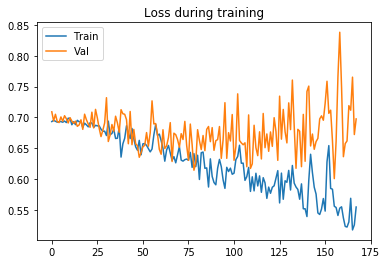

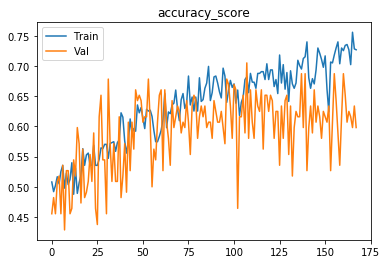

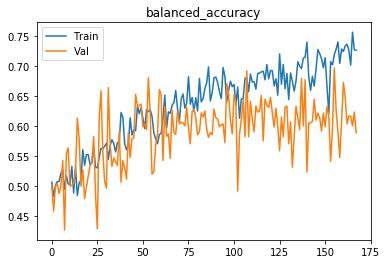

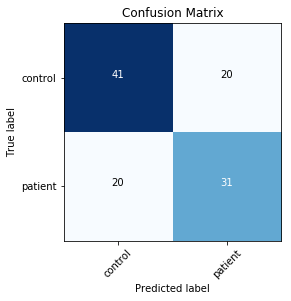

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}
Trainable model parameters: 116001
[0,     2] loss: 0.69829
[0,     4] loss: 0.68894
Time elapsed: 0h:0m:9s
train accuracy_score: 52.69 %
train balanced_accuracy: 52.33 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705035
[1,     2] loss: 0.68987
[1,     4] loss: 0.69867
Time elapsed: 0h:0m:20s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.35 %
val accuracy_score: 55.36 %
val balanced_accuracy: 51.78 %
Val loss: 0.690732
[2,     2] loss: 0.69291
[2,     4] loss: 0.69303
Time elapsed: 0h:0m:33s
train accuracy_score: 50.94 %
train balanced_accuracy: 51.09 %
val accuracy_score: 45.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.710268
[3,     2] loss: 0.70313
[3,     4] loss: 0.69418
Time elapsed: 0h:0m:45s
train accuracy_score: 51.09 %
train balanced_accuracy: 50.66 %
val accuracy_score: 58.04 %
val balanced_accuracy: 56.17 %
Val loss: 0.686788
[4,    

val accuracy_score: 55.36 %
val balanced_accuracy: 56.93 %
Val loss: 0.683080
[38,     2] loss: 0.67631
[38,     4] loss: 0.66757
Time elapsed: 0h:7m:34s
train accuracy_score: 58.78 %
train balanced_accuracy: 58.17 %
val accuracy_score: 58.04 %
val balanced_accuracy: 54.89 %
Val loss: 0.671969
[39,     2] loss: 0.67691
[39,     4] loss: 0.64292
Time elapsed: 0h:7m:46s
train accuracy_score: 59.22 %
train balanced_accuracy: 59.48 %
val accuracy_score: 56.25 %
val balanced_accuracy: 57.43 %
Val loss: 0.673438
[40,     2] loss: 0.66074
[40,     4] loss: 0.62273
Time elapsed: 0h:7m:58s
train accuracy_score: 62.70 %
train balanced_accuracy: 62.68 %
val accuracy_score: 54.46 %
val balanced_accuracy: 57.55 %
Val loss: 0.703306
[41,     2] loss: 0.68278
[41,     4] loss: 0.65436
Time elapsed: 0h:8m:10s
train accuracy_score: 59.51 %
train balanced_accuracy: 59.33 %
val accuracy_score: 58.93 %
val balanced_accuracy: 56.99 %
Val loss: 0.670880
[42,     2] loss: 0.68406
[42,     4] loss: 0.70620
Ti

val accuracy_score: 52.68 %
val balanced_accuracy: 49.49 %
Val loss: 0.723363
[76,     2] loss: 0.66880
[76,     4] loss: 0.63576
Time elapsed: 0h:15m:5s
train accuracy_score: 61.25 %
train balanced_accuracy: 61.68 %
val accuracy_score: 58.04 %
val balanced_accuracy: 59.39 %
Val loss: 0.683833
[77,     2] loss: 0.65411
[77,     4] loss: 0.61572
Time elapsed: 0h:15m:18s
train accuracy_score: 62.84 %
train balanced_accuracy: 62.55 %
val accuracy_score: 65.18 %
val balanced_accuracy: 64.82 %
Val loss: 0.635997
[78,     2] loss: 0.63055
[78,     4] loss: 0.58763
Time elapsed: 0h:15m:29s
train accuracy_score: 68.07 %
train balanced_accuracy: 68.03 %
val accuracy_score: 62.50 %
val balanced_accuracy: 62.36 %
Val loss: 0.656410
[79,     2] loss: 0.60022
[79,     4] loss: 0.63534
Time elapsed: 0h:15m:40s
train accuracy_score: 65.60 %
train balanced_accuracy: 65.64 %
val accuracy_score: 58.93 %
val balanced_accuracy: 58.28 %
Val loss: 0.663289
[80,     2] loss: 0.57940
[80,     4] loss: 0.61797

Time elapsed: 0h:22m:21s
train accuracy_score: 66.62 %
train balanced_accuracy: 66.31 %
val accuracy_score: 69.64 %
val balanced_accuracy: 67.15 %
Val loss: 0.651063
[114,     2] loss: 0.59033
[114,     4] loss: 0.61315
Time elapsed: 0h:22m:33s
train accuracy_score: 65.75 %
train balanced_accuracy: 65.73 %
val accuracy_score: 66.07 %
val balanced_accuracy: 66.44 %
Val loss: 0.627774
[115,     2] loss: 0.59505
[115,     4] loss: 0.63763
Time elapsed: 0h:22m:45s
train accuracy_score: 68.51 %
train balanced_accuracy: 68.80 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.38 %
Val loss: 0.661219
[116,     2] loss: 0.59988
[116,     4] loss: 0.55453
Time elapsed: 0h:22m:57s
train accuracy_score: 71.55 %
train balanced_accuracy: 71.44 %
val accuracy_score: 64.29 %
val balanced_accuracy: 64.00 %
Val loss: 0.653421
[117,     2] loss: 0.59486
[117,     4] loss: 0.56800
Time elapsed: 0h:23m:9s
train accuracy_score: 67.92 %
train balanced_accuracy: 67.89 %
val accuracy_score: 63.39 %
val b

val accuracy_score: 65.18 %
val balanced_accuracy: 64.50 %
Val loss: 0.655305
[151,     2] loss: 0.54861
[151,     4] loss: 0.52810
Time elapsed: 0h:29m:31s
train accuracy_score: 73.29 %
train balanced_accuracy: 73.29 %
val accuracy_score: 61.61 %
val balanced_accuracy: 62.18 %
Val loss: 0.679984
[152,     2] loss: 0.51877
[152,     4] loss: 0.55206
Time elapsed: 0h:29m:43s
train accuracy_score: 73.15 %
train balanced_accuracy: 73.05 %
val accuracy_score: 59.82 %
val balanced_accuracy: 58.45 %
Val loss: 0.729183
[153,     2] loss: 0.53441
[153,     4] loss: 0.51965
Time elapsed: 0h:29m:54s
train accuracy_score: 73.73 %
train balanced_accuracy: 73.71 %
val accuracy_score: 63.39 %
val balanced_accuracy: 62.38 %
Val loss: 0.725757
[154,     2] loss: 0.55851
[154,     4] loss: 0.55958
Time elapsed: 0h:30m:5s
train accuracy_score: 74.75 %
train balanced_accuracy: 74.75 %
val accuracy_score: 61.61 %
val balanced_accuracy: 61.06 %
Val loss: 0.700599
[155,     2] loss: 0.54477
[155,     4] los

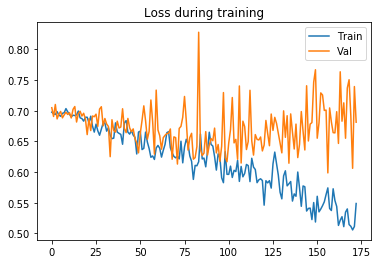

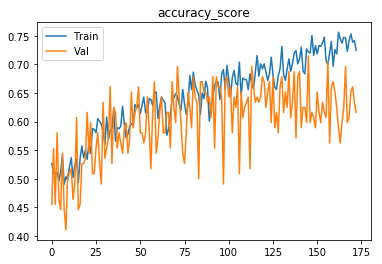

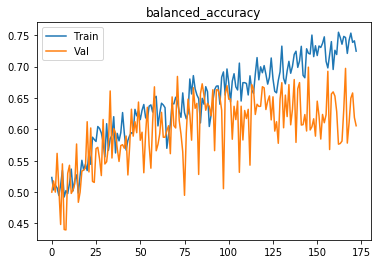

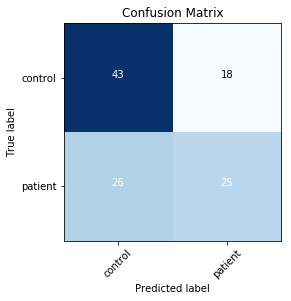

Finished outer fold.
{'final_acc': 0.6843458694953392, 'best_acc': 0.7070073931211829, 'final_iter': 167, 'best_iter': 100, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}
################################
################################
All accuracies: [0.6958128078817734, 0.7098874032371569, 0.7058409570724842, 0.7067206192821957, 0.6885995777621393, 0.7079545454545455, 0.6897727272727272, 0.6636363636363636, 0.6977272727272728, 0.75, 0.5737154150197629, 0.5934782608695652, 0.5624505928853755, 0.5314229249011857, 0.5754940711462451, 0.712280701754386, 0.6171052631578948, 0.6557017543859649, 0.6337719298245614, 0.6114035087719298, 0.6022769690182904, 0.633631952220978, 0.6424038820455393, 0.6636804777902202, 0.6500559910414334, 0.7461348175633891, 0.7128942486085343, 0.6700680272108843, 0.5898268398268398, 0.7461348175633891, 0.6982142857142857, 0.702579365079365, 0.7107142857142856, 0.7355158730158731, 0.6914682539682538, 0.651556

In [19]:
fold_metric, models = run(net=None, data=None,
                  k_folds=-1,
                  callbacks=None,
                  shape=-1,
                  masked=False,
                  metrics=metrics,
                  num_epochs=num_epochs,
                  retain_metric=retain_metric,
                  augmentations=augmentations,
                  b=None
                 )

print(np.mean(fold_metric))
print(np.std(fold_metric))

In [20]:
5/0

ZeroDivisionError: division by zero

In [36]:
training_res = [{'final_acc': 0.6885995777621393, 'best_acc': 0.775686136523575, 'final_iter': 184, 'best_iter': 131, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 4}, {'final_acc': 0.7079545454545455, 'best_acc': 0.7306818181818182, 'final_iter': 165, 'best_iter': 118, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.5934782608695652, 'best_acc': 0.6604743083003951, 'final_iter': 167, 'best_iter': 69, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}, {'final_acc': 0.712280701754386, 'best_acc': 0.7359649122807017, 'final_iter': 167, 'best_iter': 63, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.6500559910414334, 'best_acc': 0.7388951101157148, 'final_iter': 169, 'best_iter': 130, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 4}, {'final_acc': 0.7461348175633891, 'best_acc': 0.7534013605442177, 'final_iter': 168, 'best_iter': 108, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.6982142857142857, 'best_acc': 0.7571428571428571, 'final_iter': 188, 'best_iter': 115, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 0}, {'final_acc': 0.663003663003663, 'best_acc': 0.6996336996336996, 'final_iter': 187, 'best_iter': 140, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 1}, {'final_acc': 0.6961538461538461, 'best_acc': 0.7685897435897435, 'final_iter': 180, 'best_iter': 95, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 12, 'lr': 0.001}, 'inner_fold_idx': 3}, {'final_acc': 0.6843458694953392, 'best_acc': 0.7070073931211829, 'final_iter': 167, 'best_iter': 100, 'params': {'model': 'ModelLiu', 'batch_size': 128, 'patience': 16, 'lr': 0.001}, 'inner_fold_idx': 0}]

# Start inference

In [37]:
print(len(training_res))
res_df = pd.DataFrame(training_res)

10


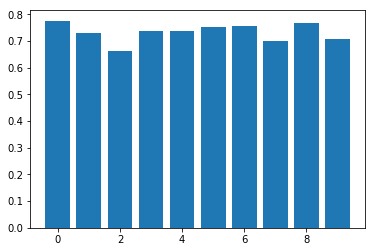

0.7327477339433905
0.6840221558812594


In [38]:
plt.bar(np.arange(len(res_df["best_acc"])), res_df["best_acc"])
plt.show()
print(np.mean(res_df["best_acc"]))
print(np.mean(res_df["final_acc"]))

In [39]:
print(np.mean(res_df["final_iter"]))

174.2


In [40]:
print(res_df["final_iter"])

0    184
1    165
2    167
3    167
4    169
5    168
6    188
7    187
8    180
9    167
Name: final_iter, dtype: int64


In [41]:
from collections import OrderedDict, Counter

### Use majority vote of all patches to select prediction

In [42]:
def majority_vote_patches(img, net, gpu):
    # forward each patch per subject
    patch_preds = []
    avg_score = 0
    for i in range(img.shape[2]):
        patch = img[:,:,i].to(torch.device("cuda:" + str(gpu)))

        patch_output = net.forward(patch)
        patch_score = torch.sigmoid(patch_output)
        patch_pred = patch_score >= 0.5
        patch_preds.append(patch_pred.cpu().numpy().item())
        avg_score += patch_score.cpu().numpy().item()
    # take vote of predictions
    pred = Counter(patch_preds).most_common(1)[0][0]
    avg_score /= img.shape[2]
    return pred, avg_score

In [47]:
metrics = []
random_states = np.arange(20, 30) # important to use the same values as during training
maj_vote = True

for outer_fold, r in enumerate(random_states):
    print("Outer fold {}".format(outer_fold))

    all_scores = []
    all_preds = []
    all_labels = []
    
    train_res = training_res[outer_fold]
    model_dir = os.path.join(output_dir,"outer_{}_inner_{}_cv_fold_{}_BEST_ITERATION.h5".format(outer_fold, train_res["inner_fold_idx"], outer_fold * 5 + train_res["inner_fold_idx"]))
    model_name = train_res["params"]["model"]
    net = pick_model(model_name)
    state_dict = torch.load(model_dir, map_location='cpu')
    new_state_dict = OrderedDict()
    for param in state_dict.items():
        new_state_dict.update([(param[0].replace("module.", ""), param[1])])
    
    net.load_state_dict(new_state_dict)
    net = net.cuda(gpu)
    net.eval()
    
    test_h5 = h5py.File(train_data_path.replace("train", "holdout") + str(r) + ".h5", 'r')

    X_test, y_test = np.array(test_h5['X']), np.array(test_h5['y'])

    # dataset overview
    print("# of patients {}, # of healthy controls {}".format(np.sum(y_test), len(y_test)-np.sum(y_test)))

    print(len(y_test))

    if zero_one_normalize:
        intensity = IntensityRescale(data_min=np.min(X_train), data_max=np.max(X_train)) # use the same min and max for all datasets
        adni_data_test= ADNIDataset(X_test, y_test, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True, all_locs=True)
    else:
        adni_data_test = ADNIDataset(X_test, y_test, transform=None, mask=mask, dtype=dtype, patched=True, all_locs=True)

    test_h5.close()
    
    test_loader = DataLoader(
            adni_data_test, batch_size=1, num_workers=0, shuffle=False)
    
    with torch.no_grad():
        for sample in test_loader:
            img = sample["image"]
            label = sample["label"]
            
            if maj_vote:
                pred, score = majority_vote_patches(img, net, gpu)
            else:
                img = img.to(torch.device("cuda:" + str(gpu)))
                output = net.forward(img)
                score = torch.sigmoid(output)
                pred = score >= 0.5
                score = score.numpy().item()
                pred = pred.numpy().item()
            
            all_scores.append(score)
            all_preds.append(pred)
            all_labels.append(label.numpy().item())
    
    balanced_acc = balanced_accuracy(all_labels, all_preds)
    roc_score = roc_auc_score(all_labels, all_scores)
    sens = sensitivity(all_labels, all_preds)
    spec = specificity(all_labels, all_preds)
    print("Bal. accuracy {:.3f} %".format(balanced_acc*100))
    print("ROC AUC Score {:.3f} %".format(roc_score*100))
    print("Sensitivity {:.3f} %".format(sens*100))
    print("Specificity {:.3f} %".format(spec*100))
    metrics.append([balanced_acc, roc_score, sens, spec])
# reset network to training mode6
net.train()
print("######## Final results ########")
metrics_df = pd.DataFrame(metrics, columns=["Bal Acc", "ROC AUC", "Sensitivity", "Specificity"])
print(metrics_df)
print("Balanced accuracy mean {:.3f} %".format(np.mean(metrics_df["Bal Acc"])*100))
print("ROC AUC mean {:.3f} %".format(np.mean(metrics_df["ROC AUC"])*100))
print("Sensitivity mean {:.3f} %".format(np.mean(metrics_df["Sensitivity"])*100))
print("Specificity mean {:.3f} %".format(np.mean(metrics_df["Specificity"])*100))

Outer fold 0
# of patients 65, # of healthy controls 98
163


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Bal. accuracy 65.471 %
ROC AUC Score 71.570 %
Sensitivity 64.615 %
Specificity 66.327 %
Outer fold 1
# of patients 77, # of healthy controls 99
176
Bal. accuracy 78.644 %
ROC AUC Score 84.586 %
Sensitivity 80.519 %
Specificity 76.768 %
Outer fold 2
# of patients 78, # of healthy controls 100
178
Bal. accuracy 74.756 %
ROC AUC Score 86.551 %
Sensitivity 70.513 %
Specificity 79.000 %
Outer fold 3
# of patients 70, # of healthy controls 93
163
Bal. accuracy 63.733 %
ROC AUC Score 76.206 %
Sensitivity 37.143 %
Specificity 90.323 %
Outer fold 4
# of patients 73, # of healthy controls 96
169
Bal. accuracy 63.192 %
ROC AUC Score 69.392 %
Sensitivity 75.342 %
Specificity 51.042 %
Outer fold 5
# of patients 73, # of healthy controls 97
170
Bal. accuracy 75.823 %
ROC AUC Score 81.867 %
Sensitivity 71.233 %
Specificity 80.412 %
Outer fold 6
# of patients 68, # of healthy controls 90
158
Bal. accuracy 59.771 %
ROC AUC Score 69.886 %
Sensitivity 61.765 %
Specificity 57.778 %
Outer fold 7
# of patie